In [1]:
import numpy as np
import random as rd
import tensorflow as tf

from keras.layers import Dense, Embedding, Flatten, Input, concatenate, BatchNormalization
from keras.models import Model, Sequential
from keras import regularizers
from keras.optimizers import Adagrad

#Import another jupyter notebook
import import_ipynb
from Productive_CrossValidation_inclTest import *
from Productive_Data_GetTrainTest import samEval

C:\Users\twitter\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


importing Jupyter notebook from Productive_CrossValidation_inclTest.ipynb
importing Jupyter notebook from Productive_TimeHistory.ipynb
importing Jupyter notebook from AttentionLayer.ipynb
importing Jupyter notebook from Productive_Data_GetTrainTest.ipynb


In [2]:
#for reproducability of the results
seed = 7
np.random.seed(seed)
tf.set_random_seed(seed)
rd.seed(seed)

In [3]:
path = 'data/'
outputpath ='outputs/04_lNorm_samEval2018/'

In [4]:
#Load necessary data
train_data, train_labels, test_data, test_labels, word_index, MAX_SEQUENCE_LENGTH = samEval()

In [5]:
#Load pretrained embeddings
import gensim
from gensim.models import KeyedVectors

#Pretrained Google News Embeddings, Dimension 300
GOOGLEEMB = path + 'GoogleNews-vectors-negative300.bin'

embedding= KeyedVectors.load_word2vec_format(GOOGLEEMB, binary=True)

word_vectors = embedding.wv

C:\Users\twitter\Anaconda3\lib\site-packages\smart_open\smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  # Remove the CWD from sys.path while we load stuff.


In [6]:
#Create embedding-matrix, serves the Keras Embedding Layer as weigths
EMBEDDING_DIM=300

embedding_matrix = np.zeros((len(word_index)+1, EMBEDDING_DIM))

for word, i in word_index.items():
    try:
        embedding_vector = word_vectors[word]
        embedding_matrix[i] = embedding_vector   
    except:
        # words not found in embeddings will be zero
        pass

In [7]:
#Load POS data
def get_pos(file):
    pos =[]
    with open(file, 'r') as f:
        for line in f:
            pos.append([int(i) for i in line.split(',')])
    pos= np.asarray(pos)
    return pos

train_pos =get_pos('output_trainTestData/SamEval_train_pos.csv')
test_pos = get_pos('output_trainTestData/SamEval_test_pos.csv')

In [8]:
#Load Sentiment data
def get_sentiment(file):
    senti =[]
    with open(file, 'r') as f:
        for line in f:
            senti.append([float(i) for i in line.split(',')])
    senti= np.asarray(senti)
    return senti

train_senti_blob =get_sentiment('output_trainTestData/SamEval_train_data_sentiment_blob.csv')
test_senti_blob = get_sentiment('output_trainTestData/SamEval_test_data_sentiment_blob.csv')

### Hyperparameter for all models

In [9]:
BATCH_SIZE = 64
NUM_EPOCHS = 30
softmax = True
lossfunction ='binary_crossentropy'
optimizer = Adagrad(lr=0.001)

Instructions for updating:
Colocations handled automatically by placer.


# L1 for embedding layer

### weigth decay = 0,001

In [10]:
#Word Embeddings
wv_layer = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer=regularizers.l1(0.001))

input_embedding = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences = wv_layer(input_embedding)
x_embedding = Dense(600, activation='relu')(embedded_sequences)
x_embedding = Flatten()(x_embedding)

#Sentiment Features
input_sentiment = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment = Dense(600, activation='relu')(input_sentiment)

#POS Features
input_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos = Dense(600, activation='relu')(input_pos)

#Concatination
concat = concatenate([x_embedding, x_sentiment, x_pos])

preds = Dense(2, activation='softmax')(concat)

model = Model(inputs=[input_embedding, input_sentiment, input_pos], outputs=preds)


-----Fold 1--------


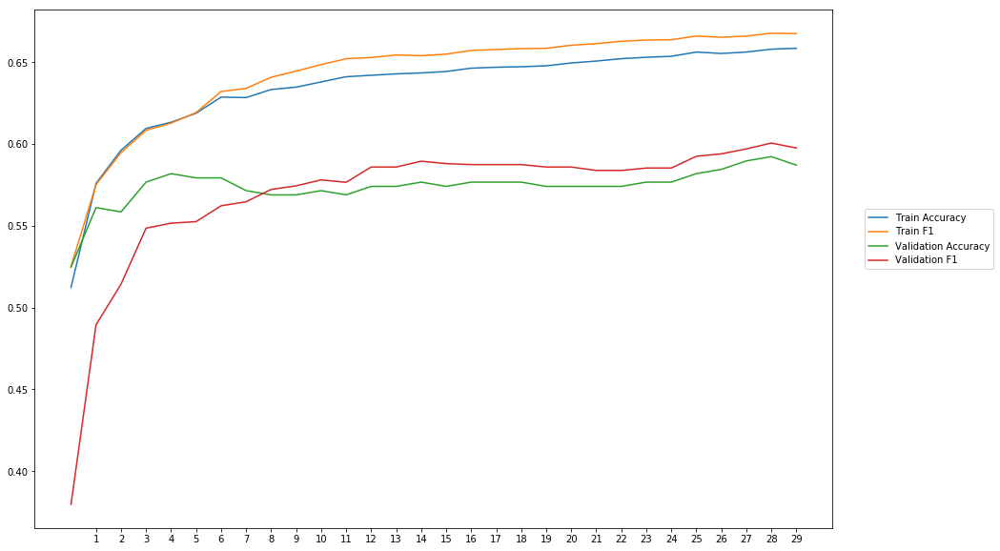

Average Accuracy: 57.41%
Average Precision: 57.34%
Average Recall: 56.91%
Average F1: 56.89%

-----Fold 2--------


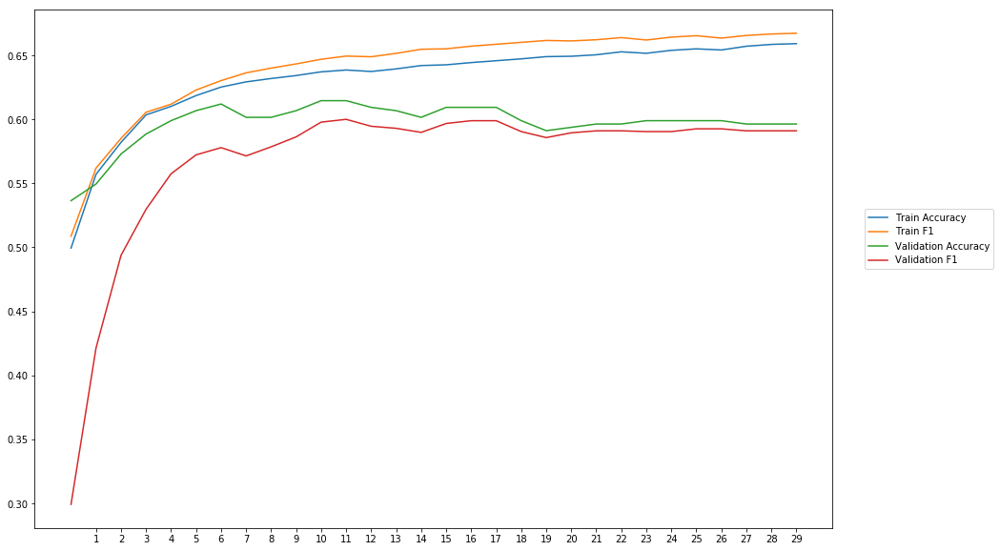

Average Accuracy: 59.70%
Average Precision: 60.60%
Average Recall: 54.28%
Average F1: 56.82%

-----Fold 3--------


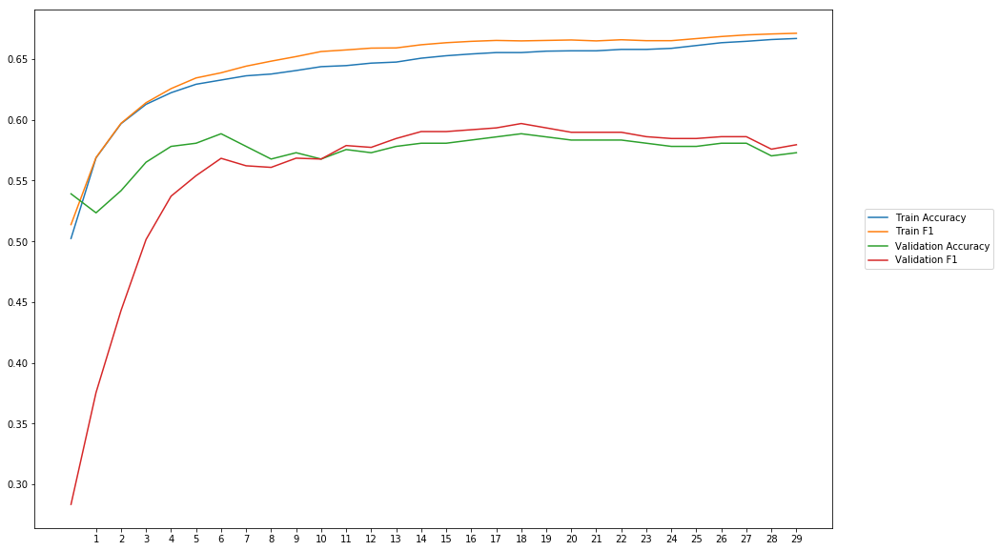

Average Accuracy: 57.42%
Average Precision: 57.62%
Average Recall: 54.87%
Average F1: 55.57%

-----Fold 4--------


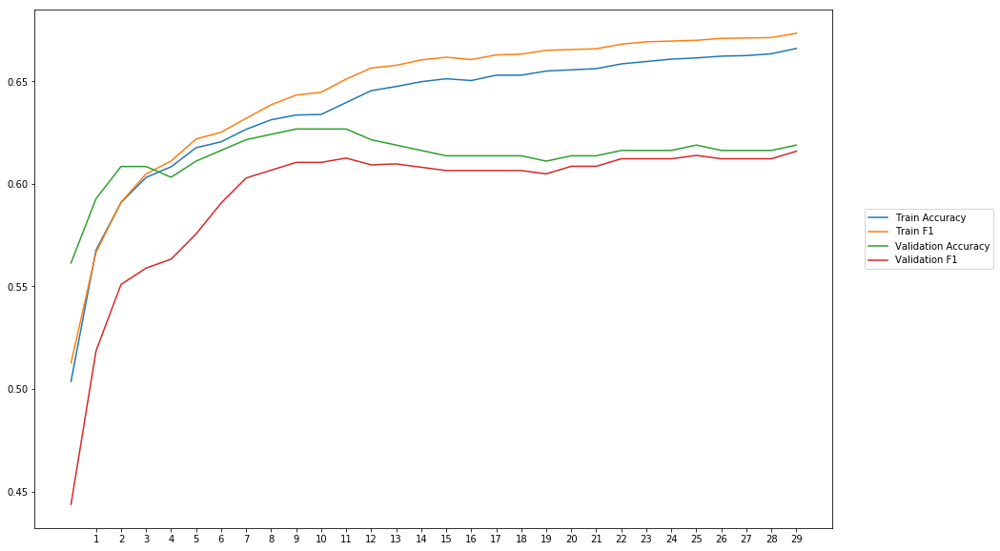

Average Accuracy: 61.37%
Average Precision: 62.32%
Average Recall: 57.09%
Average F1: 59.40%

-----Fold 5--------


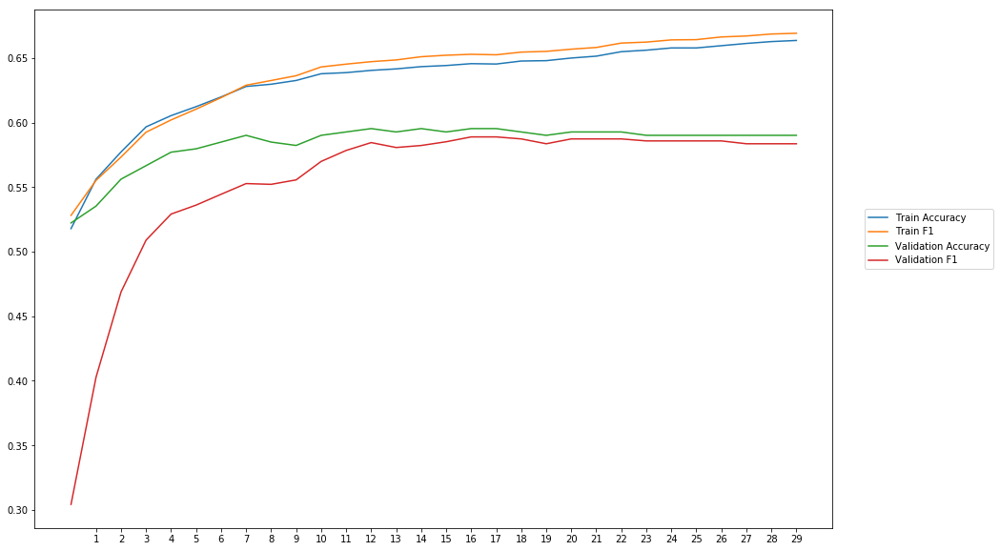

Average Accuracy: 58.40%
Average Precision: 59.17%
Average Recall: 52.90%
Average F1: 55.46%

-----Fold 6--------


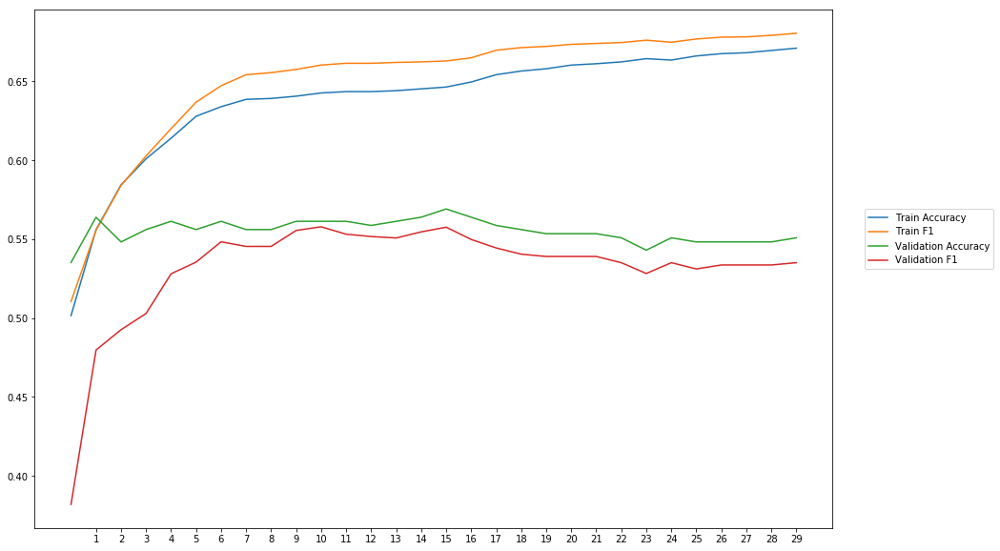

Average Accuracy: 55.54%
Average Precision: 55.99%
Average Recall: 51.01%
Average F1: 53.20%

-----Fold 7--------


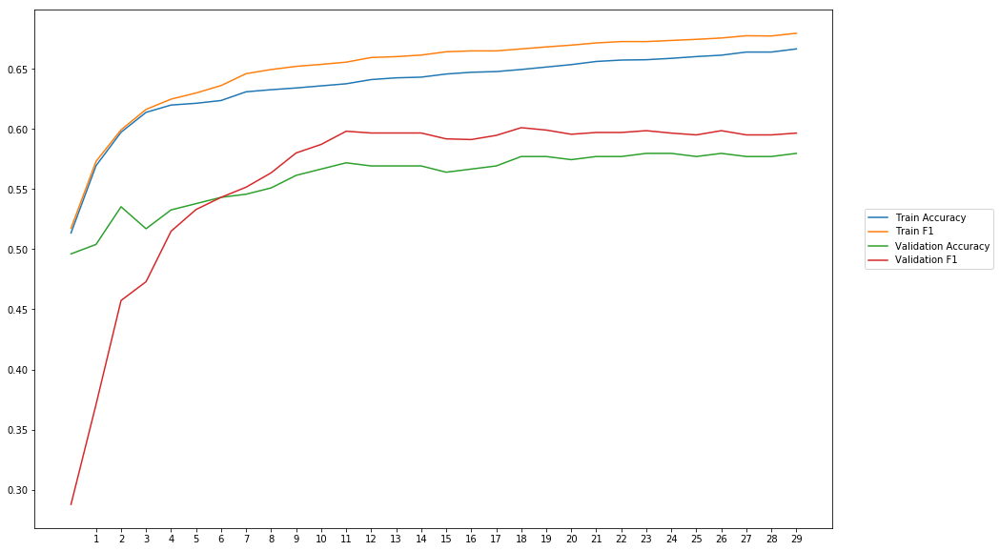

Average Accuracy: 56.01%
Average Precision: 55.41%
Average Recall: 57.47%
Average F1: 55.97%

-----Fold 8--------


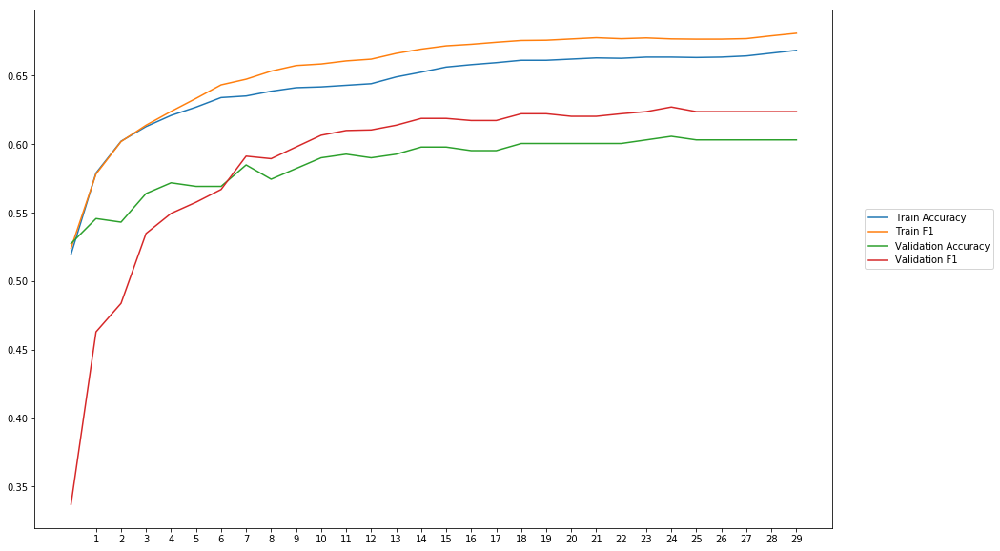

Average Accuracy: 58.70%
Average Precision: 58.17%
Average Recall: 60.44%
Average F1: 58.87%

-----Fold 9--------


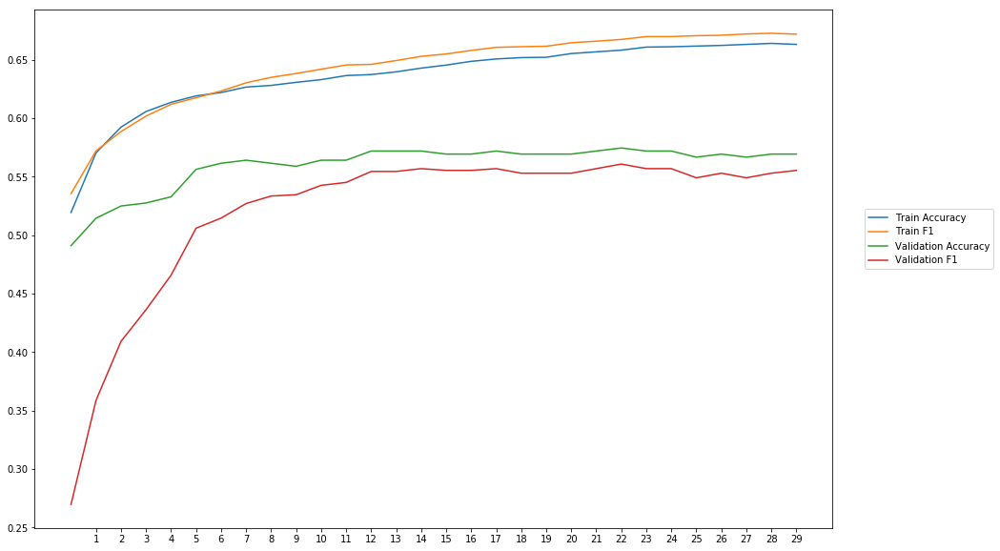

Average Accuracy: 55.94%
Average Precision: 56.45%
Average Recall: 48.94%
Average F1: 52.08%

-----Fold 10--------


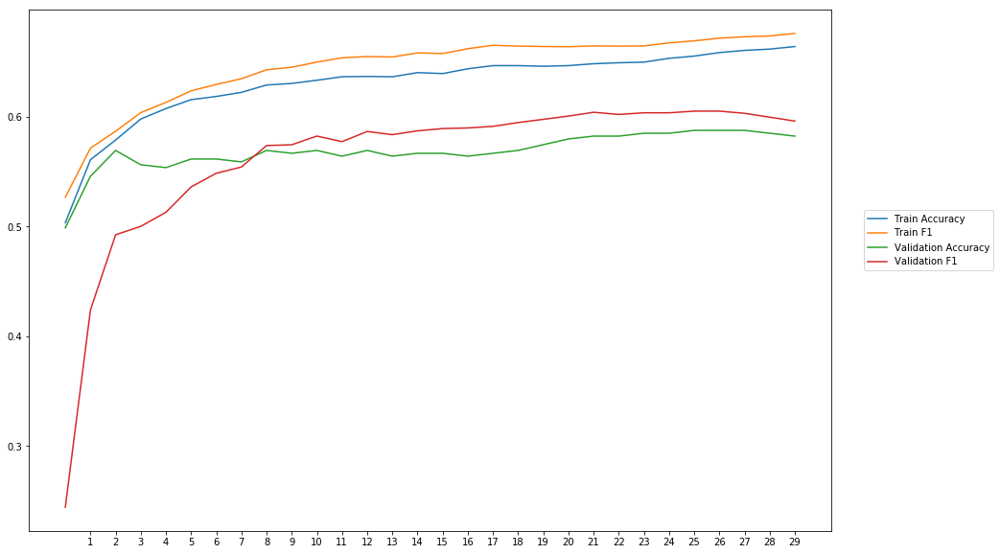

Average Accuracy: 56.86%
Average Precision: 56.59%
Average Recall: 56.96%
Average F1: 56.20%

-------Overallresults-------


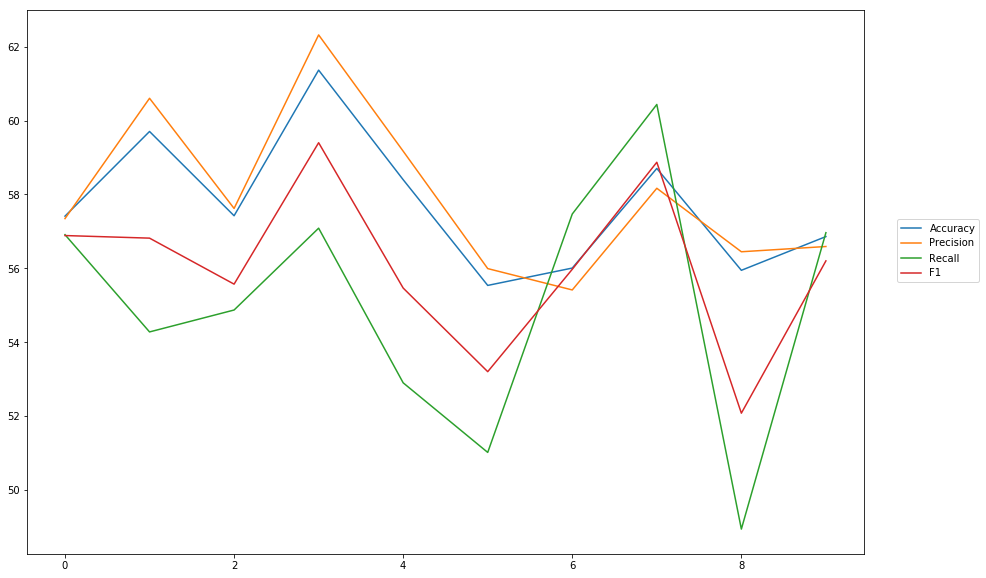

Accuracy: Mean = 57.73% (+/- 1.75%), Max = 61.37%, Min =  55.54%
Precision: Mean = 57.97% (+/- 2.06%), Max = 62.32%, Min =  55.41%
Recall: Mean = 55.09% (+/- 3.24%), Max = 60.44%, Min =  48.94%
F1: Mean = 56.05% (+/- 2.12%), Max = 59.40%, Min =  52.08%


In [12]:
cross_val_three_inputs(model, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Embedding001')

### weigth decay = 0,01

In [13]:
#Word Embeddings
wv_layer_2 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer=regularizers.l1(0.01))

input_embedding_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_2 = wv_layer_2(input_embedding_2)
x_embedding_2 = Dense(600, activation='relu')(embedded_sequences_2)
x_embedding_2 = Flatten()(x_embedding_2)

#Sentiment Features
input_sentiment_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_2 = Dense(600, activation='relu')(input_sentiment_2)

#POS Features
input_pos_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_2 = Dense(600, activation='relu')(input_pos_2)

#Concatination
concat_2 = concatenate([x_embedding_2, x_sentiment_2, x_pos_2])

preds_2 = Dense(2, activation='softmax')(concat_2)

model_2 = Model(inputs=[input_embedding_2, input_sentiment_2, input_pos_2], outputs=preds_2)


-----Fold 1--------


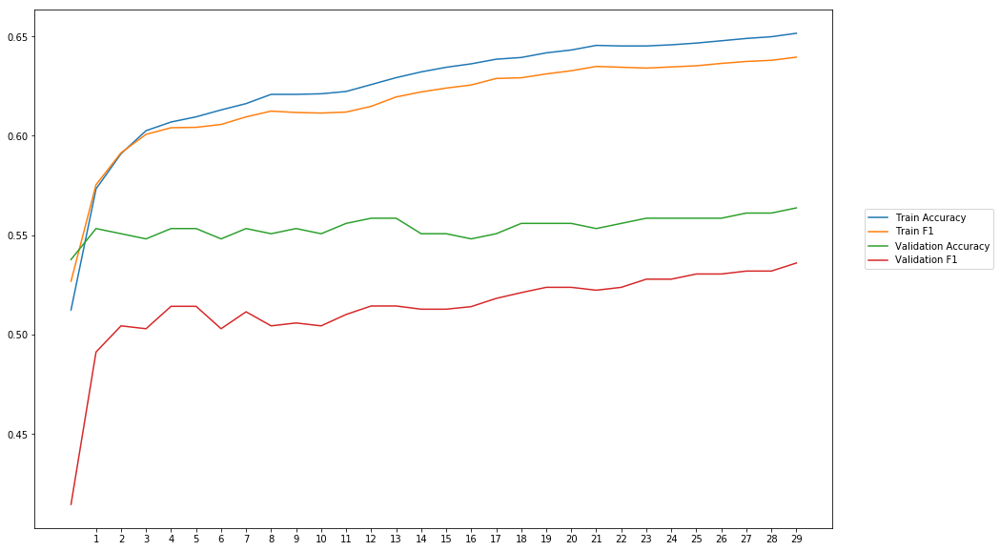

Average Accuracy: 55.40%
Average Precision: 56.30%
Average Recall: 47.26%
Average F1: 51.32%

-----Fold 2--------


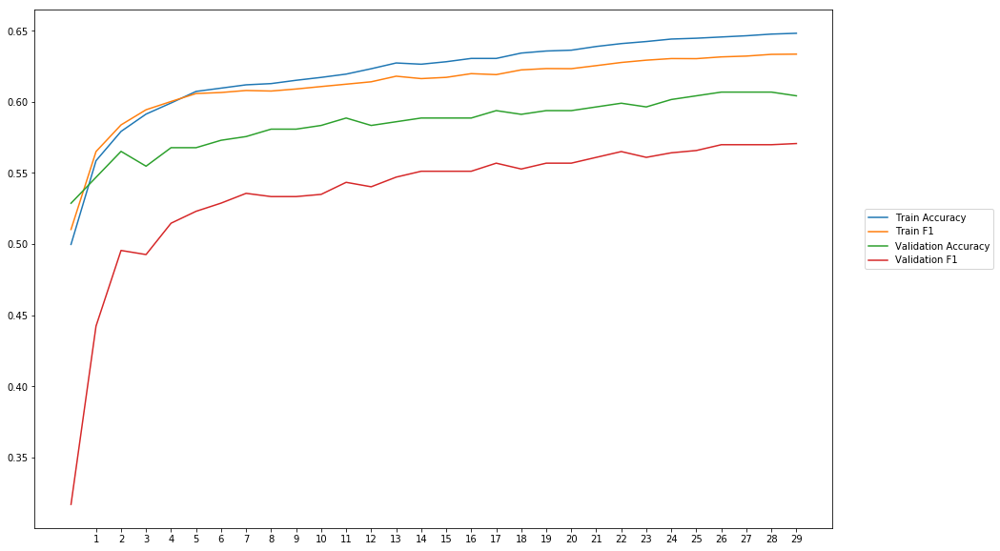

Average Accuracy: 58.47%
Average Precision: 60.14%
Average Recall: 48.52%
Average F1: 53.52%

-----Fold 3--------


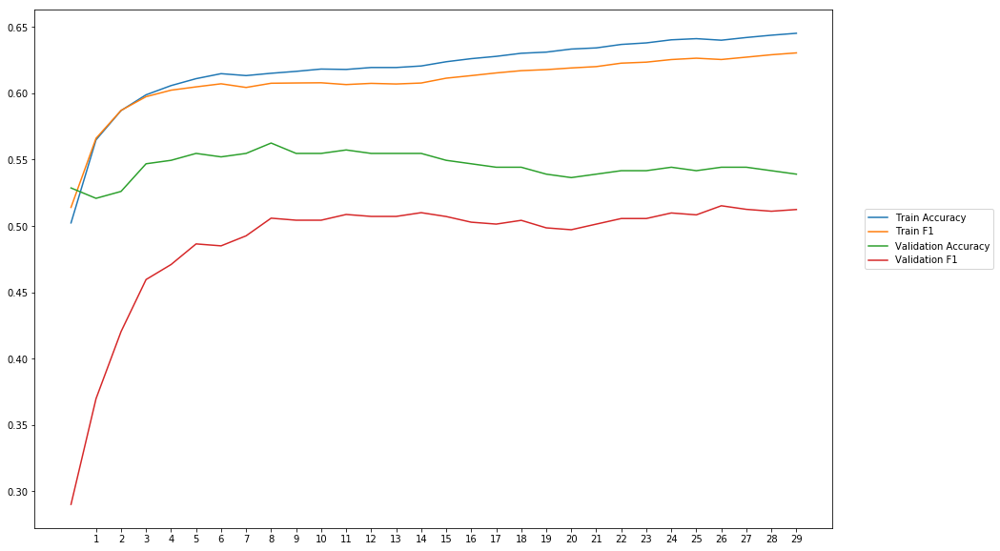

Average Accuracy: 54.55%
Average Precision: 55.50%
Average Recall: 43.93%
Average F1: 48.72%

-----Fold 4--------


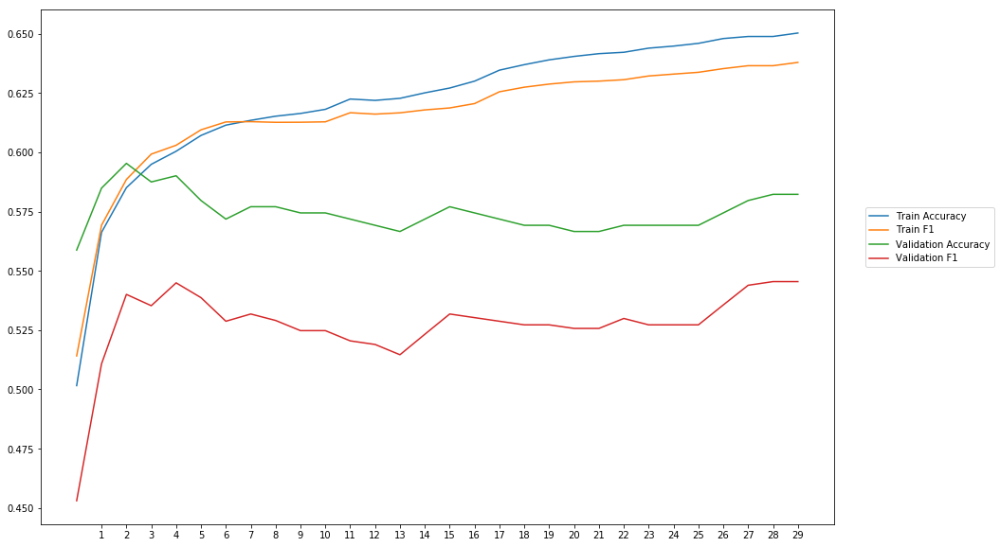

Average Accuracy: 57.47%
Average Precision: 59.16%
Average Recall: 47.63%
Average F1: 52.73%

-----Fold 5--------


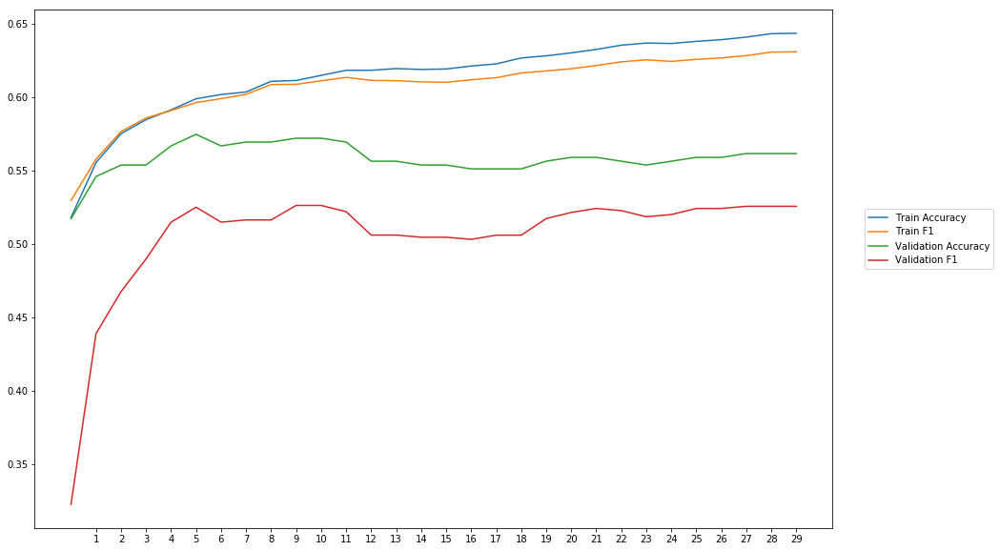

Average Accuracy: 55.81%
Average Precision: 57.09%
Average Recall: 45.58%
Average F1: 50.53%

-----Fold 6--------


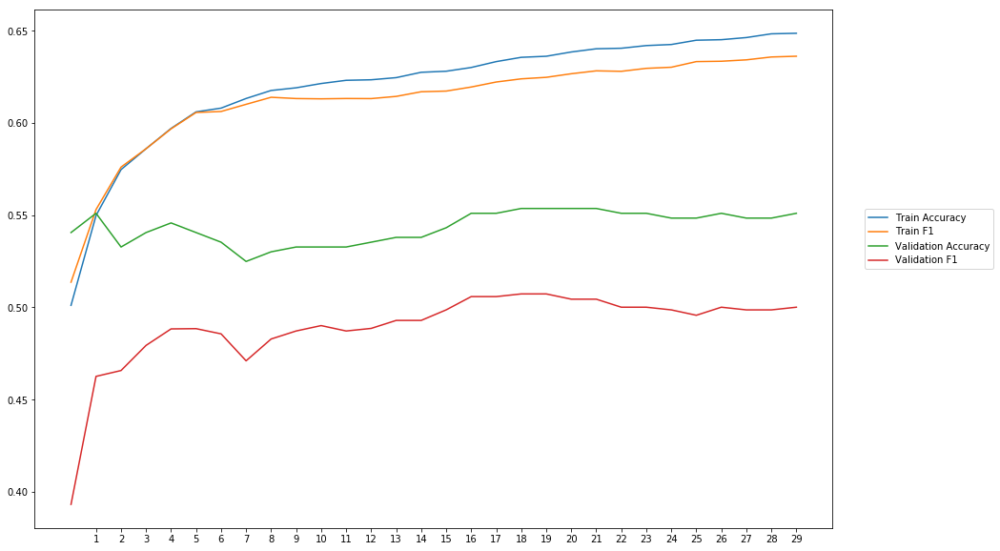

Average Accuracy: 54.35%
Average Precision: 55.37%
Average Recall: 43.96%
Average F1: 48.93%

-----Fold 7--------


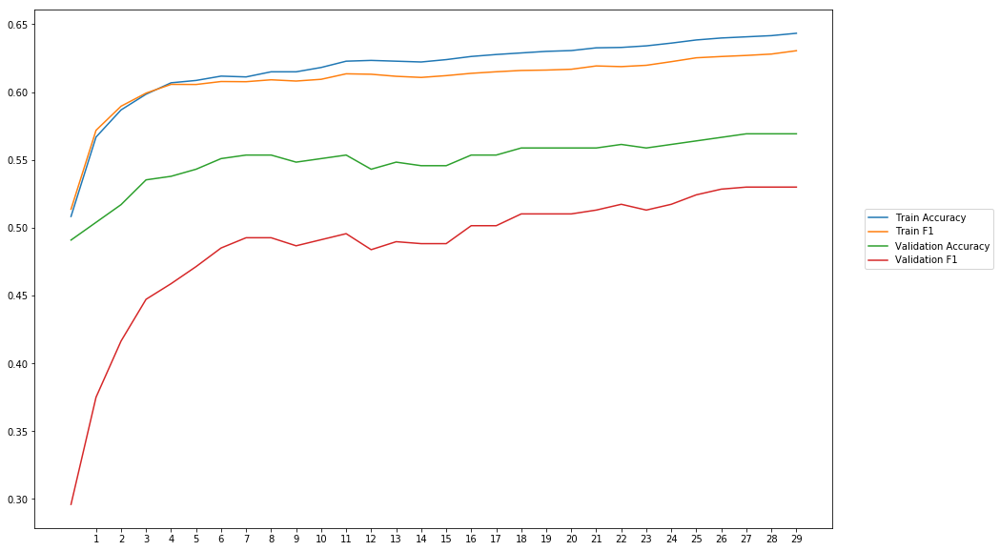

Average Accuracy: 54.94%
Average Precision: 56.06%
Average Recall: 43.18%
Average F1: 48.65%

-----Fold 8--------


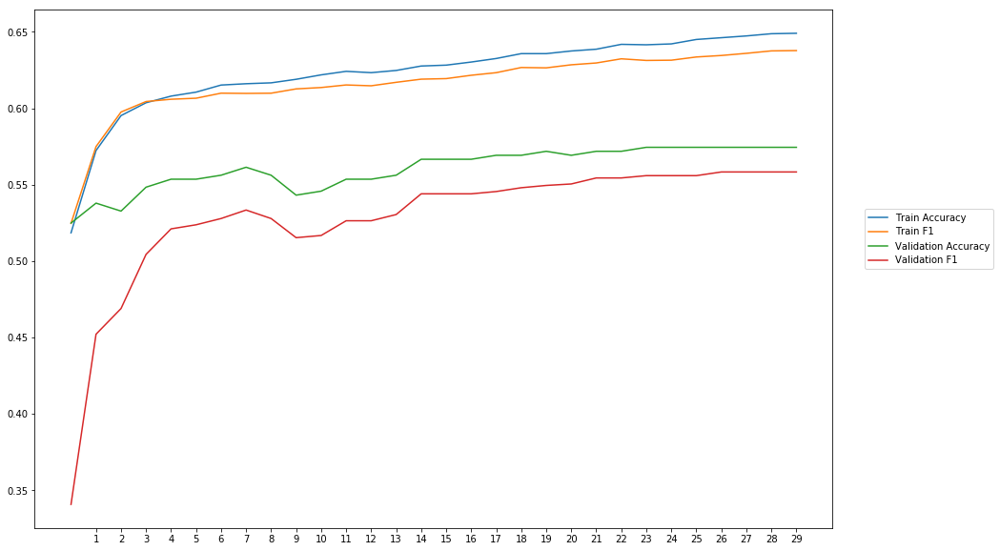

Average Accuracy: 56.07%
Average Precision: 56.72%
Average Recall: 49.76%
Average F1: 52.83%

-----Fold 9--------


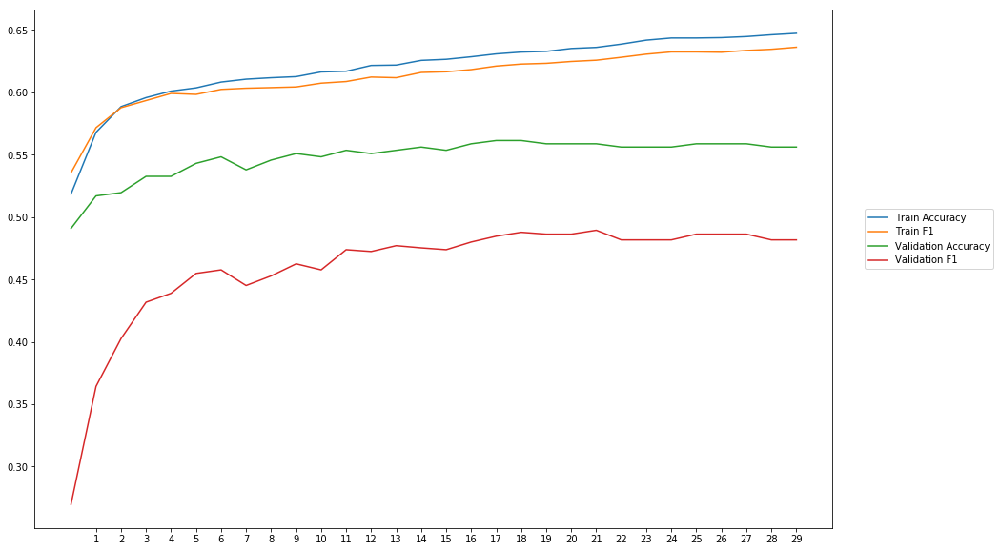

Average Accuracy: 54.83%
Average Precision: 56.70%
Average Recall: 38.81%
Average F1: 45.97%

-----Fold 10--------


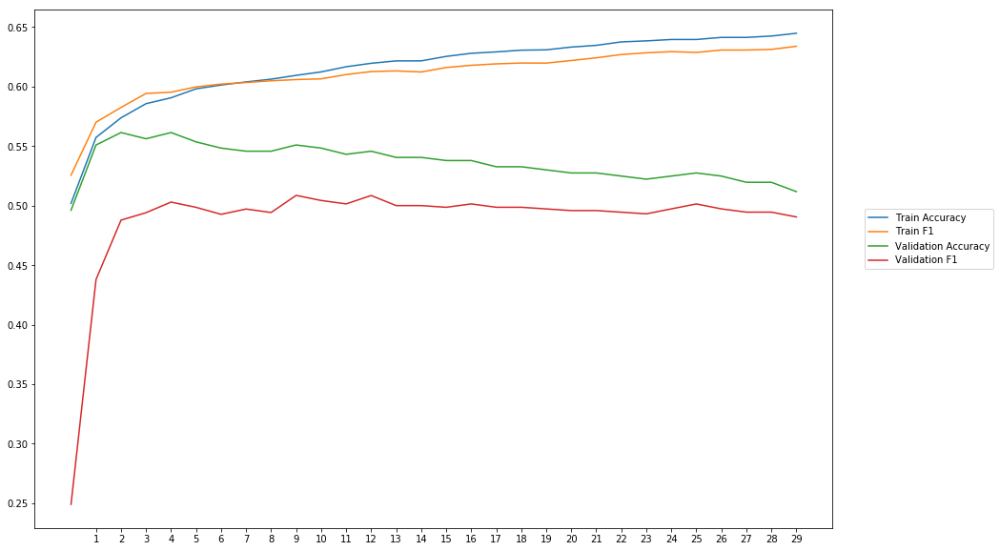

Average Accuracy: 53.63%
Average Precision: 54.28%
Average Recall: 44.66%
Average F1: 48.75%

-------Overallresults-------


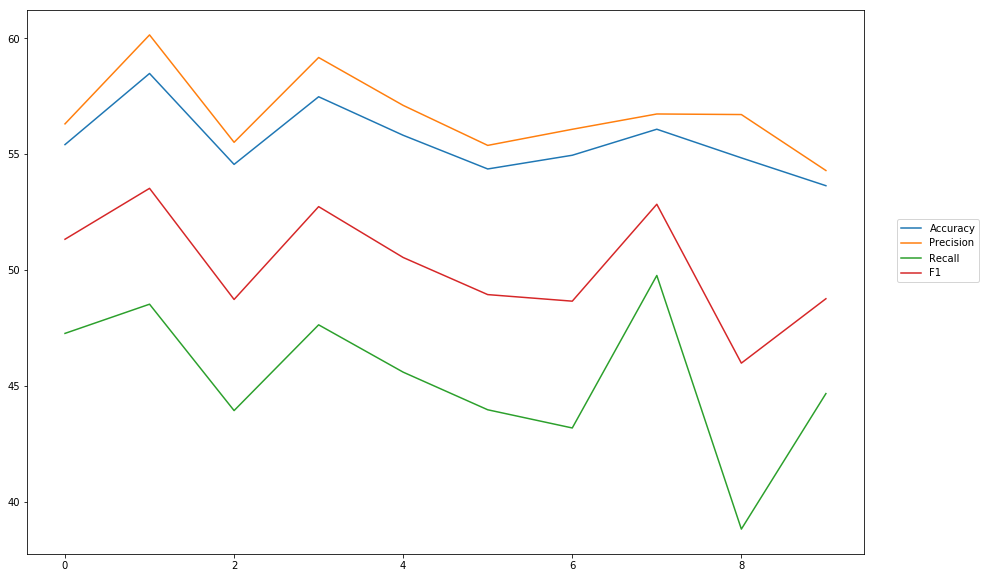

Accuracy: Mean = 55.55% (+/- 1.40%), Max = 58.47%, Min =  53.63%
Precision: Mean = 56.73% (+/- 1.66%), Max = 60.14%, Min =  54.28%
Recall: Mean = 45.33% (+/- 3.00%), Max = 49.76%, Min =  38.81%
F1: Mean = 50.19% (+/- 2.28%), Max = 53.52%, Min =  45.97%


In [14]:
cross_val_three_inputs(model_2, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Embedding01')

### weigth decay = 0,1

In [15]:
#Word Embeddings
wv_layer_3 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer=regularizers.l1(0.1))

input_embedding_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_3 = wv_layer_3(input_embedding_3)
x_embedding_3 = Dense(600, activation='relu')(embedded_sequences_3)
x_embedding_3 = Flatten()(x_embedding_3)

#Sentiment Features
input_sentiment_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_3 = Dense(600, activation='relu')(input_sentiment_3)

#POS Features
input_pos_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_3 = Dense(600, activation='relu')(input_pos_3)

#Concatination
concat_3 = concatenate([x_embedding_3, x_sentiment_3, x_pos_3])

preds_3 = Dense(2, activation='softmax')(concat_3)

model_3 = Model(inputs=[input_embedding_3, input_sentiment_3, input_pos_3], outputs=preds_3)


-----Fold 1--------


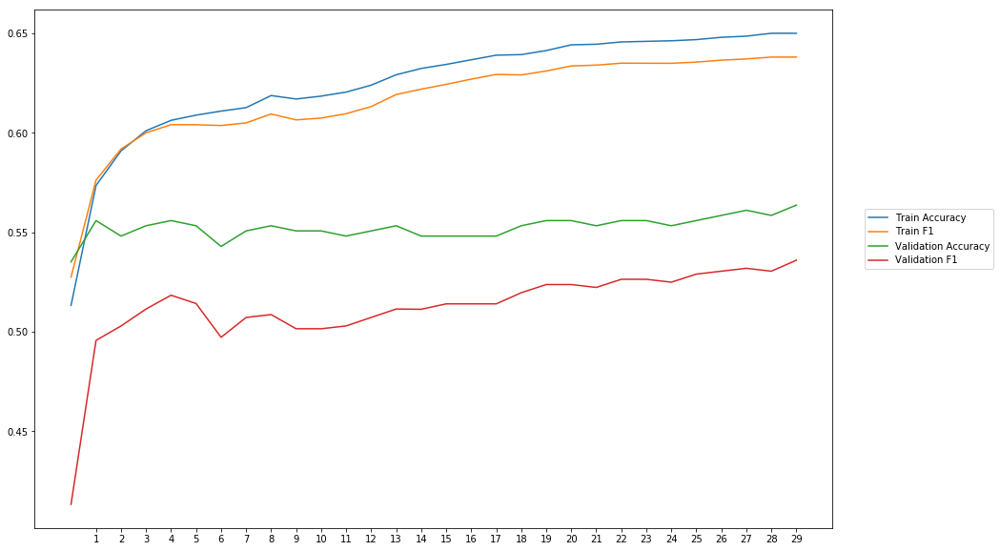

Average Accuracy: 55.25%
Average Precision: 56.09%
Average Recall: 47.26%
Average F1: 51.23%

-----Fold 2--------


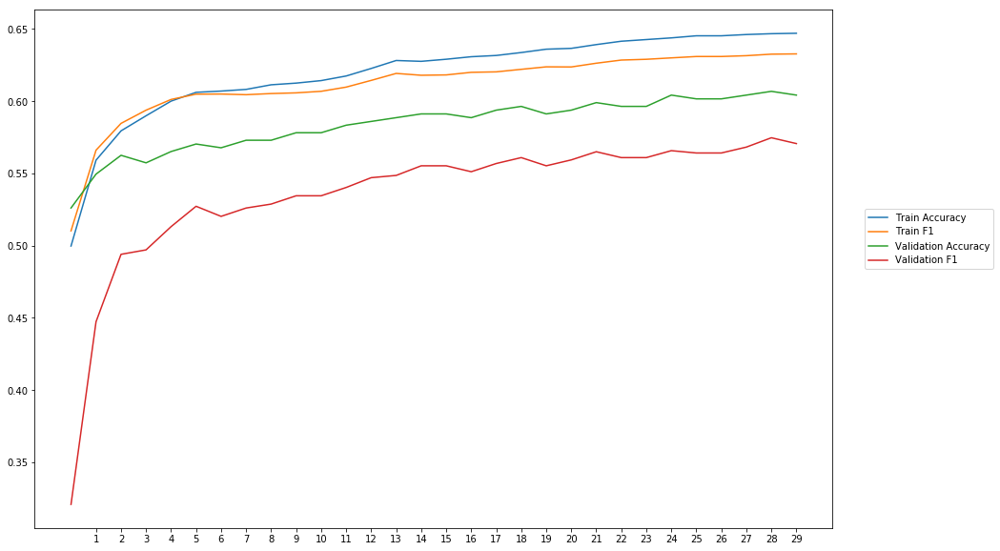

Average Accuracy: 58.39%
Average Precision: 59.97%
Average Recall: 48.67%
Average F1: 53.56%

-----Fold 3--------


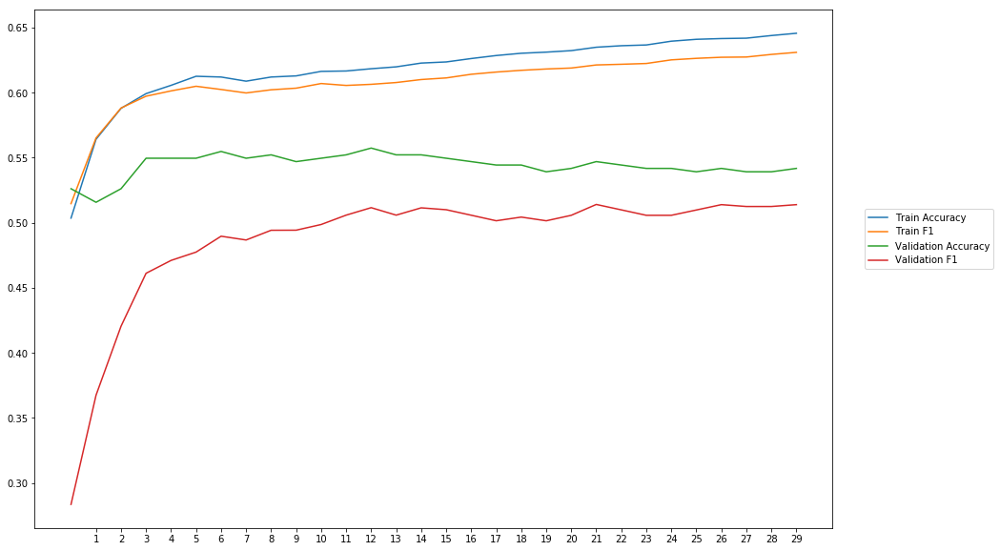

Average Accuracy: 54.41%
Average Precision: 55.28%
Average Recall: 44.01%
Average F1: 48.68%

-----Fold 4--------


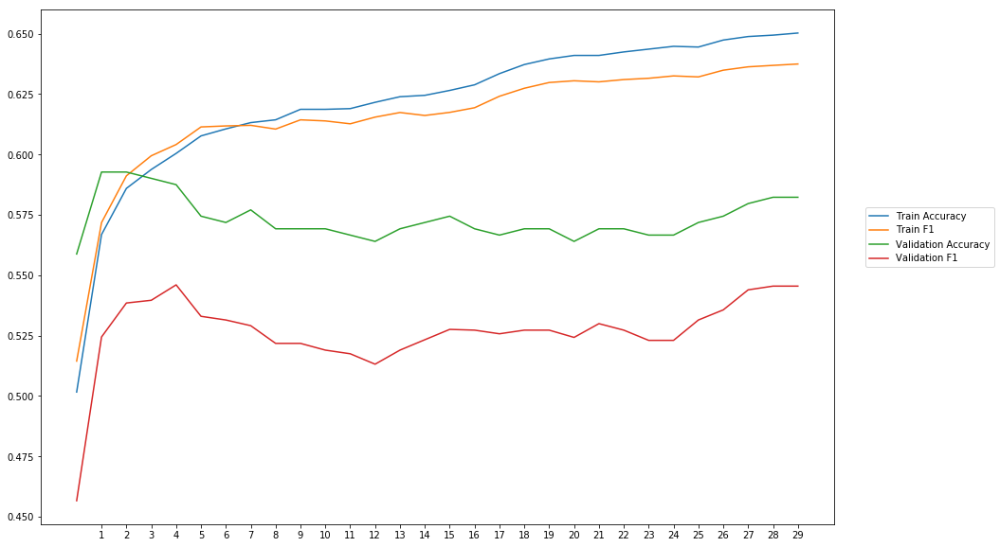

Average Accuracy: 57.33%
Average Precision: 58.95%
Average Recall: 47.64%
Average F1: 52.66%

-----Fold 5--------


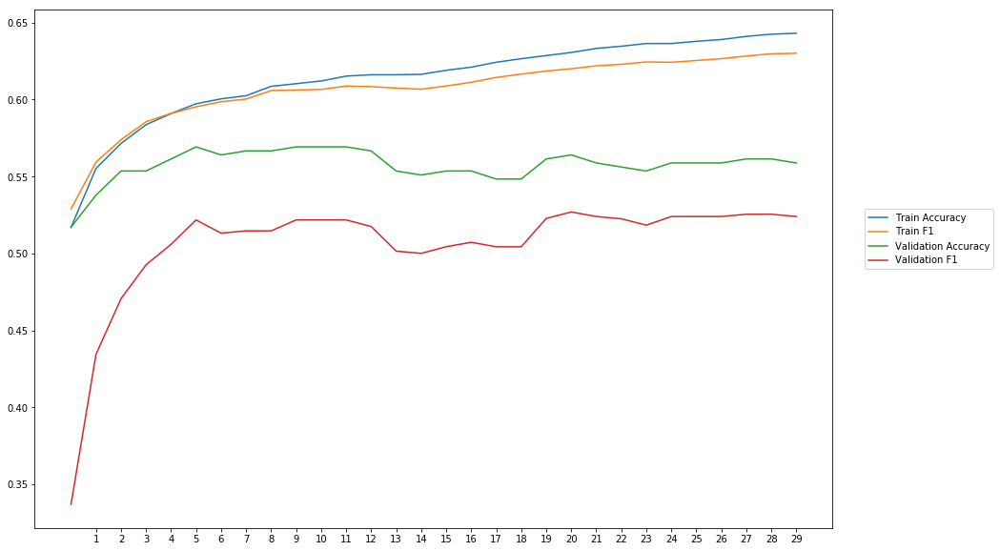

Average Accuracy: 55.74%
Average Precision: 56.98%
Average Recall: 45.67%
Average F1: 50.57%

-----Fold 6--------


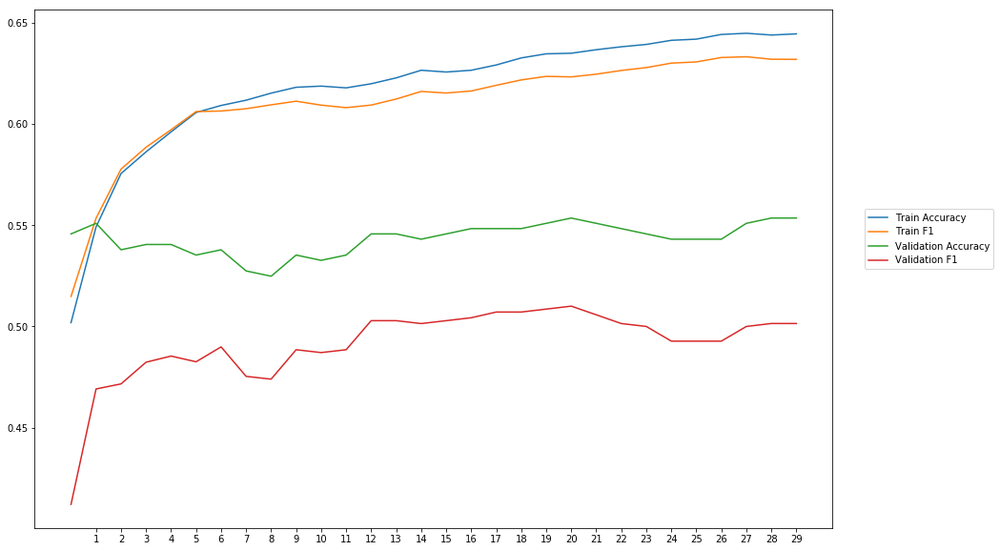

Average Accuracy: 54.35%
Average Precision: 55.32%
Average Recall: 44.31%
Average F1: 49.14%

-----Fold 7--------


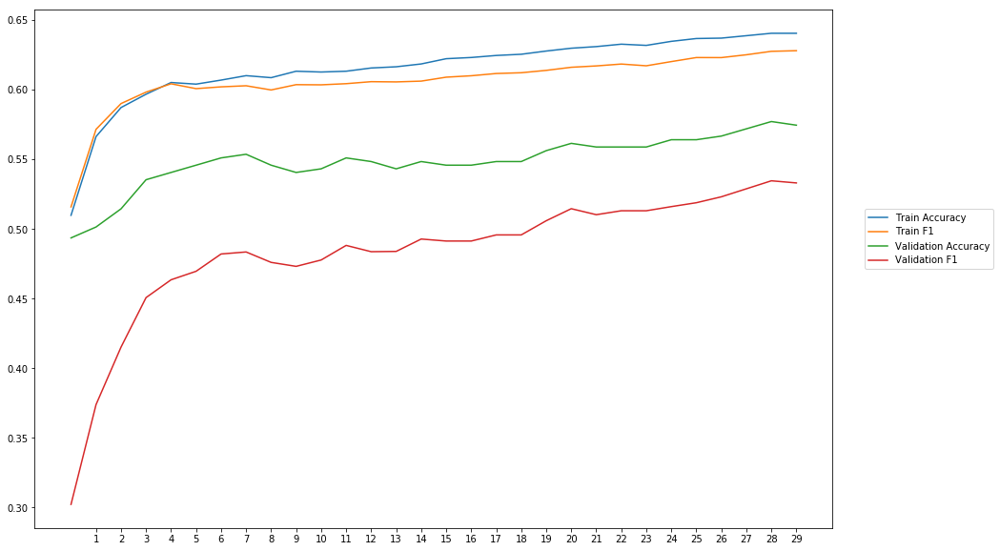

Average Accuracy: 54.85%
Average Precision: 56.02%
Average Recall: 42.69%
Average F1: 48.33%

-----Fold 8--------


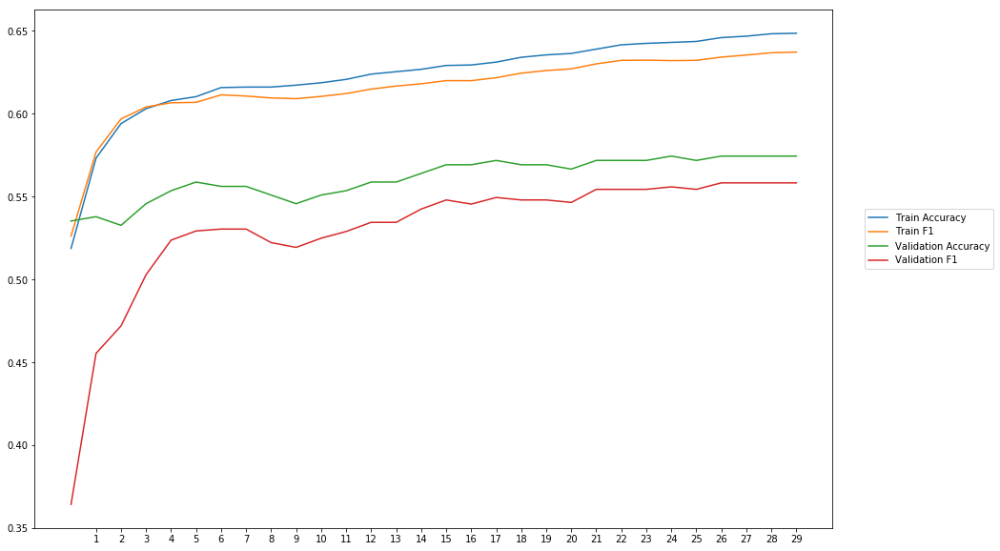

Average Accuracy: 56.11%
Average Precision: 56.77%
Average Recall: 50.03%
Average F1: 53.02%

-----Fold 9--------


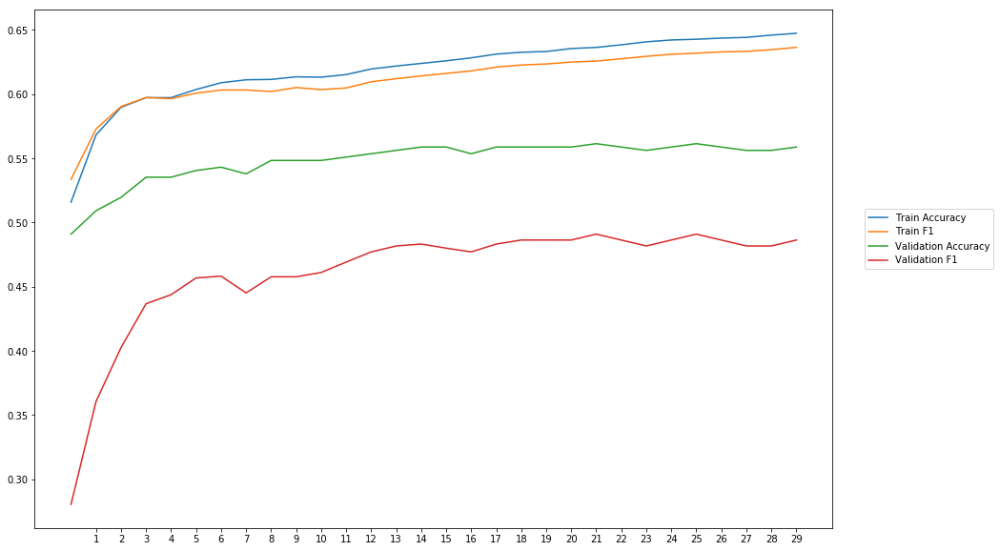

Average Accuracy: 54.83%
Average Precision: 56.65%
Average Recall: 39.06%
Average F1: 46.14%

-----Fold 10--------


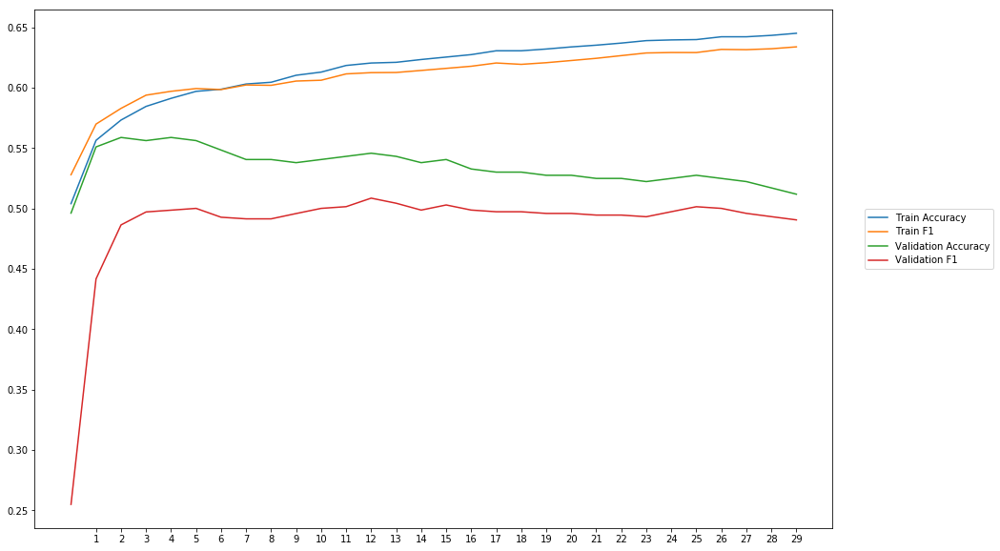

Average Accuracy: 53.47%
Average Precision: 54.08%
Average Recall: 44.69%
Average F1: 48.70%

-------Overallresults-------


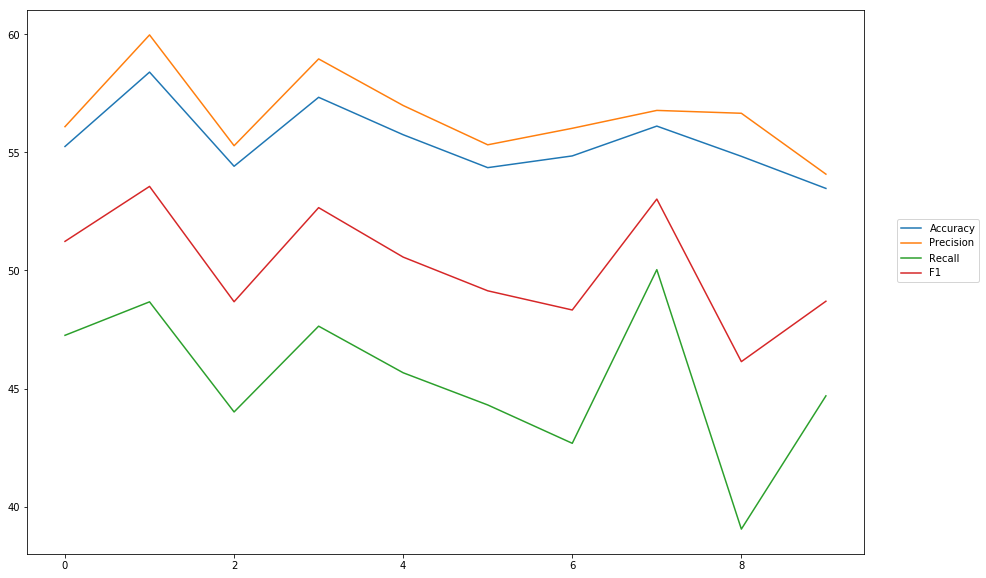

Accuracy: Mean = 55.47% (+/- 1.40%), Max = 58.39%, Min =  53.47%
Precision: Mean = 56.61% (+/- 1.66%), Max = 59.97%, Min =  54.08%
Recall: Mean = 45.40% (+/- 3.03%), Max = 50.03%, Min =  39.06%
F1: Mean = 50.20% (+/- 2.28%), Max = 53.56%, Min =  46.14%


In [16]:
cross_val_three_inputs(model_3, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Embedding1')

# L2 for embedding layer

### weigth decay = 0,001

In [17]:
#Word Embeddings
wv_layer_4 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer=regularizers.l2(0.001))

input_embedding_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_4 = wv_layer_4(input_embedding_4)
x_embedding_4 = Dense(600, activation='relu')(embedded_sequences_4)
x_embedding_4 = Flatten()(x_embedding_4)

#Sentiment Features
input_sentiment_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_4 = Dense(600, activation='relu')(input_sentiment_4)

#POS Features
input_pos_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_4 = Dense(600, activation='relu')(input_pos_4)

#Concatination
concat_4 = concatenate([x_embedding_4, x_sentiment_4, x_pos_4])

preds_4 = Dense(2, activation='softmax')(concat_4)

model_4 = Model(inputs=[input_embedding_4, input_sentiment_4, input_pos_4], outputs=preds_4)


-----Fold 1--------


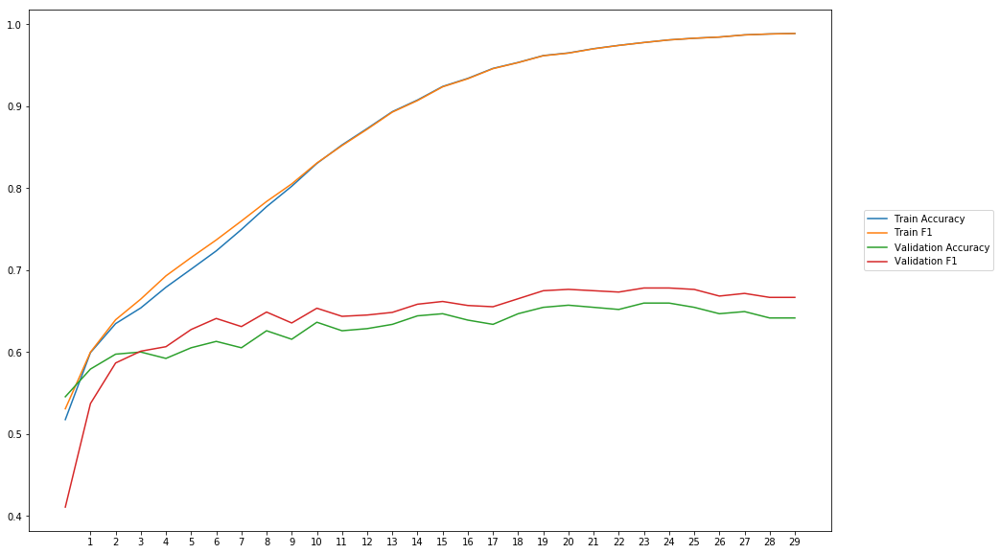

Average Accuracy: 62.95%
Average Precision: 61.76%
Average Recall: 67.05%
Average F1: 64.06%

-----Fold 2--------


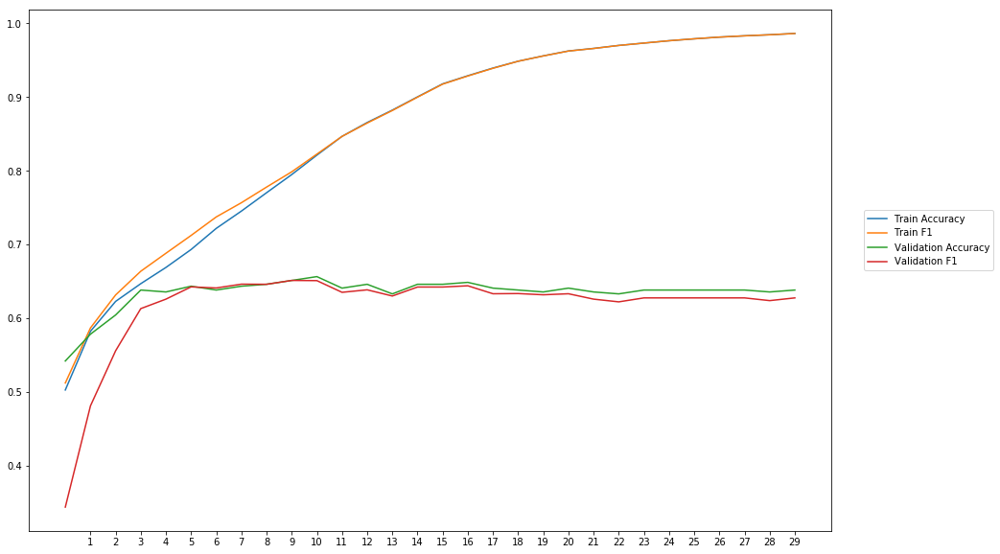

Average Accuracy: 63.40%
Average Precision: 63.99%
Average Recall: 60.07%
Average F1: 61.64%

-----Fold 3--------


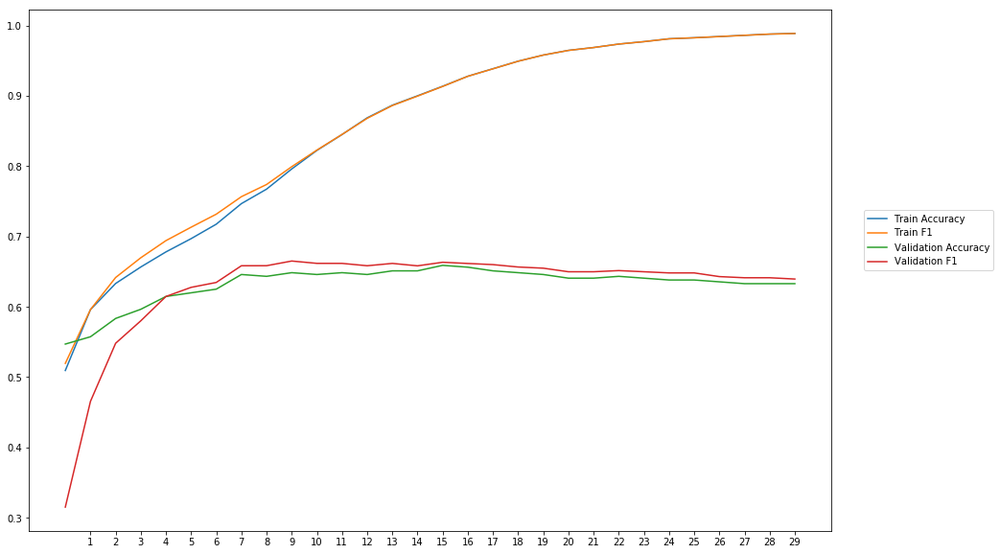

Average Accuracy: 63.19%
Average Precision: 62.73%
Average Recall: 63.77%
Average F1: 62.75%

-----Fold 4--------


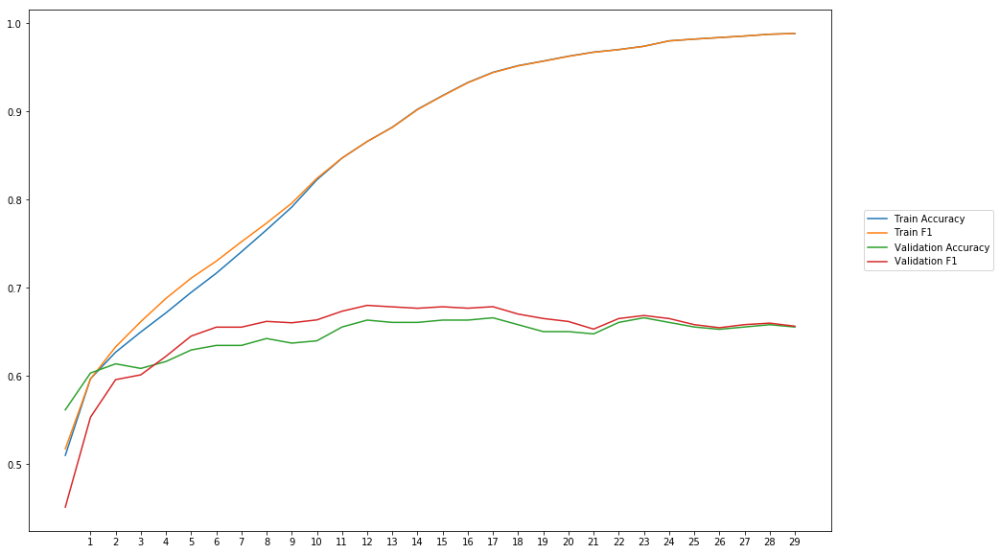

Average Accuracy: 64.40%
Average Precision: 63.70%
Average Recall: 66.35%
Average F1: 64.80%

-----Fold 5--------


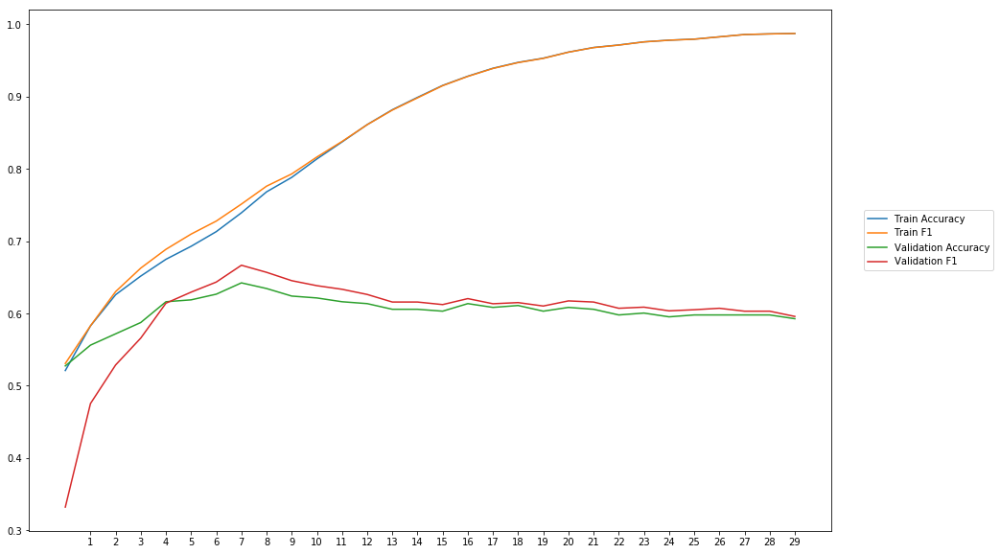

Average Accuracy: 60.33%
Average Precision: 59.95%
Average Recall: 60.94%
Average F1: 60.09%

-----Fold 6--------


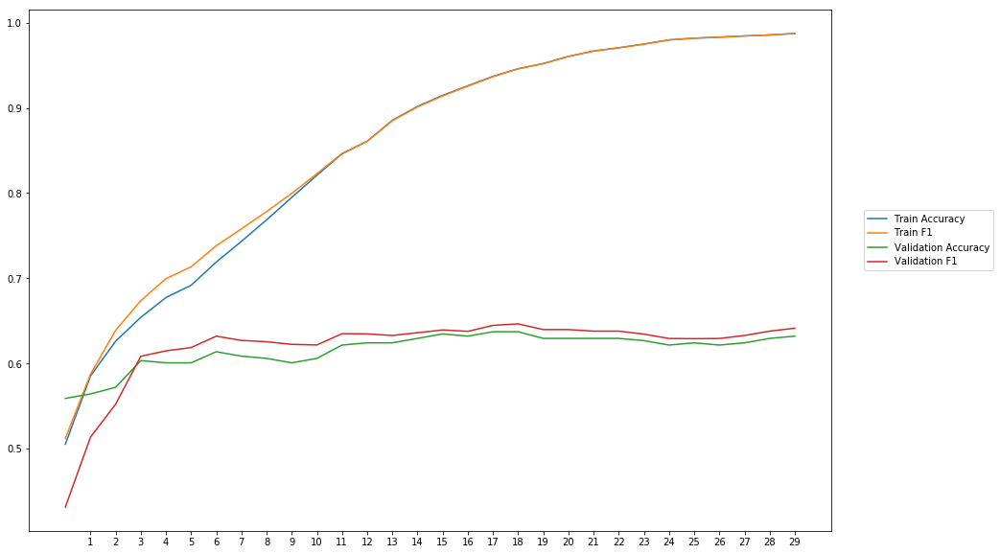

Average Accuracy: 61.56%
Average Precision: 61.06%
Average Recall: 63.09%
Average F1: 61.86%

-----Fold 7--------


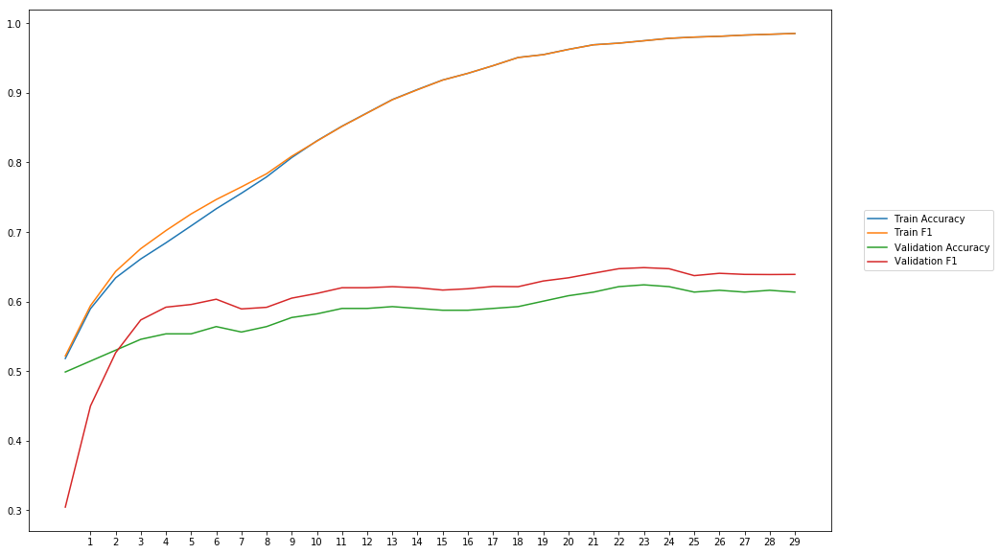

Average Accuracy: 58.41%
Average Precision: 57.20%
Average Recall: 64.10%
Average F1: 60.15%

-----Fold 8--------


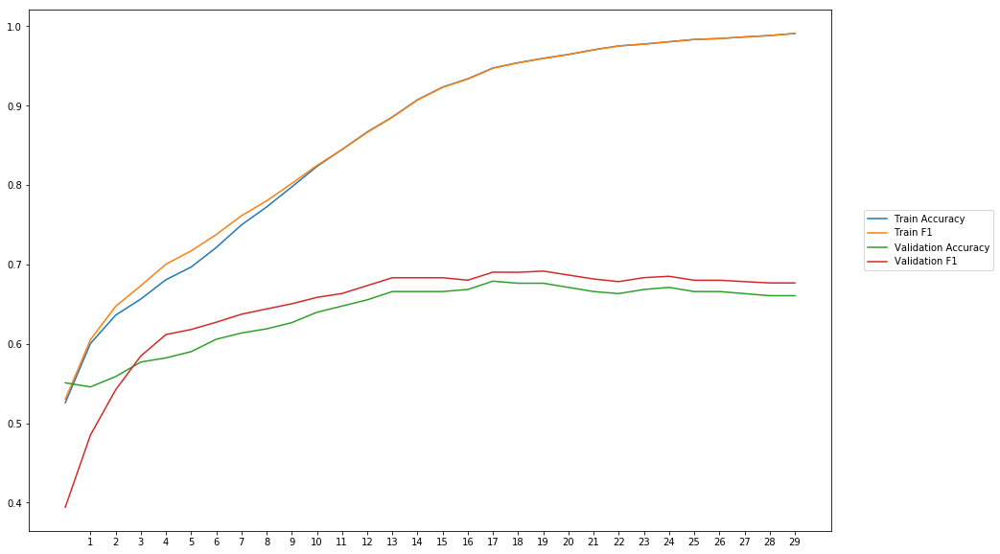

Average Accuracy: 63.88%
Average Precision: 62.75%
Average Recall: 67.31%
Average F1: 64.66%

-----Fold 9--------


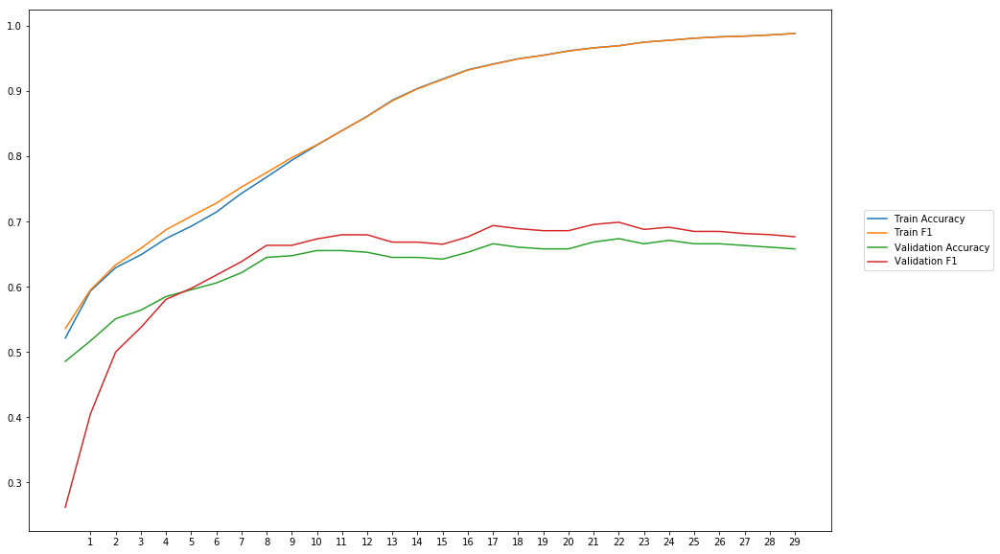

Average Accuracy: 63.33%
Average Precision: 61.72%
Average Recall: 66.79%
Average F1: 63.70%

-----Fold 10--------


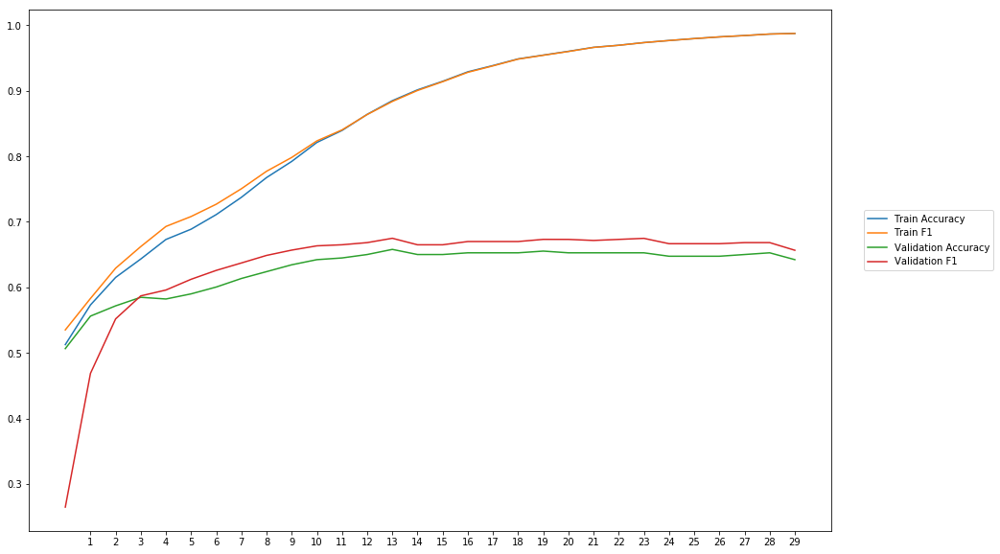

Average Accuracy: 62.91%
Average Precision: 61.68%
Average Recall: 66.16%
Average F1: 63.40%

-------Overallresults-------


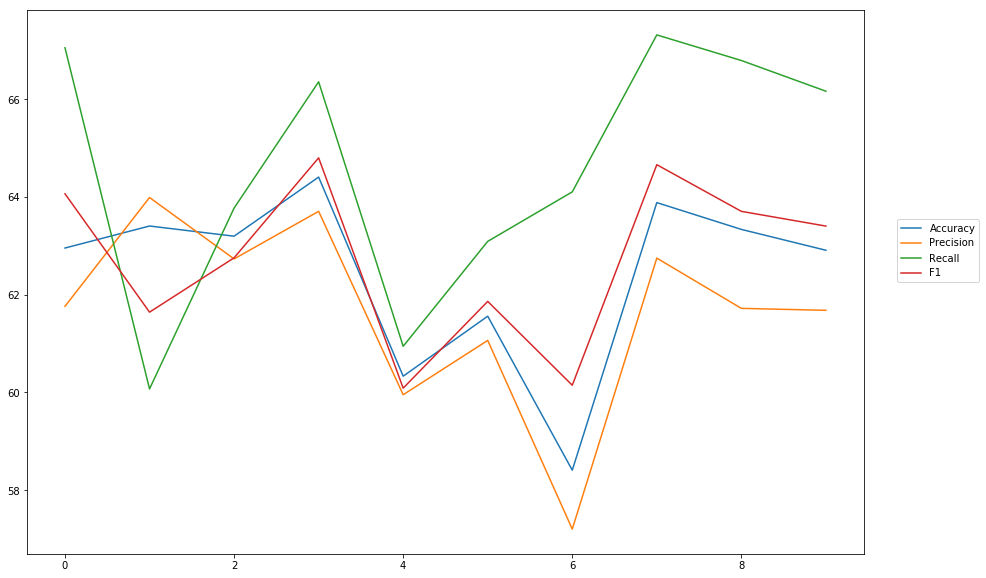

Accuracy: Mean = 62.44% (+/- 1.74%), Max = 64.40%, Min =  58.41%
Precision: Mean = 61.65% (+/- 1.87%), Max = 63.99%, Min =  57.20%
Recall: Mean = 64.56% (+/- 2.46%), Max = 67.31%, Min =  60.07%
F1: Mean = 62.71% (+/- 1.64%), Max = 64.80%, Min =  60.09%


In [18]:
cross_val_three_inputs(model_4, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Embedding001')

### weigth decay = 0,01

In [19]:
#Word Embeddings
wv_layer_5 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer=regularizers.l2(0.01))

input_embedding_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_5 = wv_layer_5(input_embedding_5)
x_embedding_5 = Dense(600, activation='relu')(embedded_sequences_5)
x_embedding_5 = Flatten()(x_embedding_5)

#Sentiment Features
input_sentiment_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_5 = Dense(600, activation='relu')(input_sentiment_5)

#POS Features
input_pos_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_5 = Dense(600, activation='relu')(input_pos_5)

#Concatination
concat_5 = concatenate([x_embedding_5, x_sentiment_5, x_pos_5])

preds_5 = Dense(2, activation='softmax')(concat_5)

model_5 = Model(inputs=[input_embedding_5, input_sentiment_5, input_pos_5], outputs=preds_5)


-----Fold 1--------


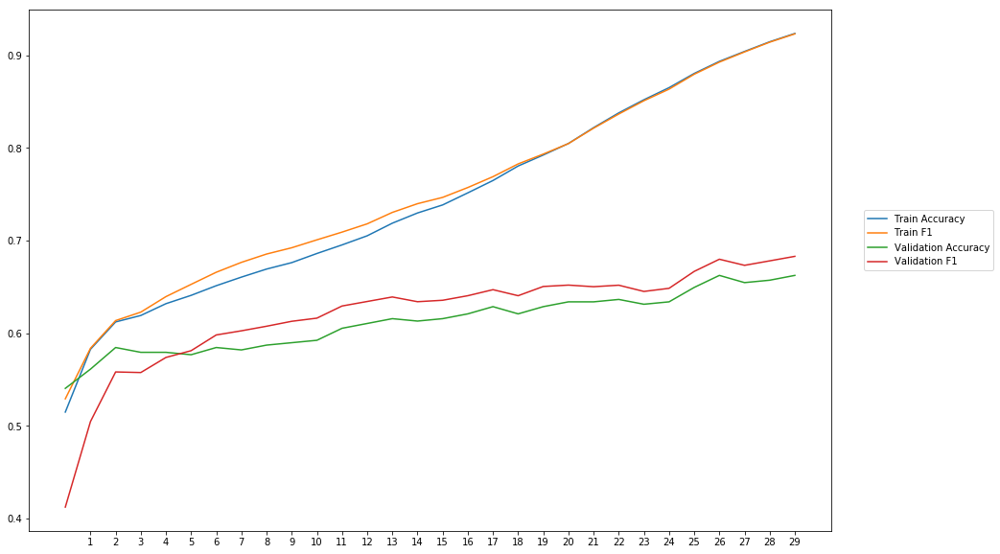

Average Accuracy: 61.23%
Average Precision: 60.35%
Average Recall: 64.27%
Average F1: 62.00%

-----Fold 2--------


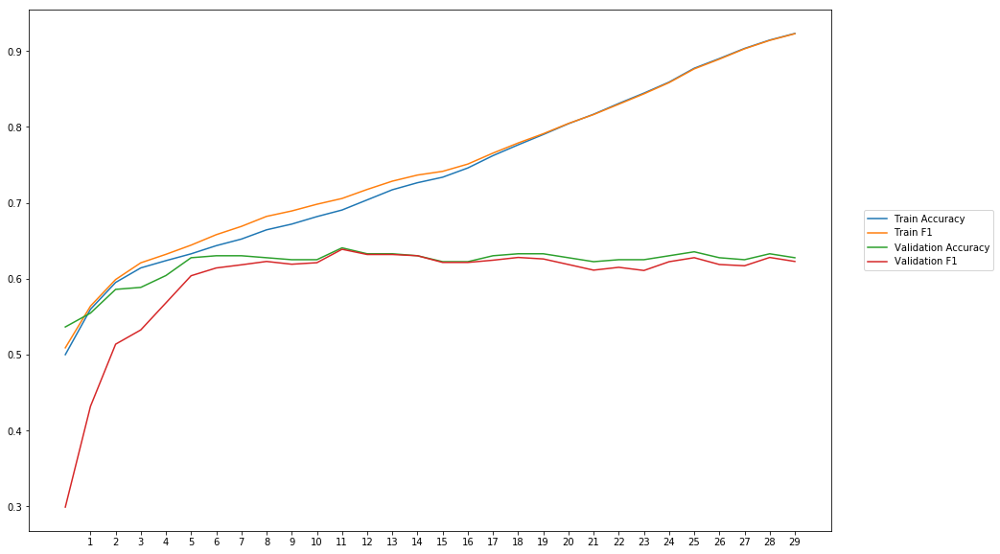

Average Accuracy: 61.97%
Average Precision: 62.69%
Average Recall: 57.71%
Average F1: 59.64%

-----Fold 3--------


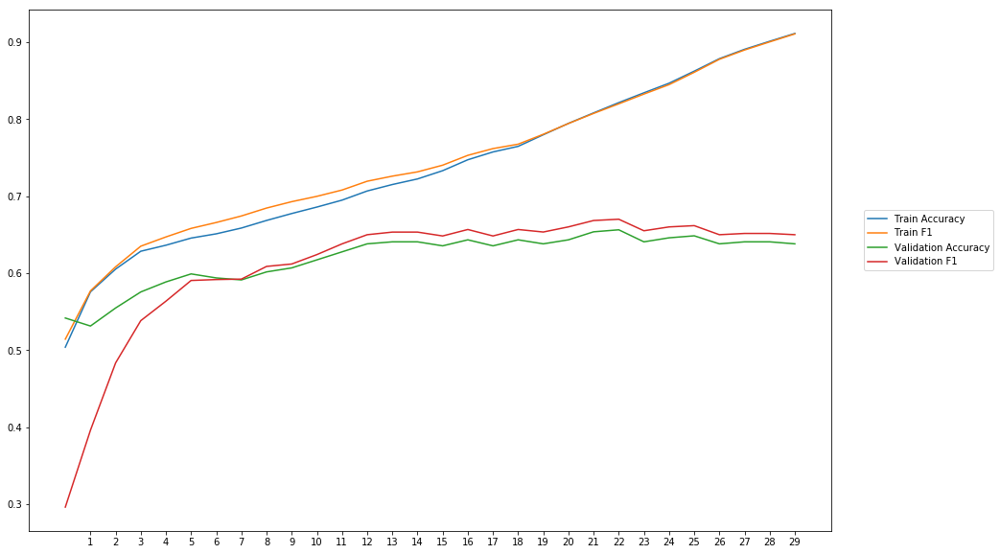

Average Accuracy: 61.96%
Average Precision: 61.53%
Average Recall: 61.94%
Average F1: 61.10%

-----Fold 4--------


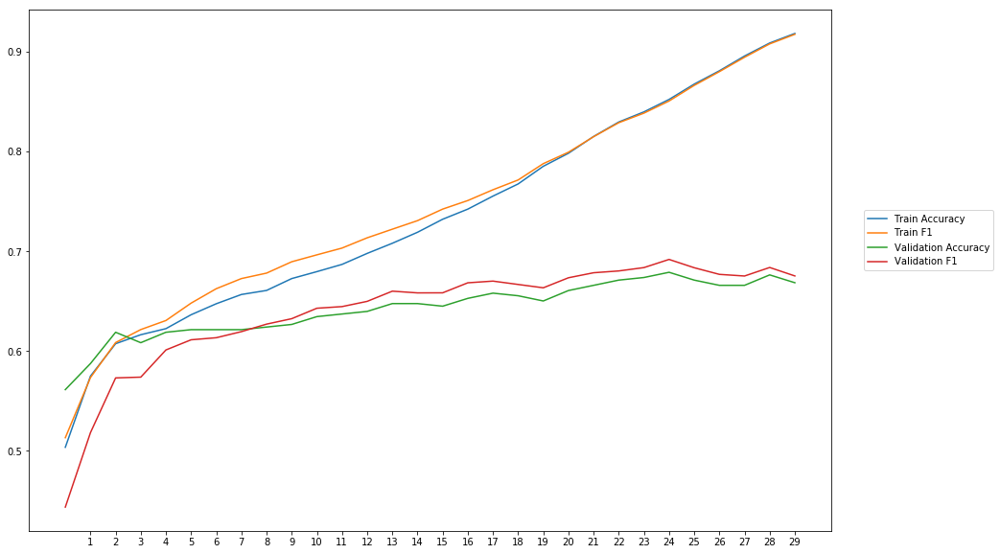

Average Accuracy: 64.25%
Average Precision: 63.93%
Average Recall: 64.57%
Average F1: 63.99%

-----Fold 5--------


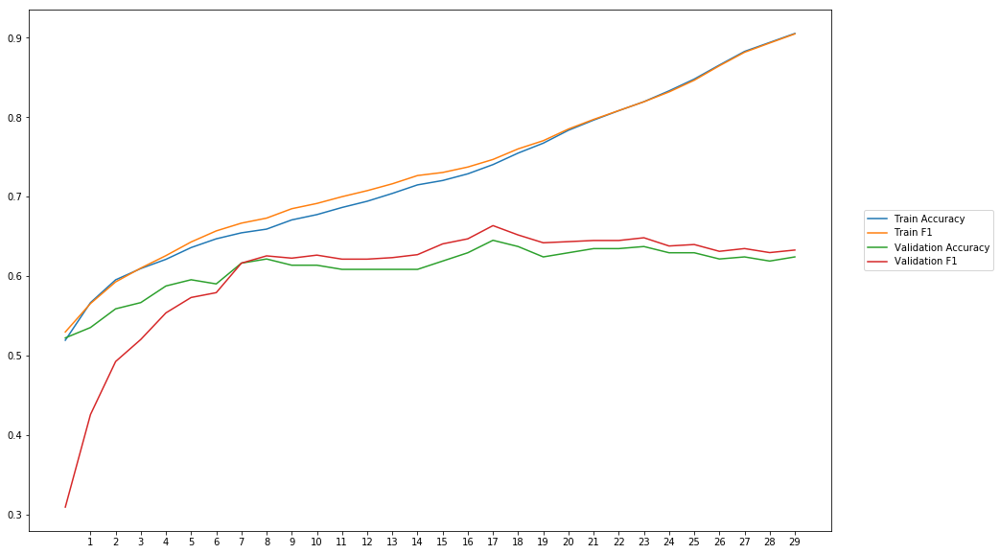

Average Accuracy: 60.97%
Average Precision: 60.63%
Average Recall: 60.75%
Average F1: 60.22%

-----Fold 6--------


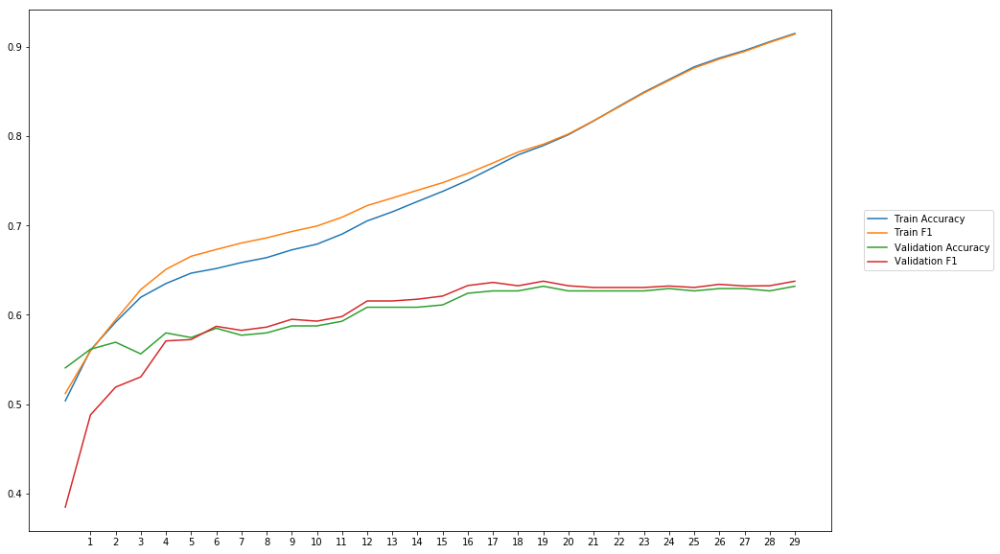

Average Accuracy: 60.38%
Average Precision: 60.27%
Average Recall: 59.81%
Average F1: 59.79%

-----Fold 7--------


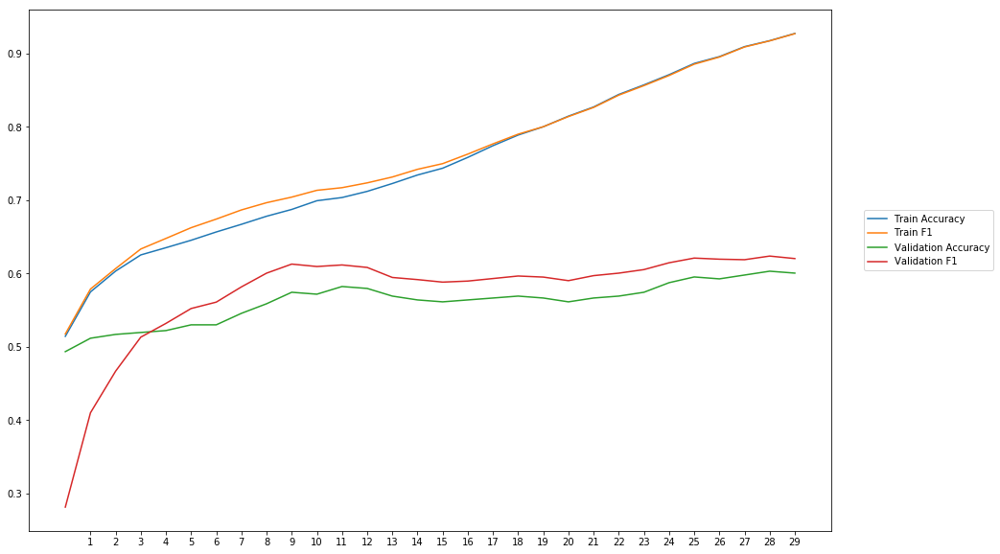

Average Accuracy: 56.15%
Average Precision: 55.28%
Average Recall: 60.44%
Average F1: 57.34%

-----Fold 8--------


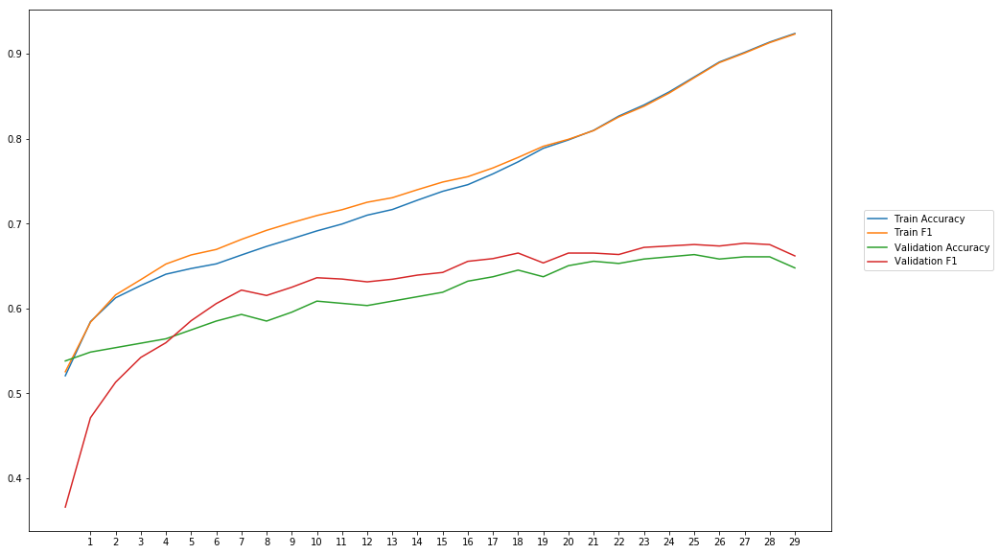

Average Accuracy: 61.57%
Average Precision: 60.66%
Average Recall: 64.54%
Average F1: 62.17%

-----Fold 9--------


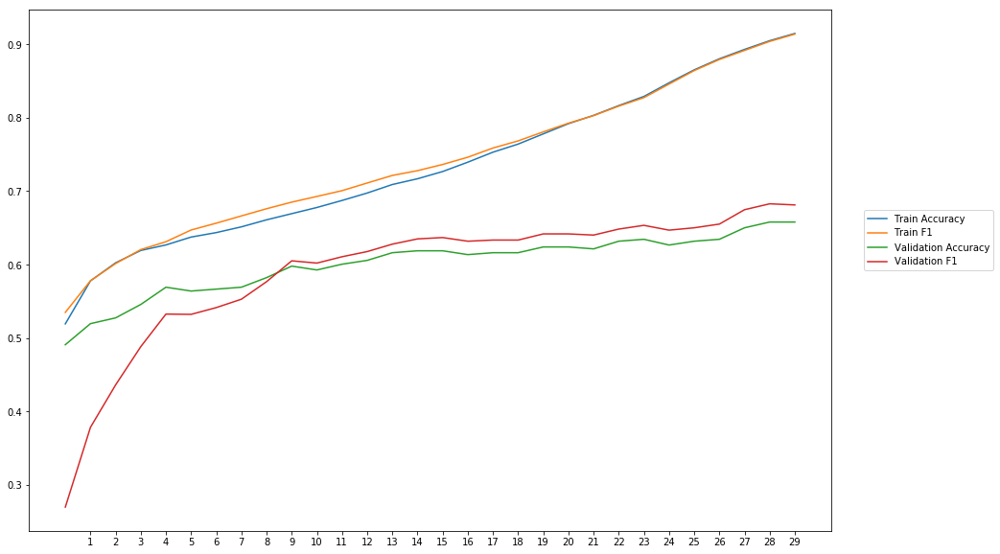

Average Accuracy: 60.09%
Average Precision: 59.36%
Average Recall: 60.12%
Average F1: 59.20%

-----Fold 10--------


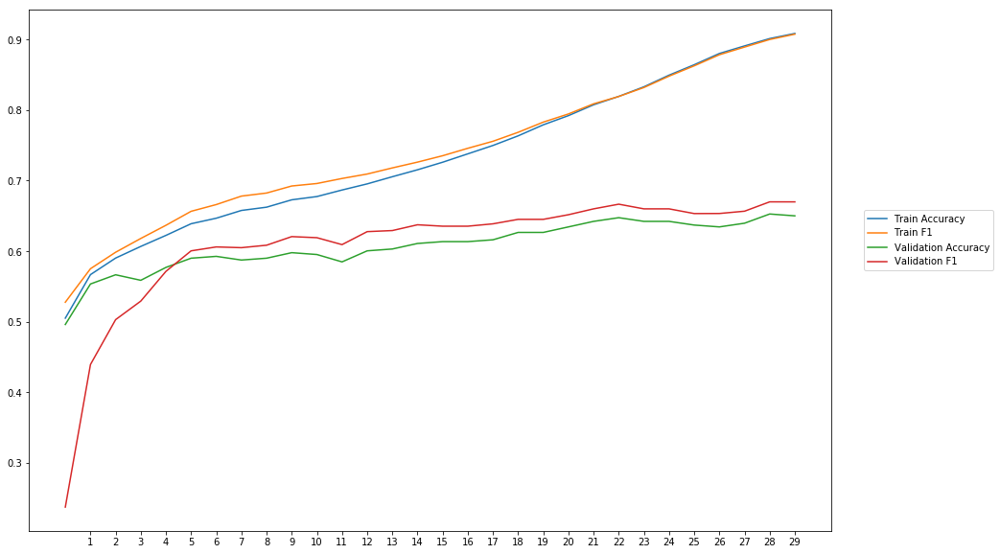

Average Accuracy: 60.75%
Average Precision: 59.82%
Average Recall: 62.98%
Average F1: 60.82%

-------Overallresults-------


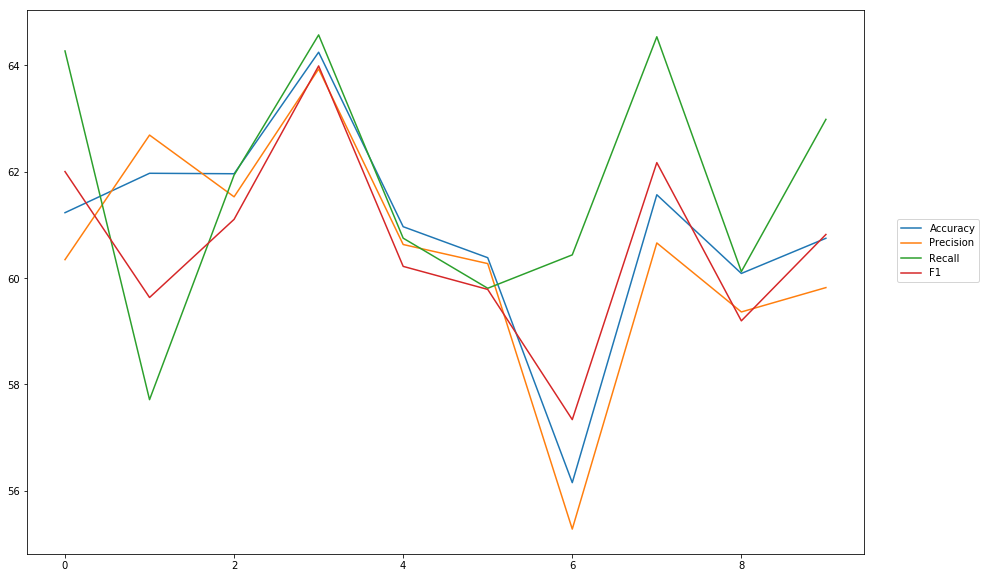

Accuracy: Mean = 60.93% (+/- 1.94%), Max = 64.25%, Min =  56.15%
Precision: Mean = 60.45% (+/- 2.16%), Max = 63.93%, Min =  55.28%
Recall: Mean = 61.71% (+/- 2.22%), Max = 64.57%, Min =  57.71%
F1: Mean = 60.63% (+/- 1.75%), Max = 63.99%, Min =  57.34%


In [20]:
cross_val_three_inputs(model_5, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Embedding01')

### weigth decay = 0,1

In [21]:
#Word Embeddings
wv_layer_6 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer=regularizers.l2(0.1))

input_embedding_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_6 = wv_layer_6(input_embedding_6)
x_embedding_6 = Dense(600, activation='relu')(embedded_sequences_6)
x_embedding_6 = Flatten()(x_embedding_6)

#Sentiment Features
input_sentiment_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_6 = Dense(600, activation='relu')(input_sentiment_6)

#POS Features
input_pos_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_6 = Dense(600, activation='relu')(input_pos_6)

#Concatination
concat_6 = concatenate([x_embedding_6, x_sentiment_6, x_pos_6])

preds_6 = Dense(2, activation='softmax')(concat_6)

model_6 = Model(inputs=[input_embedding_6, input_sentiment_6, input_pos_6], outputs=preds_6)


-----Fold 1--------


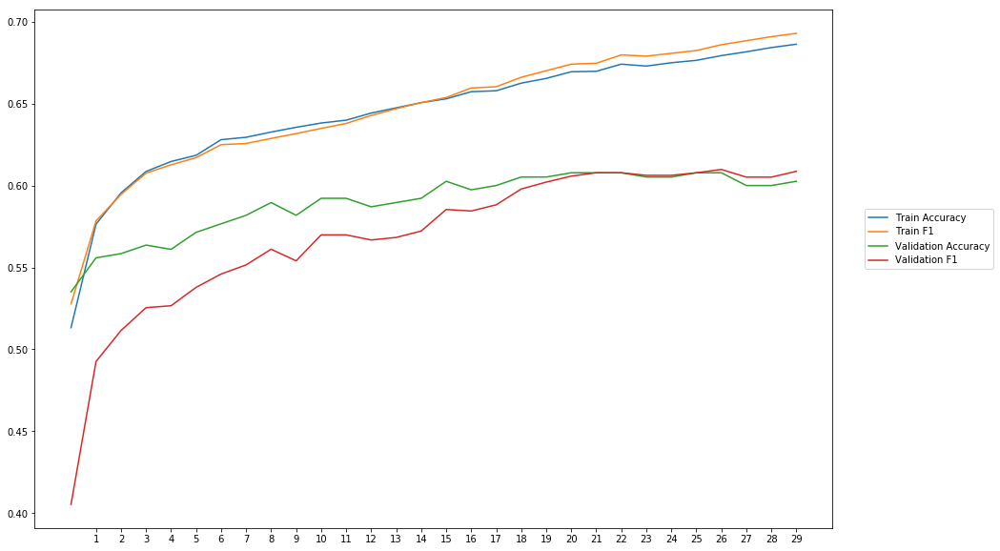

Average Accuracy: 58.97%
Average Precision: 59.51%
Average Recall: 54.93%
Average F1: 56.96%

-----Fold 2--------


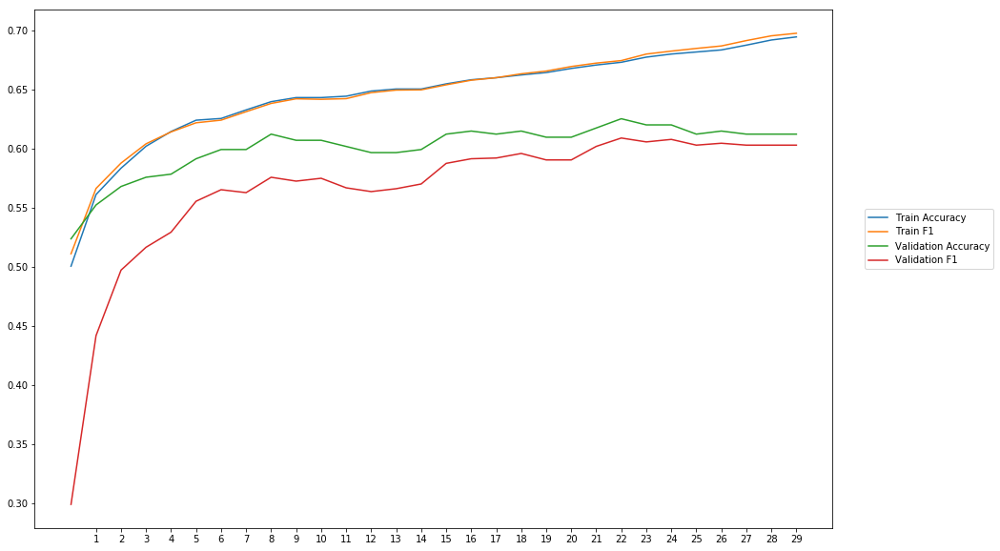

Average Accuracy: 60.07%
Average Precision: 61.28%
Average Recall: 52.88%
Average F1: 56.46%

-----Fold 3--------


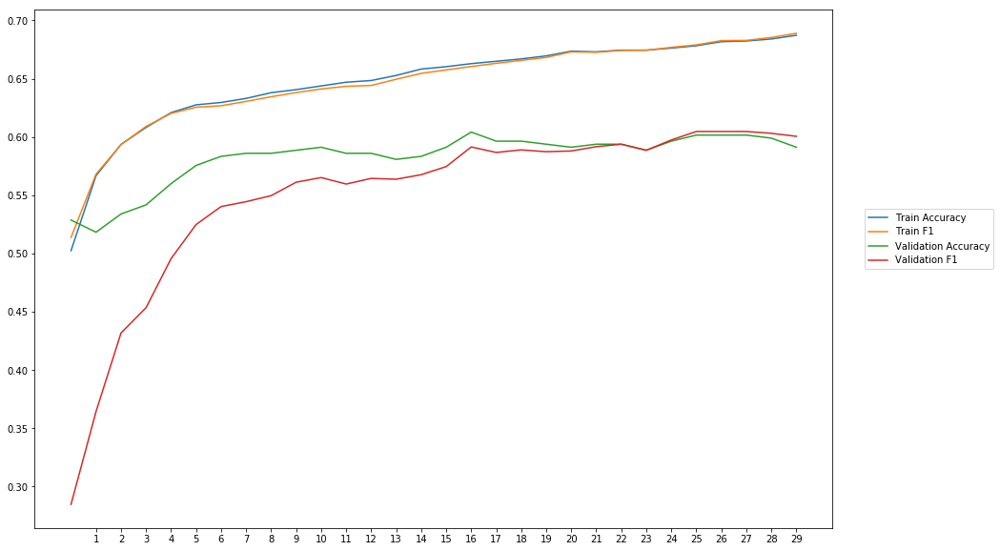

Average Accuracy: 58.23%
Average Precision: 58.83%
Average Recall: 52.46%
Average F1: 54.92%

-----Fold 4--------


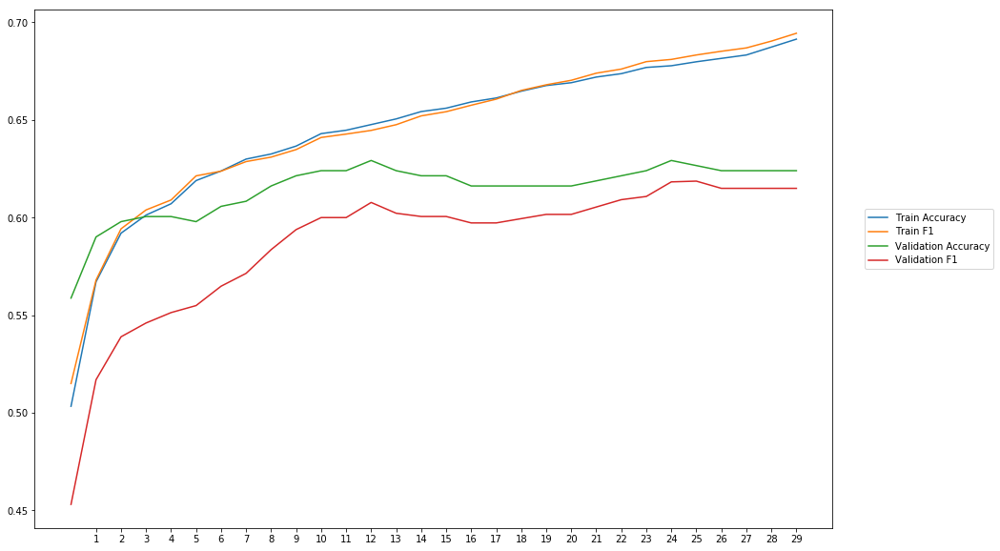

Average Accuracy: 61.46%
Average Precision: 62.91%
Average Recall: 55.24%
Average F1: 58.68%

-----Fold 5--------


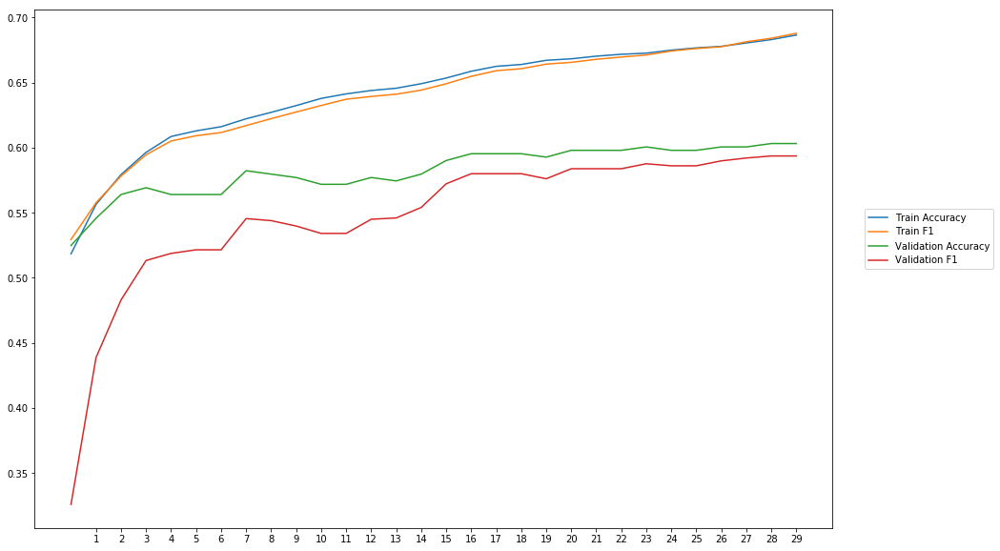

Average Accuracy: 58.25%
Average Precision: 59.27%
Average Recall: 51.40%
Average F1: 54.78%

-----Fold 6--------


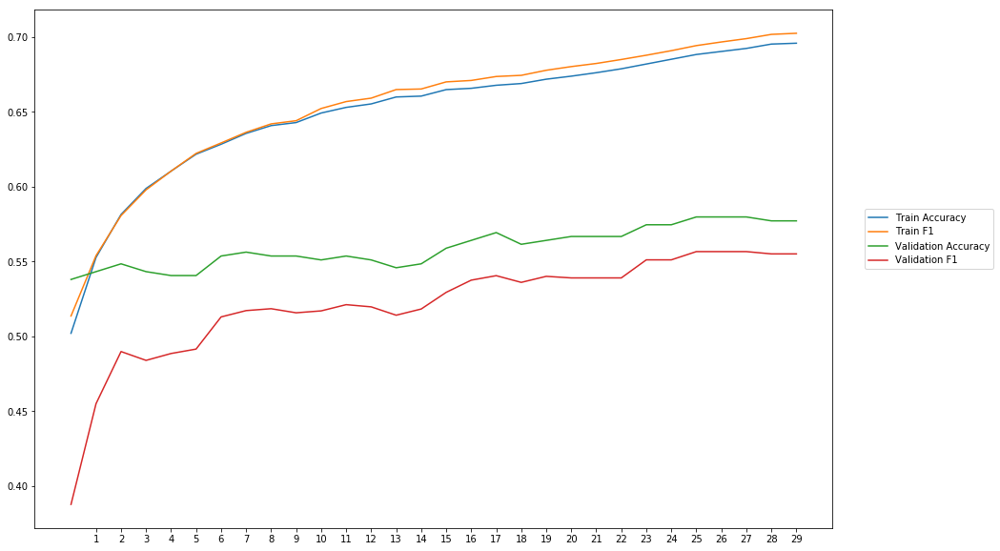

Average Accuracy: 55.93%
Average Precision: 56.80%
Average Recall: 48.34%
Average F1: 52.10%

-----Fold 7--------


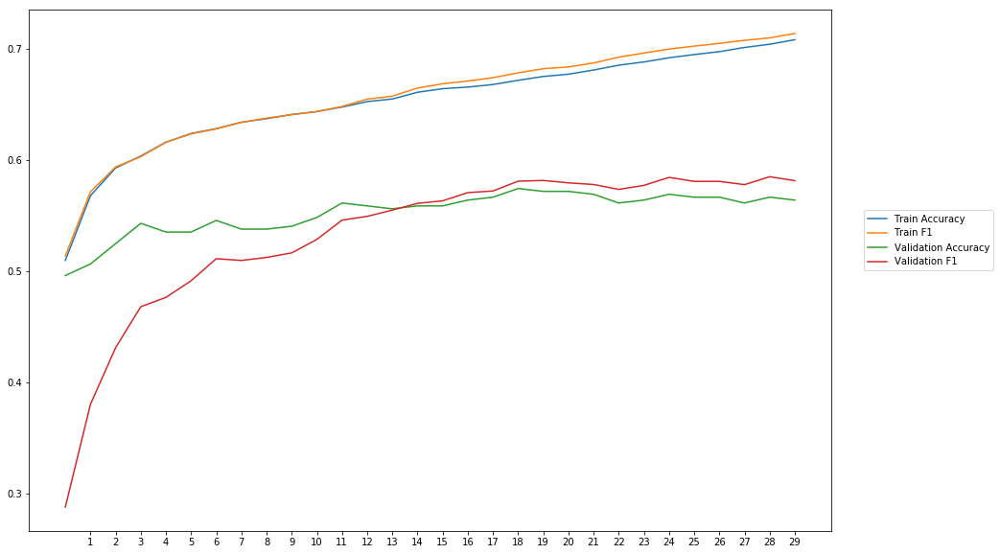

Average Accuracy: 55.27%
Average Precision: 55.21%
Average Recall: 52.36%
Average F1: 53.31%

-----Fold 8--------


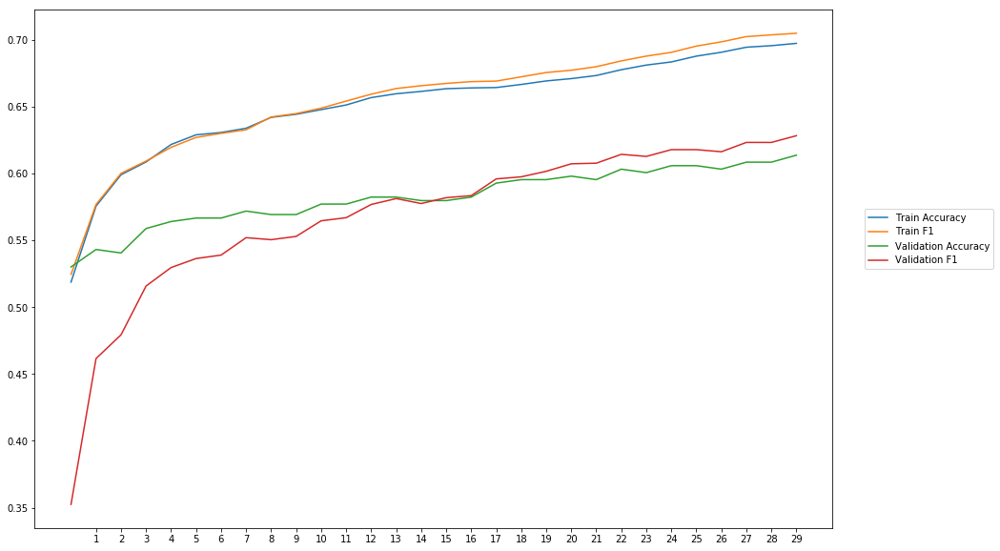

Average Accuracy: 58.22%
Average Precision: 58.29%
Average Recall: 56.16%
Average F1: 56.88%

-----Fold 9--------


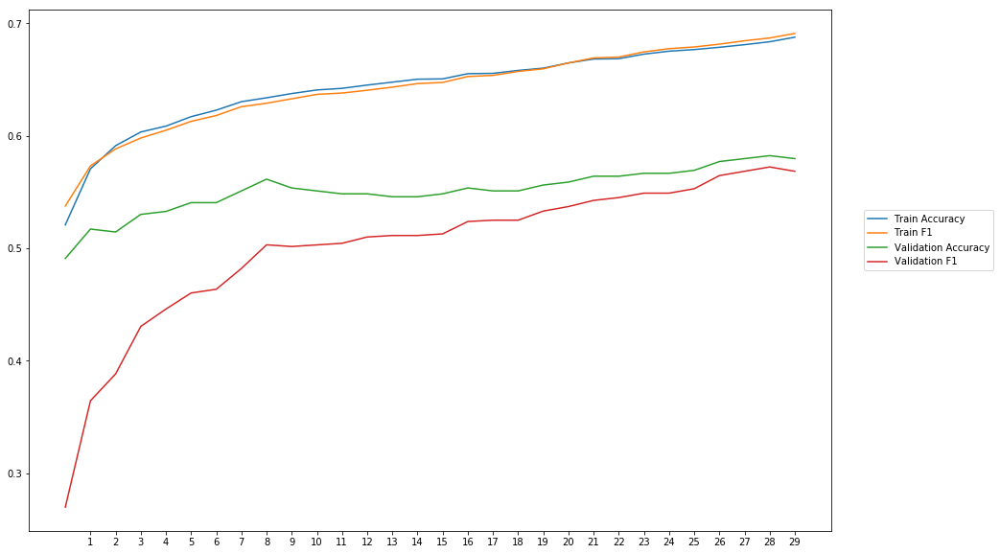

Average Accuracy: 55.13%
Average Precision: 55.81%
Average Recall: 45.97%
Average F1: 50.05%

-----Fold 10--------


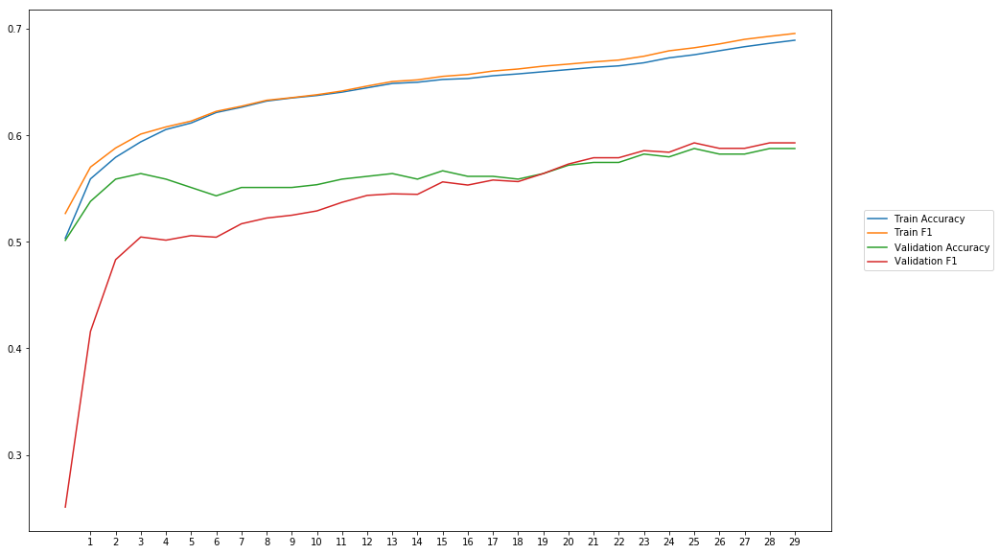

Average Accuracy: 56.28%
Average Precision: 56.61%
Average Recall: 51.62%
Average F1: 53.57%

-------Overallresults-------


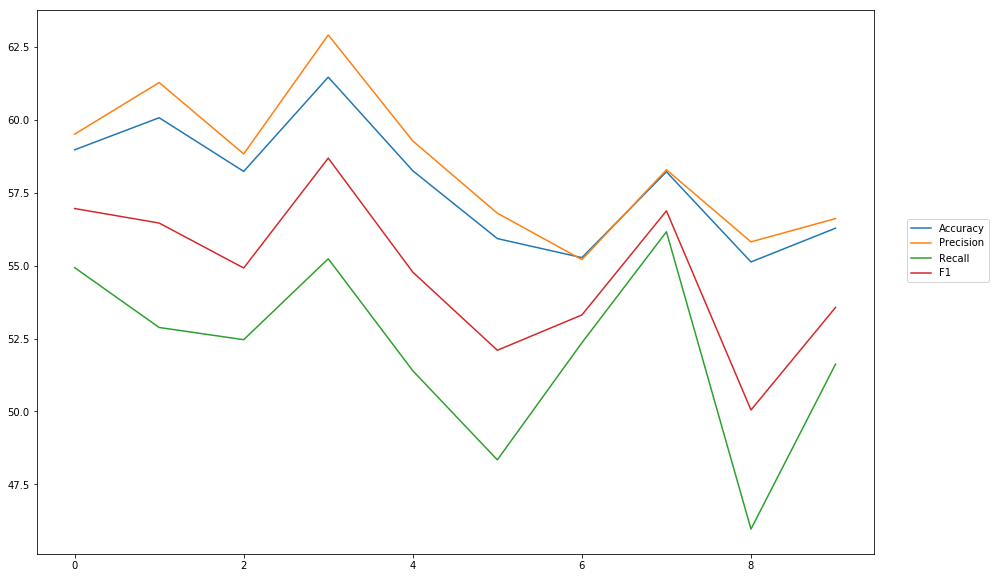

Accuracy: Mean = 57.78% (+/- 2.00%), Max = 61.46%, Min =  55.13%
Precision: Mean = 58.45% (+/- 2.31%), Max = 62.91%, Min =  55.21%
Recall: Mean = 52.14% (+/- 2.96%), Max = 56.16%, Min =  45.97%
F1: Mean = 54.77% (+/- 2.46%), Max = 58.68%, Min =  50.05%


In [22]:
cross_val_three_inputs(model_6, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Embedding1')

# L1 for hidden layer

### weigth decay = 0,001

In [23]:
#Word Embeddings
wv_layer_7 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_7 = wv_layer_7(input_embedding_7)
x_embedding_7 = Dense(600, activation='relu',kernel_regularizer=regularizers.l1(0.001))(embedded_sequences_7)
x_embedding_7 = Flatten()(x_embedding_7)

#Sentiment Features
input_sentiment_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_7 = Dense(600, activation='relu',kernel_regularizer=regularizers.l1(0.001))(input_sentiment_7)

#POS Features
input_pos_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_7 = Dense(600, activation='relu',kernel_regularizer=regularizers.l1(0.001))(input_pos_7)

#Concatination
concat_7 = concatenate([x_embedding_7, x_sentiment_7, x_pos_7])

preds_7 = Dense(2, activation='softmax')(concat_7)

model_7 = Model(inputs=[input_embedding_7, input_sentiment_7, input_pos_7], outputs=preds_7)


-----Fold 1--------


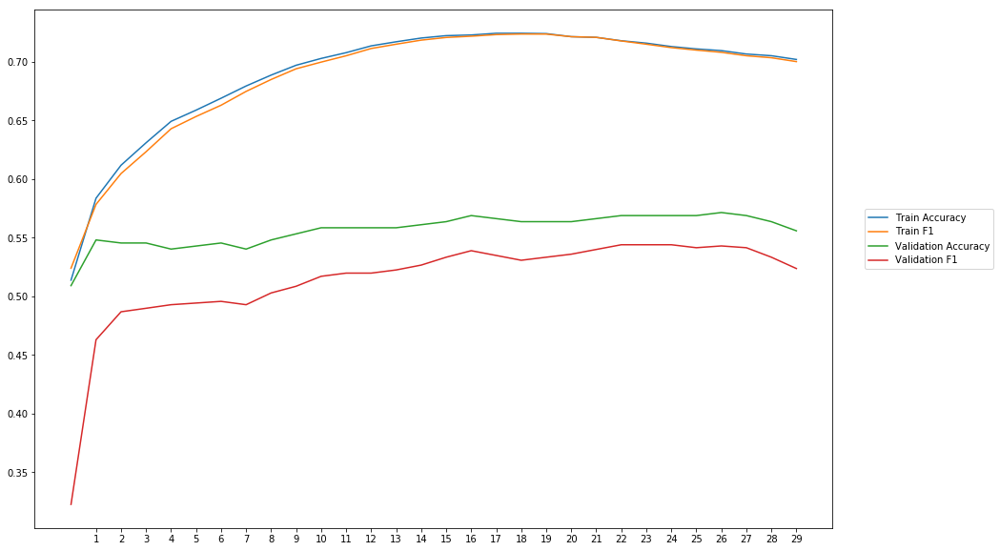

Average Accuracy: 55.68%
Average Precision: 56.56%
Average Recall: 47.33%
Average F1: 51.39%

-----Fold 2--------


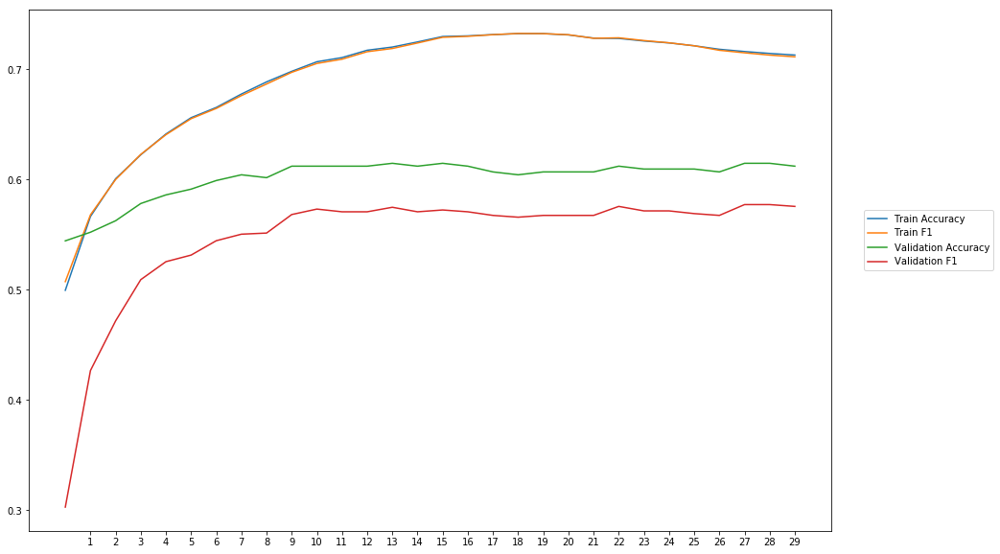

Average Accuracy: 60.13%
Average Precision: 62.63%
Average Recall: 48.99%
Average F1: 54.68%

-----Fold 3--------


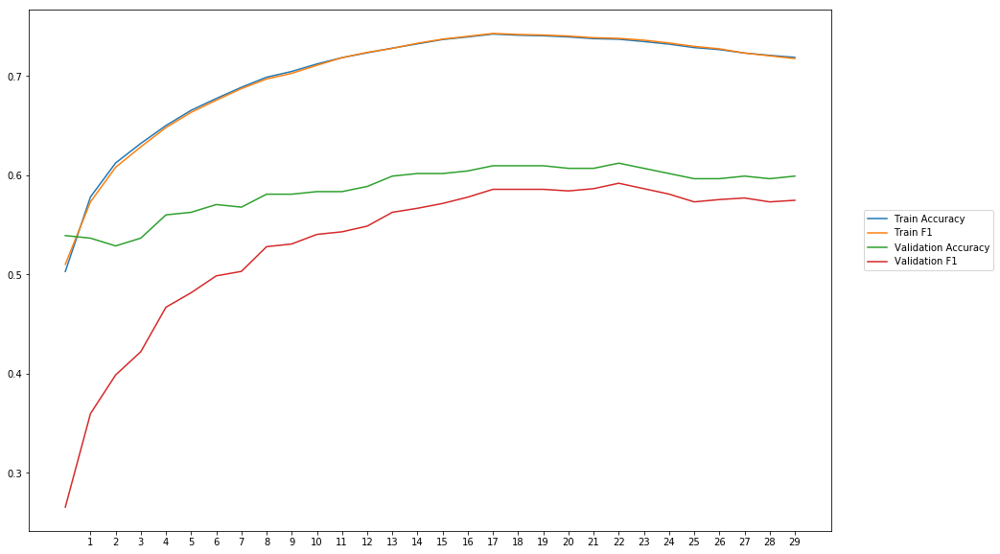

Average Accuracy: 58.58%
Average Precision: 60.32%
Average Recall: 48.34%
Average F1: 53.08%

-----Fold 4--------


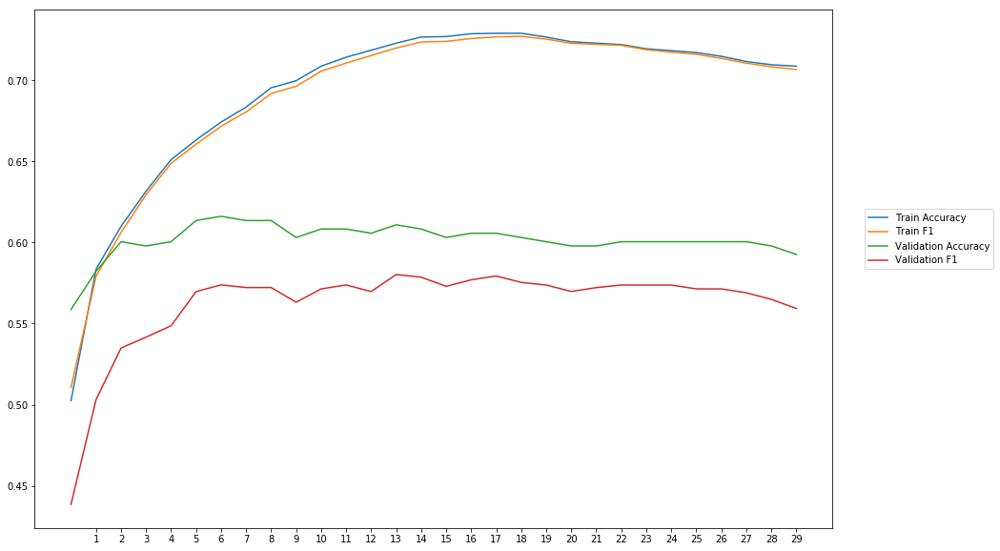

Average Accuracy: 60.17%
Average Precision: 62.14%
Average Recall: 51.52%
Average F1: 56.24%

-----Fold 5--------


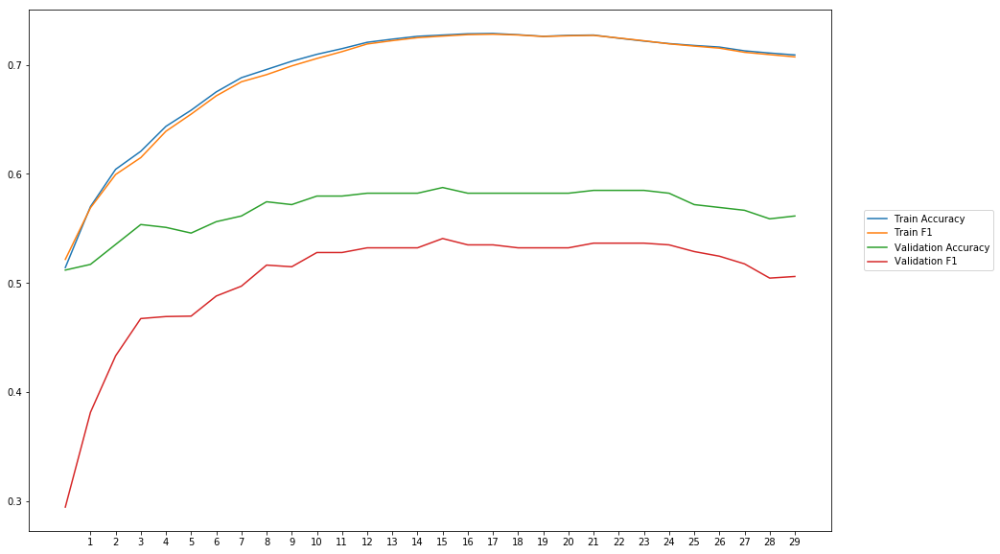

Average Accuracy: 56.82%
Average Precision: 58.69%
Average Recall: 44.42%
Average F1: 50.38%

-----Fold 6--------


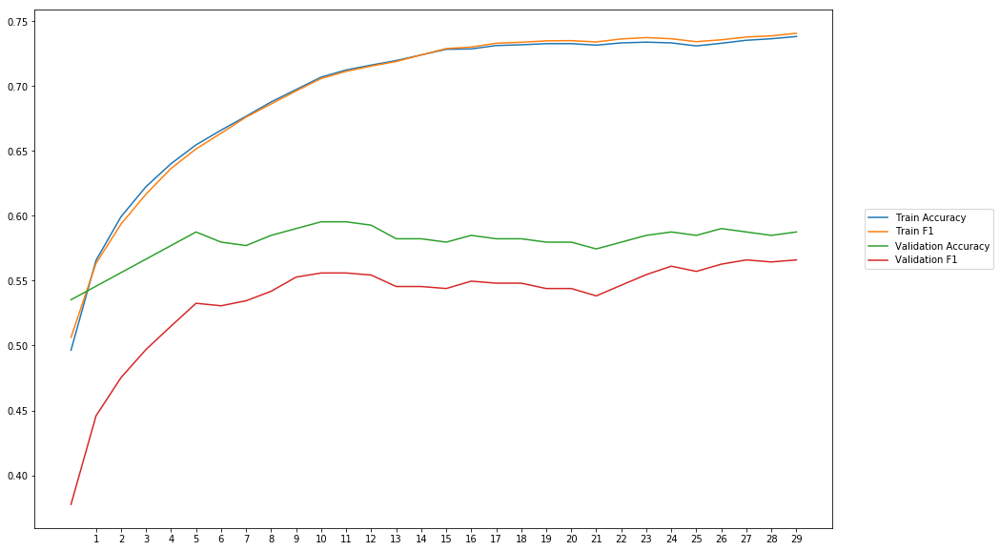

Average Accuracy: 57.99%
Average Precision: 59.56%
Average Recall: 48.83%
Average F1: 53.51%

-----Fold 7--------


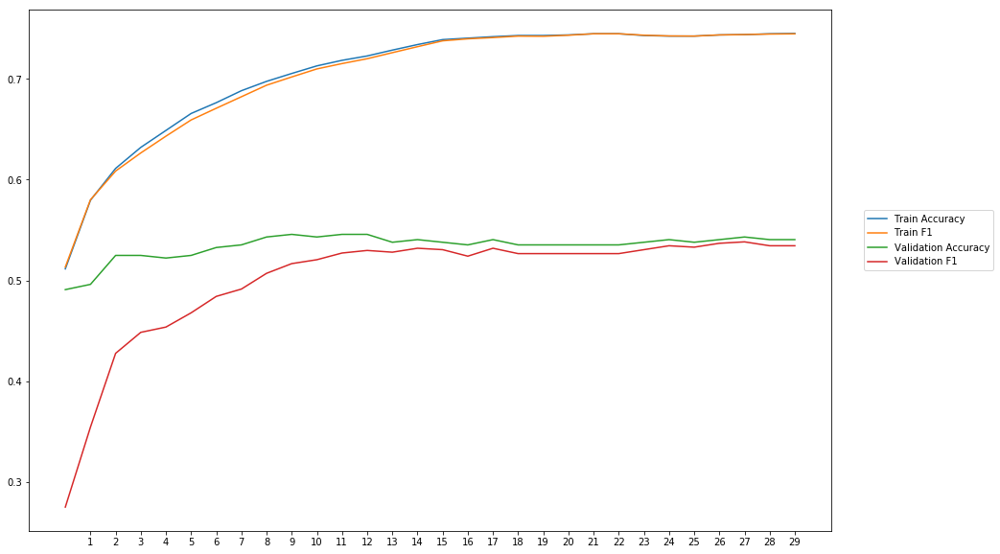

Average Accuracy: 53.41%
Average Precision: 53.52%
Average Recall: 47.66%
Average F1: 50.08%

-----Fold 8--------


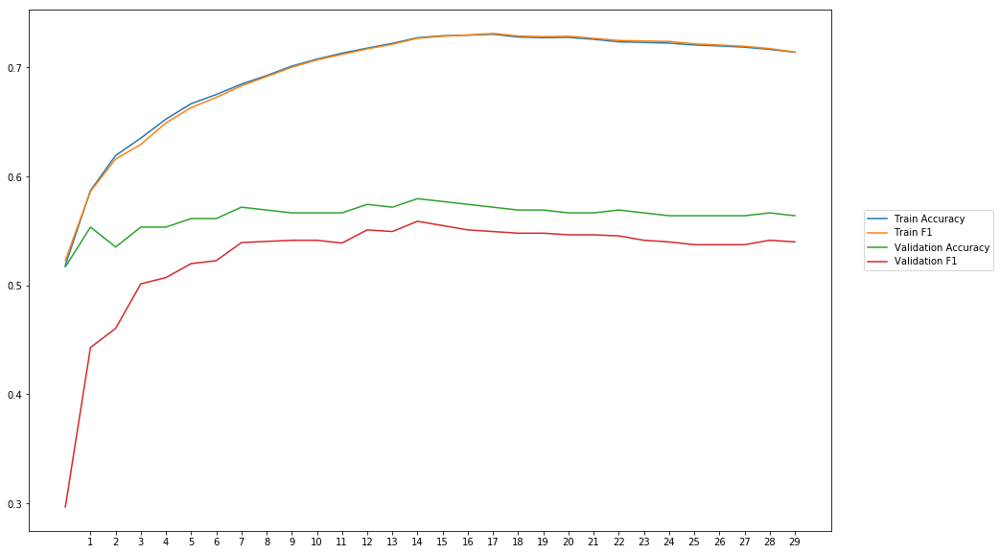

Average Accuracy: 56.40%
Average Precision: 57.27%
Average Recall: 49.06%
Average F1: 52.59%

-----Fold 9--------


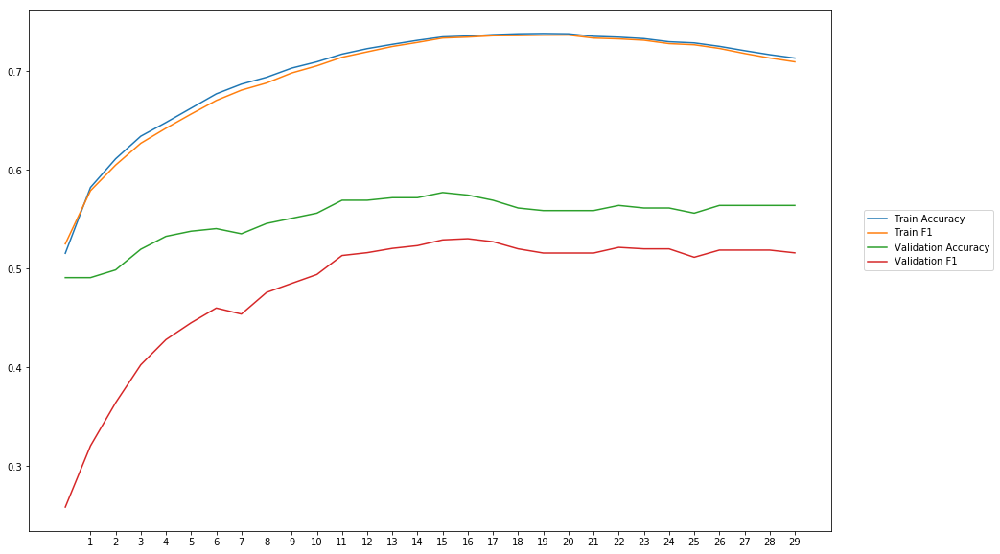

Average Accuracy: 55.13%
Average Precision: 56.27%
Average Recall: 42.55%
Average F1: 48.20%

-----Fold 10--------


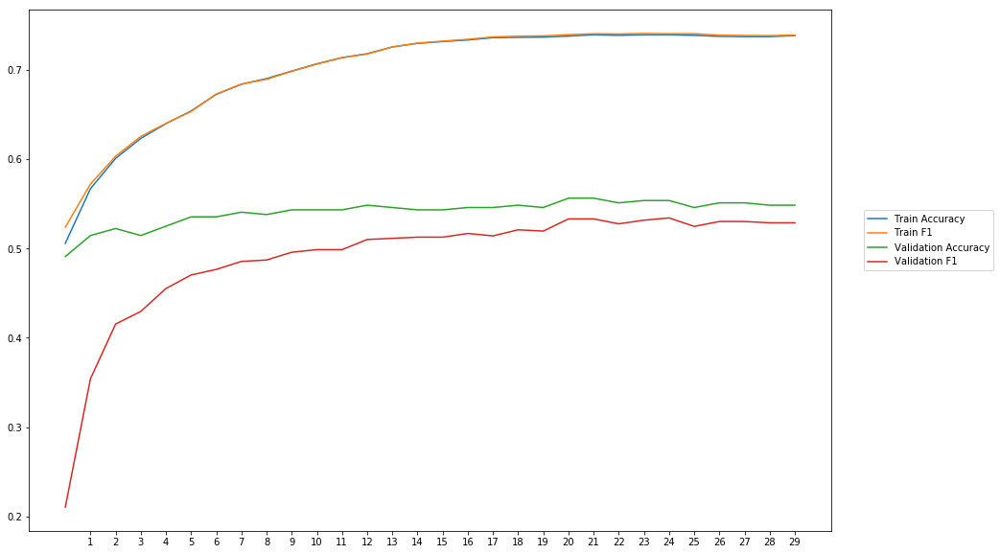

Average Accuracy: 54.08%
Average Precision: 54.55%
Average Recall: 45.06%
Average F1: 48.98%

-------Overallresults-------


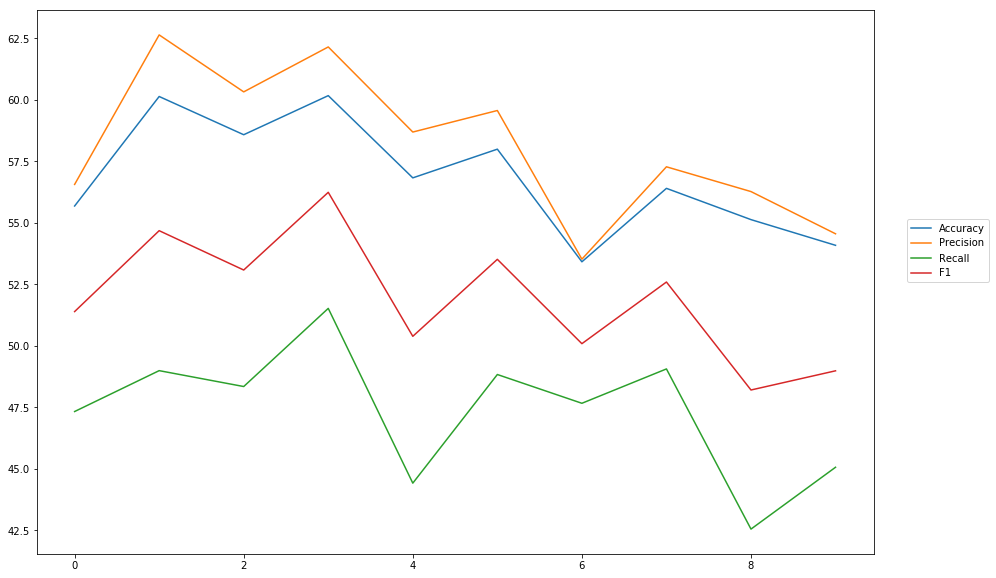

Accuracy: Mean = 56.84% (+/- 2.24%), Max = 60.17%, Min =  53.41%
Precision: Mean = 58.15% (+/- 2.90%), Max = 62.63%, Min =  53.52%
Recall: Mean = 47.37% (+/- 2.51%), Max = 51.52%, Min =  42.55%
F1: Mean = 51.91% (+/- 2.43%), Max = 56.24%, Min =  48.20%


In [24]:
cross_val_three_inputs(model_7, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Hidden001')

### weigth decay = 0,01

In [25]:
#Word Embeddings
wv_layer_8 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_8 = wv_layer_8(input_embedding_8)
x_embedding_8 = Dense(600, activation='relu',kernel_regularizer=regularizers.l1(0.01))(embedded_sequences_8)
x_embedding_8 = Flatten()(x_embedding_8)

#Sentiment Features
input_sentiment_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_8 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.01))(input_sentiment_8)

#POS Features
input_pos_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_8 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.01))(input_pos_8)

#Concatination
concat_8 = concatenate([x_embedding_8, x_sentiment_8, x_pos_8])

preds_8 = Dense(2, activation='softmax')(concat_8)

model_8 = Model(inputs=[input_embedding_8, input_sentiment_8, input_pos_8], outputs=preds_8)


-----Fold 1--------


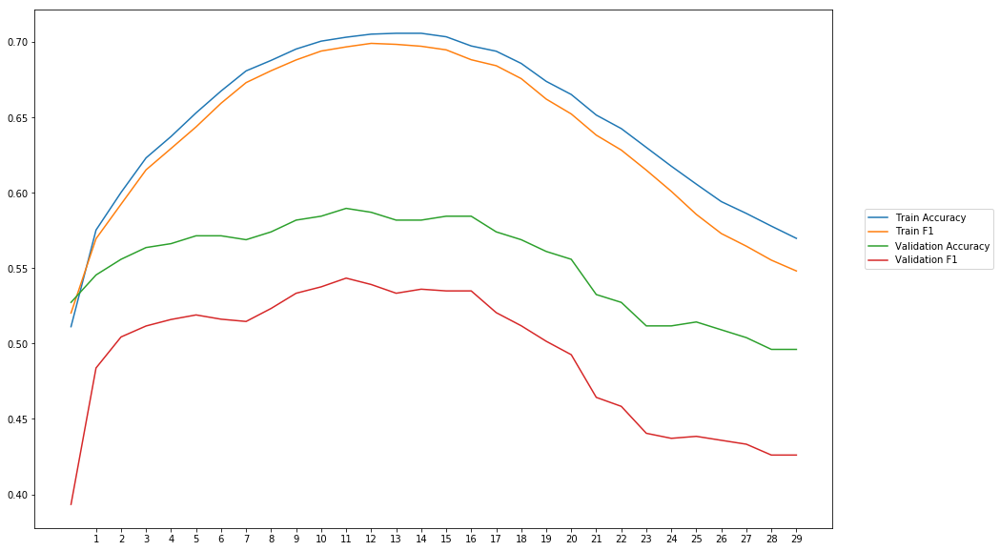

Average Accuracy: 55.27%
Average Precision: 56.61%
Average Recall: 43.58%
Average F1: 49.20%

-----Fold 2--------


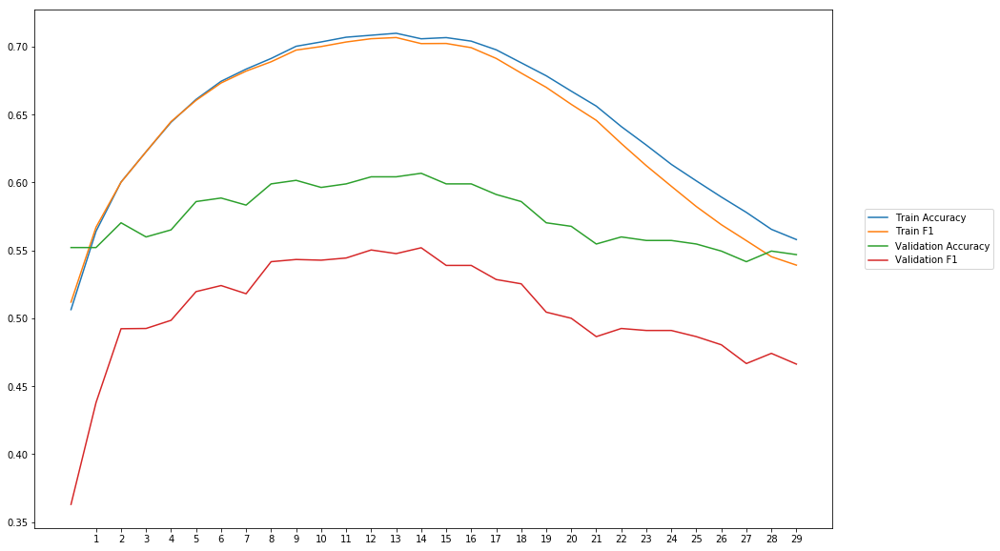

Average Accuracy: 57.51%
Average Precision: 59.98%
Average Recall: 43.73%
Average F1: 50.46%

-----Fold 3--------


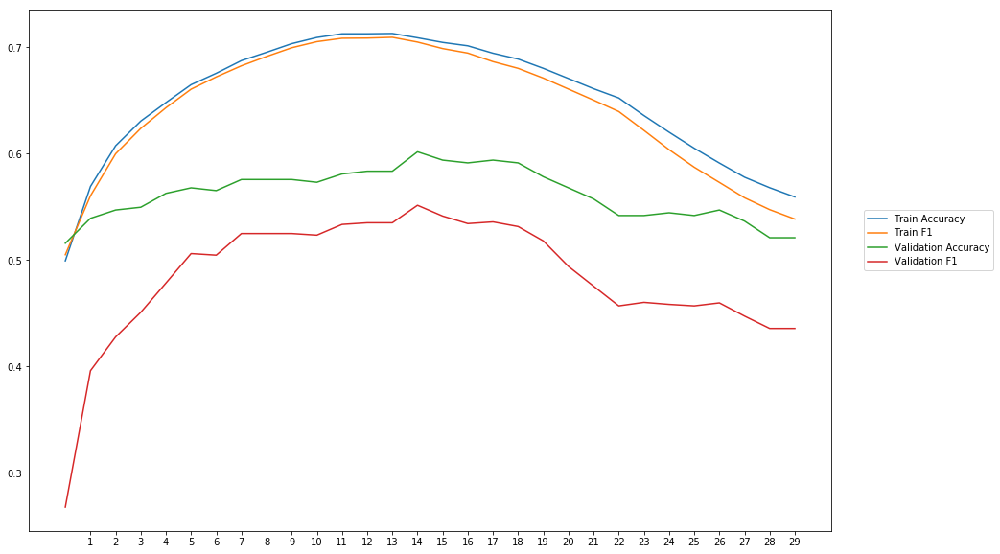

Average Accuracy: 56.21%
Average Precision: 58.14%
Average Recall: 41.82%
Average F1: 48.41%

-----Fold 4--------


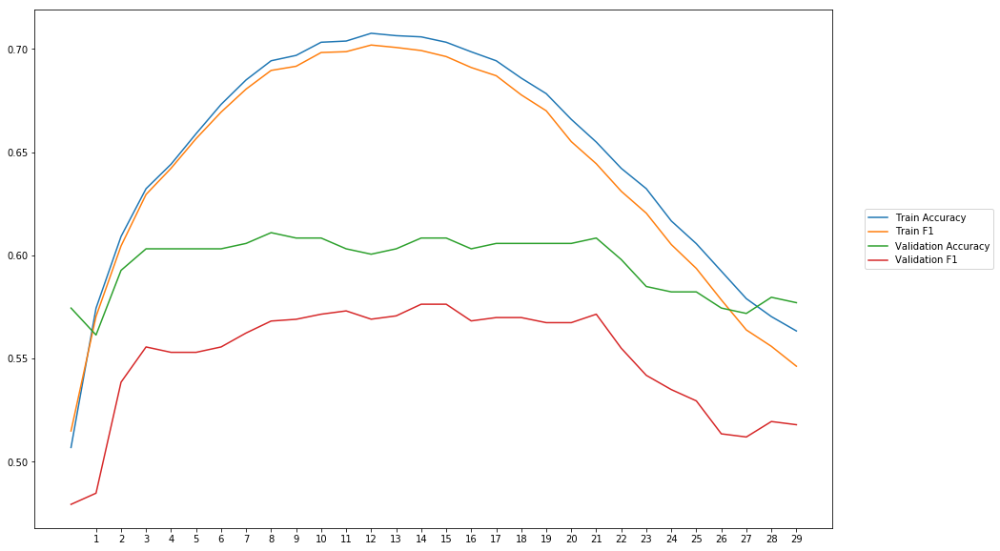

Average Accuracy: 59.61%
Average Precision: 61.82%
Average Recall: 49.58%
Average F1: 54.98%

-----Fold 5--------


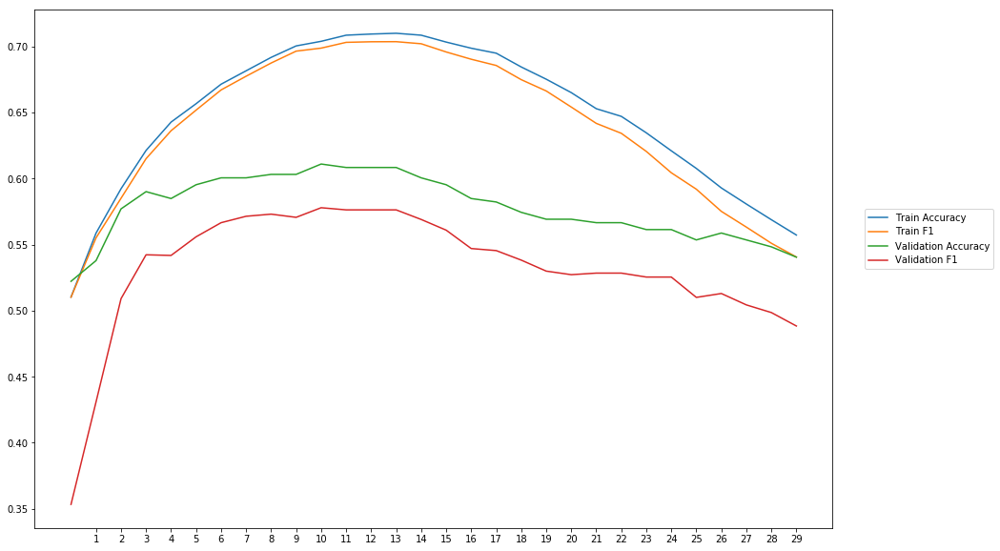

Average Accuracy: 57.79%
Average Precision: 59.29%
Average Recall: 48.46%
Average F1: 53.20%

-----Fold 6--------


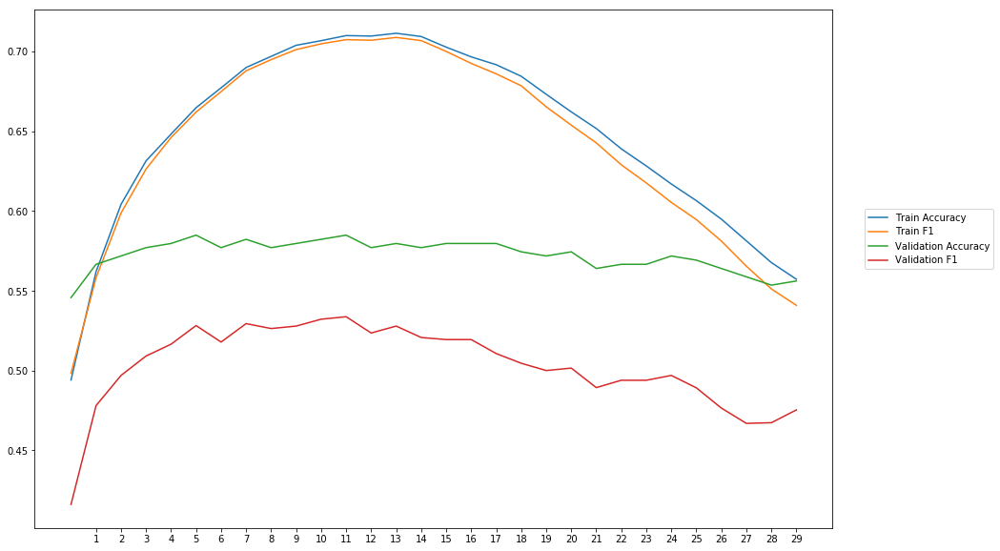

Average Accuracy: 57.24%
Average Precision: 59.76%
Average Recall: 43.51%
Average F1: 50.30%

-----Fold 7--------


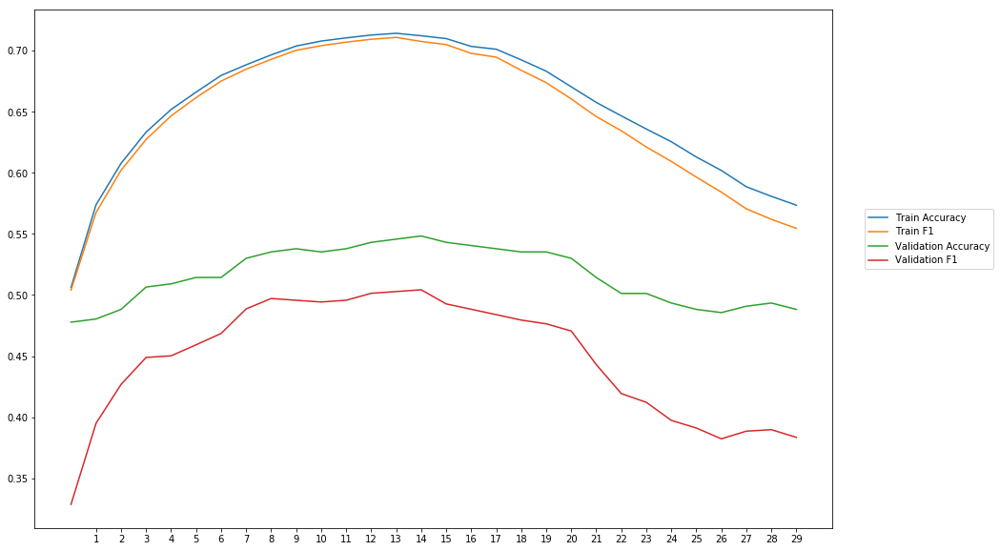

Average Accuracy: 51.61%
Average Precision: 51.70%
Average Recall: 39.77%
Average F1: 44.86%

-----Fold 8--------


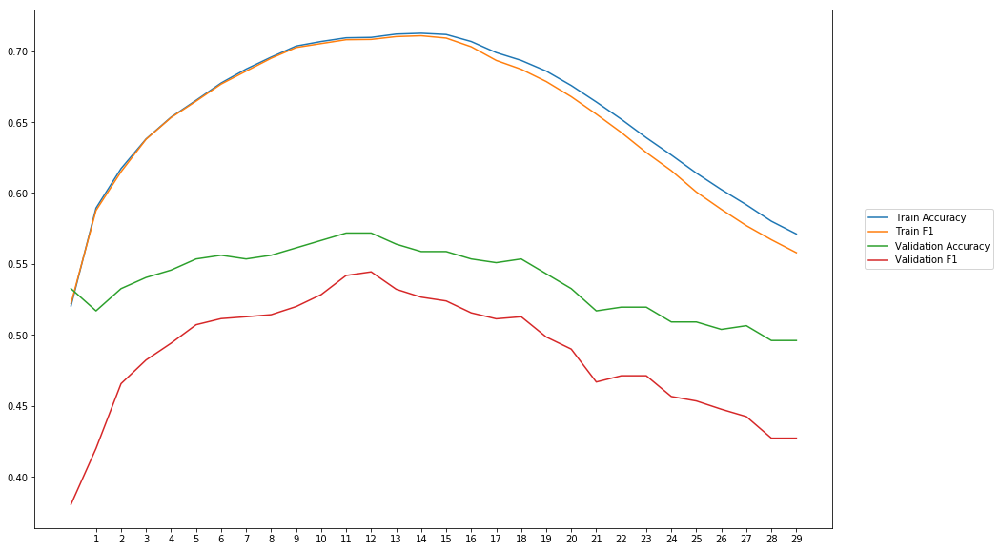

Average Accuracy: 53.84%
Average Precision: 54.53%
Average Recall: 44.10%
Average F1: 48.66%

-----Fold 9--------


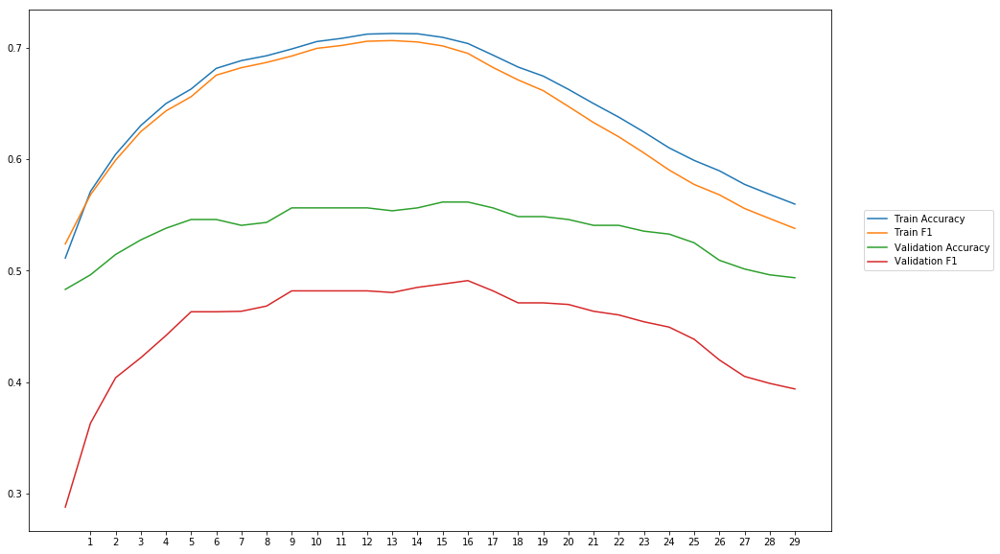

Average Accuracy: 53.54%
Average Precision: 54.77%
Average Recall: 37.91%
Average F1: 44.74%

-----Fold 10--------


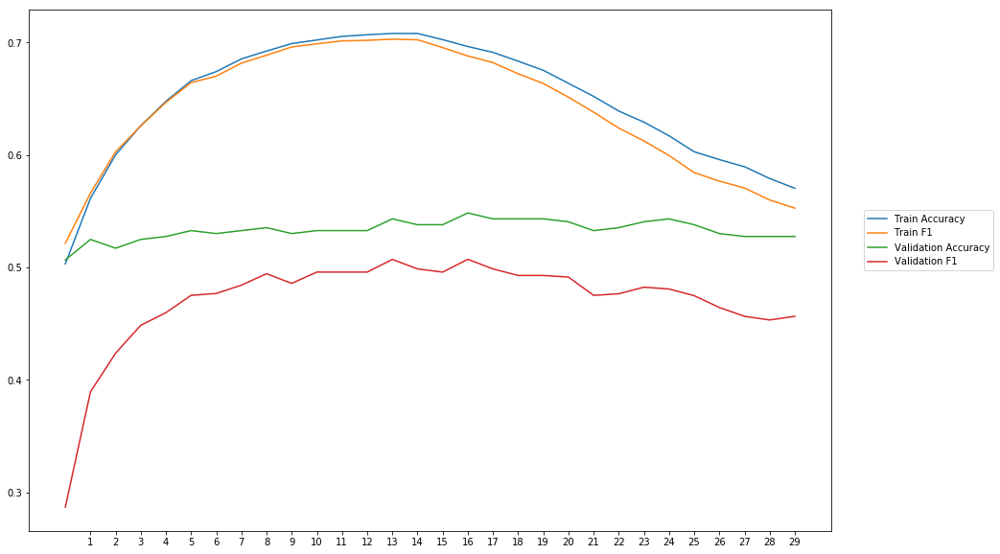

Average Accuracy: 53.32%
Average Precision: 54.07%
Average Recall: 41.95%
Average F1: 47.05%

-------Overallresults-------


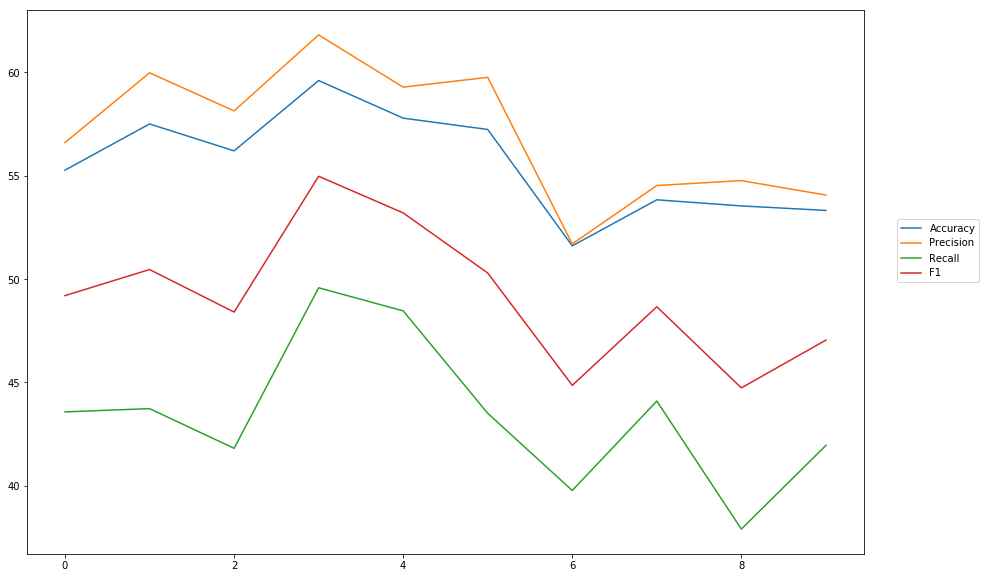

Accuracy: Mean = 55.59% (+/- 2.37%), Max = 59.61%, Min =  51.61%
Precision: Mean = 57.07% (+/- 3.07%), Max = 61.82%, Min =  51.70%
Recall: Mean = 43.44% (+/- 3.35%), Max = 49.58%, Min =  37.91%
F1: Mean = 49.19% (+/- 3.11%), Max = 54.98%, Min =  44.74%


In [26]:
cross_val_three_inputs(model_8, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Hidden01')

### weigth decay = 0,1

In [27]:
#Word Embeddings
wv_layer_9 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_9 = wv_layer_9(input_embedding_9)
x_embedding_9 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.1))(embedded_sequences_9)
x_embedding_9 = Flatten()(x_embedding_9)

#Sentiment Features
input_sentiment_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_9 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.1))(input_sentiment_9)

#POS Features
input_pos_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_9 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.1))(input_pos_9)

#Concatination
concat_9 = concatenate([x_embedding_9, x_sentiment_9, x_pos_9])

preds_9 = Dense(2, activation='softmax')(concat_9)

model_9 = Model(inputs=[input_embedding_9, input_sentiment_9, input_pos_9], outputs=preds_9)


-----Fold 1--------


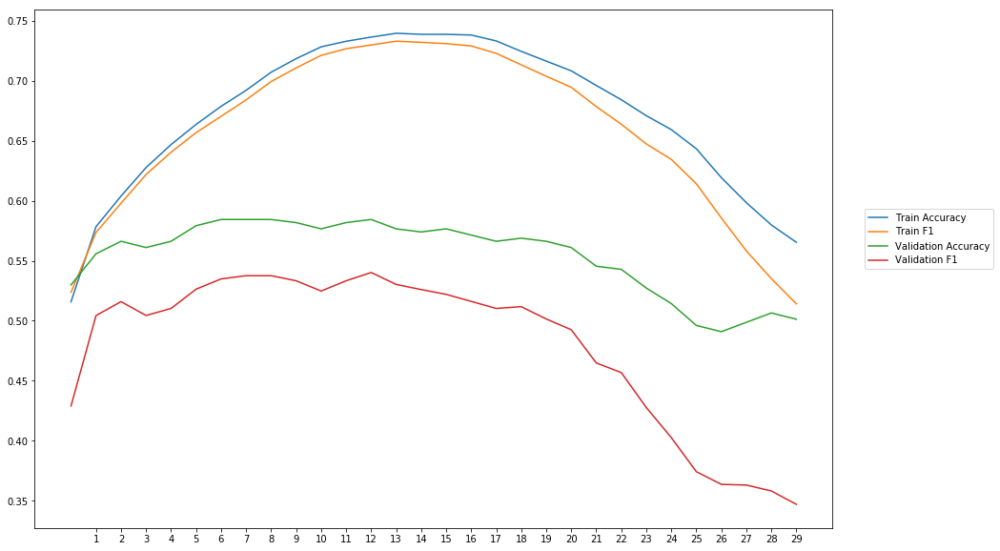

Average Accuracy: 55.40%
Average Precision: 56.82%
Average Recall: 41.79%
Average F1: 48.00%

-----Fold 2--------


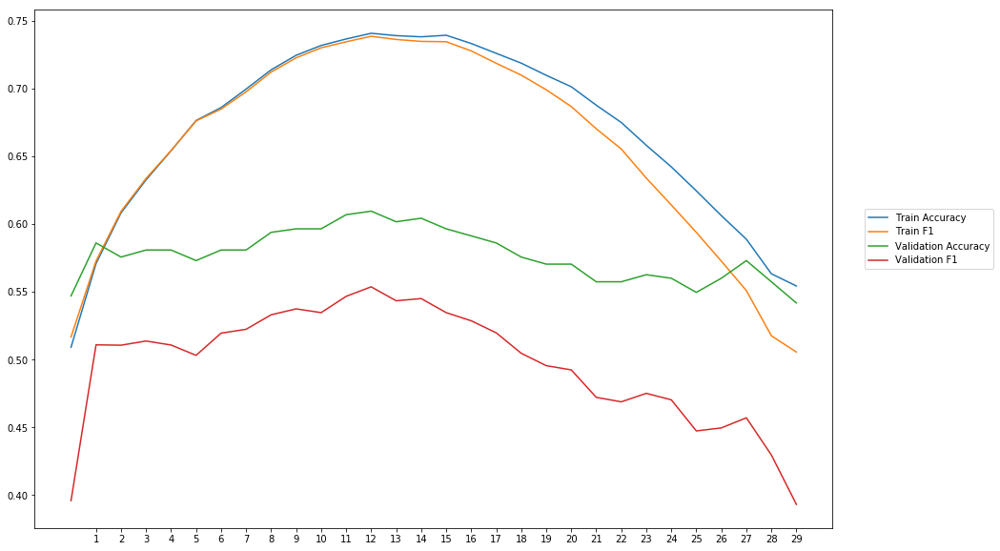

Average Accuracy: 57.73%
Average Precision: 60.69%
Average Recall: 42.30%
Average F1: 49.72%

-----Fold 3--------


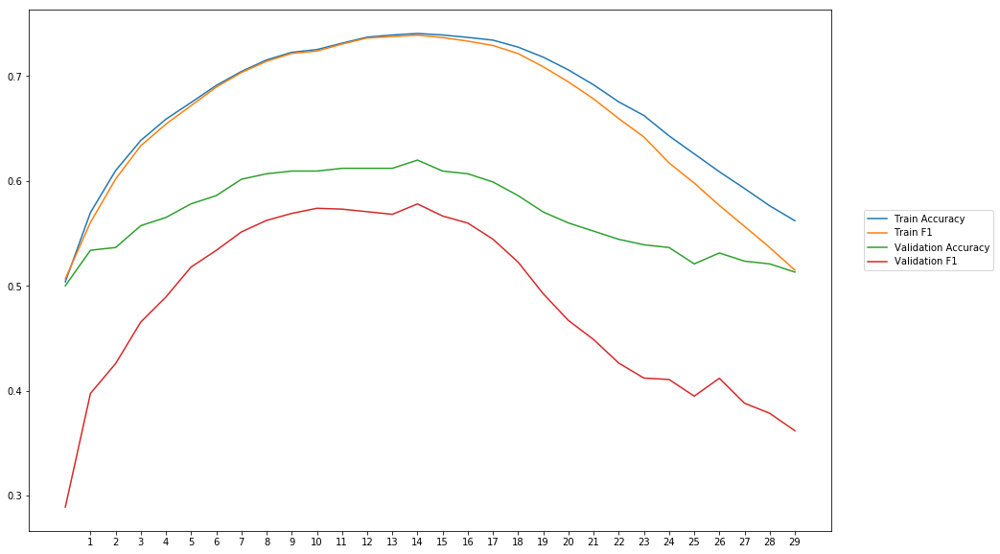

Average Accuracy: 56.84%
Average Precision: 58.91%
Average Recall: 41.19%
Average F1: 48.16%

-----Fold 4--------


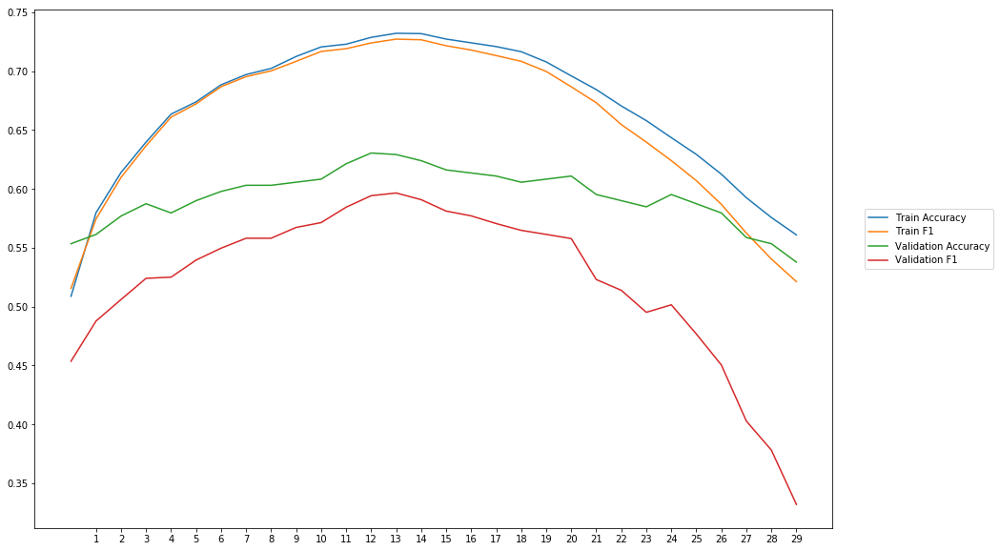

Average Accuracy: 59.40%
Average Precision: 62.73%
Average Recall: 45.50%
Average F1: 52.32%

-----Fold 5--------


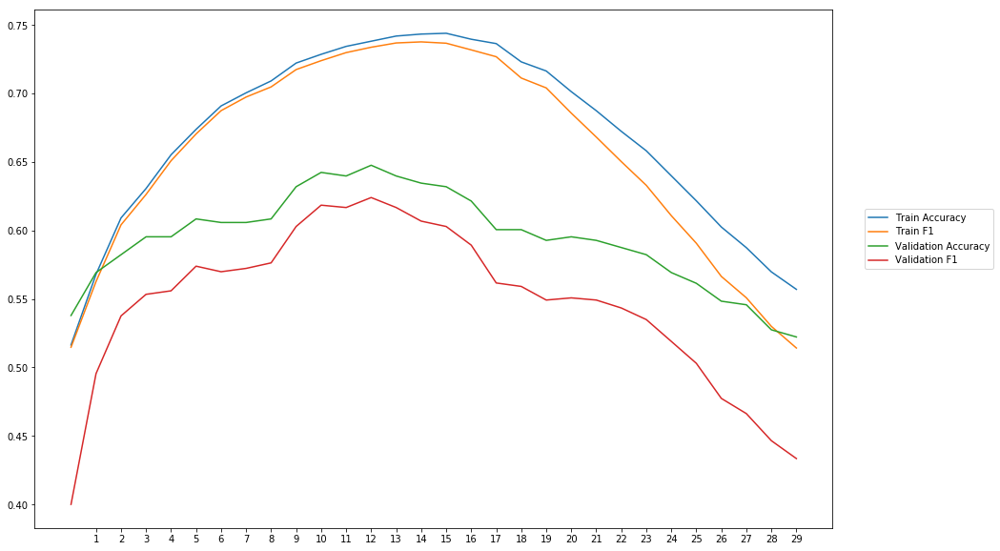

Average Accuracy: 59.41%
Average Precision: 61.29%
Average Recall: 49.55%
Average F1: 54.68%

-----Fold 6--------


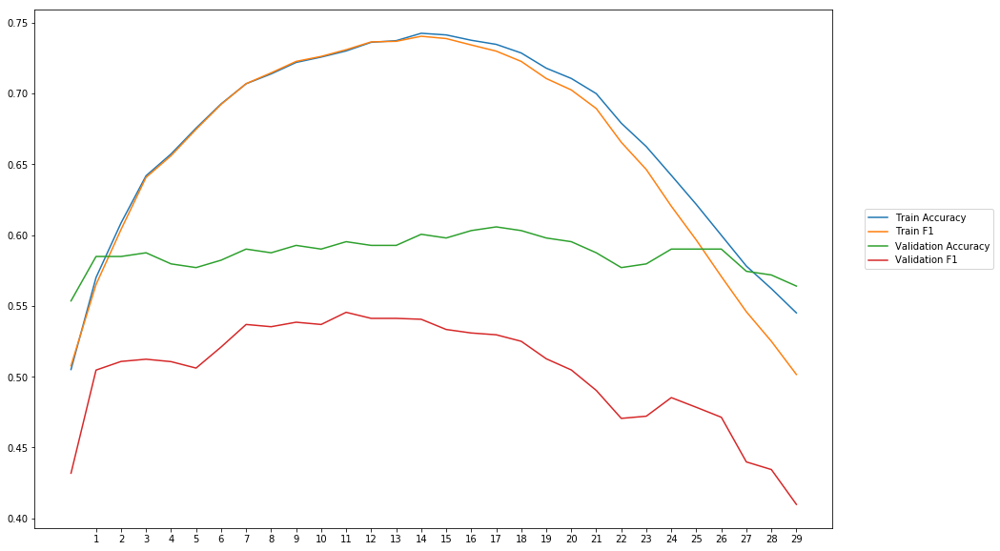

Average Accuracy: 58.73%
Average Precision: 62.92%
Average Recall: 42.25%
Average F1: 50.34%

-----Fold 7--------


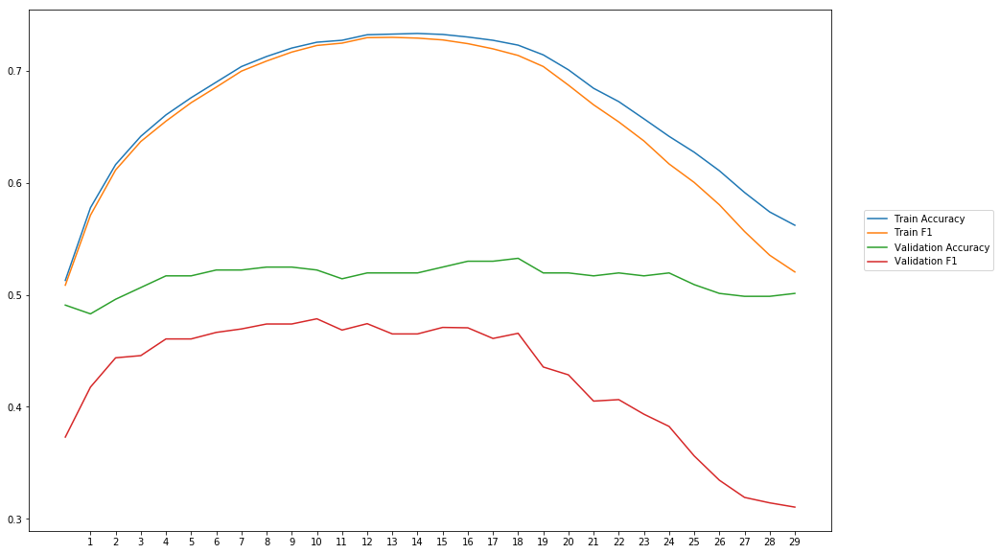

Average Accuracy: 51.46%
Average Precision: 51.78%
Average Recall: 36.74%
Average F1: 42.64%

-----Fold 8--------


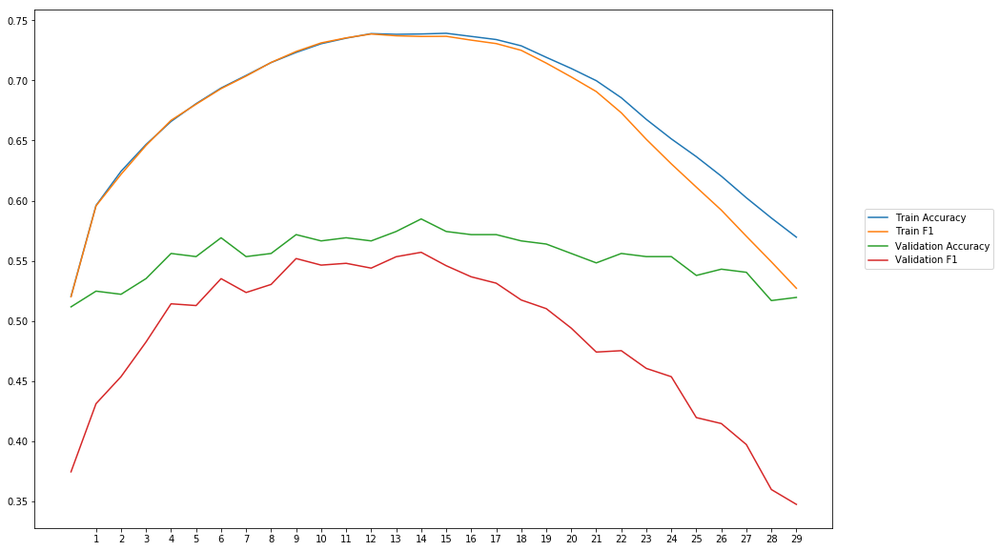

Average Accuracy: 55.30%
Average Precision: 56.64%
Average Recall: 43.26%
Average F1: 48.66%

-----Fold 9--------


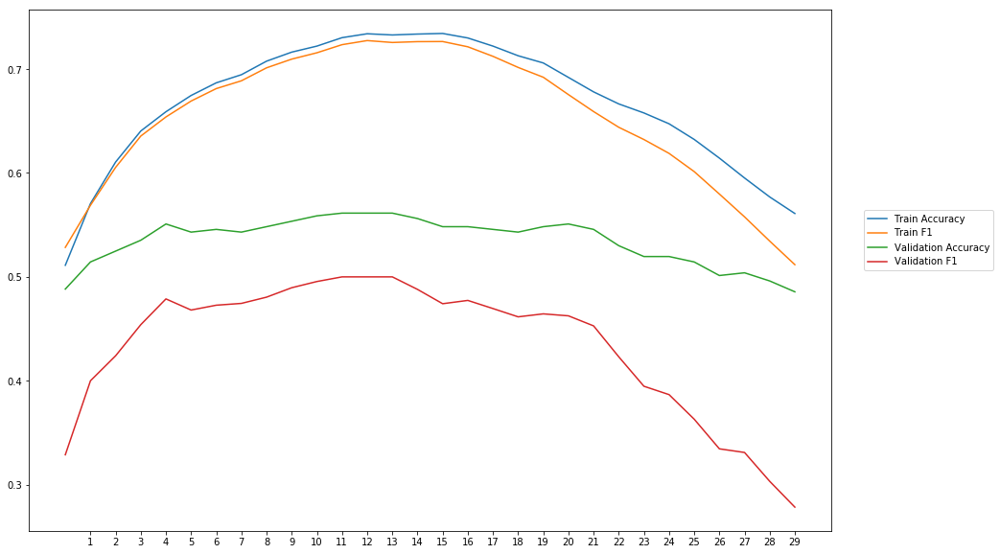

Average Accuracy: 53.49%
Average Precision: 54.65%
Average Recall: 36.37%
Average F1: 43.44%

-----Fold 10--------


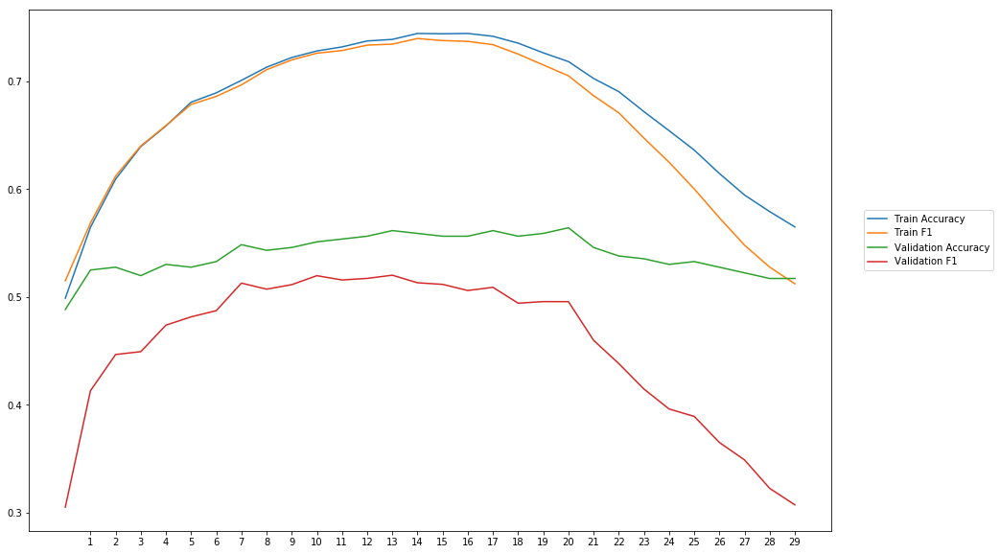

Average Accuracy: 53.95%
Average Precision: 55.23%
Average Recall: 39.28%
Average F1: 45.41%

-------Overallresults-------


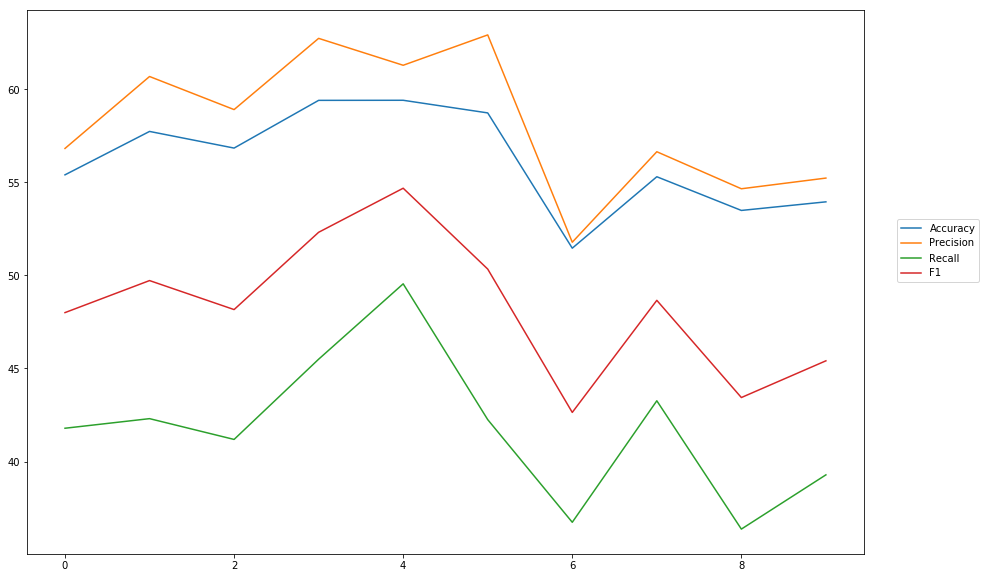

Accuracy: Mean = 56.17% (+/- 2.57%), Max = 59.41%, Min =  51.46%
Precision: Mean = 58.17% (+/- 3.55%), Max = 62.92%, Min =  51.78%
Recall: Mean = 41.82% (+/- 3.72%), Max = 49.55%, Min =  36.37%
F1: Mean = 48.34% (+/- 3.57%), Max = 54.68%, Min =  42.64%


In [28]:
cross_val_three_inputs(model_9, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Hidden1')

# L2 for hidden layer

### weigth decay = 0,001

In [12]:
#Word Embeddings
wv_layer_10 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_10 = wv_layer_10(input_embedding_10)
x_embedding_10 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.001))(embedded_sequences_10)
x_embedding_10 = Flatten()(x_embedding_10)

#Sentiment Features
input_sentiment_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_10 = Dense(600, activation='relu',  kernel_regularizer=regularizers.l2(0.001))(input_sentiment_10)

#POS Features
input_pos_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_10 = Dense(600, activation='relu',  kernel_regularizer=regularizers.l2(0.001))(input_pos_10)

#Concatination
concat_10 = concatenate([x_embedding_10, x_sentiment_10, x_pos_10])

preds_10 = Dense(2, activation='softmax')(concat_10)

model_10 = Model(inputs=[input_embedding_10, input_sentiment_10, input_pos_10], outputs=preds_10)


-----Fold 1--------


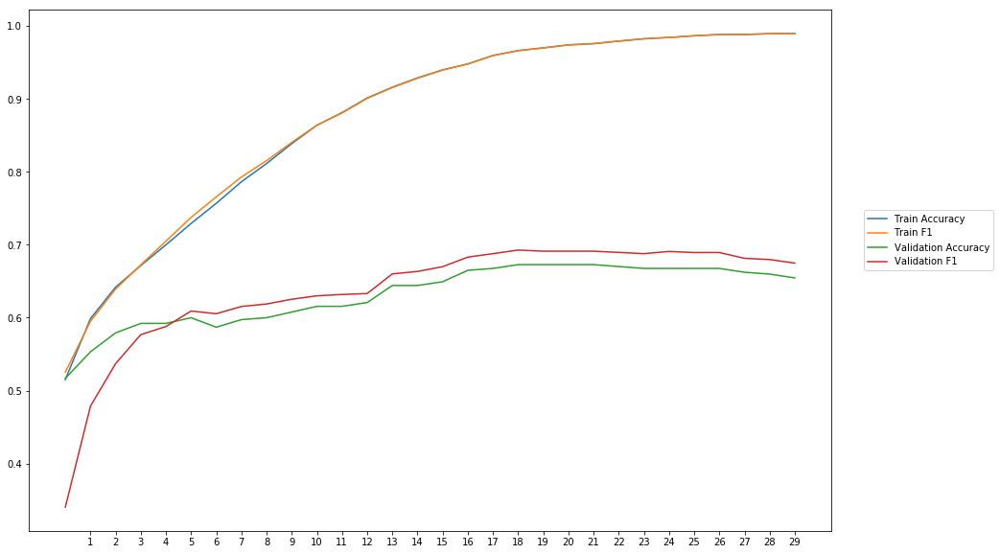

Average Accuracy: 63.19%
Average Precision: 62.01%
Average Recall: 66.16%
Average F1: 63.68%

-----Fold 2--------


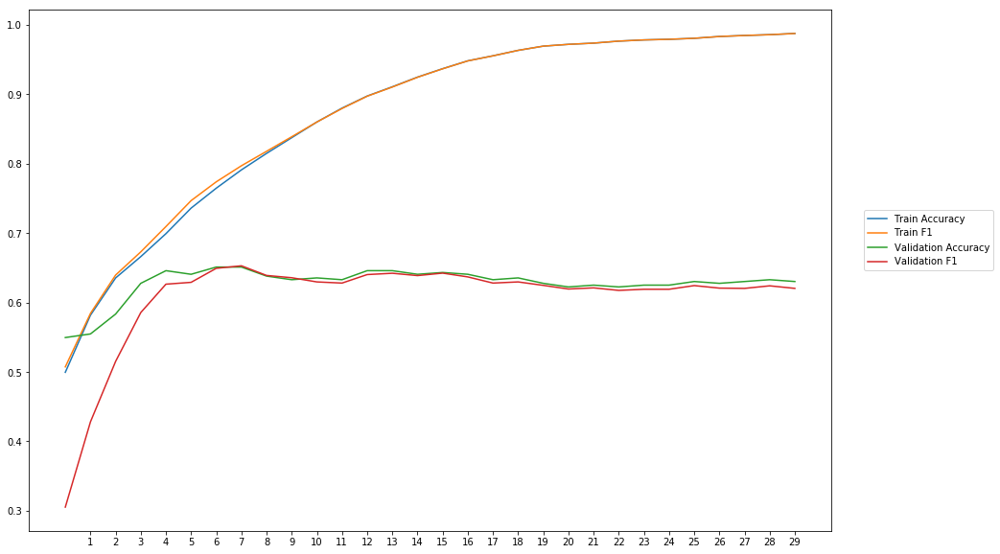

Average Accuracy: 62.75%
Average Precision: 63.46%
Average Recall: 59.16%
Average F1: 60.71%

-----Fold 3--------


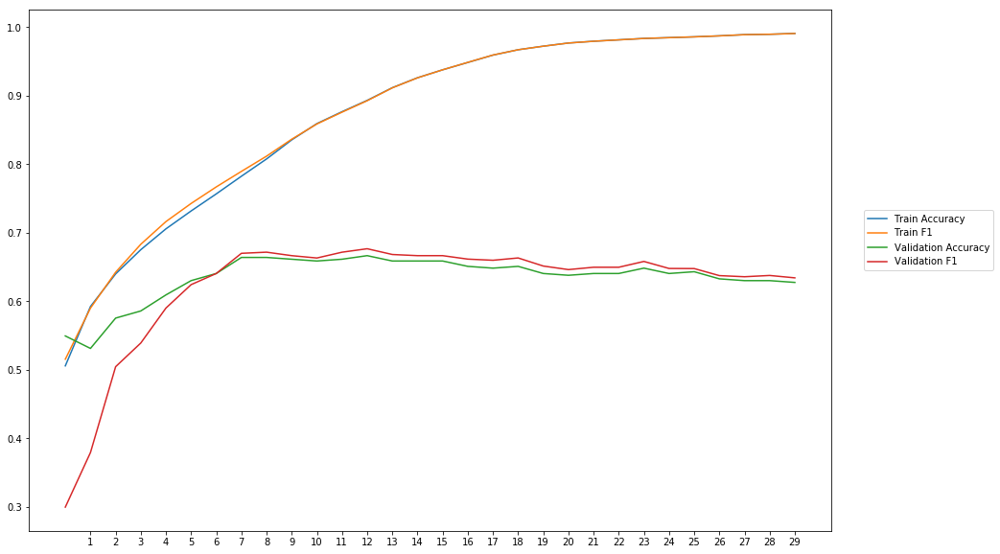

Average Accuracy: 63.46%
Average Precision: 63.32%
Average Recall: 62.58%
Average F1: 62.27%

-----Fold 4--------


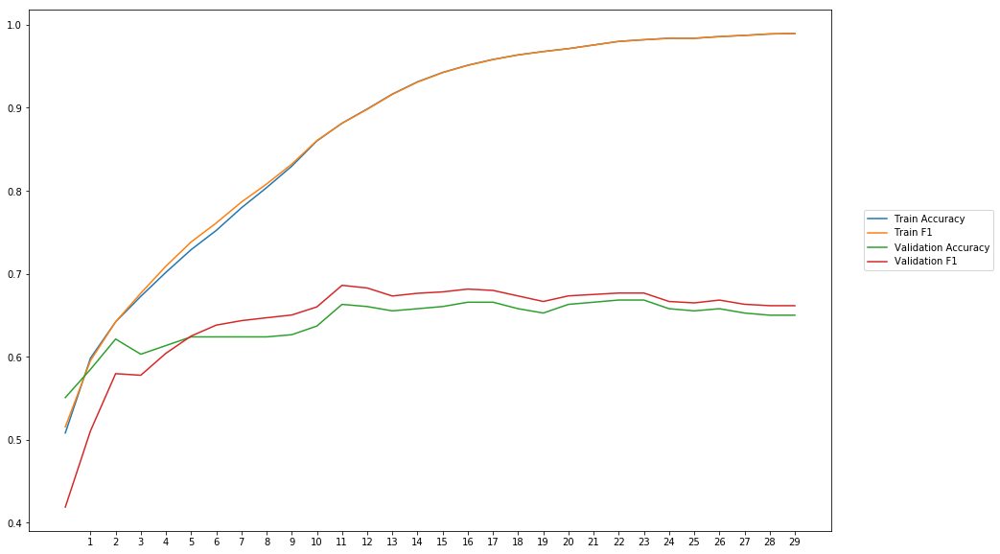

Average Accuracy: 64.21%
Average Precision: 63.48%
Average Recall: 66.14%
Average F1: 64.48%

-----Fold 5--------


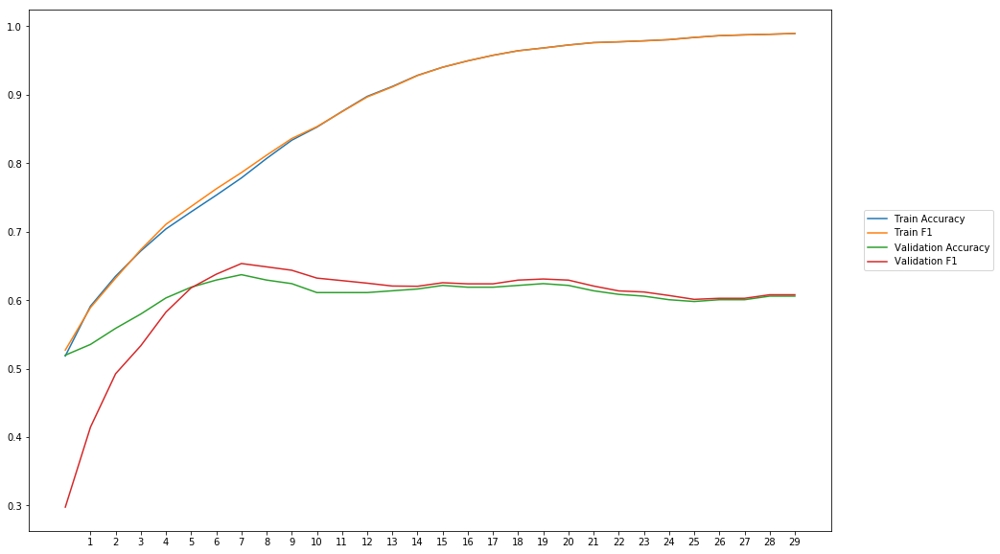

Average Accuracy: 60.54%
Average Precision: 60.34%
Average Recall: 59.81%
Average F1: 59.61%

-----Fold 6--------


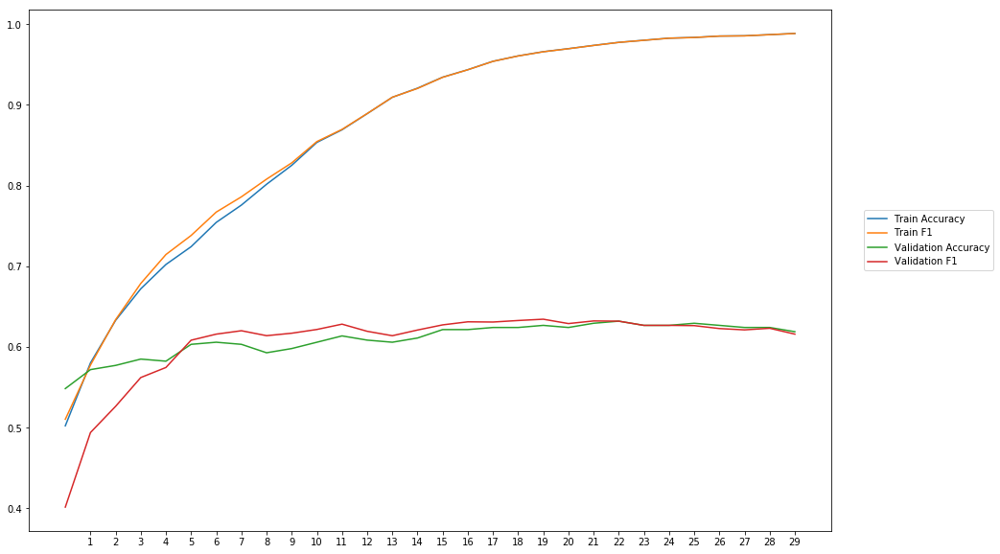

Average Accuracy: 60.97%
Average Precision: 60.89%
Average Recall: 60.65%
Average F1: 60.49%

-----Fold 7--------


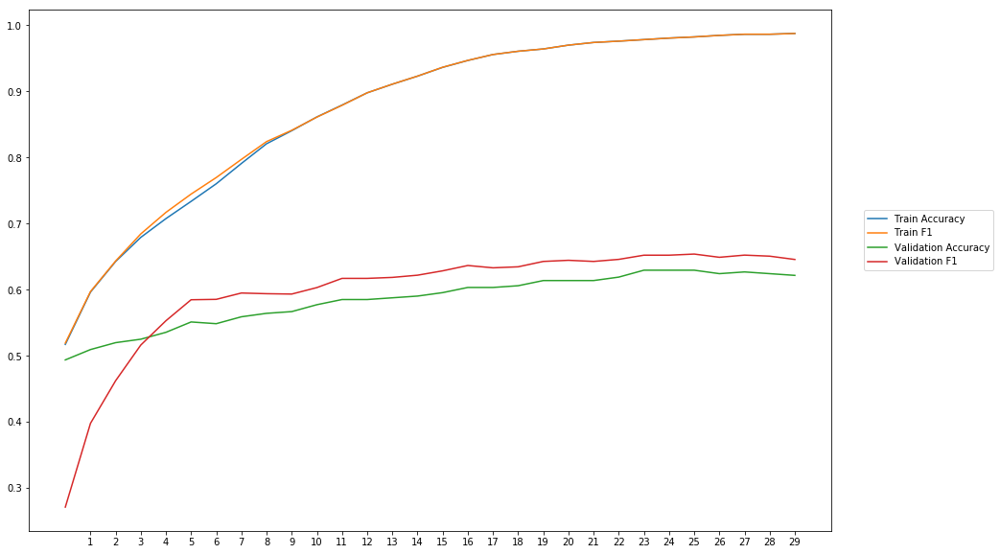

Average Accuracy: 58.49%
Average Precision: 57.24%
Average Recall: 63.21%
Average F1: 59.63%

-----Fold 8--------


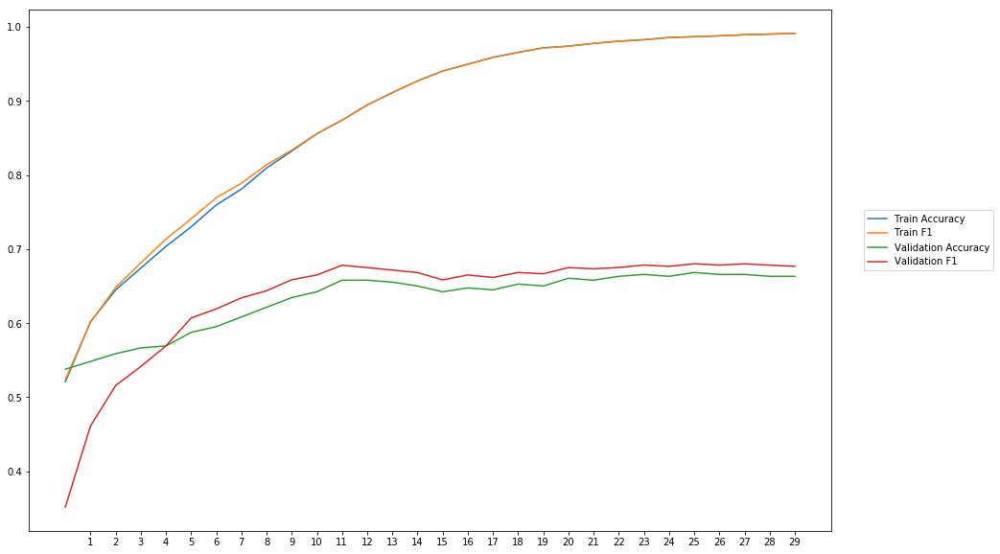

Average Accuracy: 63.22%
Average Precision: 62.27%
Average Recall: 65.64%
Average F1: 63.51%

-----Fold 9--------


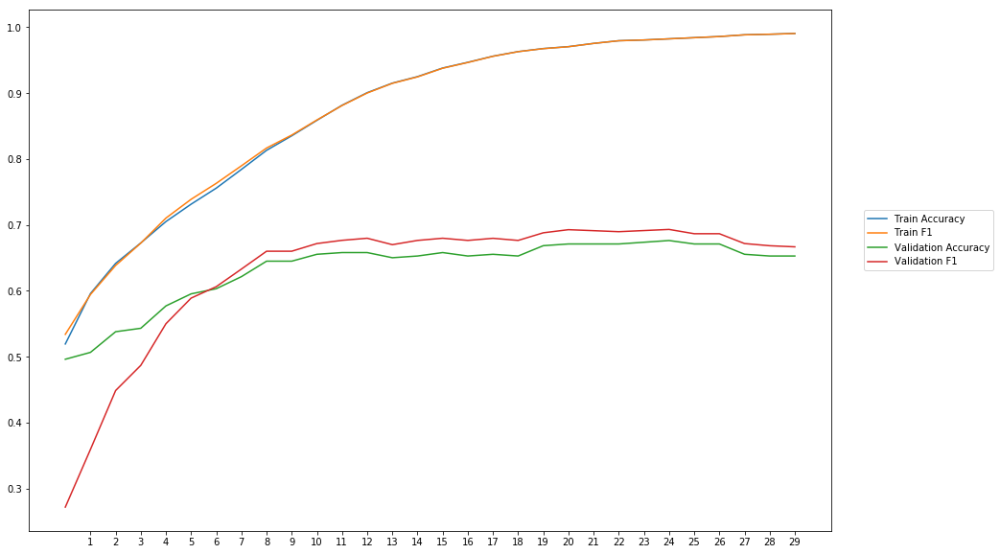

Average Accuracy: 63.32%
Average Precision: 62.04%
Average Recall: 64.99%
Average F1: 62.92%

-----Fold 10--------


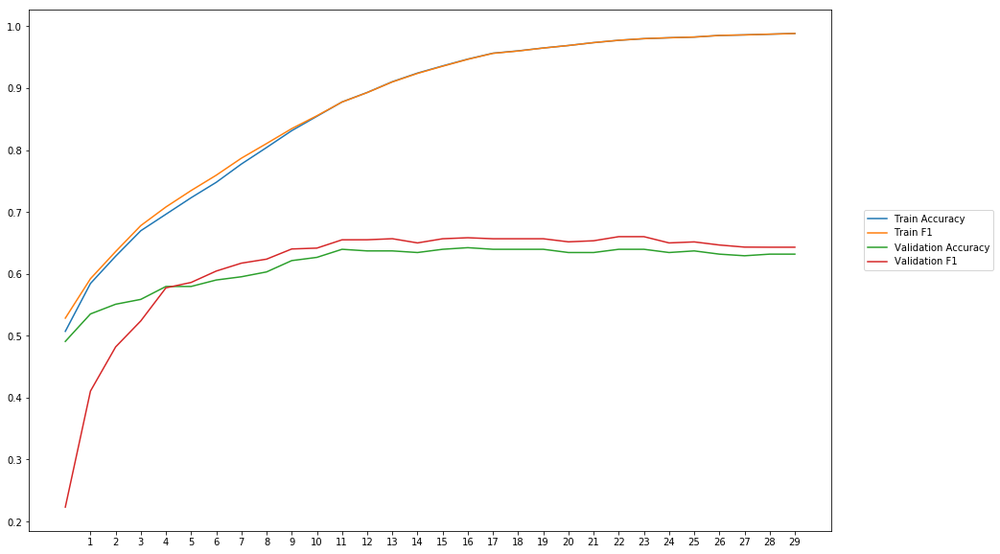

Average Accuracy: 61.42%
Average Precision: 60.46%
Average Recall: 62.88%
Average F1: 61.12%

-------Overallresults-------


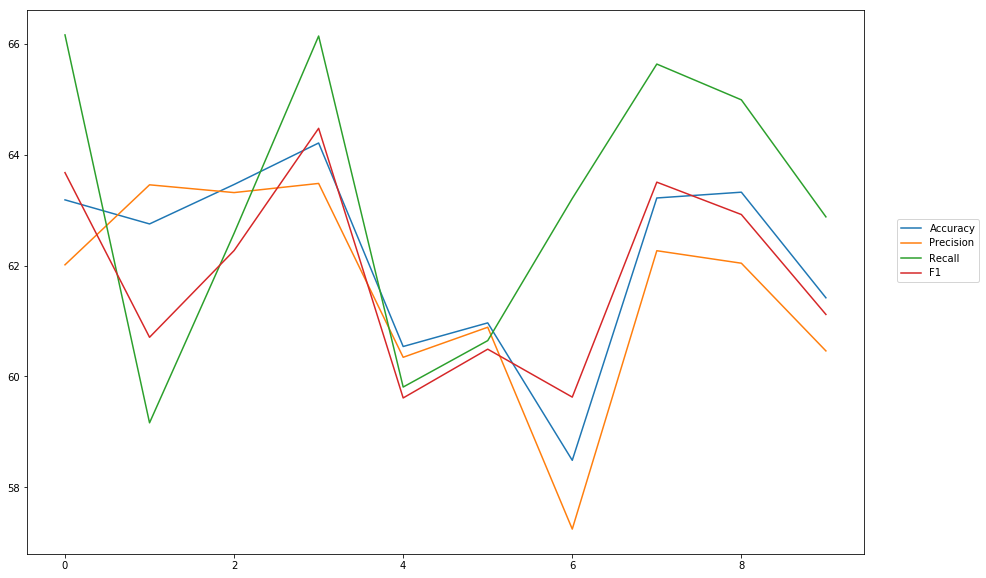

Accuracy: Mean = 62.16% (+/- 1.67%), Max = 64.21%, Min =  58.49%
Precision: Mean = 61.55% (+/- 1.82%), Max = 63.48%, Min =  57.24%
Recall: Mean = 63.12% (+/- 2.48%), Max = 66.16%, Min =  59.16%
F1: Mean = 61.84% (+/- 1.67%), Max = 64.48%, Min =  59.61%


In [30]:
cross_val_three_inputs(model_10, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Hidden001')

### weigth decay = 0,01

In [31]:
#Word Embeddings
wv_layer_11 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_11 = wv_layer_11(input_embedding_11)
x_embedding_11 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.01))(embedded_sequences_11)
x_embedding_11 = Flatten()(x_embedding_11)

#Sentiment Features
input_sentiment_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_11 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.01))(input_sentiment_11)

#POS Features
input_pos_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_11 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.01))(input_pos_11)

#Concatination
concat_11 = concatenate([x_embedding_11, x_sentiment_11, x_pos_11])

preds_11 = Dense(2, activation='softmax')(concat_11)

model_11 = Model(inputs=[input_embedding_11, input_sentiment_11, input_pos_11], outputs=preds_11)


-----Fold 1--------


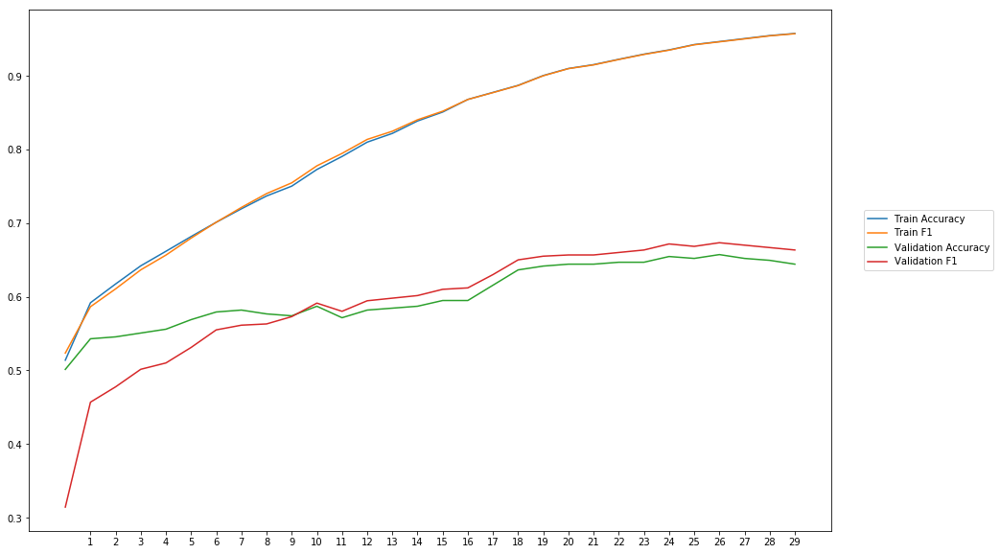

Average Accuracy: 60.21%
Average Precision: 59.73%
Average Recall: 59.83%
Average F1: 59.39%

-----Fold 2--------


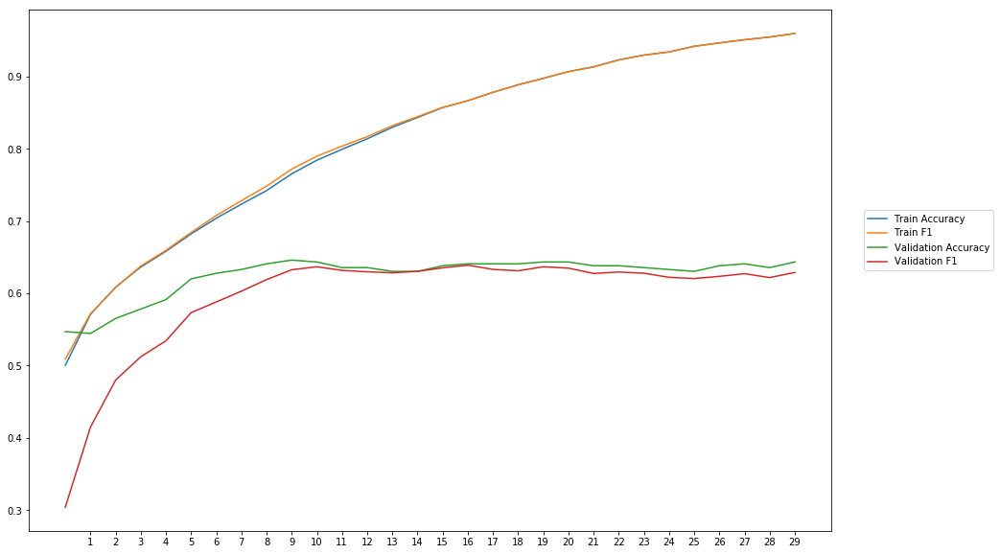

Average Accuracy: 62.48%
Average Precision: 63.67%
Average Recall: 56.79%
Average F1: 59.51%

-----Fold 3--------


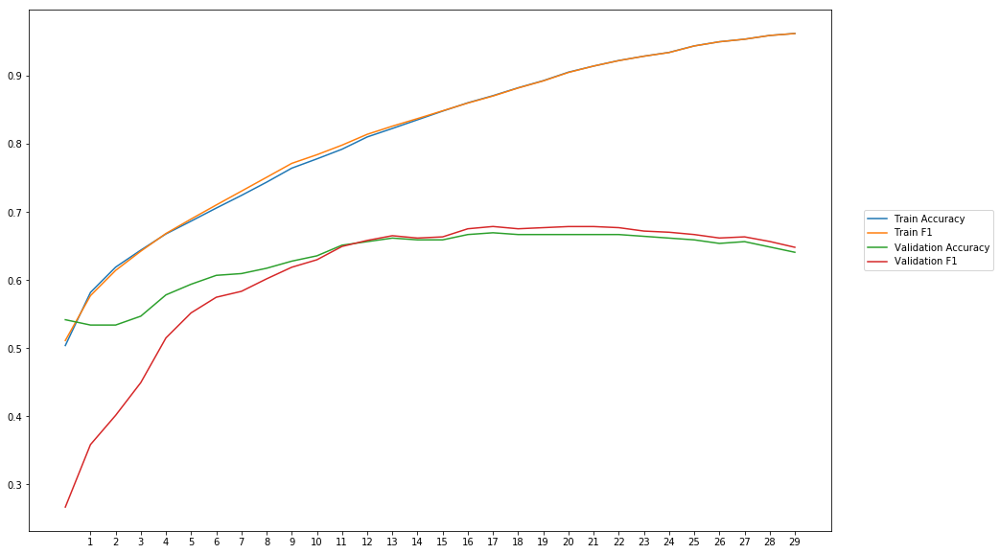

Average Accuracy: 63.21%
Average Precision: 63.48%
Average Recall: 59.93%
Average F1: 60.75%

-----Fold 4--------


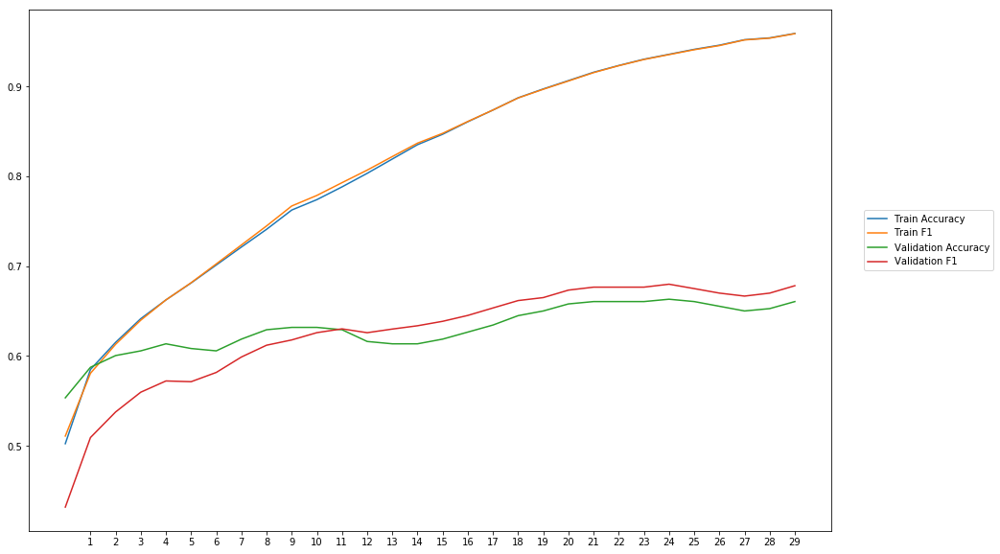

Average Accuracy: 63.05%
Average Precision: 62.95%
Average Recall: 62.81%
Average F1: 62.49%

-----Fold 5--------


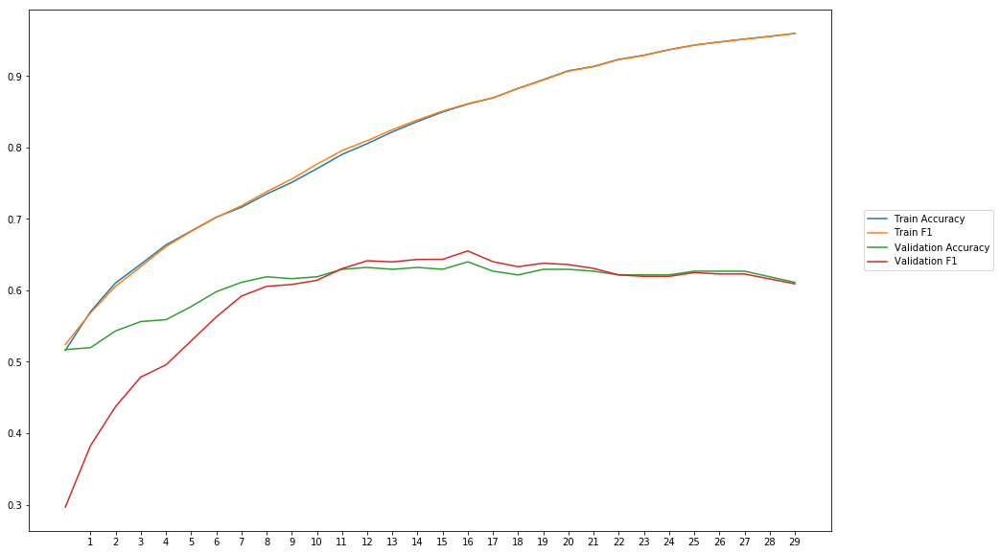

Average Accuracy: 60.77%
Average Precision: 61.00%
Average Recall: 57.42%
Average F1: 58.62%

-----Fold 6--------


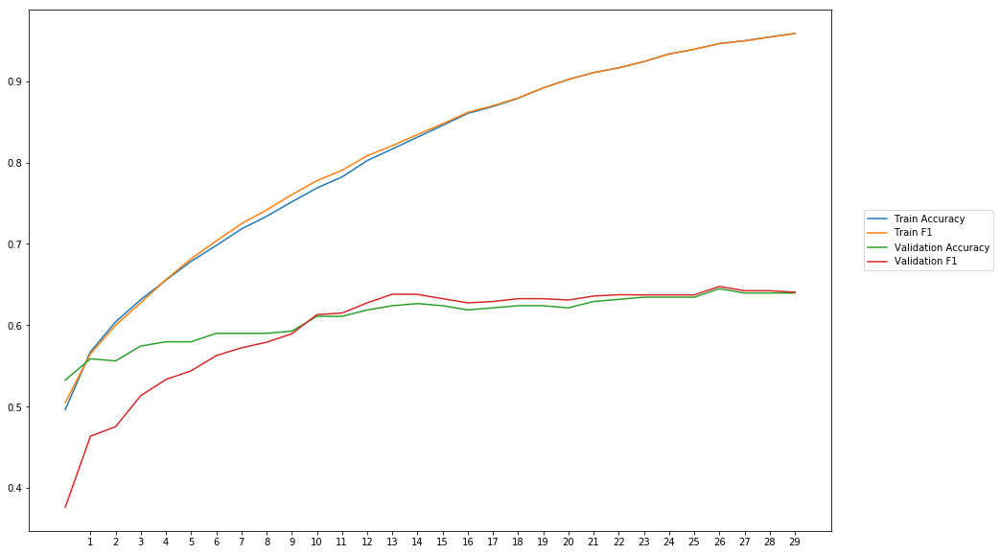

Average Accuracy: 60.99%
Average Precision: 61.14%
Average Recall: 58.85%
Average F1: 59.62%

-----Fold 7--------


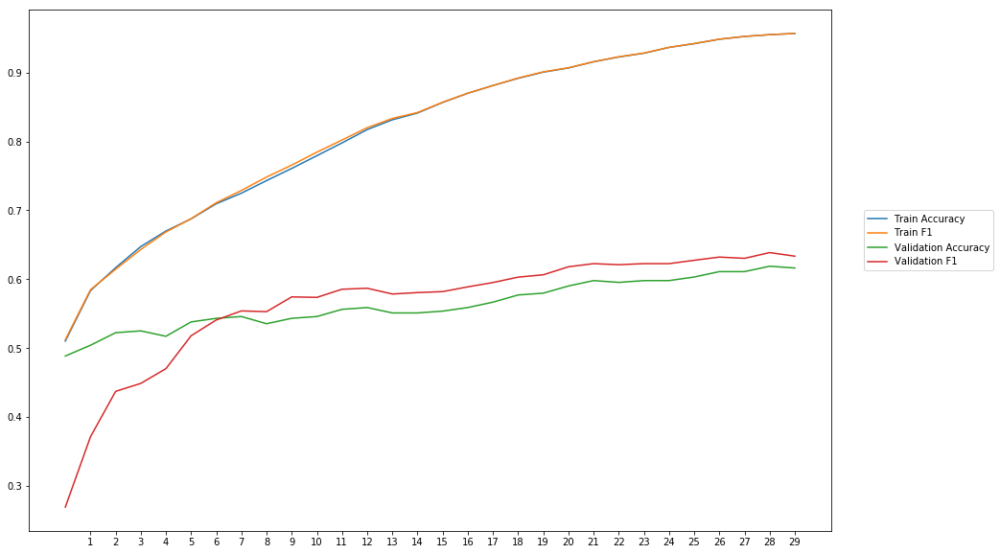

Average Accuracy: 56.33%
Average Precision: 55.57%
Average Recall: 58.12%
Average F1: 56.27%

-----Fold 8--------


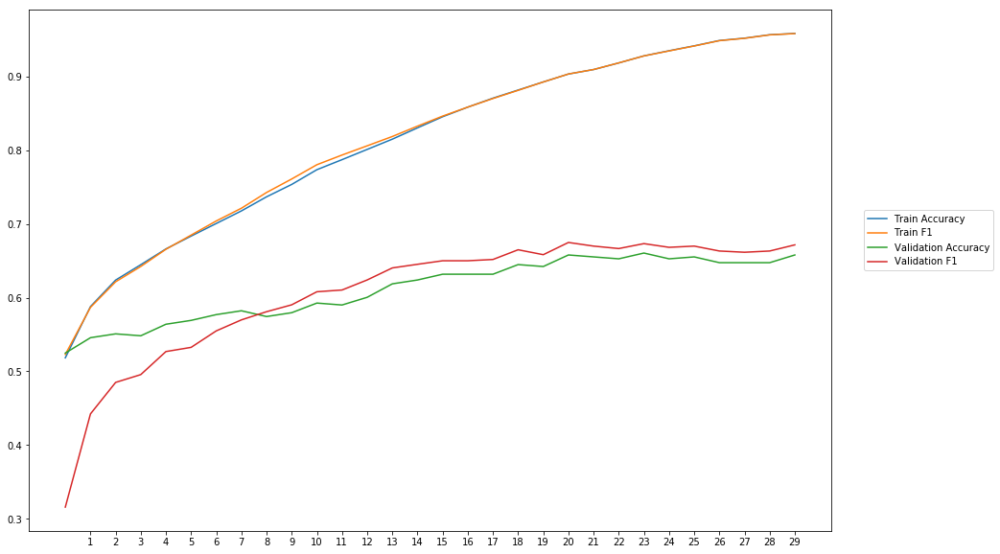

Average Accuracy: 61.20%
Average Precision: 60.65%
Average Recall: 61.61%
Average F1: 60.60%

-----Fold 9--------


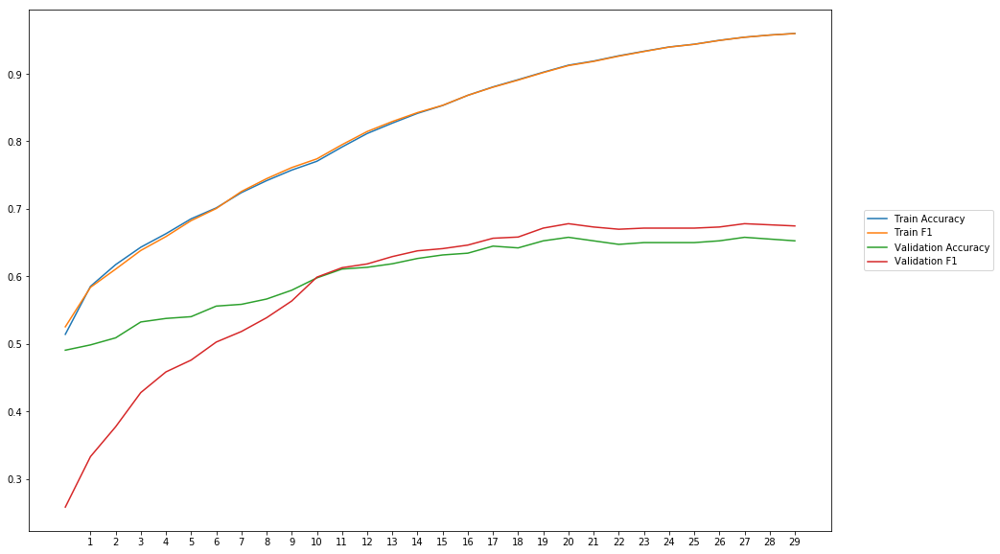

Average Accuracy: 60.57%
Average Precision: 59.85%
Average Recall: 58.78%
Average F1: 58.56%

-----Fold 10--------


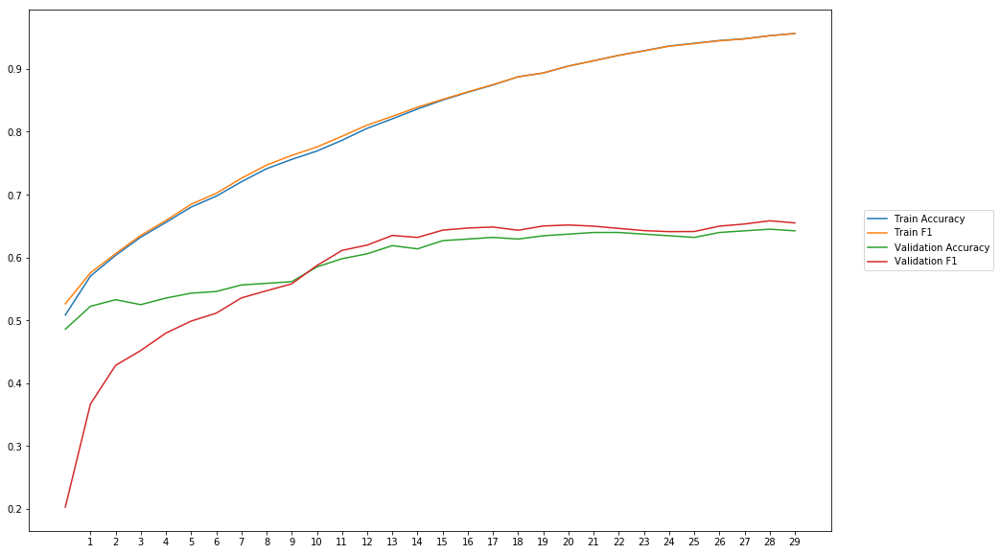

Average Accuracy: 59.76%
Average Precision: 59.21%
Average Recall: 57.98%
Average F1: 57.95%

-------Overallresults-------


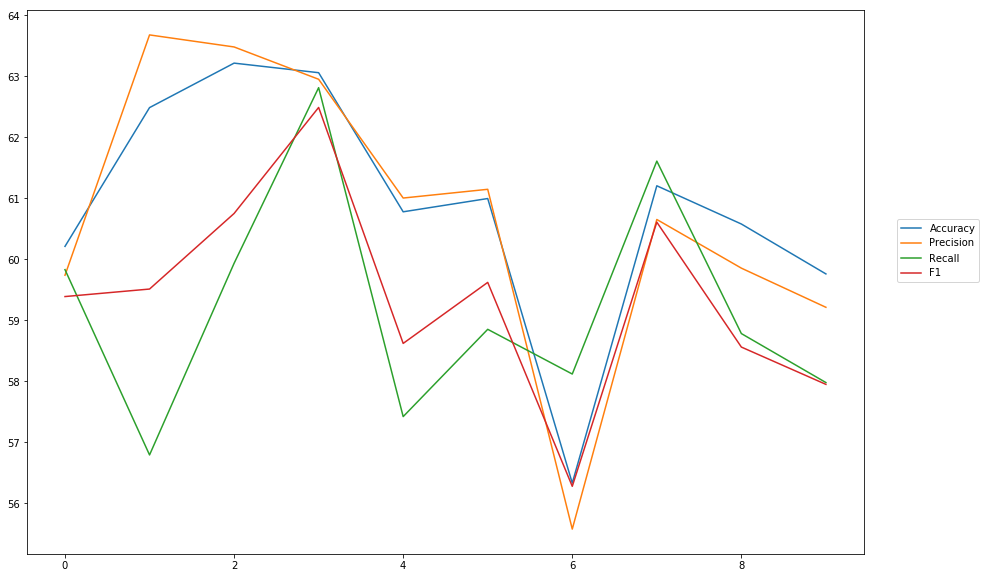

Accuracy: Mean = 60.86% (+/- 1.88%), Max = 63.21%, Min =  56.33%
Precision: Mean = 60.73% (+/- 2.28%), Max = 63.67%, Min =  55.57%
Recall: Mean = 59.21% (+/- 1.78%), Max = 62.81%, Min =  56.79%
F1: Mean = 59.37% (+/- 1.61%), Max = 62.49%, Min =  56.27%


In [32]:
cross_val_three_inputs(model_11, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Hidden01')

### weigth decay = 0,1

In [33]:
#Word Embeddings
wv_layer_12 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_12 = wv_layer_12(input_embedding_12)
x_embedding_12 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.1))(embedded_sequences_12)
x_embedding_12 = Flatten()(x_embedding_12)

#Sentiment Features
input_sentiment_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_12 = Dense(600, activation='relu',  kernel_regularizer=regularizers.l2(0.1))(input_sentiment_12)

#POS Features
input_pos_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_12 = Dense(600, activation='relu',  kernel_regularizer=regularizers.l2(0.1))(input_pos_12)

#Concatination
concat_12 = concatenate([x_embedding_12, x_sentiment_12, x_pos_12])

preds_12 = Dense(2, activation='softmax')(concat_12)

model_12 = Model(inputs=[input_embedding_12, input_sentiment_12, input_pos_12], outputs=preds_12)


-----Fold 1--------


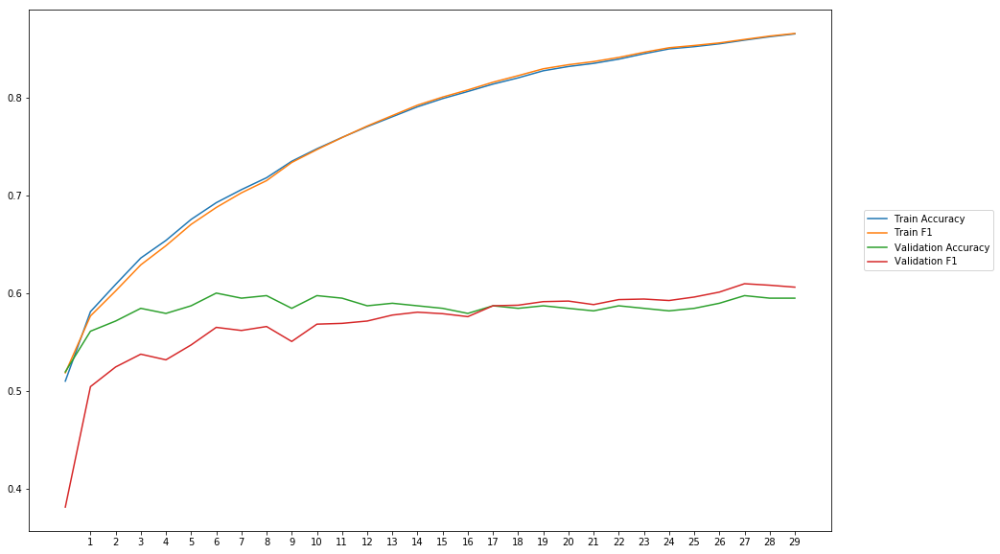

Average Accuracy: 58.46%
Average Precision: 58.89%
Average Recall: 55.30%
Average F1: 56.79%

-----Fold 2--------


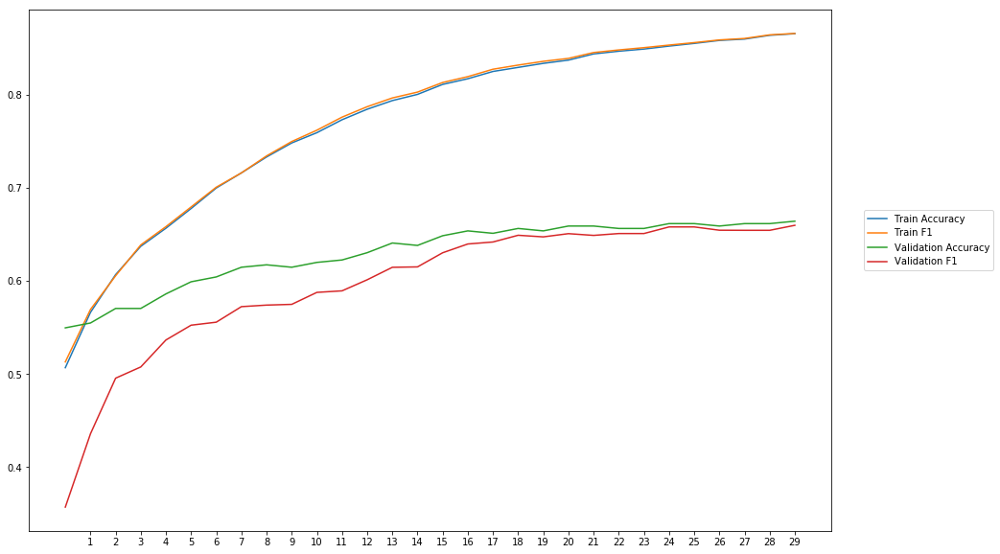

Average Accuracy: 62.98%
Average Precision: 64.40%
Average Recall: 56.32%
Average F1: 59.72%

-----Fold 3--------


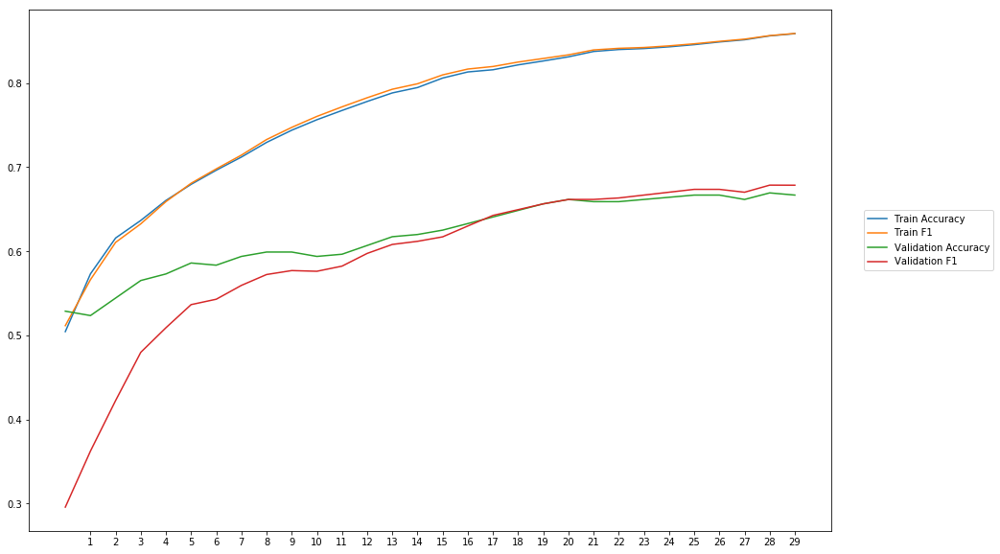

Average Accuracy: 61.89%
Average Precision: 62.29%
Average Recall: 57.35%
Average F1: 59.08%

-----Fold 4--------


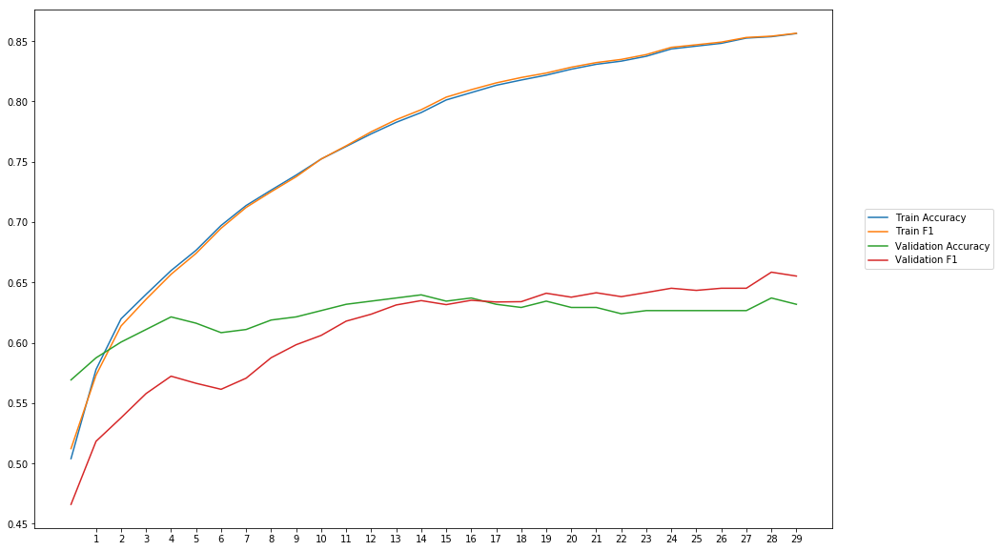

Average Accuracy: 62.29%
Average Precision: 62.91%
Average Recall: 59.76%
Average F1: 60.92%

-----Fold 5--------


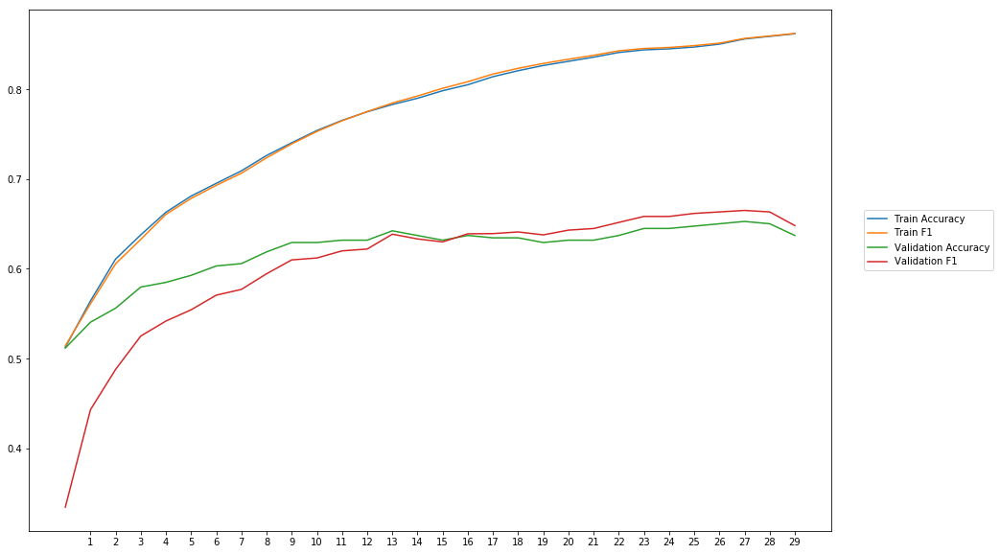

Average Accuracy: 61.97%
Average Precision: 62.14%
Average Recall: 59.41%
Average F1: 60.36%

-----Fold 6--------


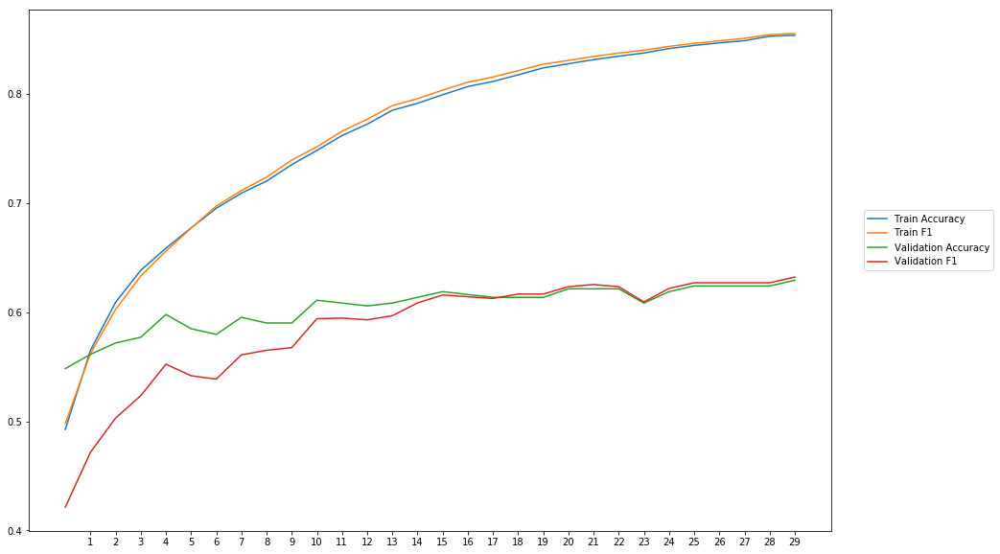

Average Accuracy: 60.45%
Average Precision: 61.07%
Average Recall: 56.63%
Average F1: 58.51%

-----Fold 7--------


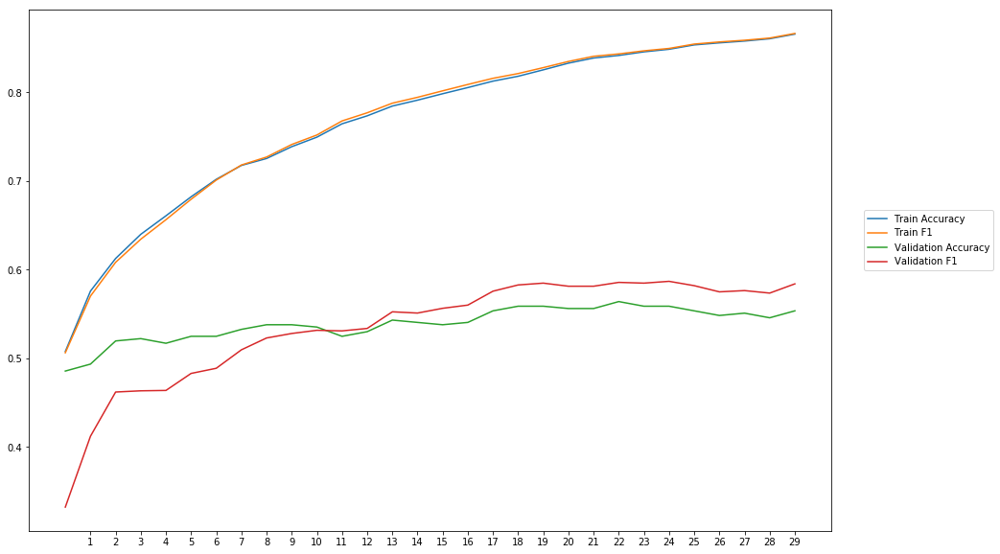

Average Accuracy: 53.88%
Average Precision: 53.50%
Average Recall: 54.07%
Average F1: 53.45%

-----Fold 8--------


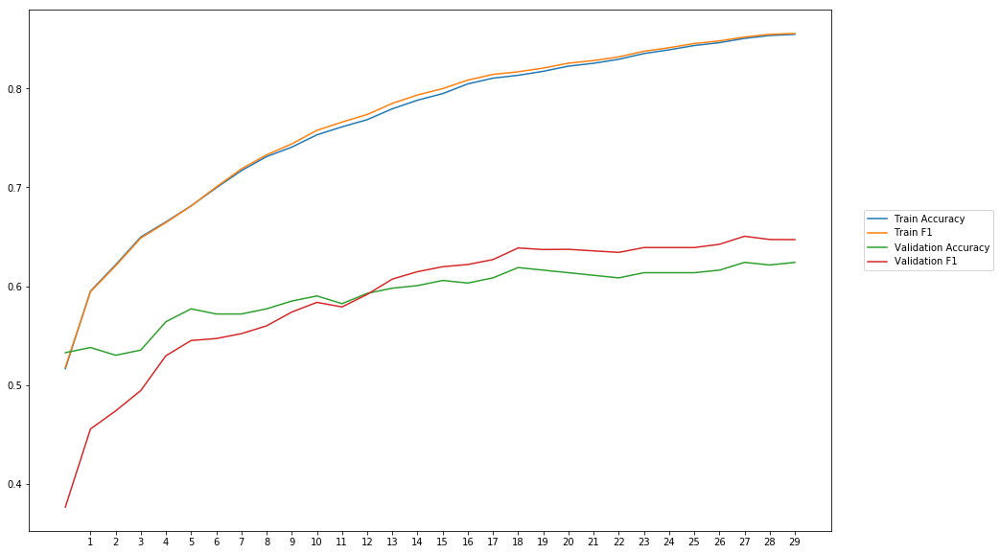

Average Accuracy: 59.19%
Average Precision: 58.75%
Average Recall: 59.63%
Average F1: 58.79%

-----Fold 9--------


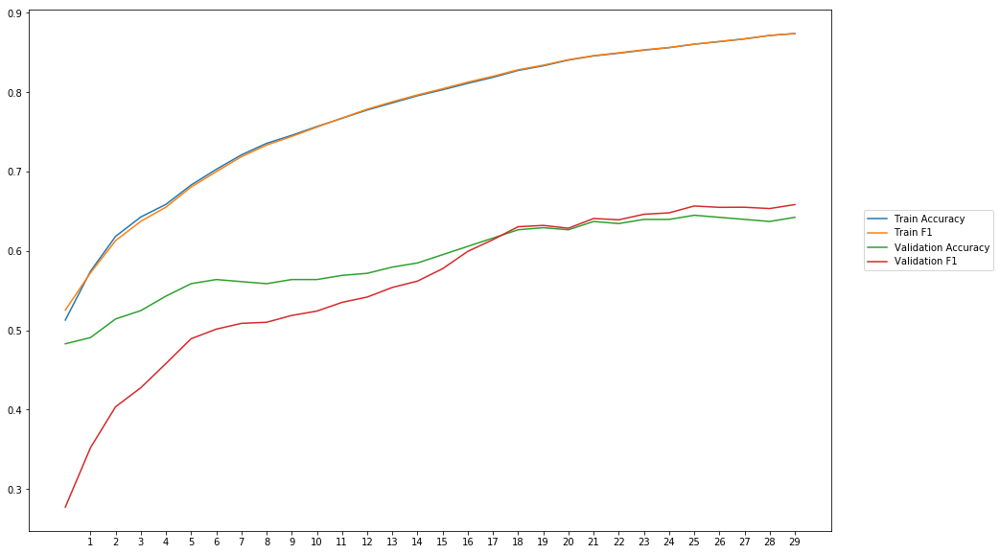

Average Accuracy: 58.96%
Average Precision: 59.09%
Average Recall: 53.54%
Average F1: 55.67%

-----Fold 10--------


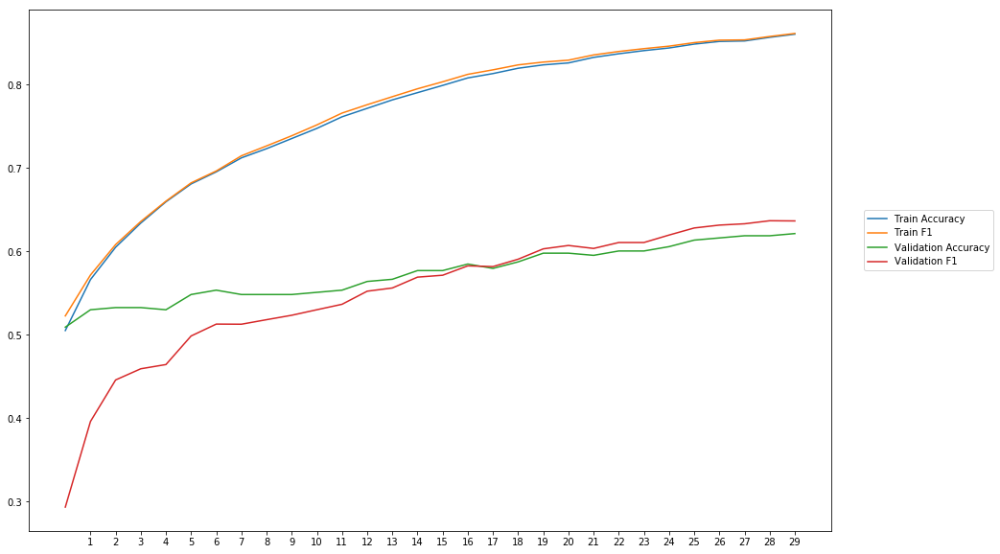

Average Accuracy: 57.36%
Average Precision: 57.41%
Average Recall: 53.80%
Average F1: 55.05%

-------Overallresults-------


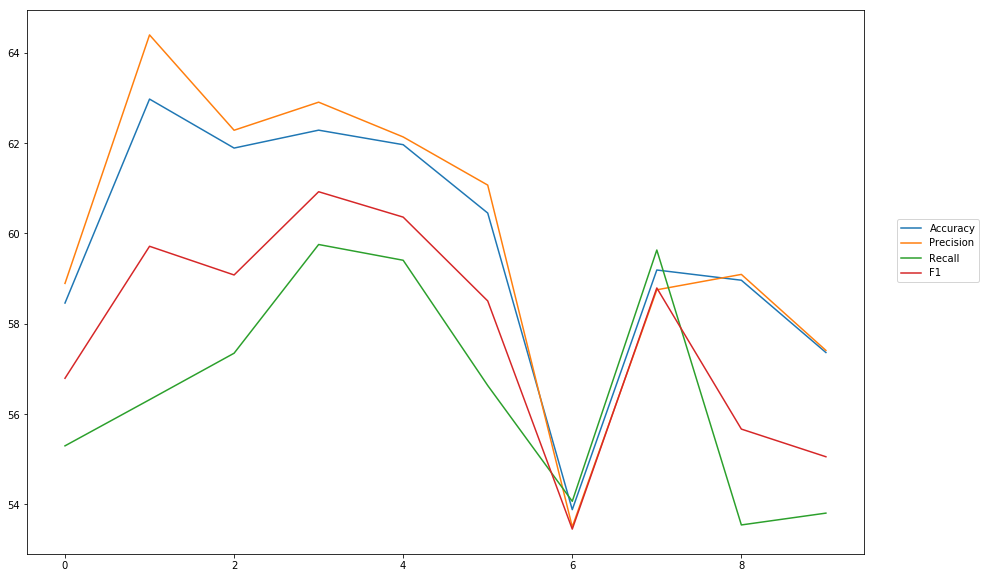

Accuracy: Mean = 59.74% (+/- 2.64%), Max = 62.98%, Min =  53.88%
Precision: Mean = 60.05% (+/- 3.02%), Max = 64.40%, Min =  53.50%
Recall: Mean = 56.58% (+/- 2.30%), Max = 59.76%, Min =  53.54%
F1: Mean = 57.83% (+/- 2.35%), Max = 60.92%, Min =  53.45%


In [34]:
cross_val_three_inputs(model_12, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Hidden1')

# L1 for output layer

### weigth decay = 0,001

In [35]:
#Word Embeddings
wv_layer_13 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_13 = wv_layer_13(input_embedding_13)
x_embedding_13 = Dense(600, activation='relu')(embedded_sequences_13)
x_embedding_13 = Flatten()(x_embedding_13)

#Sentiment Features
input_sentiment_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_13 = Dense(600, activation='relu')(input_sentiment_13)

#POS Features
input_pos_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_13 = Dense(600, activation='relu')(input_pos_13)

#Concatination
concat_13 = concatenate([x_embedding_13, x_sentiment_13, x_pos_13])

preds_13 = Dense(2, activation='softmax', kernel_regularizer=regularizers.l1(0.001))(concat_13)

model_13 = Model(inputs=[input_embedding_13, input_sentiment_13, input_pos_13], outputs=preds_13)


-----Fold 1--------


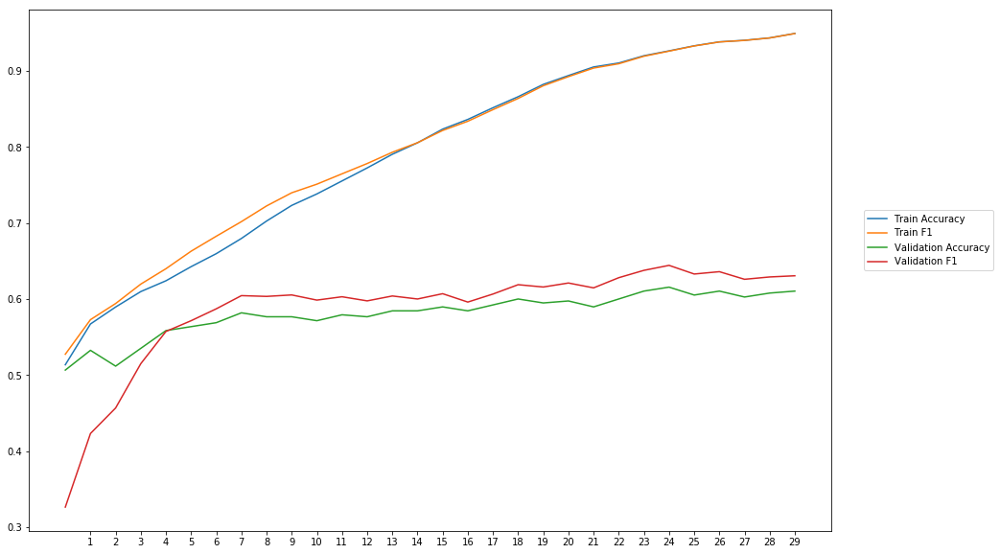

Average Accuracy: 58.06%
Average Precision: 57.25%
Average Recall: 60.94%
Average F1: 58.66%

-----Fold 2--------


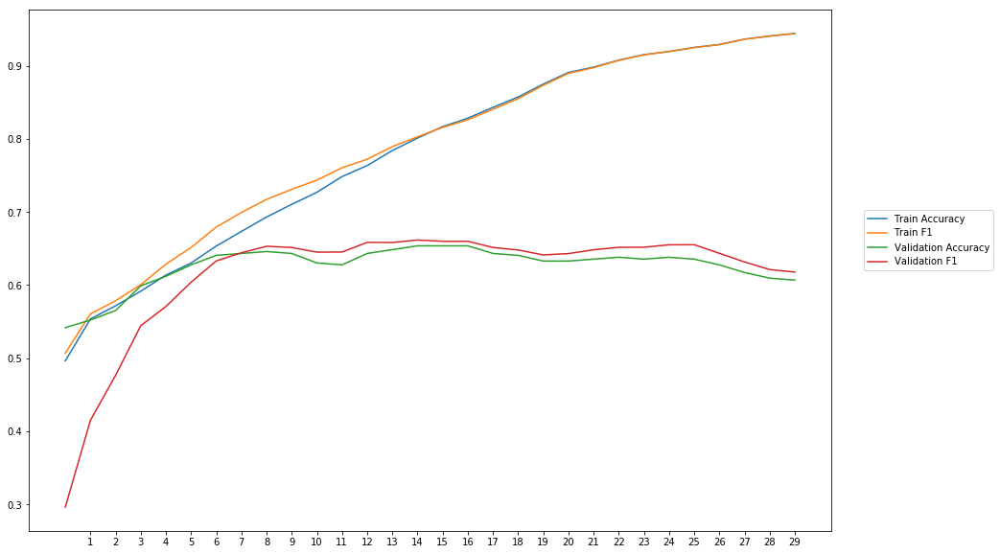

Average Accuracy: 62.58%
Average Precision: 62.46%
Average Recall: 61.87%
Average F1: 61.45%

-----Fold 3--------


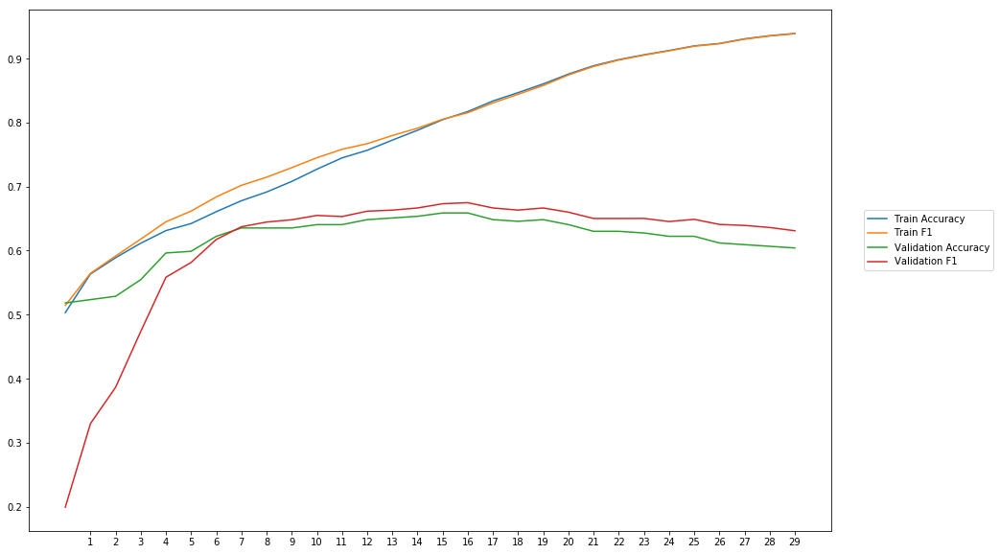

Average Accuracy: 61.83%
Average Precision: 61.13%
Average Recall: 62.15%
Average F1: 60.58%

-----Fold 4--------


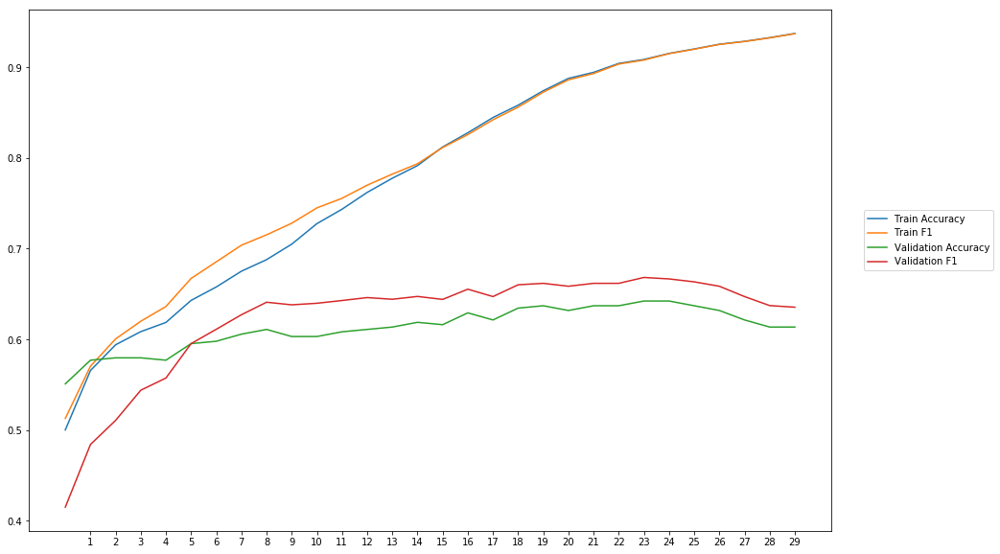

Average Accuracy: 61.26%
Average Precision: 60.29%
Average Recall: 65.32%
Average F1: 62.24%

-----Fold 5--------


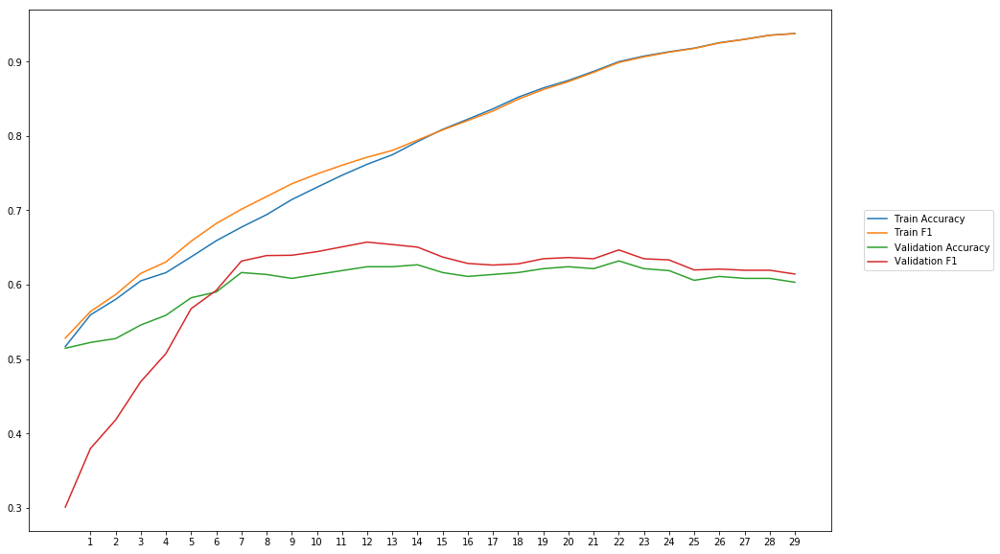

Average Accuracy: 60.06%
Average Precision: 59.41%
Average Recall: 60.79%
Average F1: 59.45%

-----Fold 6--------


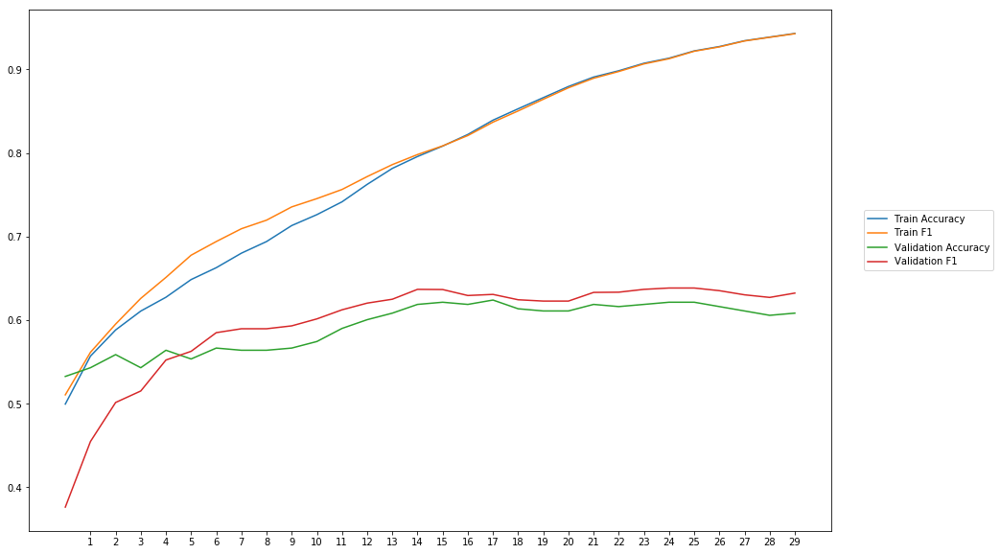

Average Accuracy: 59.29%
Average Precision: 58.70%
Average Recall: 61.29%
Average F1: 59.63%

-----Fold 7--------


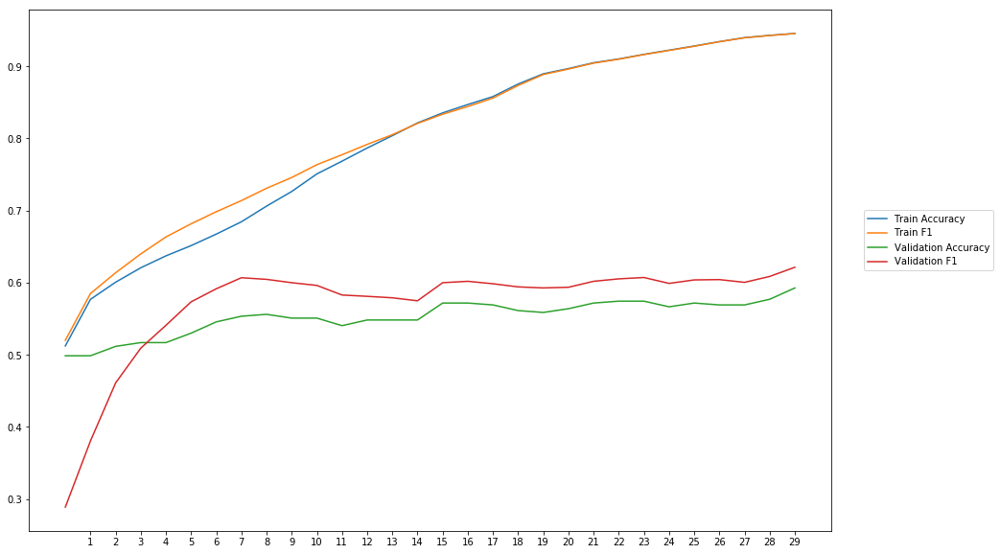

Average Accuracy: 55.27%
Average Precision: 54.38%
Average Recall: 60.96%
Average F1: 57.02%

-----Fold 8--------


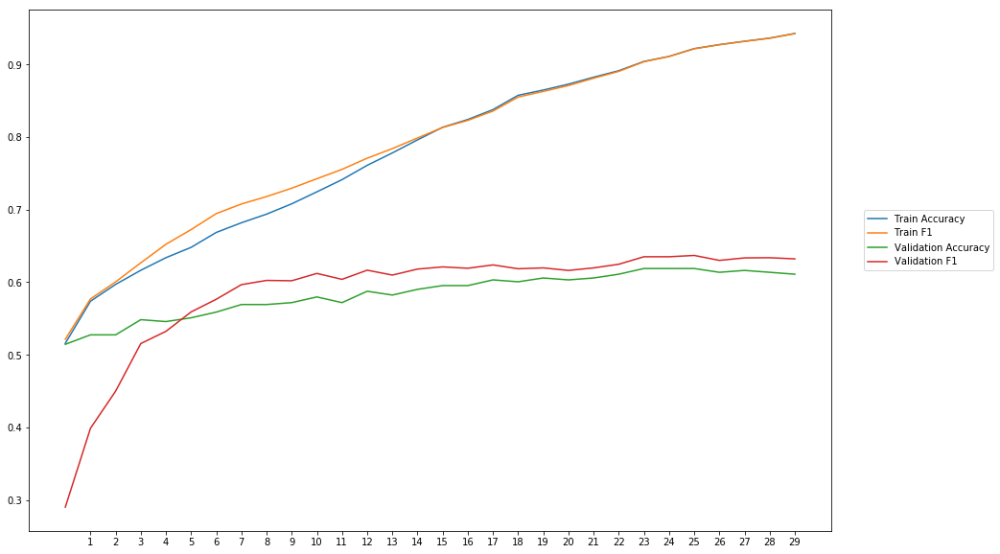

Average Accuracy: 58.42%
Average Precision: 57.72%
Average Recall: 60.65%
Average F1: 58.60%

-----Fold 9--------


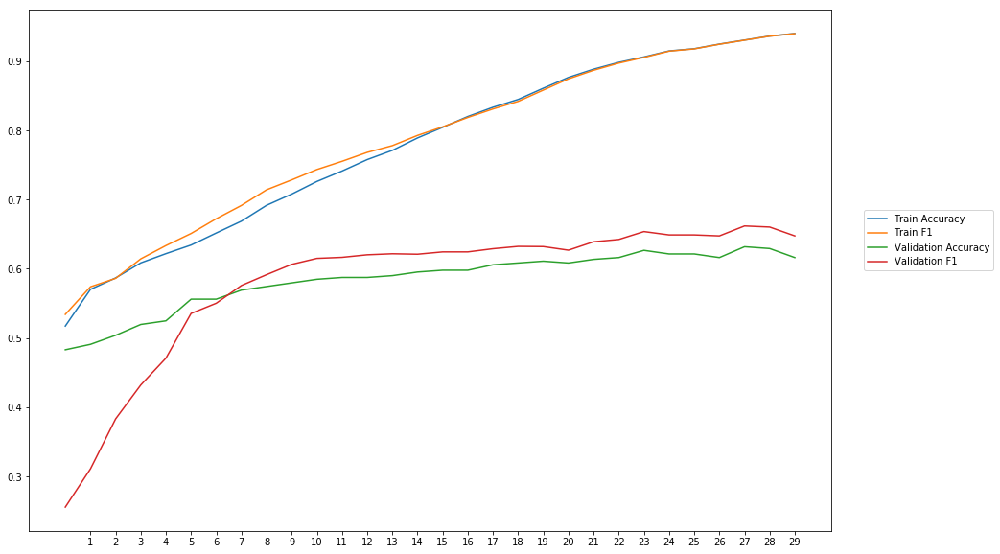

Average Accuracy: 58.42%
Average Precision: 57.22%
Average Recall: 60.42%
Average F1: 58.09%

-----Fold 10--------


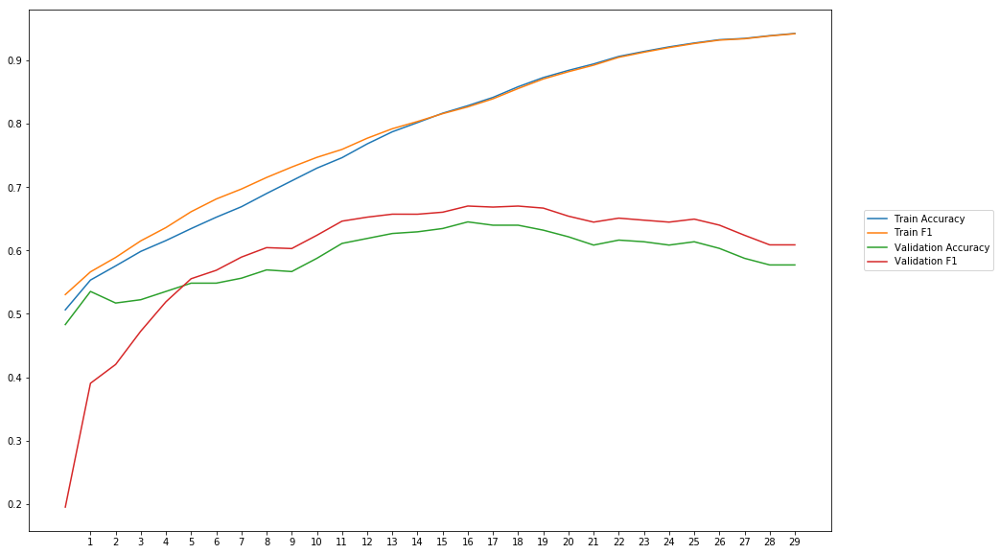

Average Accuracy: 58.90%
Average Precision: 57.47%
Average Recall: 63.35%
Average F1: 59.54%

-------Overallresults-------


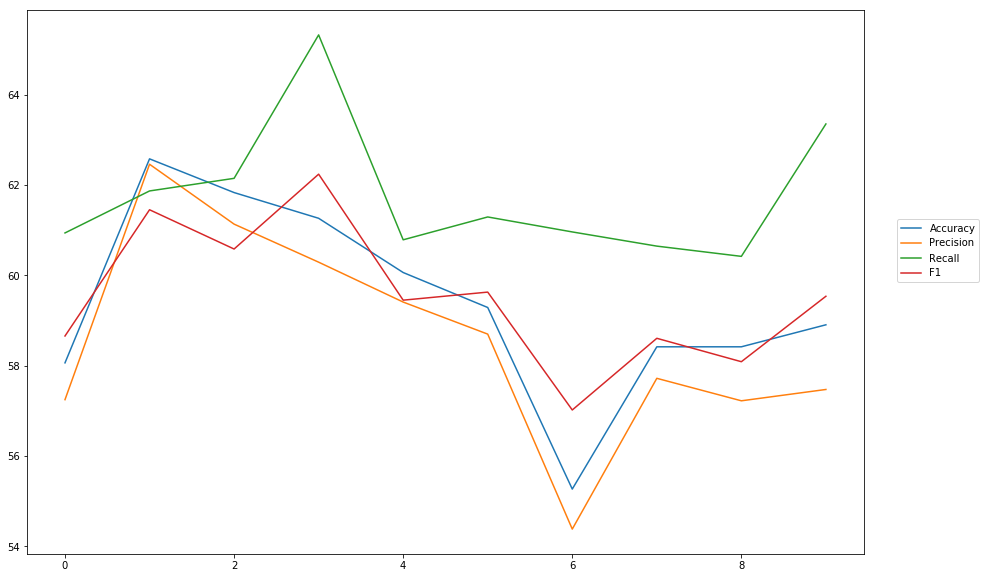

Accuracy: Mean = 59.41% (+/- 2.02%), Max = 62.58%, Min =  55.27%
Precision: Mean = 58.60% (+/- 2.20%), Max = 62.46%, Min =  54.38%
Recall: Mean = 61.77% (+/- 1.45%), Max = 65.32%, Min =  60.42%
F1: Mean = 59.52% (+/- 1.49%), Max = 62.24%, Min =  57.02%


In [36]:
cross_val_three_inputs(model_13, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Out001')

### weigth decay = 0,01

In [37]:
#Word Embeddings
wv_layer_14 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_14 = wv_layer_14(input_embedding_14)
x_embedding_14 = Dense(600, activation='relu')(embedded_sequences_14)
x_embedding_14 = Flatten()(x_embedding_14)

#Sentiment Features
input_sentiment_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_14 = Dense(600, activation='relu')(input_sentiment_14)

#POS Features
input_pos_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_14 = Dense(600, activation='relu')(input_pos_14)

#Concatination
concat_14 = concatenate([x_embedding_14, x_sentiment_14, x_pos_14])

preds_14 = Dense(2, activation='softmax', kernel_regularizer=regularizers.l1(0.01))(concat_14)

model_14 = Model(inputs=[input_embedding_14, input_sentiment_14, input_pos_14], outputs=preds_14)


-----Fold 1--------


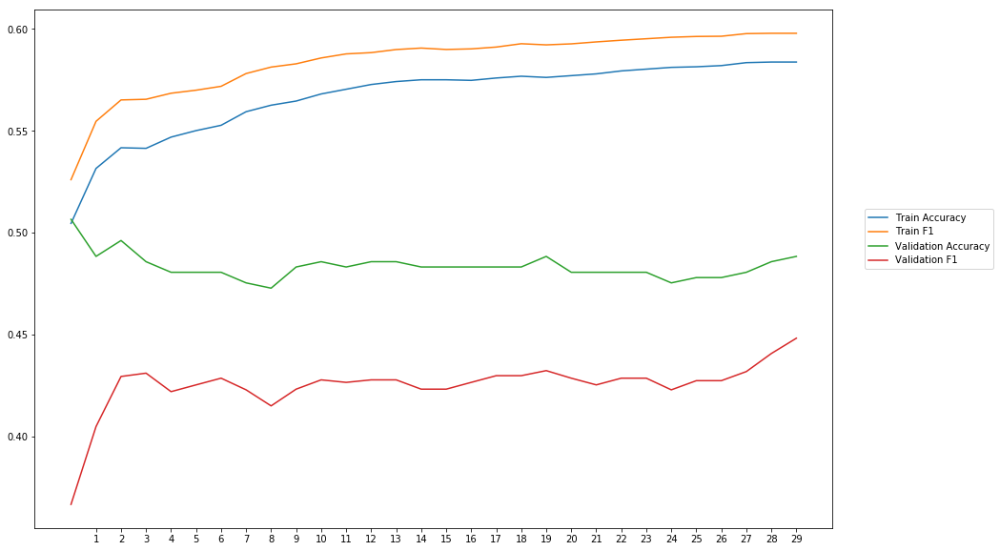

Average Accuracy: 48.34%
Average Precision: 47.80%
Average Recall: 38.35%
Average F1: 42.51%

-----Fold 2--------


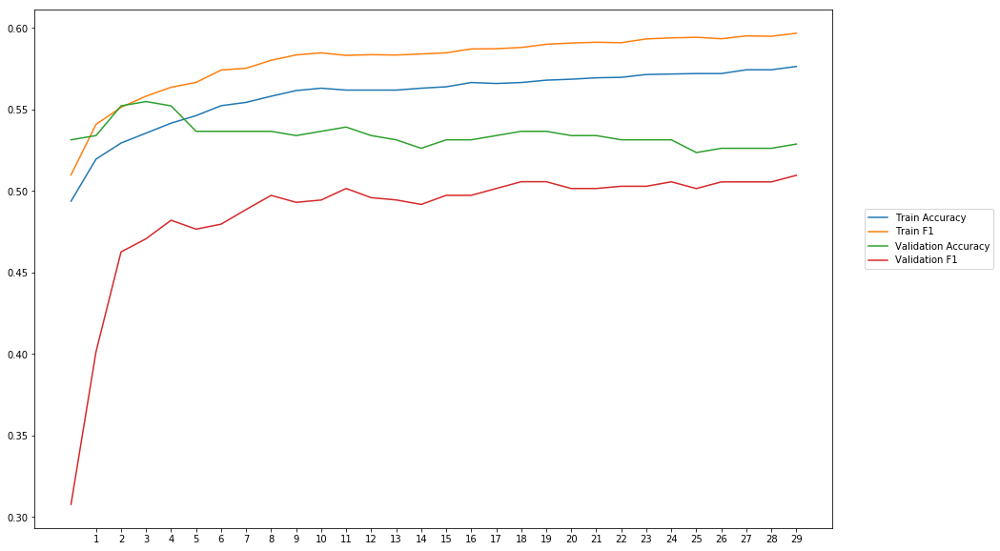

Average Accuracy: 53.44%
Average Precision: 54.03%
Average Recall: 44.71%
Average F1: 48.61%

-----Fold 3--------


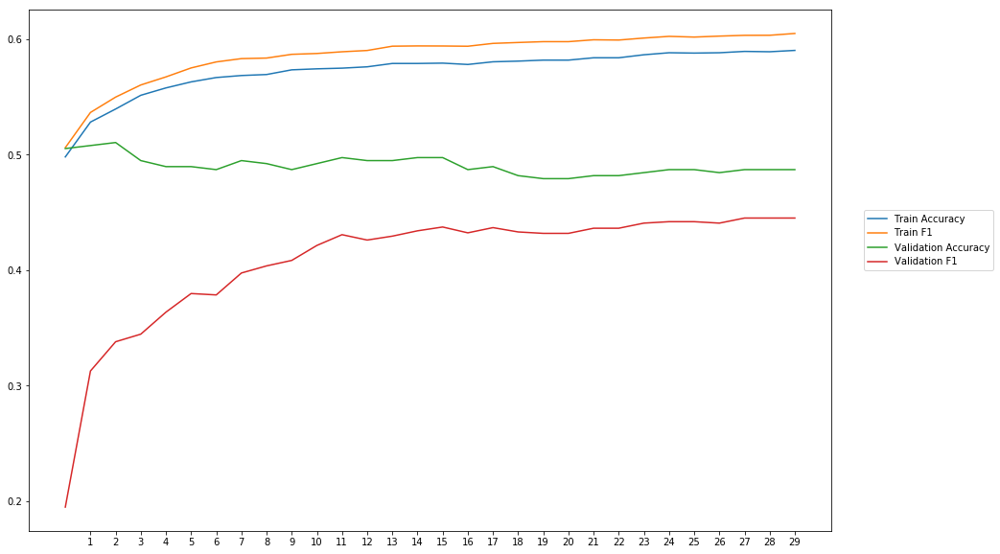

Average Accuracy: 49.05%
Average Precision: 48.53%
Average Recall: 35.93%
Average F1: 40.80%

-----Fold 4--------


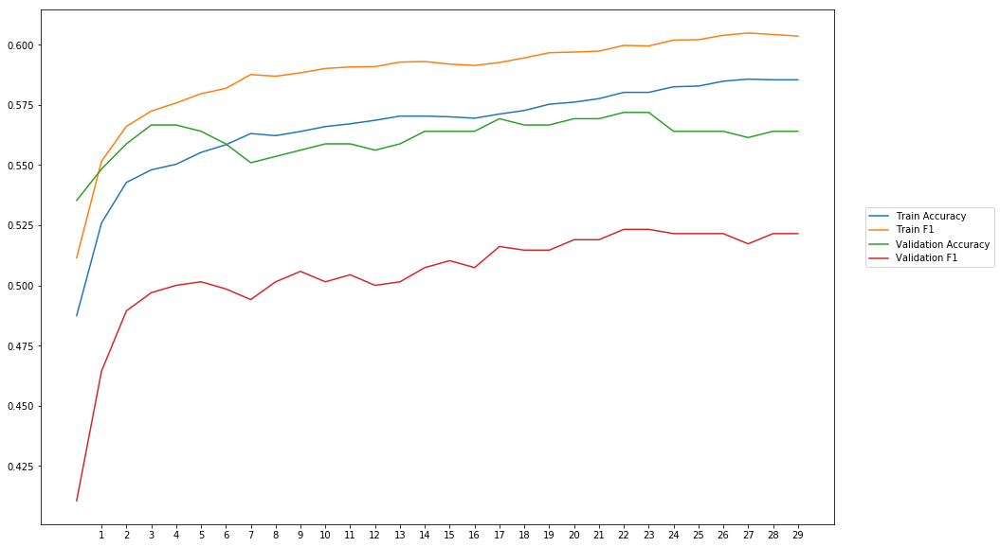

Average Accuracy: 56.16%
Average Precision: 57.76%
Average Recall: 44.94%
Average F1: 50.50%

-----Fold 5--------


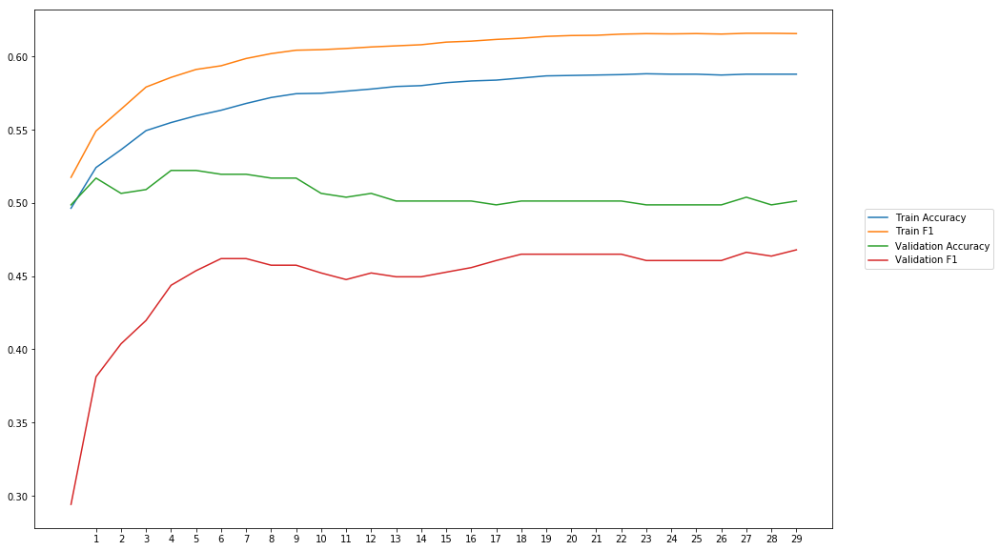

Average Accuracy: 50.58%
Average Precision: 50.62%
Average Recall: 40.40%
Average F1: 44.74%

-----Fold 6--------


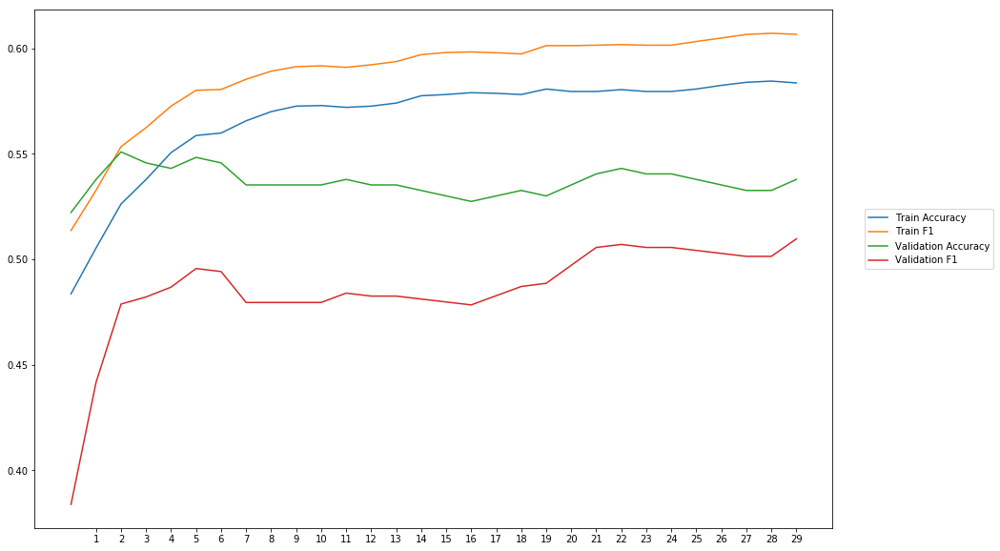

Average Accuracy: 53.67%
Average Precision: 54.41%
Average Recall: 44.00%
Average F1: 48.56%

-----Fold 7--------


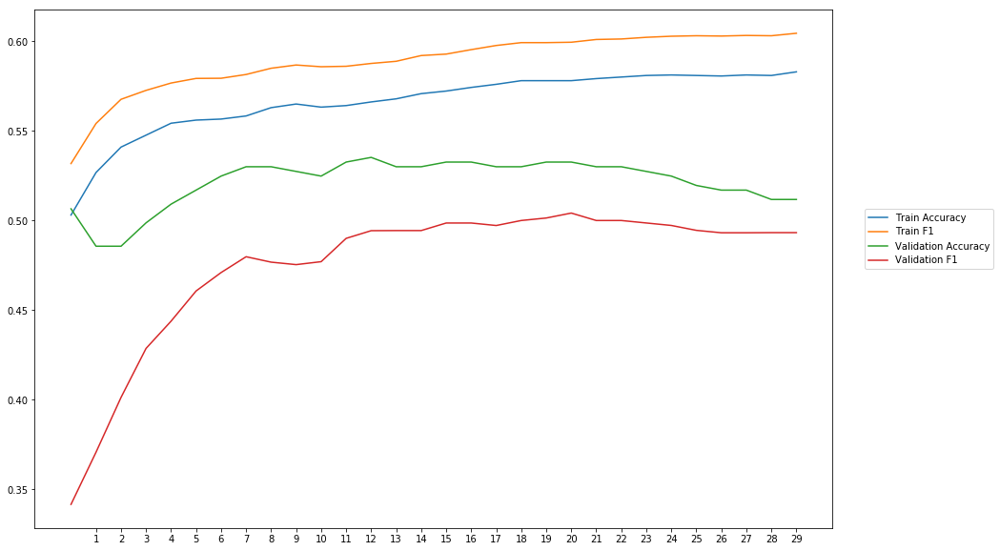

Average Accuracy: 52.16%
Average Precision: 52.35%
Average Recall: 43.79%
Average F1: 47.54%

-----Fold 8--------


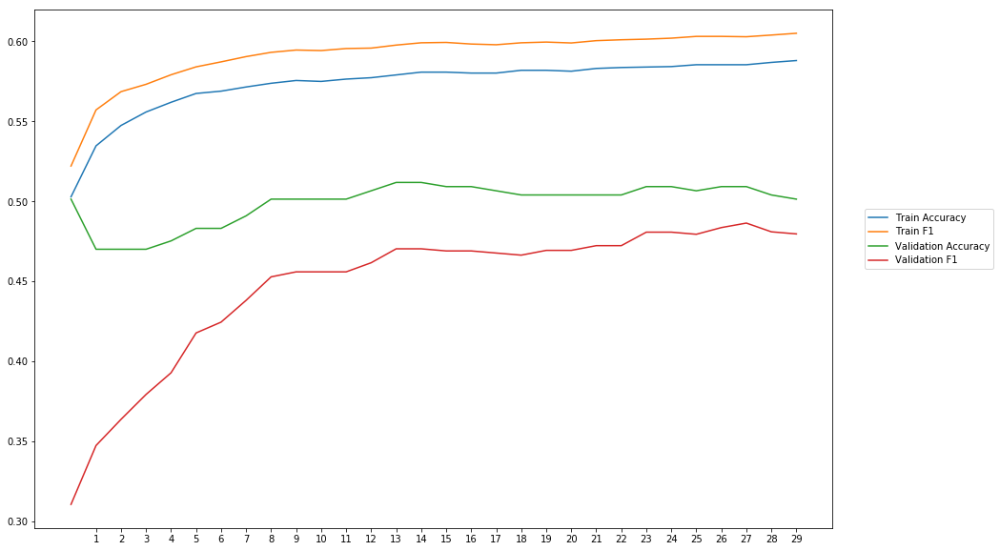

Average Accuracy: 49.90%
Average Precision: 49.59%
Average Recall: 41.05%
Average F1: 44.74%

-----Fold 9--------


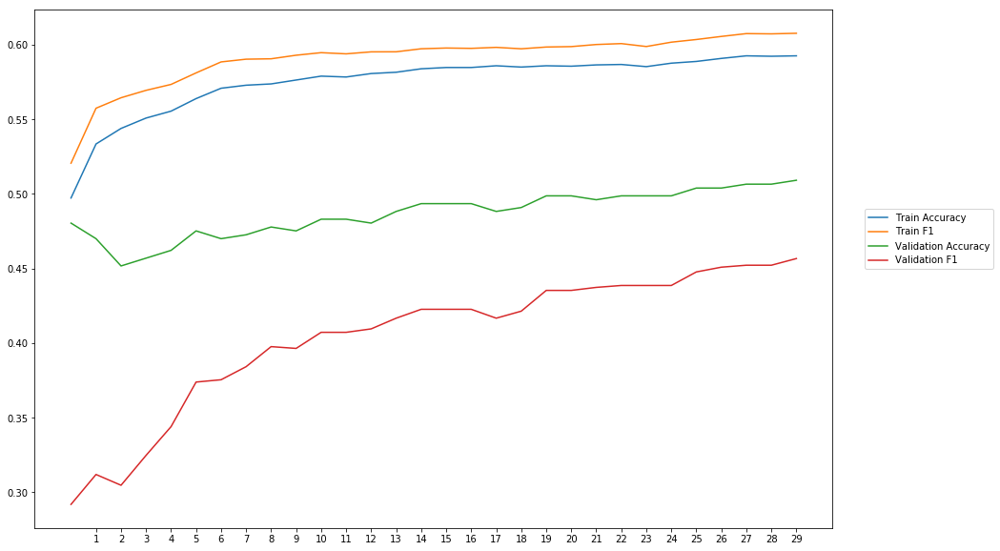

Average Accuracy: 48.69%
Average Precision: 47.80%
Average Recall: 35.25%
Average F1: 40.45%

-----Fold 10--------


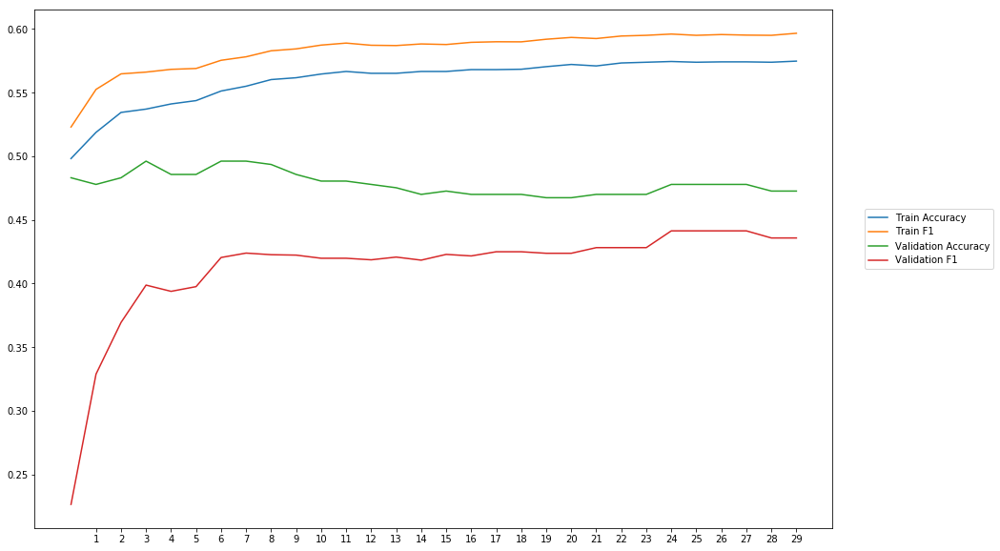

Average Accuracy: 47.83%
Average Precision: 47.06%
Average Recall: 37.05%
Average F1: 41.22%

-------Overallresults-------


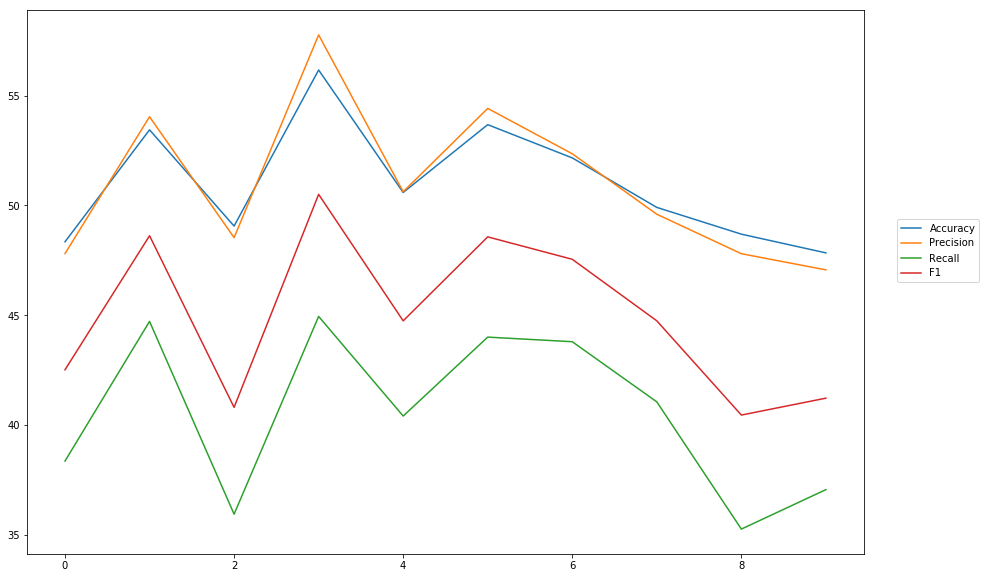

Accuracy: Mean = 50.98% (+/- 2.62%), Max = 56.16%, Min =  47.83%
Precision: Mean = 50.99% (+/- 3.36%), Max = 57.76%, Min =  47.06%
Recall: Mean = 40.55% (+/- 3.54%), Max = 44.94%, Min =  35.25%
F1: Mean = 44.97% (+/- 3.49%), Max = 50.50%, Min =  40.45%


In [38]:
cross_val_three_inputs(model_14, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Out01')

### weigth decay = 0,1

In [39]:
#Word Embeddings
wv_layer_15 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_15 = wv_layer_15(input_embedding_15)
x_embedding_15 = Dense(600, activation='relu')(embedded_sequences_15)
x_embedding_15 = Flatten()(x_embedding_15)

#Sentiment Features
input_sentiment_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_15 = Dense(600, activation='relu')(input_sentiment_15)

#POS Features
input_pos_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_15 = Dense(600, activation='relu')(input_pos_15)

#Concatination
concat_15 = concatenate([x_embedding_15, x_sentiment_15, x_pos_15])

preds_15 = Dense(2, activation='softmax', kernel_regularizer=regularizers.l1(0.1))(concat_15)

model_15 = Model(inputs=[input_embedding_15, input_sentiment_15, input_pos_15], outputs=preds_15)


-----Fold 1--------


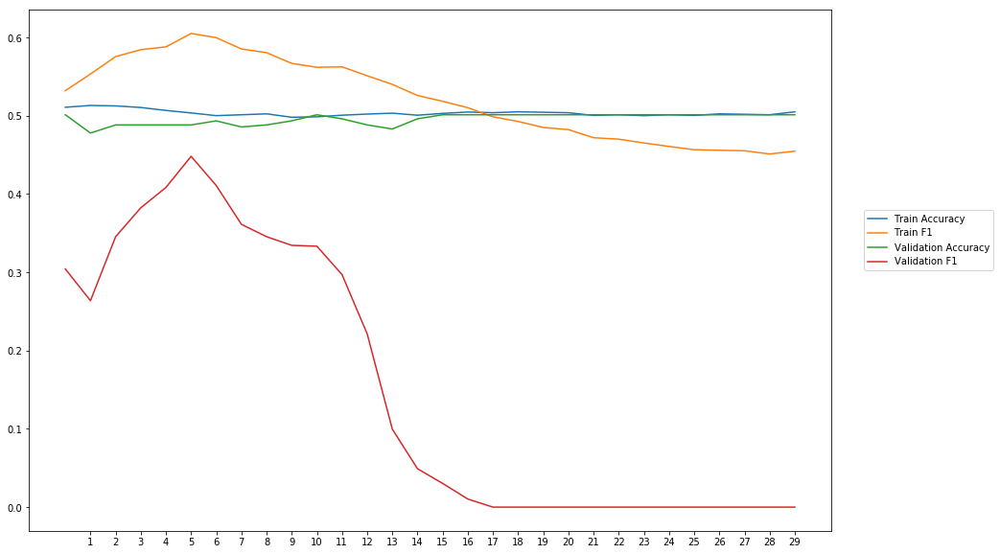

Average Accuracy: 49.59%
Average Precision: 26.79%
Average Recall: 12.17%
Average F1: 15.49%

-----Fold 2--------


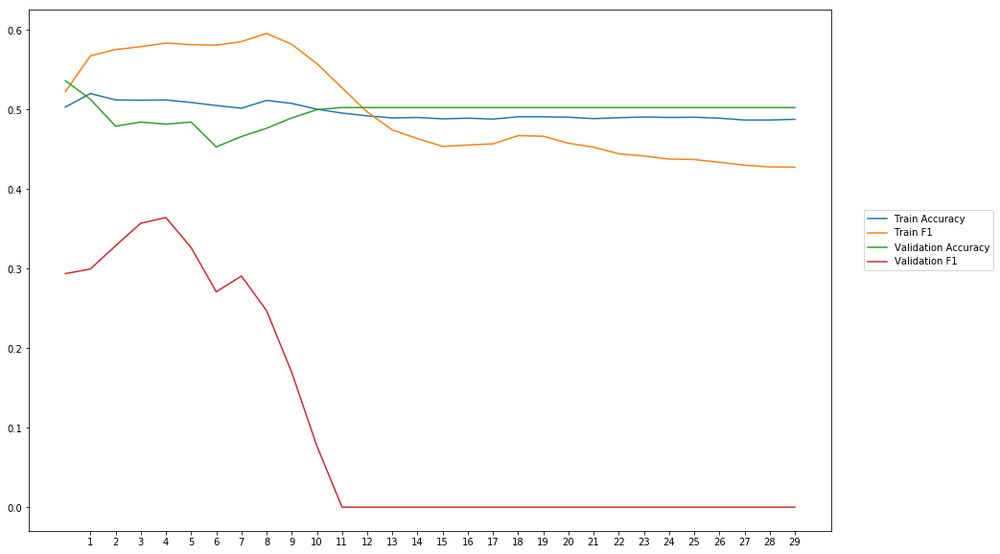

Average Accuracy: 49.71%
Average Precision: 17.25%
Average Recall: 7.47%
Average F1: 10.08%

-----Fold 3--------


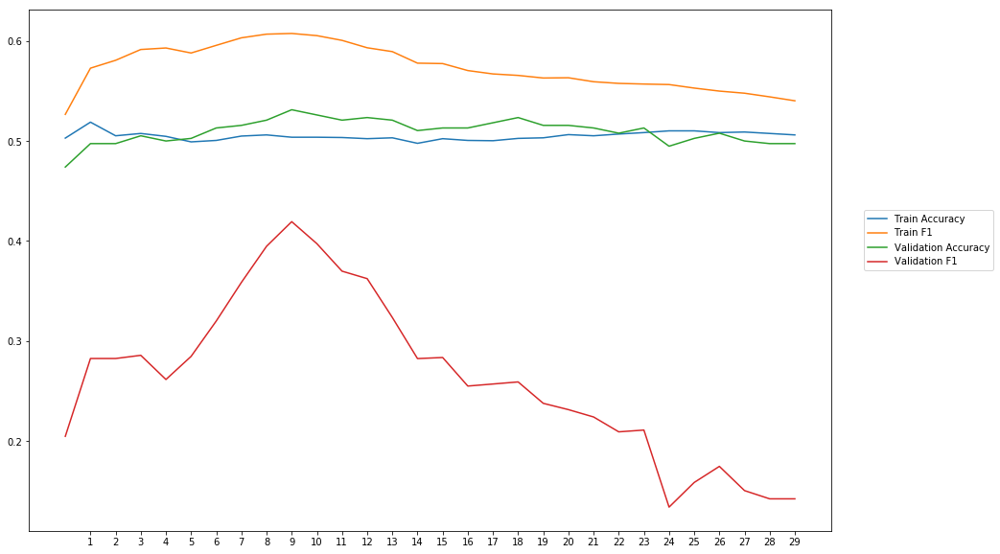

Average Accuracy: 50.97%
Average Precision: 51.62%
Average Recall: 18.31%
Average F1: 26.33%

-----Fold 4--------


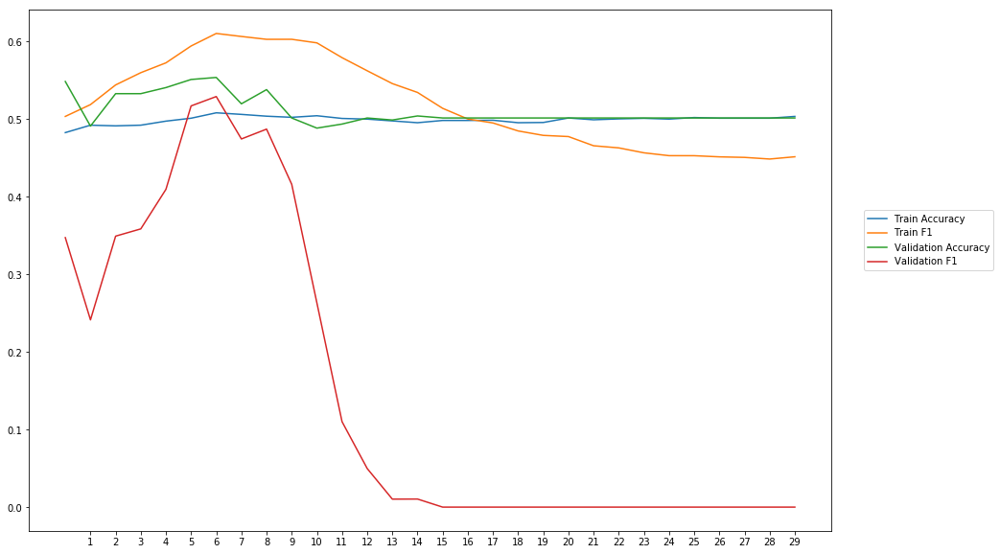

Average Accuracy: 51.04%
Average Precision: 27.43%
Average Recall: 12.44%
Average F1: 15.24%

-----Fold 5--------


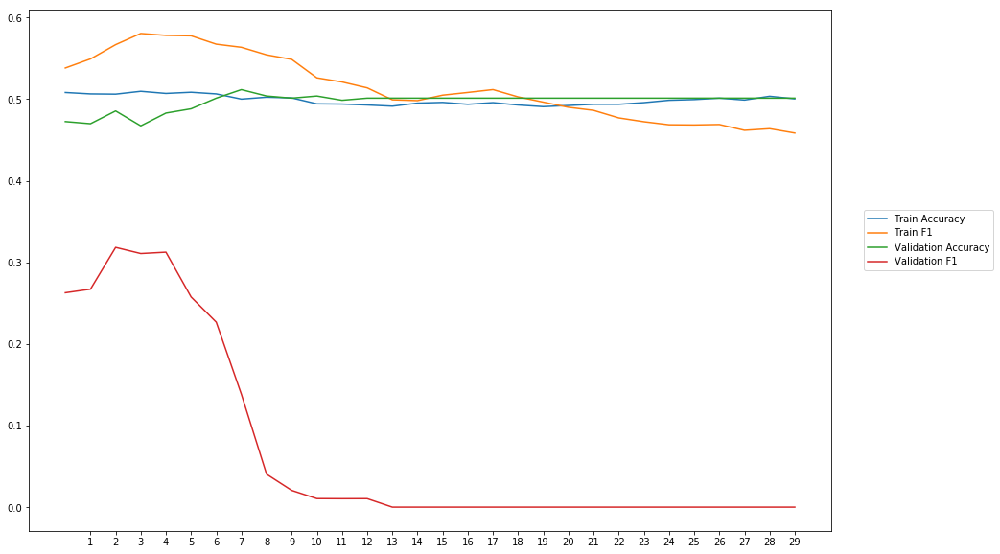

Average Accuracy: 49.70%
Average Precision: 22.28%
Average Recall: 5.17%
Average F1: 7.29%

-----Fold 6--------


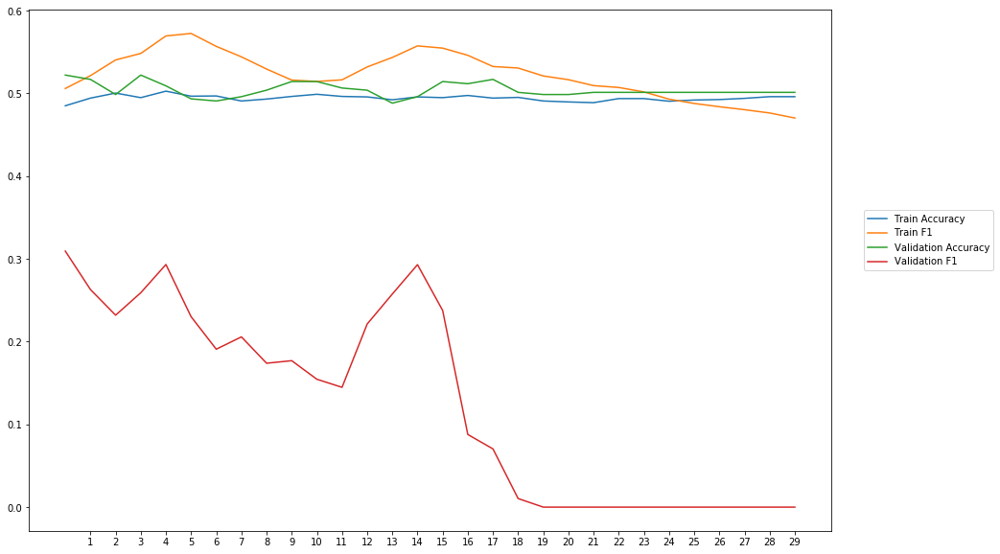

Average Accuracy: 50.44%
Average Precision: 34.45%
Average Recall: 8.22%
Average F1: 12.71%

-----Fold 7--------


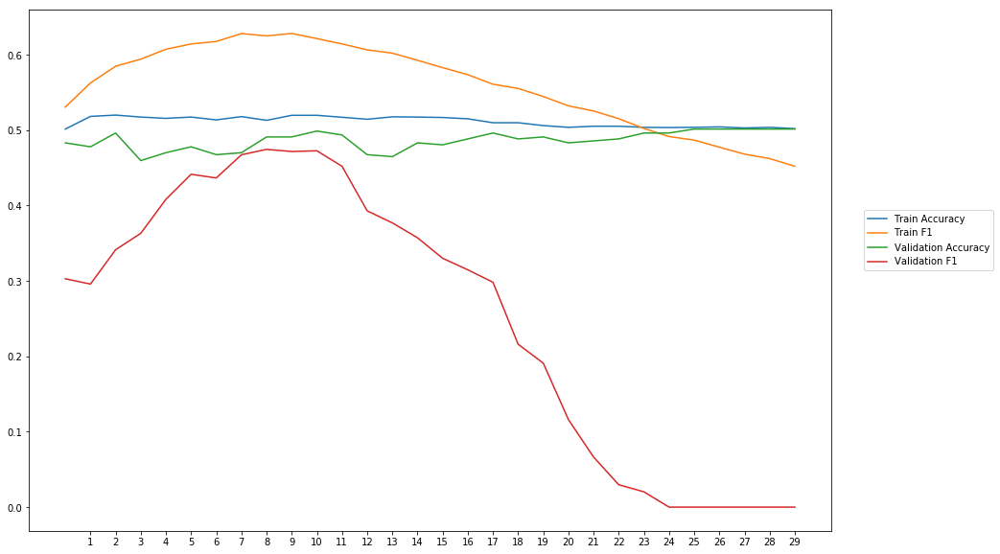

Average Accuracy: 48.63%
Average Precision: 35.80%
Average Recall: 21.73%
Average F1: 25.45%

-----Fold 8--------


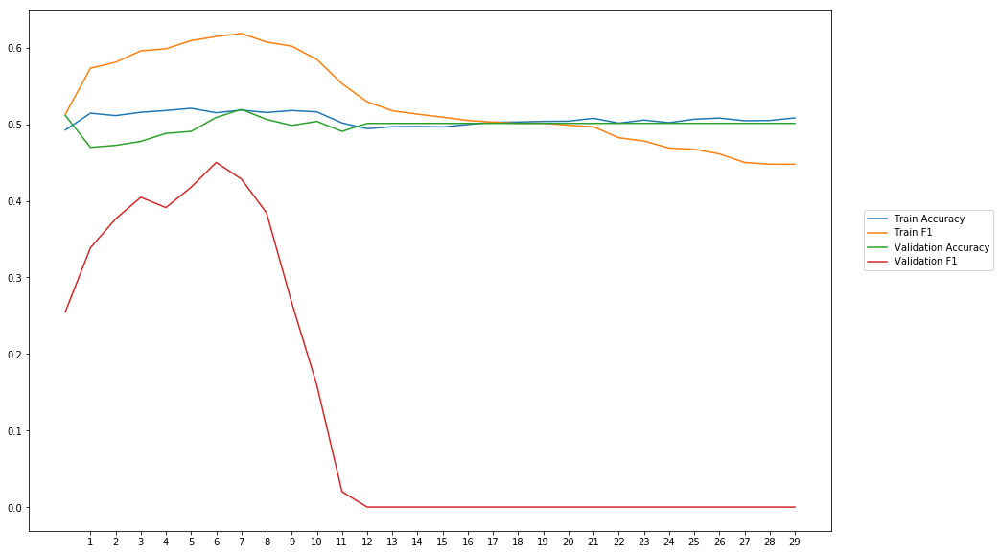

Average Accuracy: 49.88%
Average Precision: 18.93%
Average Recall: 10.58%
Average F1: 12.98%

-----Fold 9--------


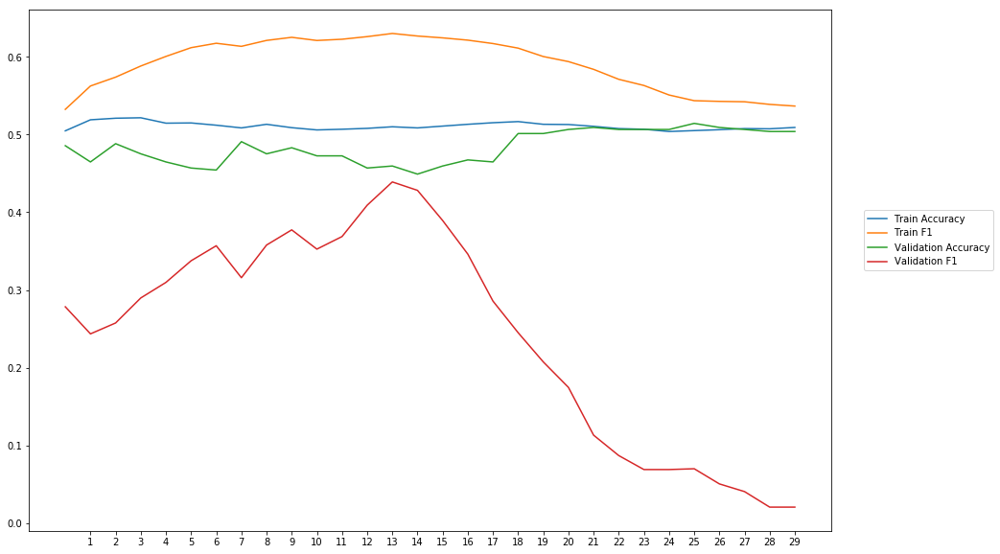

Average Accuracy: 48.39%
Average Precision: 51.30%
Average Recall: 19.23%
Average F1: 24.37%

-----Fold 10--------


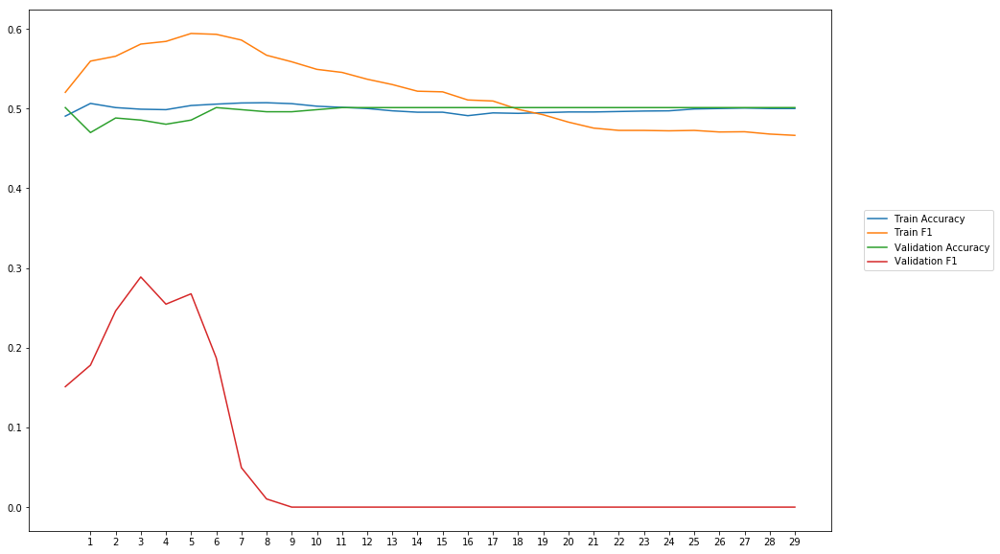

Average Accuracy: 49.76%
Average Precision: 13.12%
Average Recall: 3.65%
Average F1: 5.45%

-------Overallresults-------


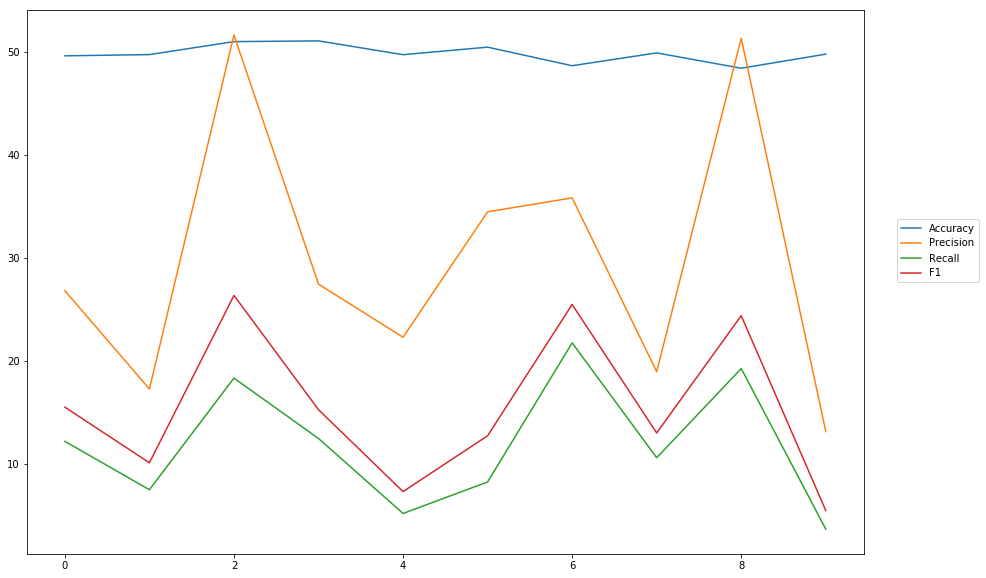

Accuracy: Mean = 49.81% (+/- 0.82%), Max = 51.04%, Min =  48.39%
Precision: Mean = 29.90% (+/- 12.73%), Max = 51.62%, Min =  13.12%
Recall: Mean = 11.90% (+/- 5.83%), Max = 21.73%, Min =  3.65%
F1: Mean = 15.54% (+/- 7.12%), Max = 26.33%, Min =  5.45%


In [40]:
cross_val_three_inputs(model_15, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1Out1')

# L2 for output layer

### weigth decay = 0,001

In [10]:
#Word Embeddings
wv_layer_16 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_16 = wv_layer_16(input_embedding_16)
x_embedding_16 = Dense(600, activation='relu')(embedded_sequences_16)
x_embedding_16 = Flatten()(x_embedding_16)

#Sentiment Features
input_sentiment_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_16 = Dense(600, activation='relu')(input_sentiment_16)

#POS Features
input_pos_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_16 = Dense(600, activation='relu')(input_pos_16)

#Concatination
concat_16 = concatenate([x_embedding_16, x_sentiment_16, x_pos_16])

preds_16 = Dense(2, activation='softmax',kernel_regularizer=regularizers.l2(0.001))(concat_16)

model_16 = Model(inputs=[input_embedding_16, input_sentiment_16, input_pos_16], outputs=preds_16)


-----Fold 1--------


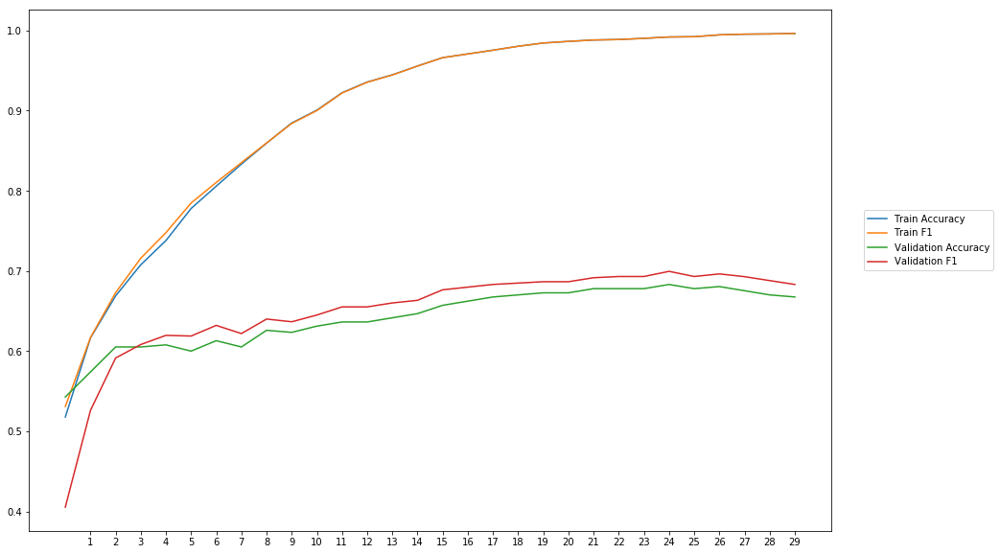

Average Accuracy: 64.29%
Average Precision: 63.16%
Average Recall: 67.48%
Average F1: 65.02%

-----Fold 2--------


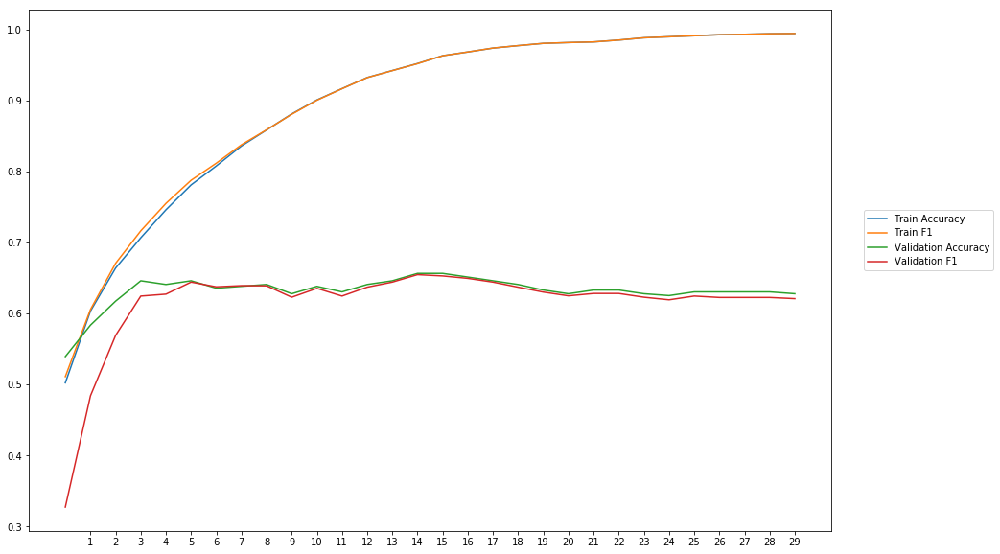

Average Accuracy: 63.15%
Average Precision: 63.63%
Average Recall: 60.23%
Average F1: 61.52%

-----Fold 3--------


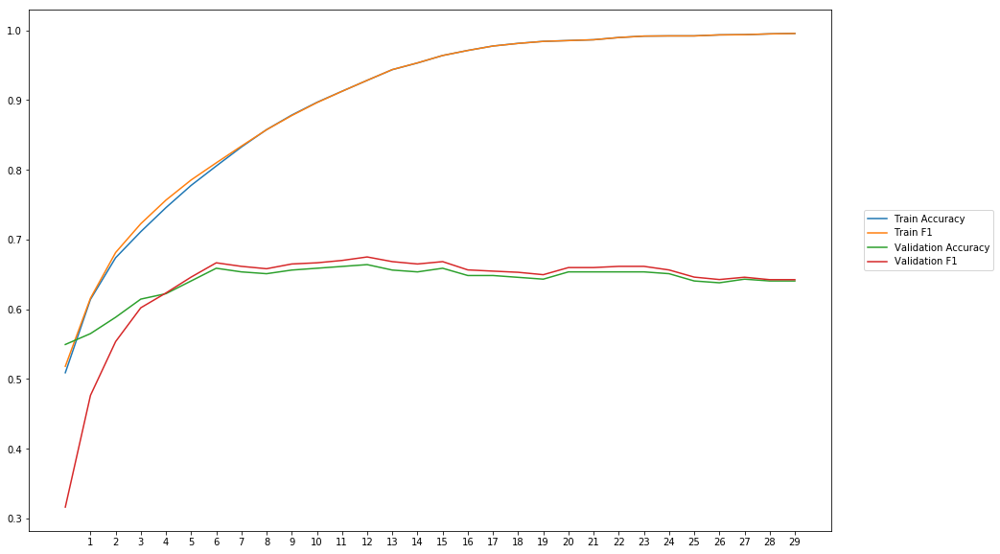

Average Accuracy: 64.03%
Average Precision: 63.71%
Average Recall: 64.03%
Average F1: 63.39%

-----Fold 4--------


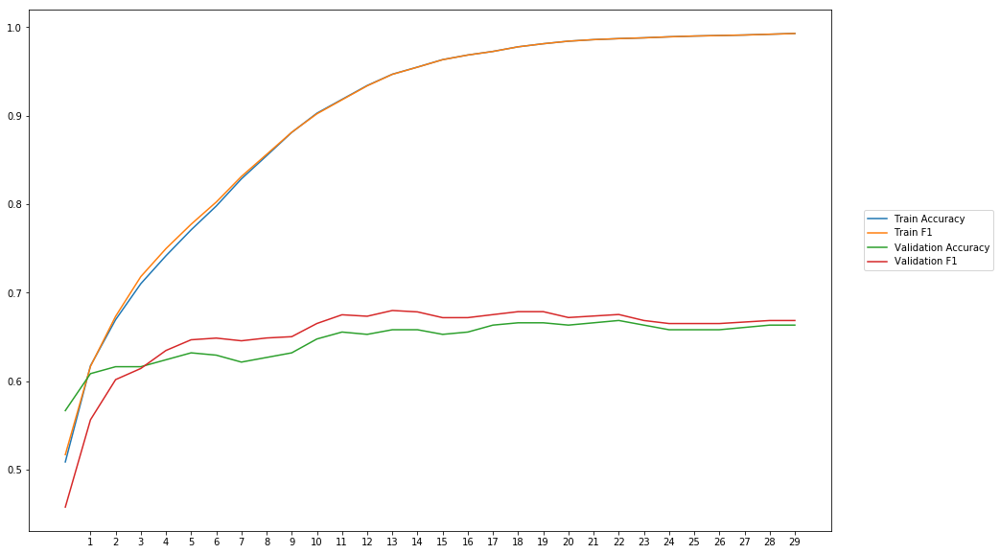

Average Accuracy: 64.56%
Average Precision: 63.75%
Average Recall: 66.98%
Average F1: 65.12%

-----Fold 5--------


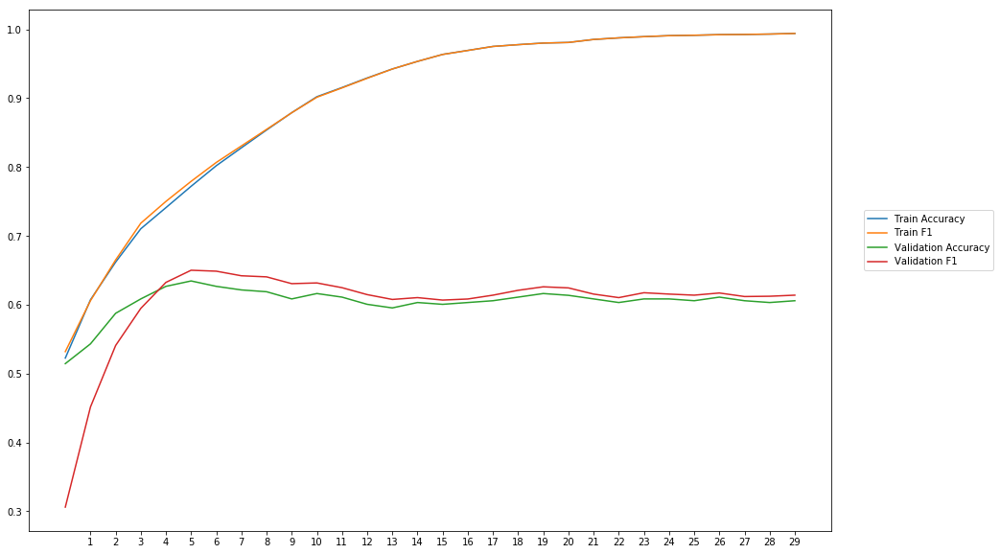

Average Accuracy: 60.42%
Average Precision: 59.96%
Average Recall: 61.13%
Average F1: 60.17%

-----Fold 6--------


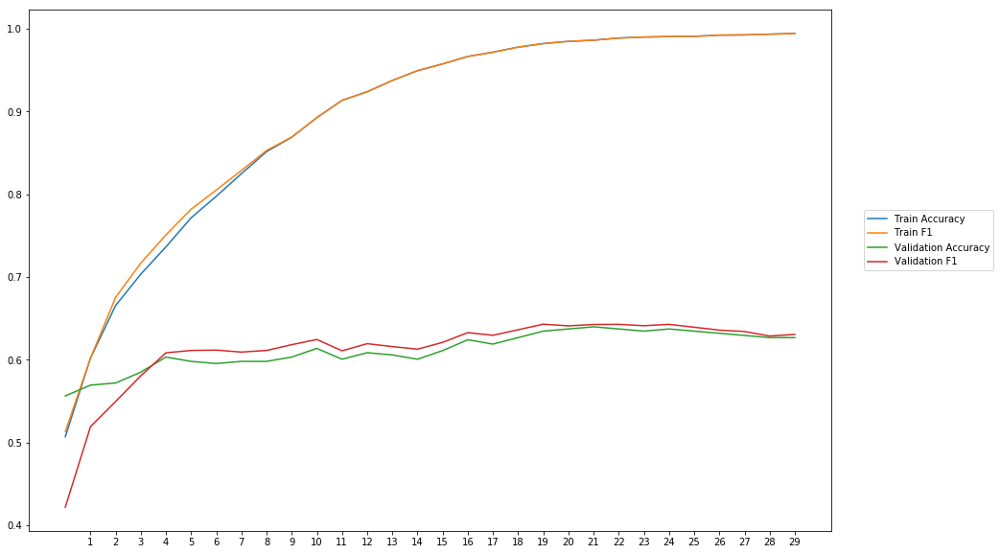

Average Accuracy: 61.18%
Average Precision: 60.86%
Average Recall: 61.95%
Average F1: 61.21%

-----Fold 7--------


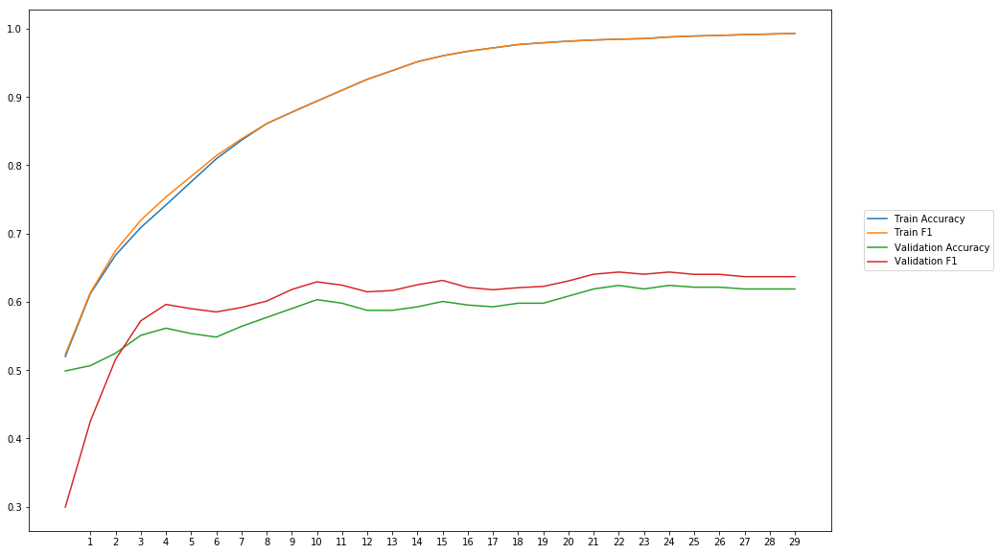

Average Accuracy: 58.74%
Average Precision: 57.63%
Average Recall: 63.33%
Average F1: 60.02%

-----Fold 8--------


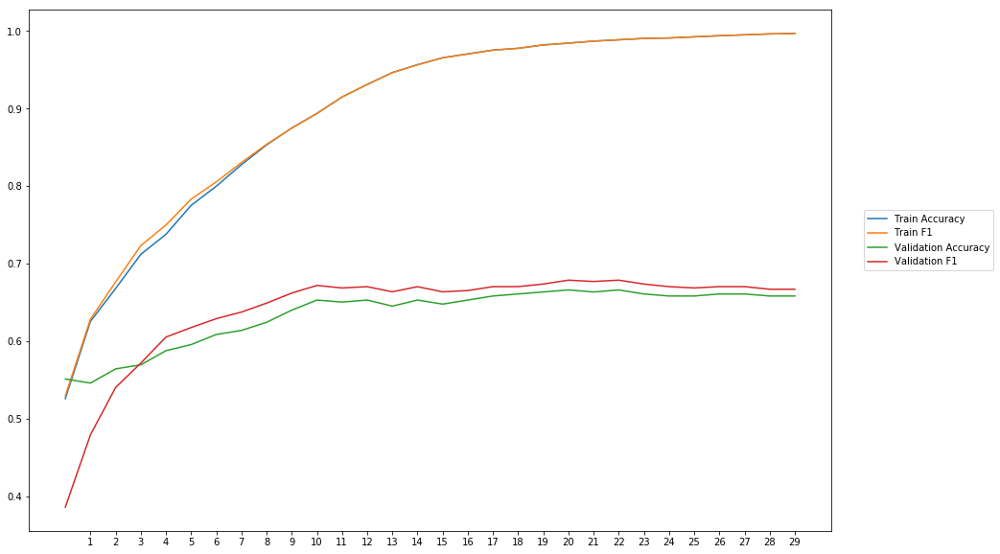

Average Accuracy: 63.47%
Average Precision: 62.59%
Average Recall: 65.99%
Average F1: 63.93%

-----Fold 9--------


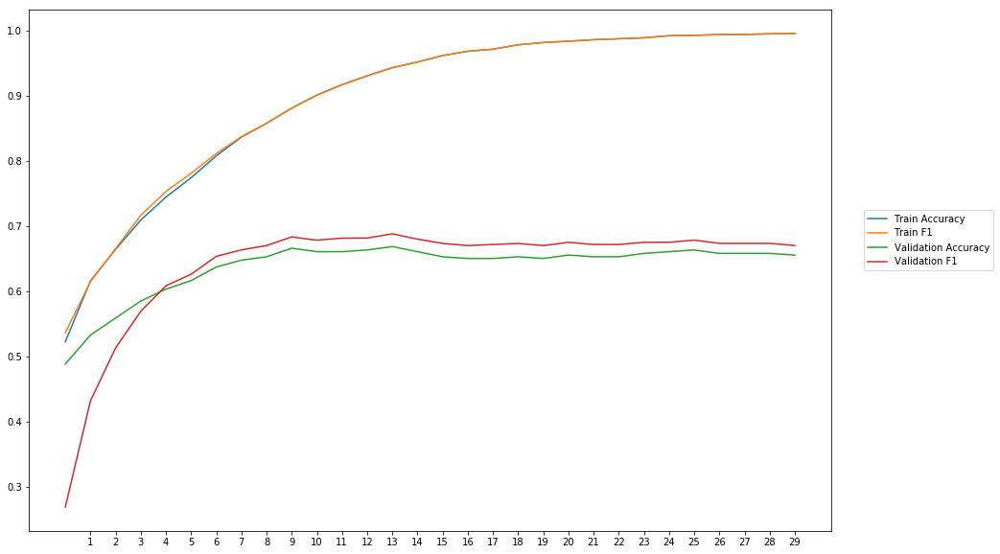

Average Accuracy: 63.76%
Average Precision: 62.41%
Average Recall: 66.42%
Average F1: 63.97%

-----Fold 10--------


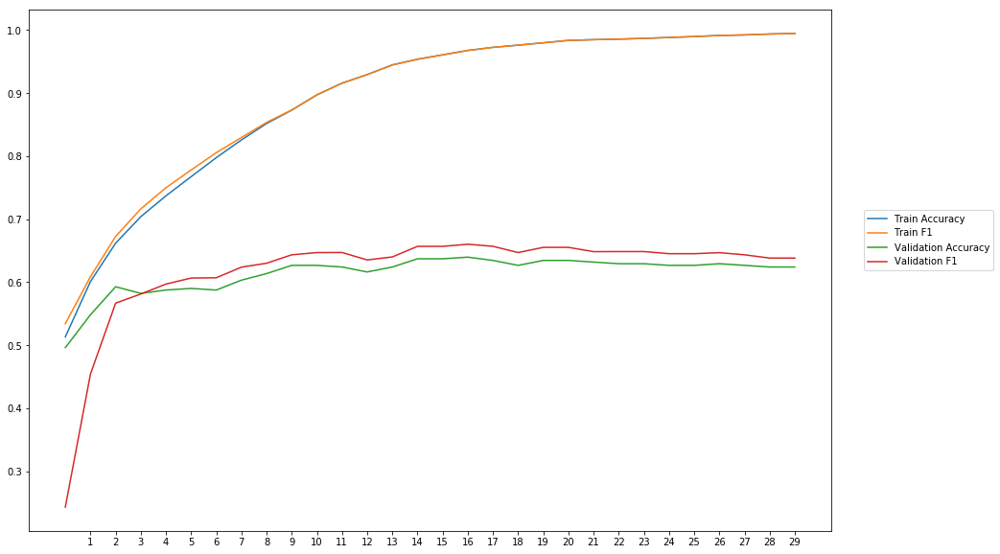

Average Accuracy: 61.37%
Average Precision: 60.31%
Average Recall: 64.08%
Average F1: 61.71%

-------Overallresults-------


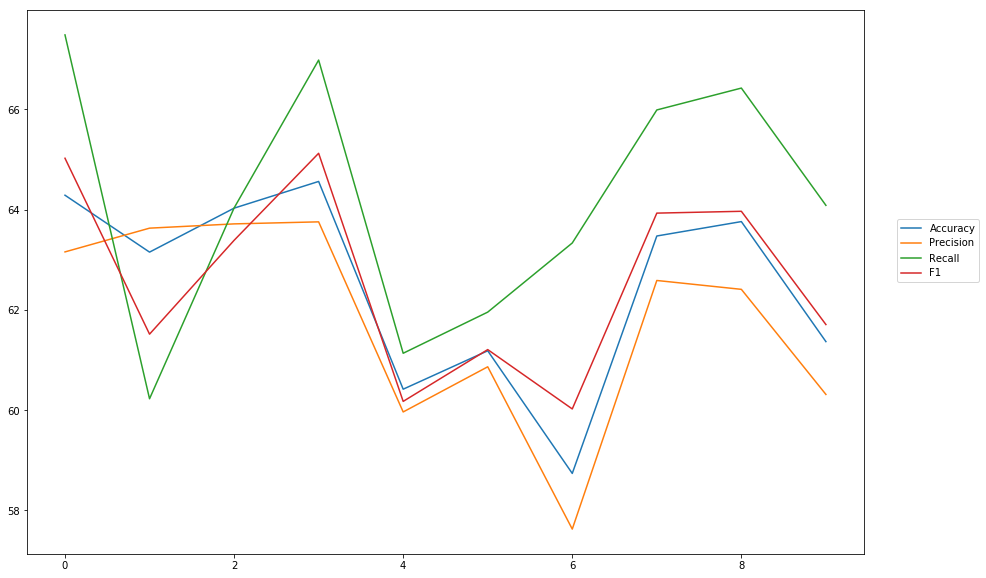

Accuracy: Mean = 62.50% (+/- 1.85%), Max = 64.56%, Min =  58.74%
Precision: Mean = 61.80% (+/- 1.94%), Max = 63.75%, Min =  57.63%
Recall: Mean = 64.16% (+/- 2.40%), Max = 67.48%, Min =  60.23%
F1: Mean = 62.61% (+/- 1.81%), Max = 65.12%, Min =  60.02%


In [42]:
cross_val_three_inputs(model_16, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Out001')

### weigth decay = 0,01

In [43]:
#Word Embeddings
wv_layer_17 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_17 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_17 = wv_layer_17(input_embedding_17)
x_embedding_17 = Dense(600, activation='relu')(embedded_sequences_17)
x_embedding_17 = Flatten()(x_embedding_17)

#Sentiment Features
input_sentiment_17 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_17 = Dense(600, activation='relu')(input_sentiment_17)

#POS Features
input_pos_17 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_17 = Dense(600, activation='relu')(input_pos_17)

#Concatination
concat_17 = concatenate([x_embedding_17, x_sentiment_17, x_pos_17])

preds_17 = Dense(2, activation='softmax',kernel_regularizer=regularizers.l2(0.01))(concat_17)

model_17 = Model(inputs=[input_embedding_17, input_sentiment_17, input_pos_17], outputs=preds_17)


-----Fold 1--------


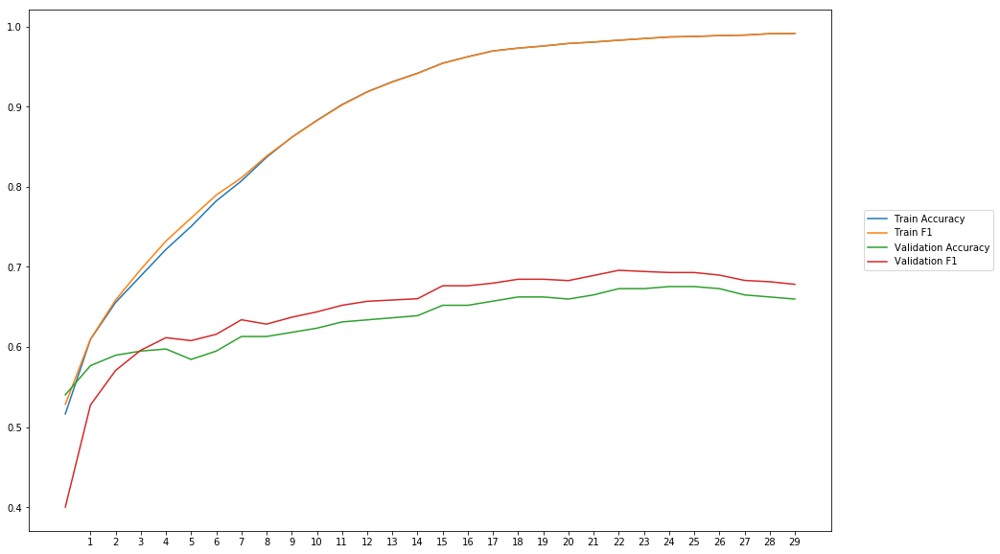

Average Accuracy: 63.51%
Average Precision: 62.17%
Average Recall: 67.80%
Average F1: 64.60%

-----Fold 2--------


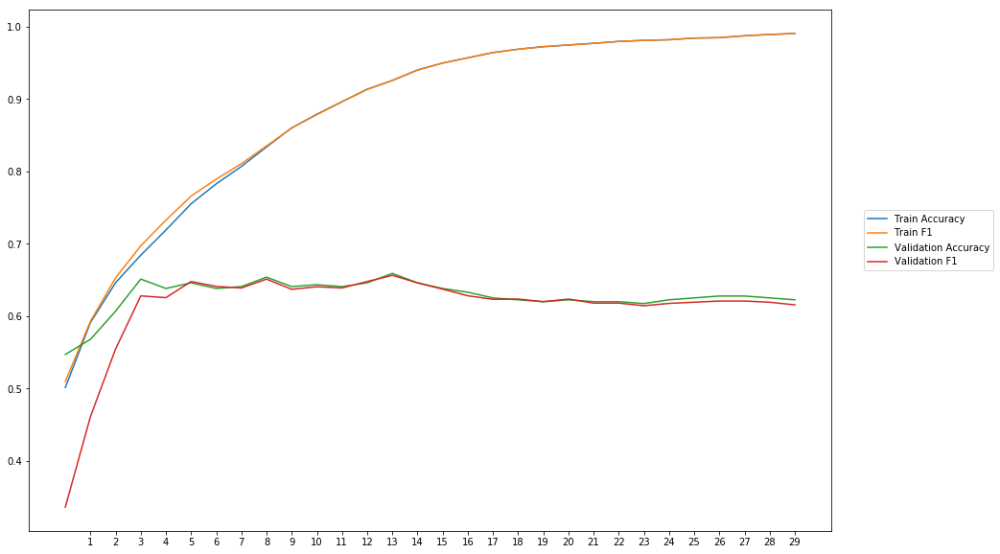

Average Accuracy: 62.77%
Average Precision: 63.18%
Average Recall: 60.12%
Average F1: 61.22%

-----Fold 3--------


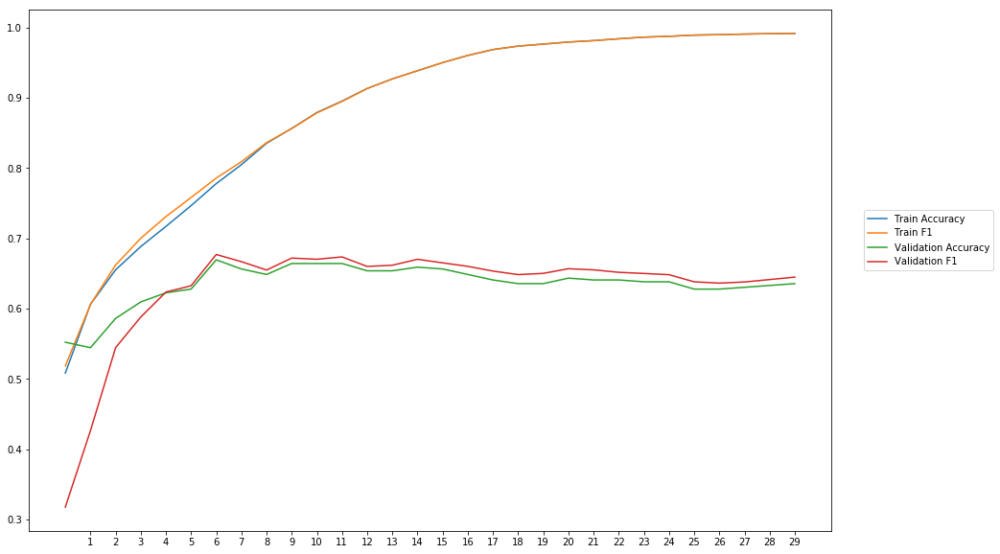

Average Accuracy: 63.48%
Average Precision: 63.08%
Average Recall: 63.86%
Average F1: 62.91%

-----Fold 4--------


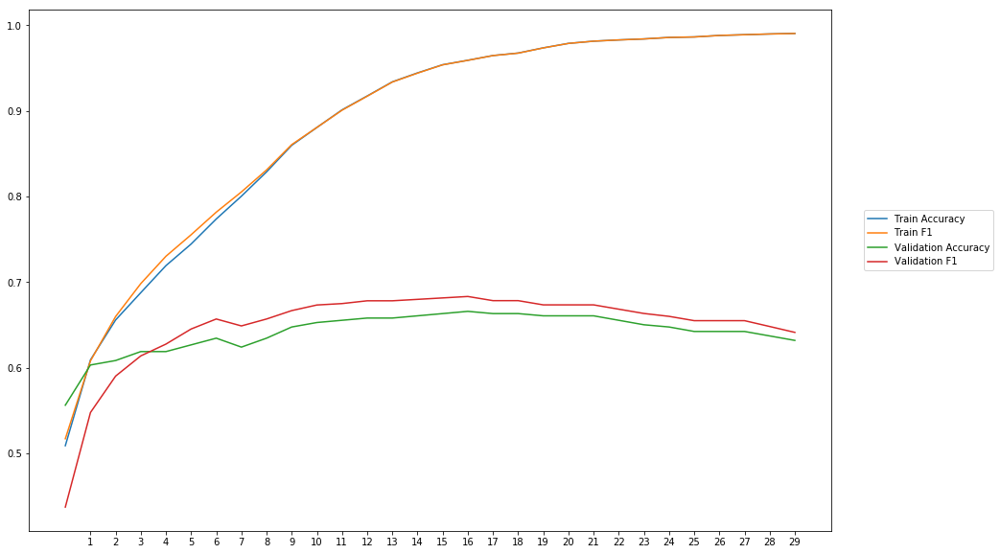

Average Accuracy: 64.14%
Average Precision: 63.16%
Average Recall: 67.17%
Average F1: 64.87%

-----Fold 5--------


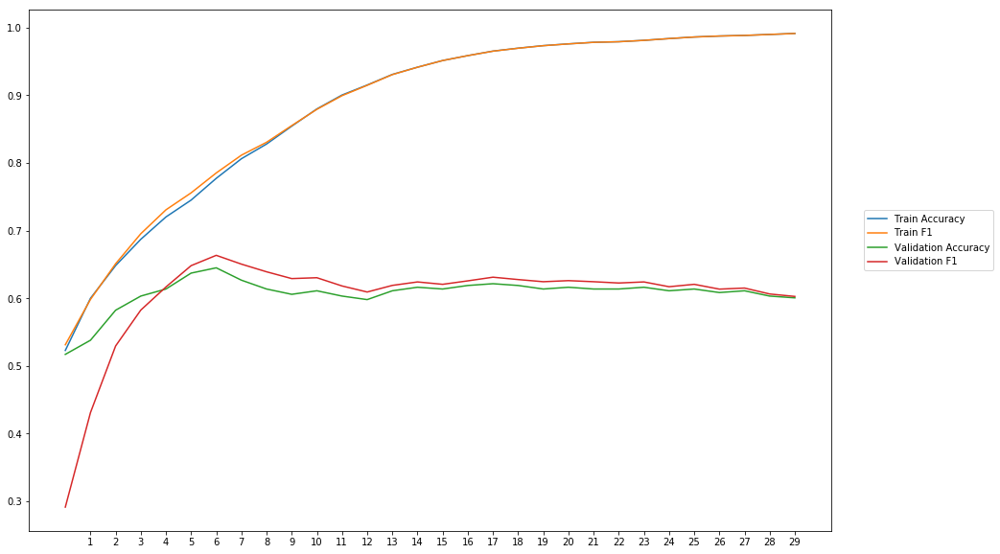

Average Accuracy: 60.71%
Average Precision: 60.31%
Average Recall: 61.12%
Average F1: 60.27%

-----Fold 6--------


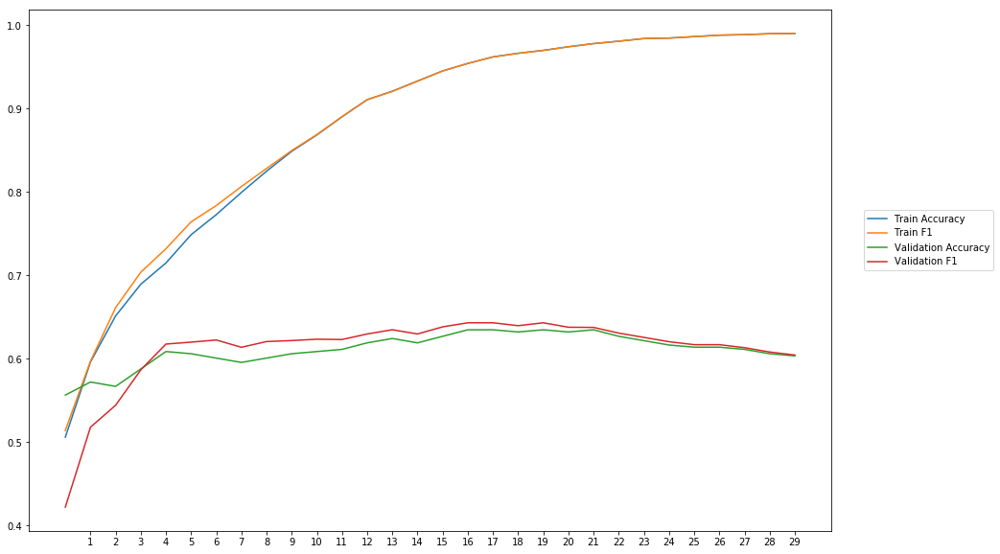

Average Accuracy: 61.06%
Average Precision: 60.72%
Average Recall: 61.97%
Average F1: 61.13%

-----Fold 7--------


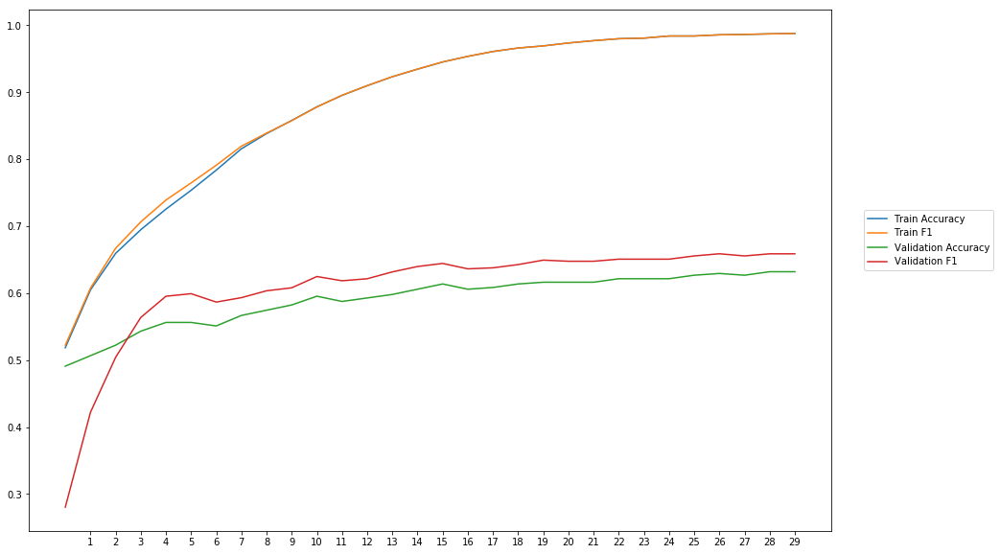

Average Accuracy: 59.09%
Average Precision: 57.64%
Average Recall: 65.10%
Average F1: 60.78%

-----Fold 8--------


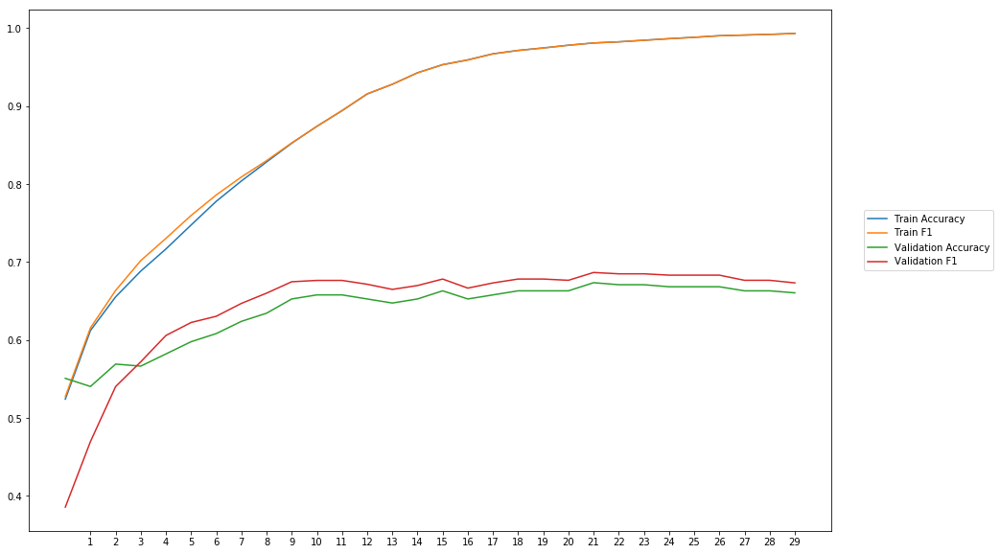

Average Accuracy: 63.89%
Average Precision: 62.80%
Average Recall: 67.02%
Average F1: 64.51%

-----Fold 9--------


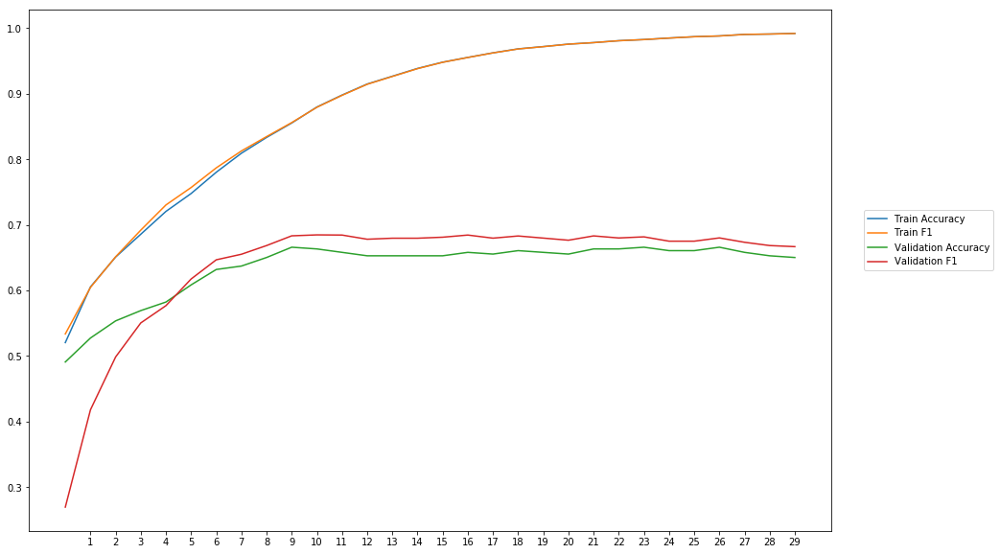

Average Accuracy: 63.59%
Average Precision: 62.12%
Average Recall: 66.63%
Average F1: 63.86%

-----Fold 10--------


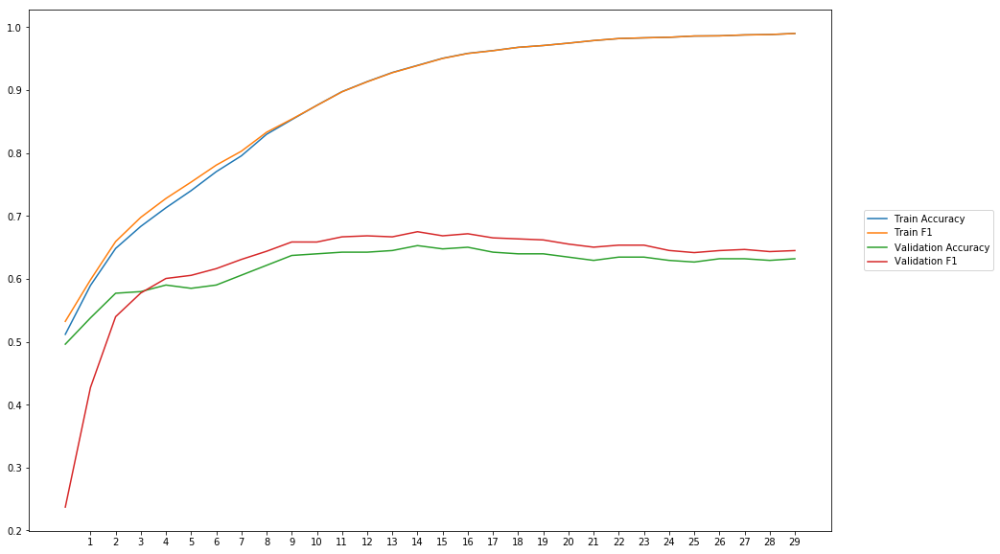

Average Accuracy: 61.91%
Average Precision: 60.70%
Average Recall: 64.96%
Average F1: 62.27%

-------Overallresults-------


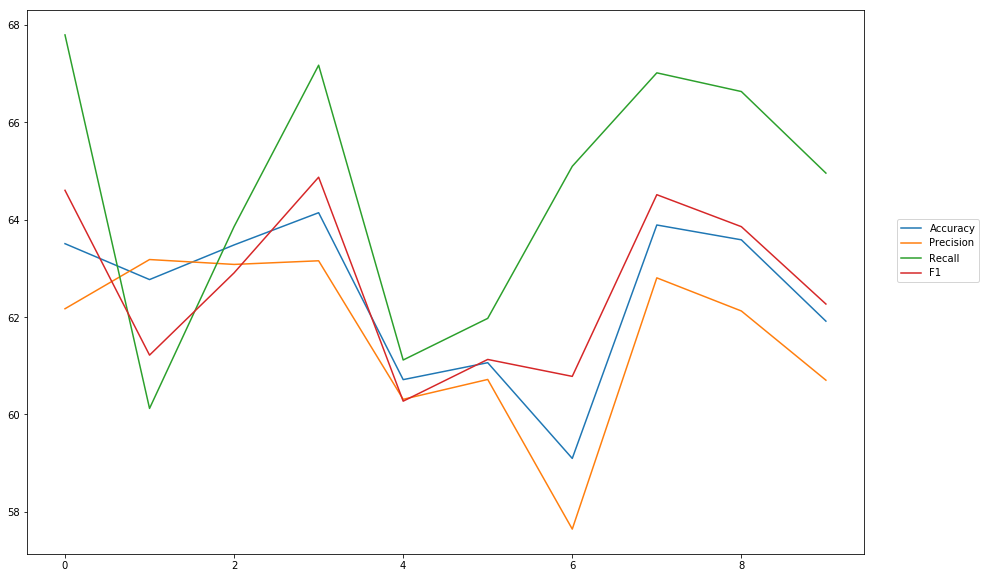

Accuracy: Mean = 62.42% (+/- 1.58%), Max = 64.14%, Min =  59.09%
Precision: Mean = 61.59% (+/- 1.68%), Max = 63.18%, Min =  57.64%
Recall: Mean = 64.57% (+/- 2.58%), Max = 67.80%, Min =  60.12%
F1: Mean = 62.64% (+/- 1.66%), Max = 64.87%, Min =  60.27%


In [44]:
cross_val_three_inputs(model_17, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Out01')

### weigth decay = 0,1

In [45]:
#Word Embeddings
wv_layer_18 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

input_embedding_18 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_18 = wv_layer_18(input_embedding_18)
x_embedding_18 = Dense(600, activation='relu')(embedded_sequences_18)
x_embedding_18 = Flatten()(x_embedding_18)

#Sentiment Features
input_sentiment_18 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_18 = Dense(600, activation='relu')(input_sentiment_18)

#POS Features
input_pos_18 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_18 = Dense(600, activation='relu')(input_pos_18)

#Concatination
concat_18 = concatenate([x_embedding_18, x_sentiment_18, x_pos_18])

preds_18 = Dense(2, activation='softmax', kernel_regularizer=regularizers.l2(0.1))(concat_18)

model_18 = Model(inputs=[input_embedding_18, input_sentiment_18, input_pos_18], outputs=preds_18)


-----Fold 1--------


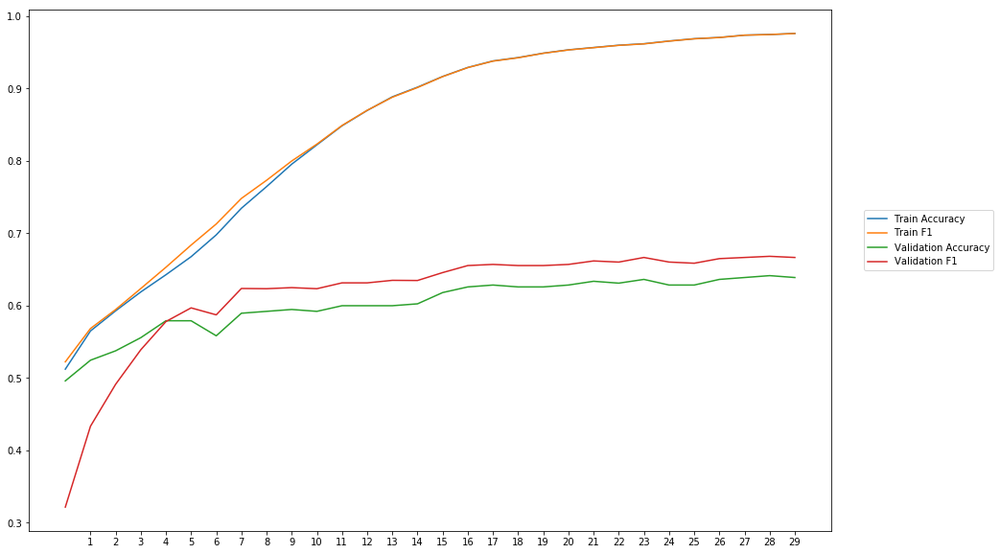

Average Accuracy: 60.23%
Average Precision: 58.78%
Average Recall: 65.52%
Average F1: 61.59%

-----Fold 2--------


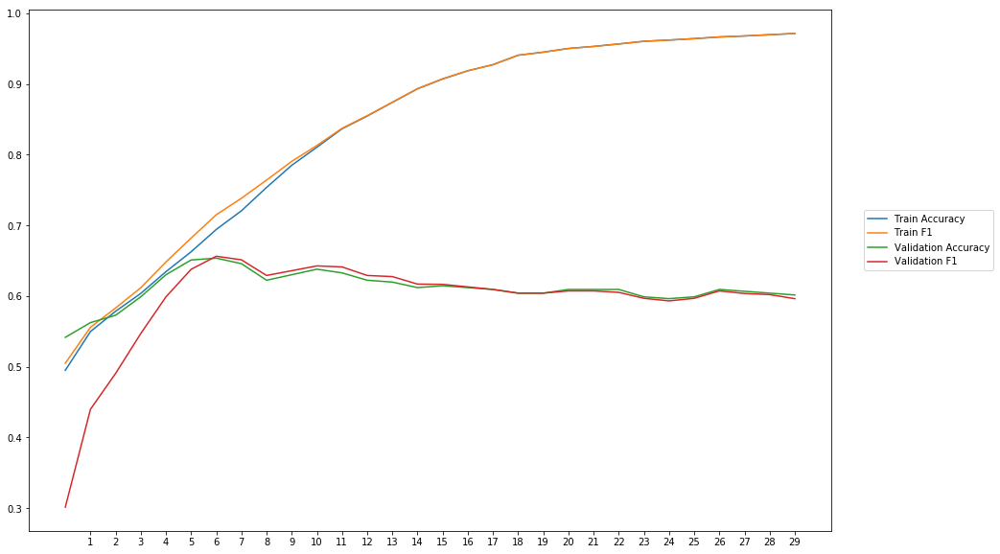

Average Accuracy: 61.08%
Average Precision: 61.44%
Average Recall: 58.48%
Average F1: 59.37%

-----Fold 3--------


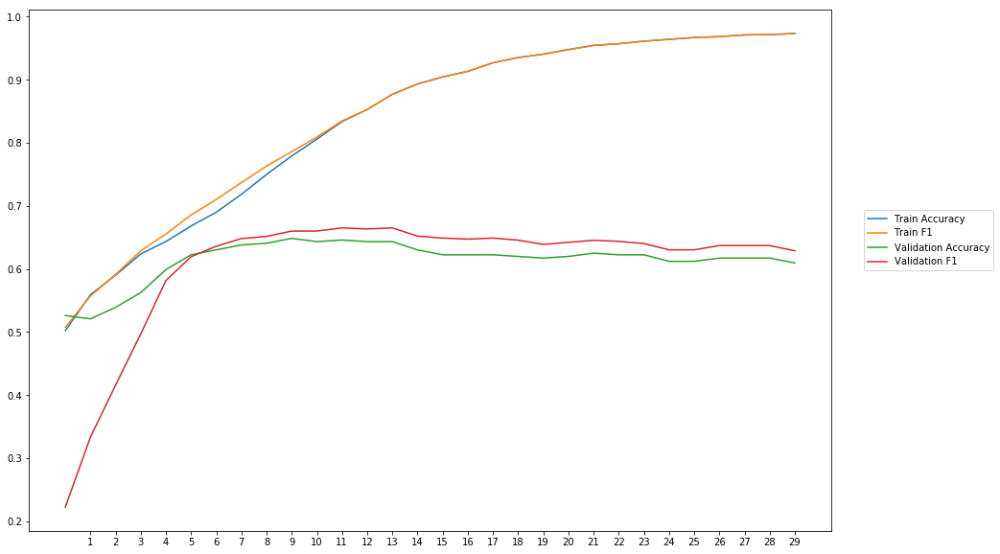

Average Accuracy: 61.37%
Average Precision: 60.64%
Average Recall: 62.50%
Average F1: 60.57%

-----Fold 4--------


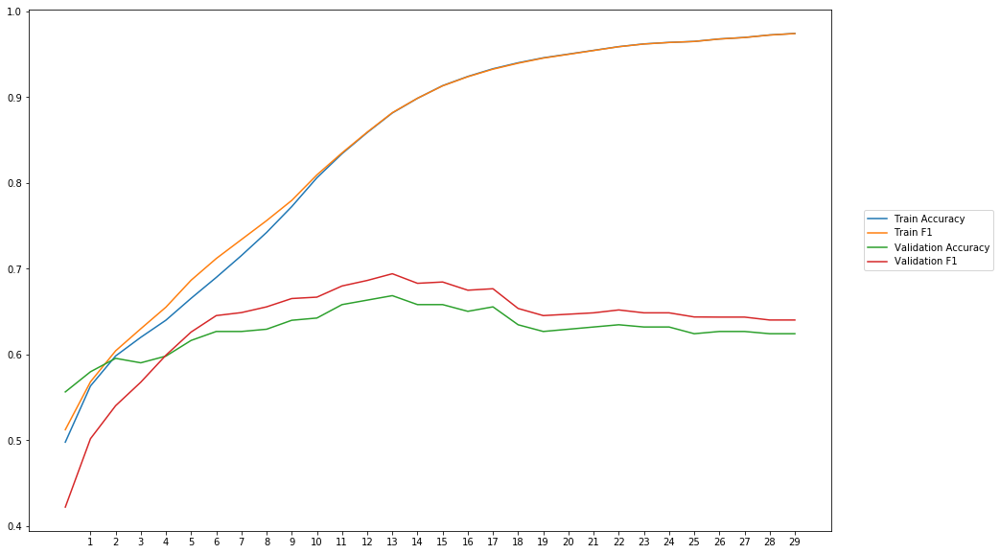

Average Accuracy: 62.85%
Average Precision: 61.89%
Average Recall: 66.09%
Average F1: 63.56%

-----Fold 5--------


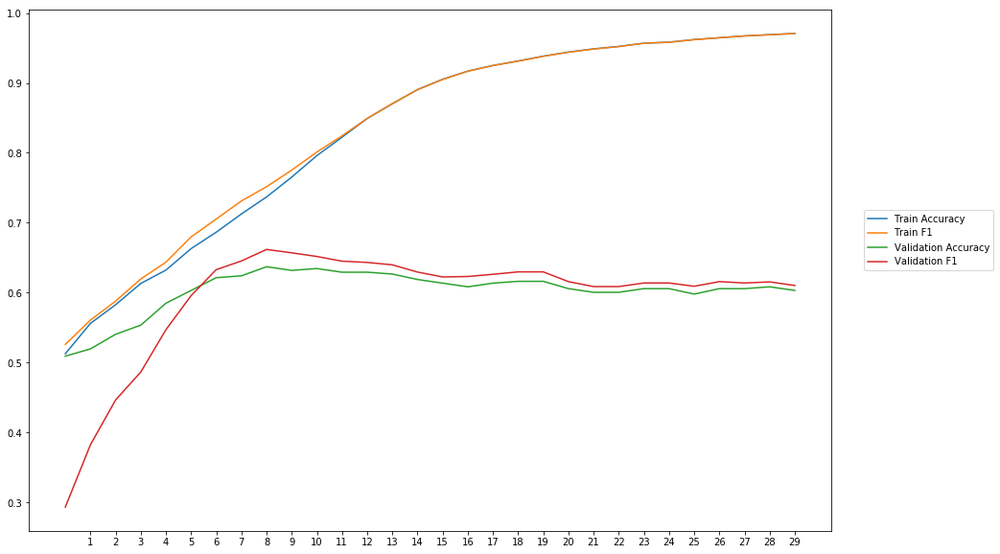

Average Accuracy: 60.23%
Average Precision: 59.77%
Average Recall: 60.05%
Average F1: 59.38%

-----Fold 6--------


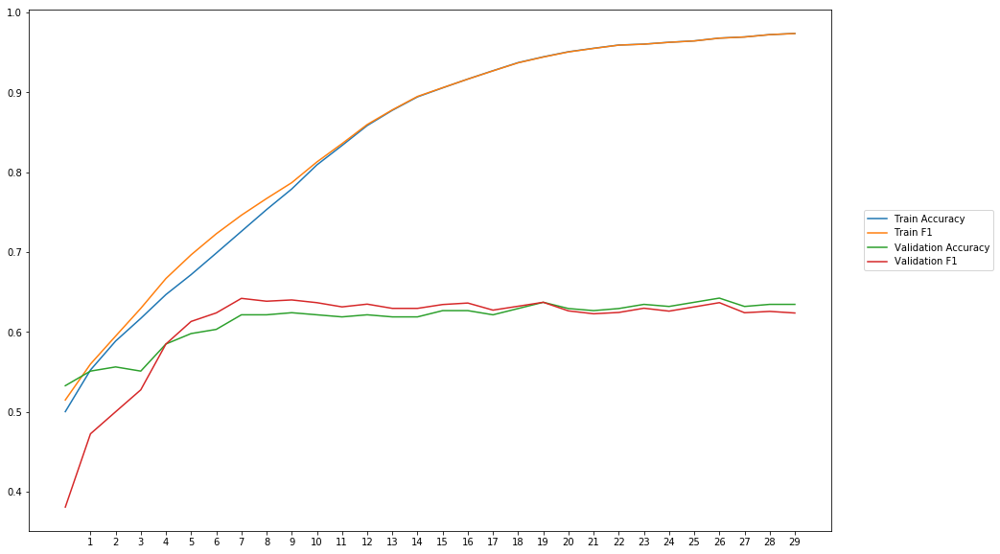

Average Accuracy: 61.38%
Average Precision: 61.27%
Average Recall: 60.75%
Average F1: 60.74%

-----Fold 7--------


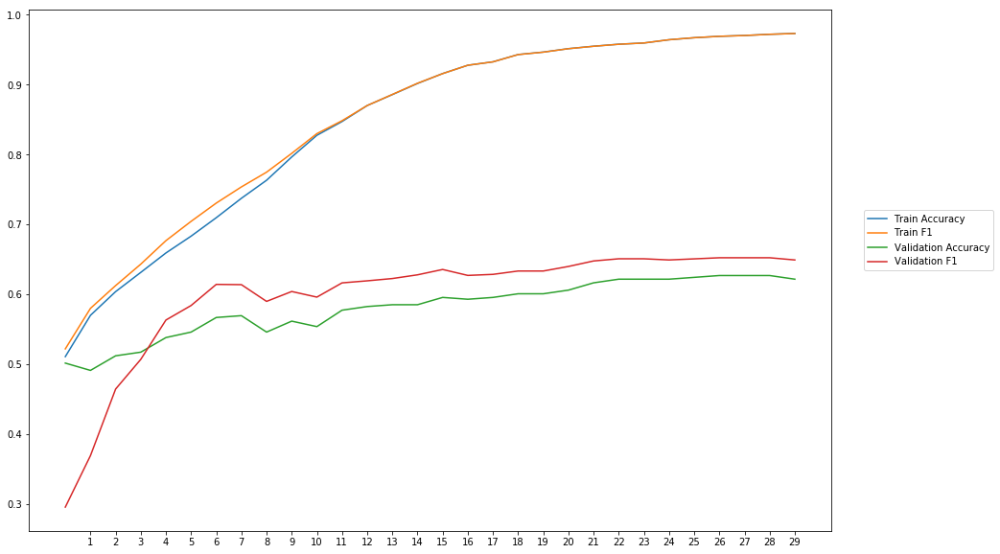

Average Accuracy: 58.09%
Average Precision: 56.73%
Average Recall: 64.22%
Average F1: 59.78%

-----Fold 8--------


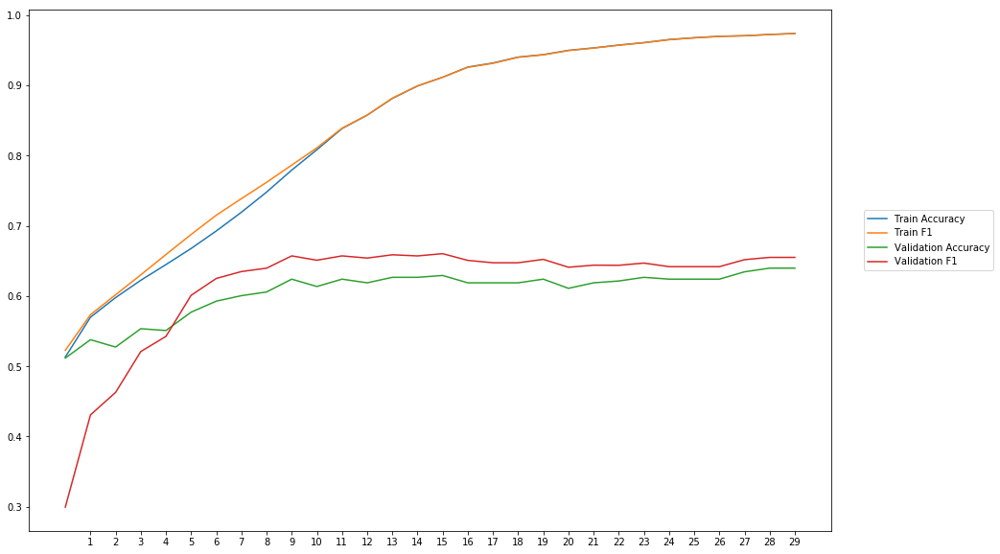

Average Accuracy: 60.55%
Average Precision: 59.30%
Average Recall: 64.75%
Average F1: 61.38%

-----Fold 9--------


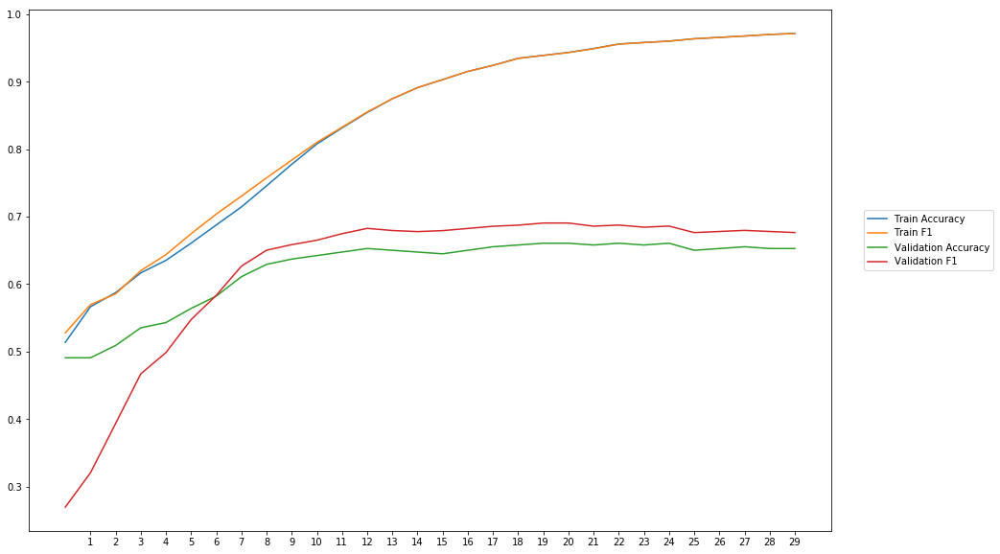

Average Accuracy: 62.21%
Average Precision: 60.44%
Average Recall: 65.45%
Average F1: 62.14%

-----Fold 10--------


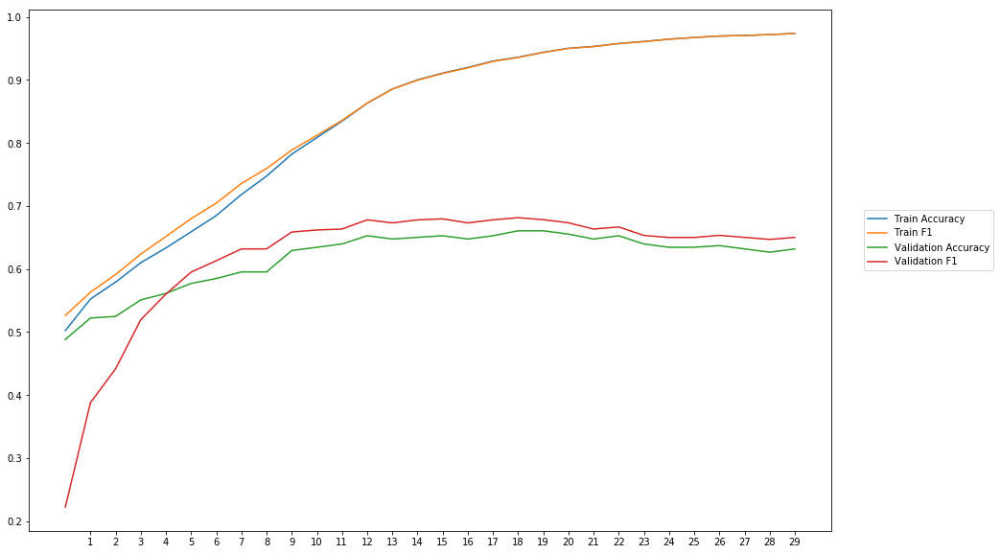

Average Accuracy: 61.73%
Average Precision: 60.33%
Average Recall: 64.76%
Average F1: 61.88%

-------Overallresults-------


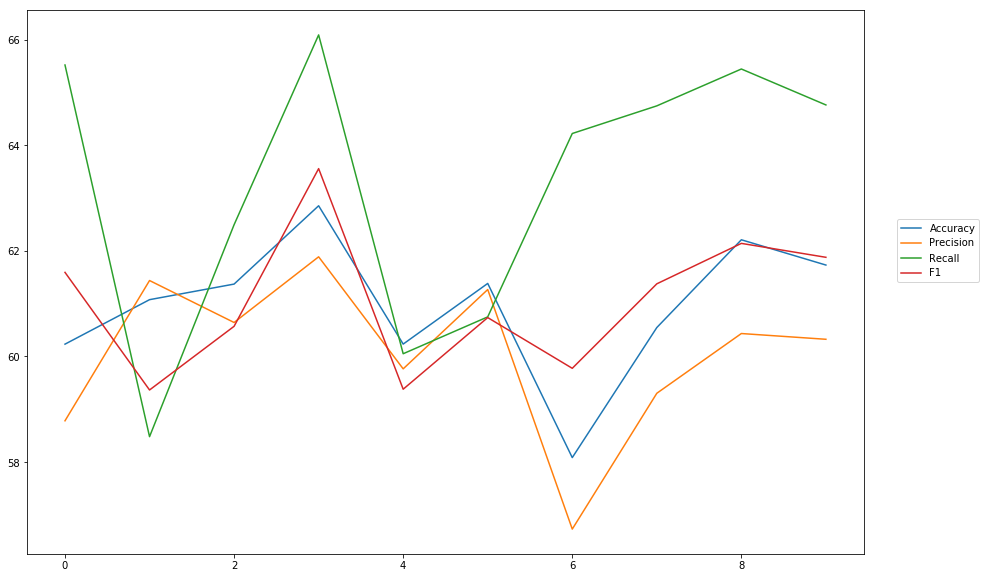

Accuracy: Mean = 60.97% (+/- 1.25%), Max = 62.85%, Min =  58.09%
Precision: Mean = 60.06% (+/- 1.44%), Max = 61.89%, Min =  56.73%
Recall: Mean = 63.26% (+/- 2.52%), Max = 66.09%, Min =  58.48%
F1: Mean = 61.04% (+/- 1.27%), Max = 63.56%, Min =  59.37%


In [46]:
cross_val_three_inputs(model_18, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2Out1')

# L1 for all layer

### weigth decay = 0,001

In [47]:
#Word Embeddings
wv_layer_19 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer = regularizers.l1(0.001))

input_embedding_19 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_19 = wv_layer_19(input_embedding_19)
x_embedding_19 = Dense(600, activation='relu',kernel_regularizer=regularizers.l1(0.001))(embedded_sequences_19)
x_embedding_19 = Flatten()(x_embedding_19)

#Sentiment Features
input_sentiment_19 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_19 = Dense(600, activation='relu',kernel_regularizer=regularizers.l1(0.001))(input_sentiment_19)

#POS Features
input_pos_19 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_19 = Dense(600, activation='relu',kernel_regularizer=regularizers.l1(0.001))(input_pos_19)

#Concatination
concat_19 = concatenate([x_embedding_19, x_sentiment_19, x_pos_19])

preds_19 = Dense(2, activation='softmax', kernel_regularizer=regularizers.l1(0.001))(concat_19)

model_19 = Model(inputs=[input_embedding_19, input_sentiment_19, input_pos_19], outputs=preds_19)


-----Fold 1--------


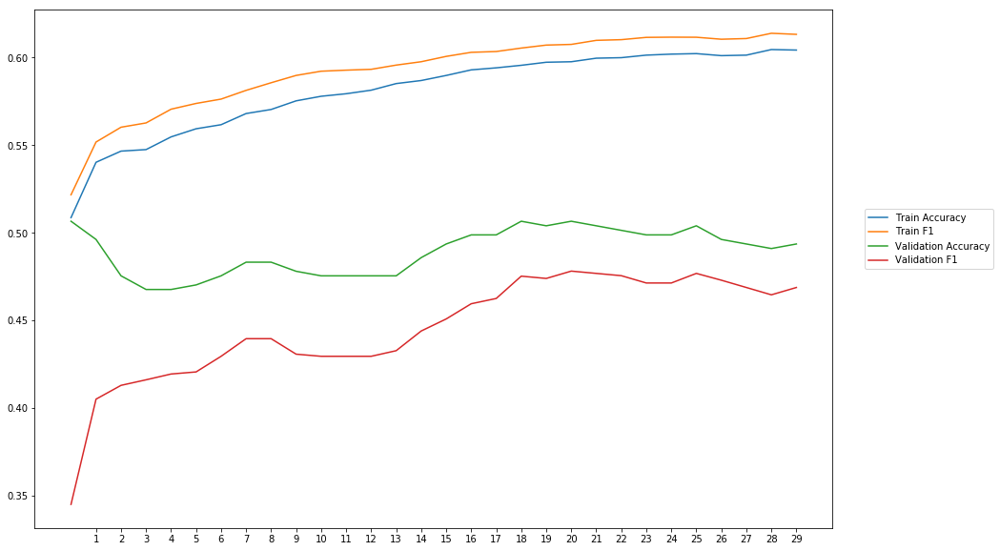

Average Accuracy: 48.93%
Average Precision: 48.58%
Average Recall: 41.34%
Average F1: 44.56%

-----Fold 2--------


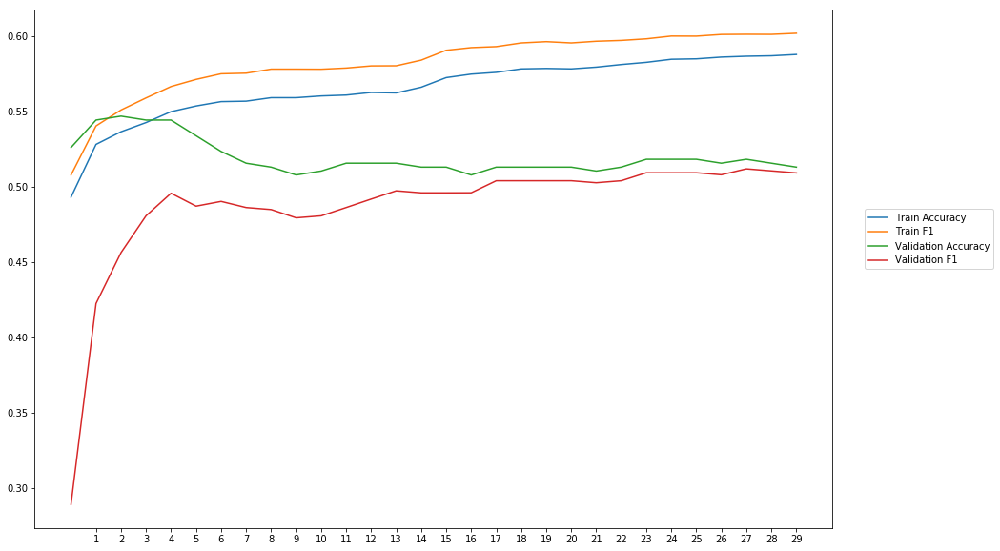

Average Accuracy: 51.94%
Average Precision: 52.16%
Average Recall: 46.35%
Average F1: 48.69%

-----Fold 3--------


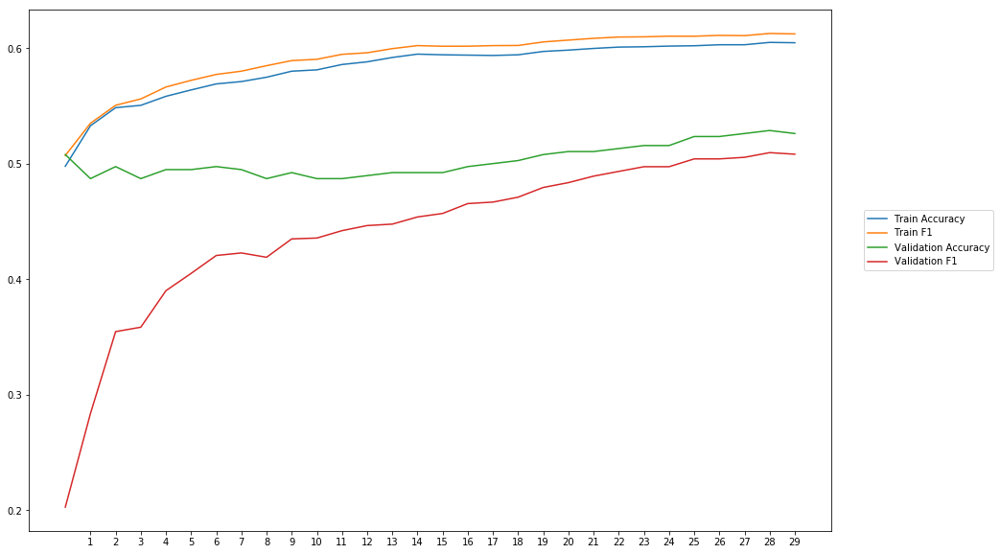

Average Accuracy: 50.27%
Average Precision: 49.88%
Average Recall: 40.51%
Average F1: 44.15%

-----Fold 4--------


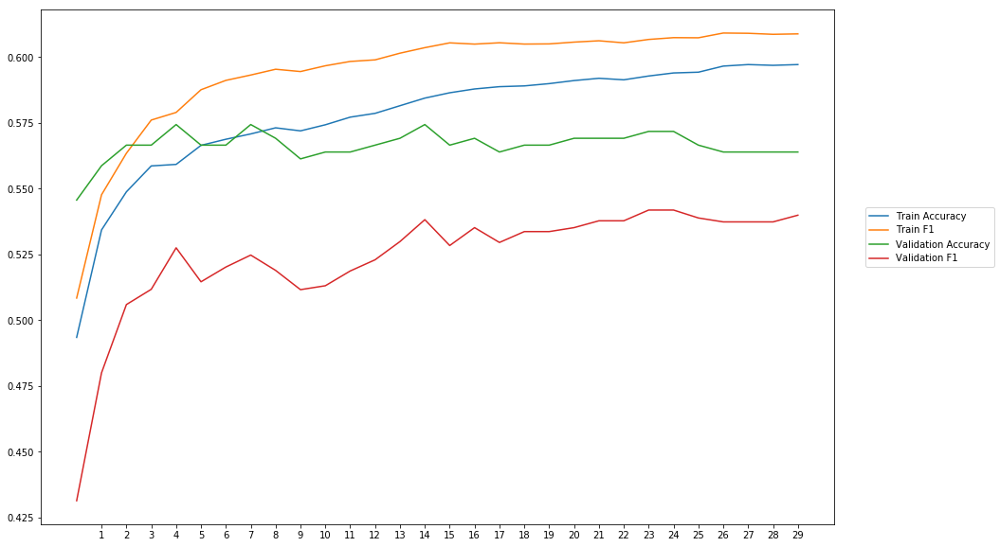

Average Accuracy: 56.65%
Average Precision: 57.90%
Average Recall: 47.96%
Average F1: 52.39%

-----Fold 5--------


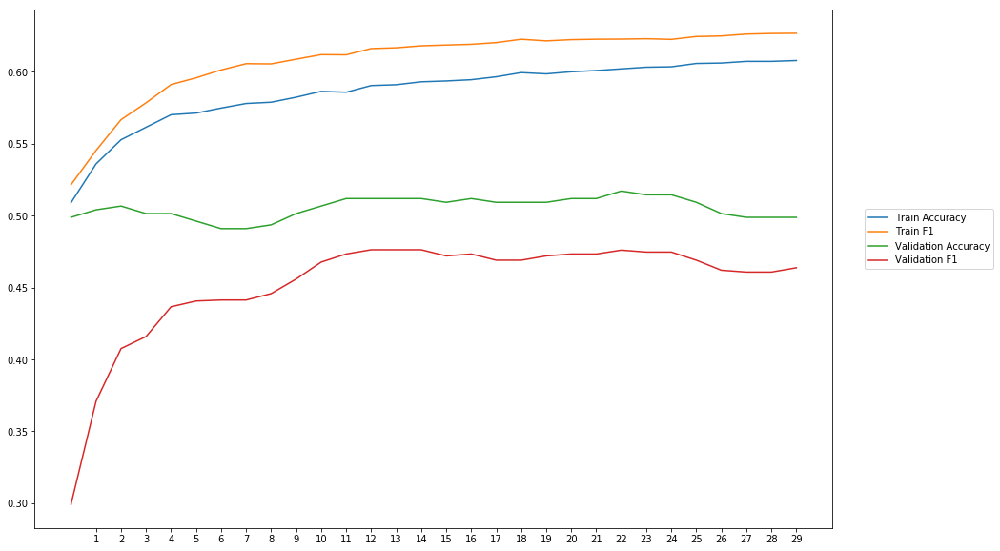

Average Accuracy: 50.54%
Average Precision: 50.47%
Average Recall: 41.26%
Average F1: 45.22%

-----Fold 6--------


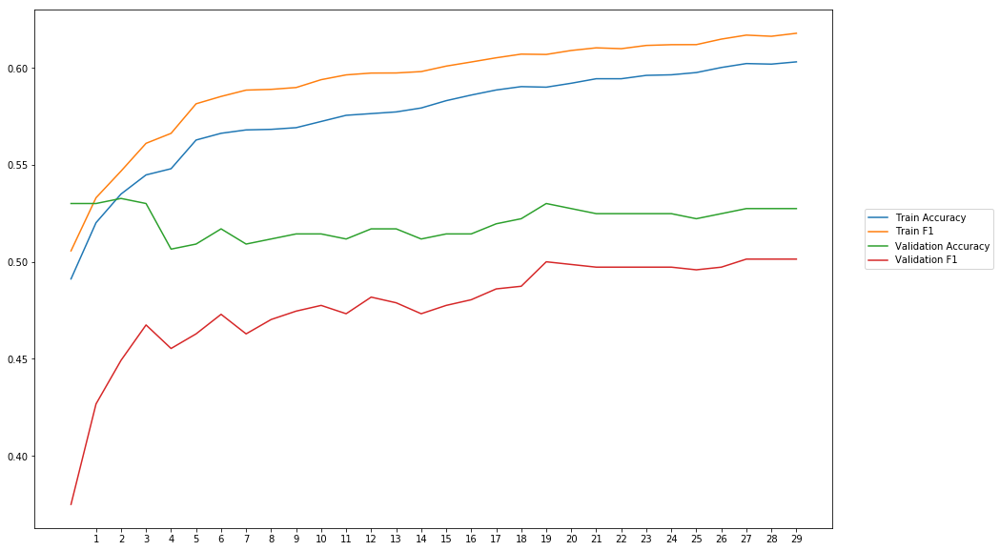

Average Accuracy: 52.06%
Average Precision: 52.37%
Average Recall: 44.08%
Average F1: 47.73%

-----Fold 7--------


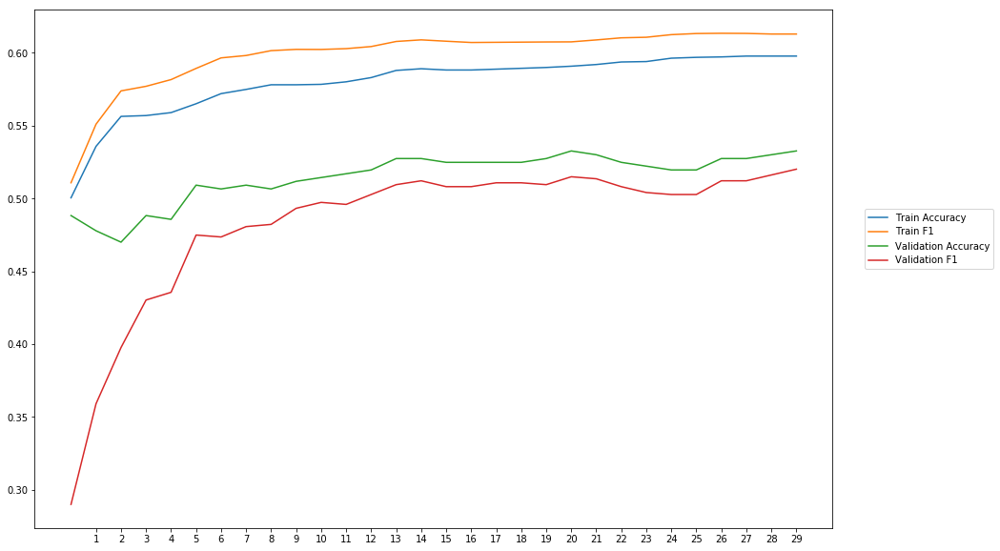

Average Accuracy: 51.51%
Average Precision: 51.34%
Average Recall: 45.93%
Average F1: 48.29%

-----Fold 8--------


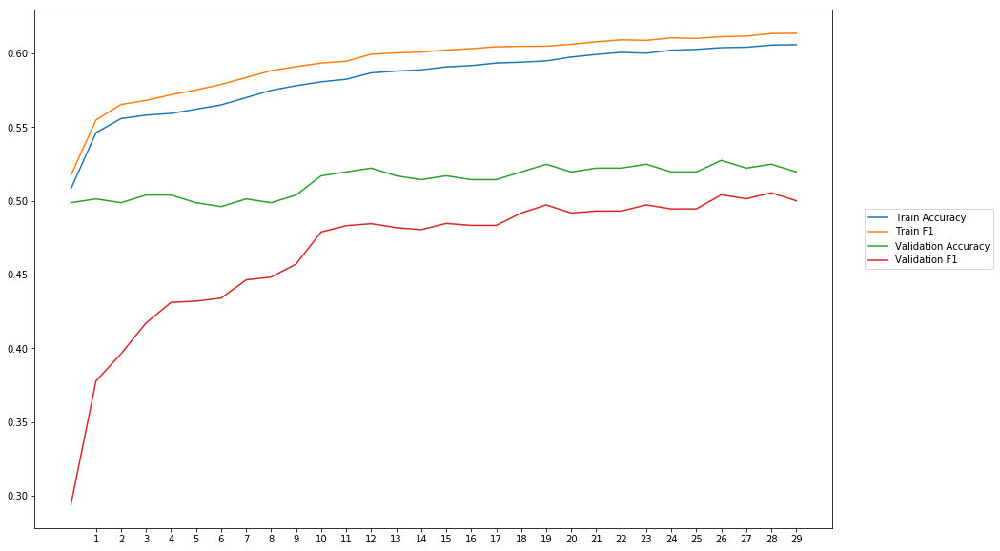

Average Accuracy: 51.36%
Average Precision: 51.36%
Average Recall: 42.90%
Average F1: 46.53%

-----Fold 9--------


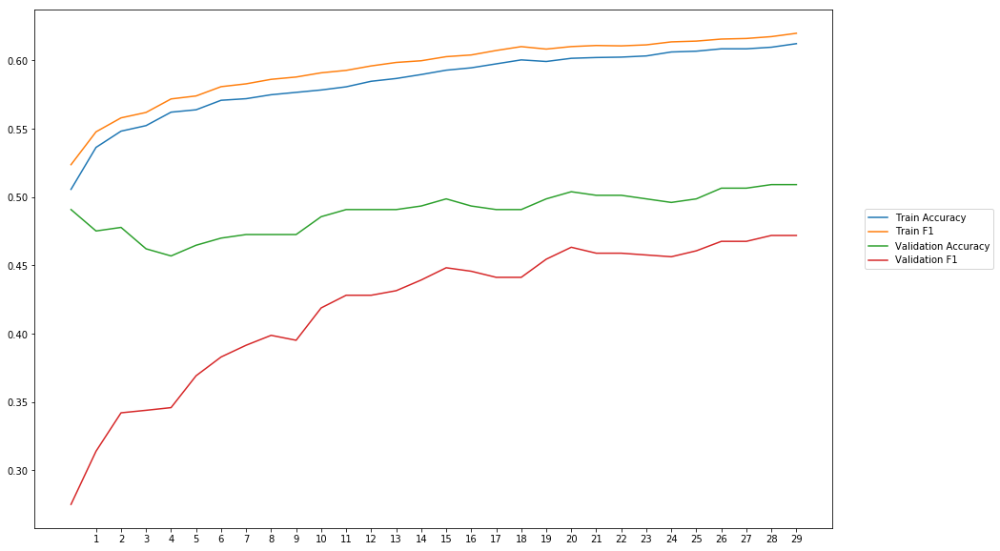

Average Accuracy: 48.90%
Average Precision: 48.19%
Average Recall: 37.42%
Average F1: 41.90%

-----Fold 10--------


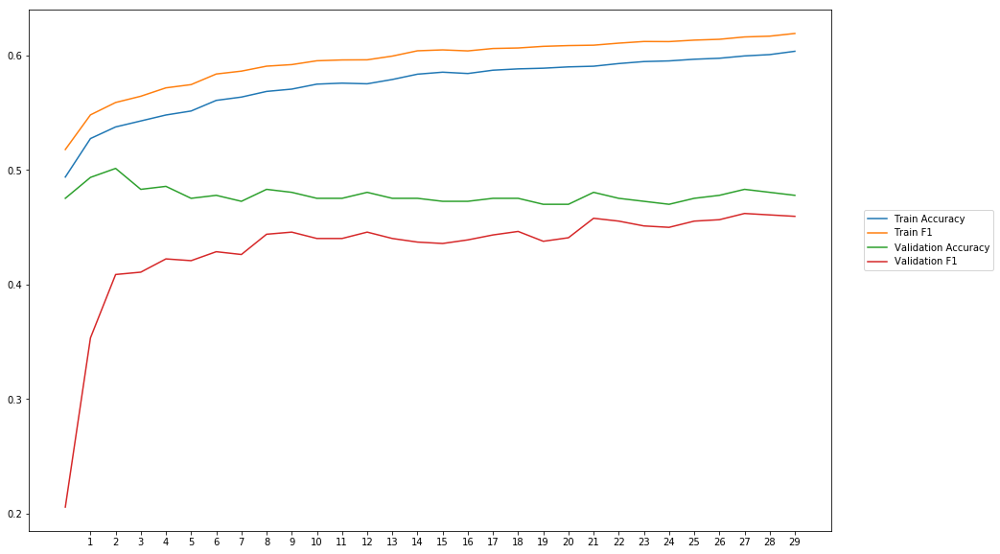

Average Accuracy: 47.79%
Average Precision: 47.16%
Average Recall: 40.09%
Average F1: 43.06%

-------Overallresults-------


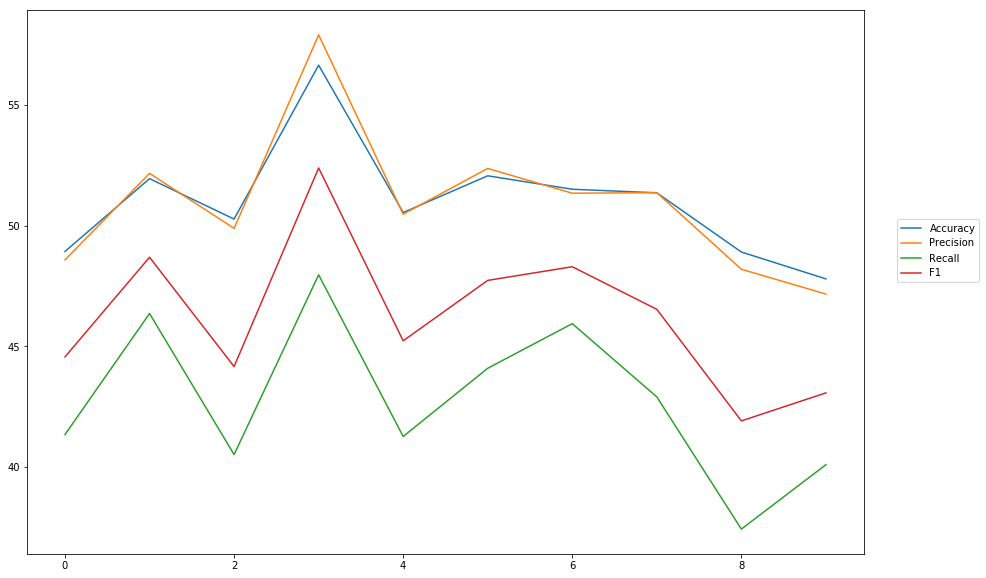

Accuracy: Mean = 50.99% (+/- 2.33%), Max = 56.65%, Min =  47.79%
Precision: Mean = 50.94% (+/- 2.85%), Max = 57.90%, Min =  47.16%
Recall: Mean = 42.78% (+/- 3.11%), Max = 47.96%, Min =  37.42%
F1: Mean = 46.25% (+/- 2.96%), Max = 52.39%, Min =  41.90%


In [48]:
cross_val_three_inputs(model_19, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1All001')

### weigth decay = 0,01

In [49]:
#Word Embeddings
wv_layer_20 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer = regularizers.l1(0.01))

input_embedding_20 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_20 = wv_layer_20(input_embedding_20)
x_embedding_20 = Dense(600, activation='relu',kernel_regularizer=regularizers.l1(0.01))(embedded_sequences_20)
x_embedding_20 = Flatten()(x_embedding_20)

#Sentiment Features
input_sentiment_20 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_20 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.01))(input_sentiment_20)

#POS Features
input_pos_20 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_20 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.01))(input_pos_20)

#Concatination
concat_20 = concatenate([x_embedding_20, x_sentiment_20, x_pos_20])

preds_20 = Dense(2, activation='softmax',kernel_regularizer=regularizers.l1(0.01))(concat_20)

model_20 = Model(inputs=[input_embedding_20, input_sentiment_20, input_pos_20], outputs=preds_20)


-----Fold 1--------


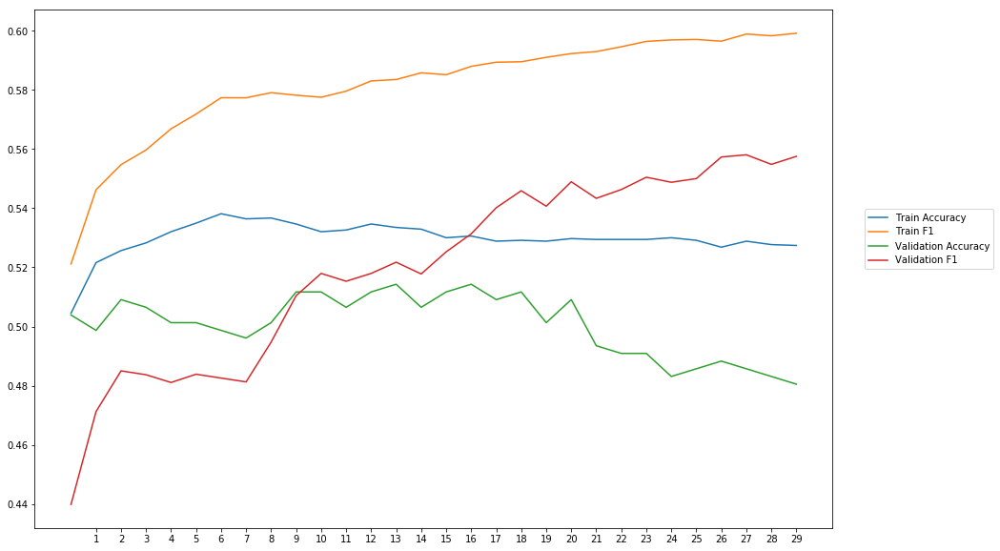

Average Accuracy: 50.06%
Average Precision: 50.01%
Average Recall: 54.76%
Average F1: 52.01%

-----Fold 2--------


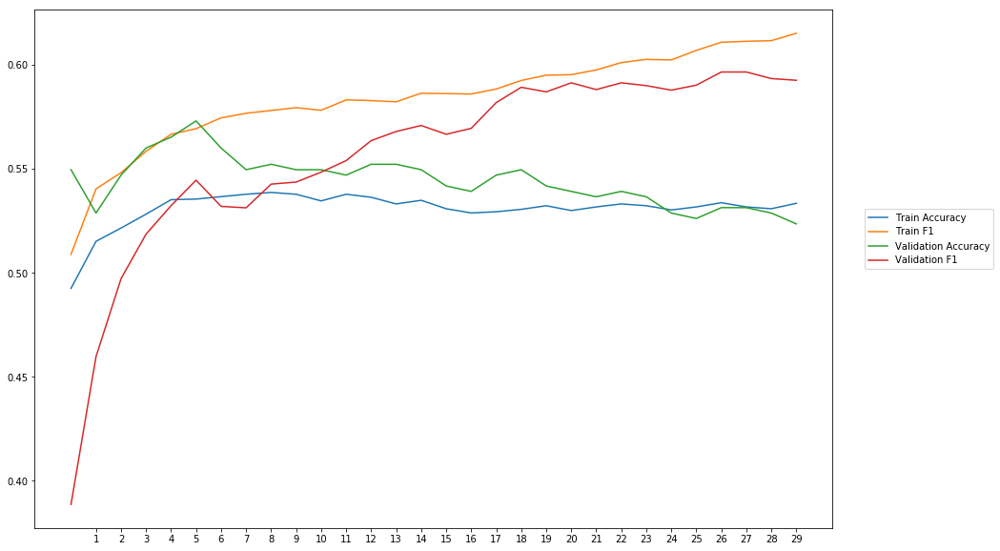

Average Accuracy: 54.41%
Average Precision: 54.17%
Average Recall: 58.59%
Average F1: 55.68%

-----Fold 3--------


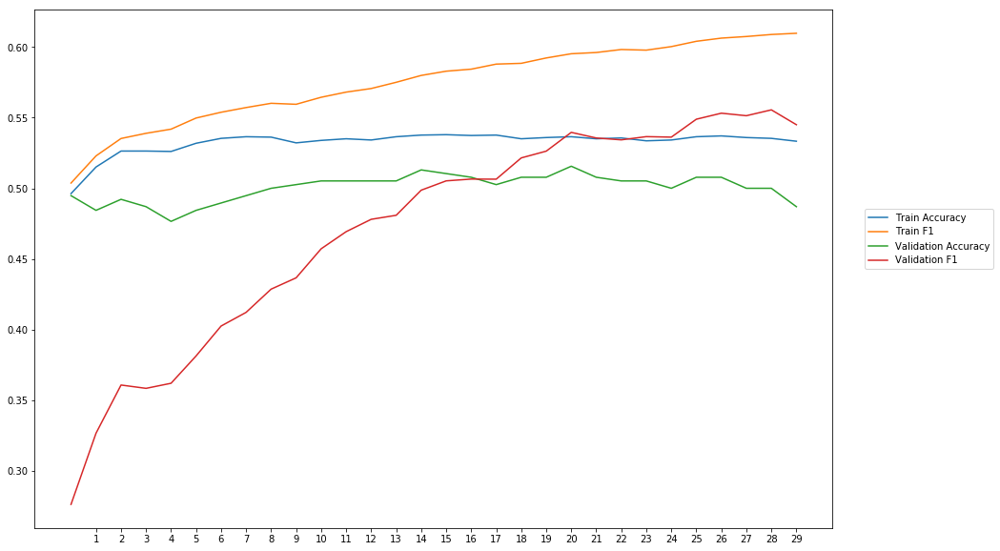

Average Accuracy: 50.04%
Average Precision: 49.53%
Average Recall: 46.42%
Average F1: 47.10%

-----Fold 4--------


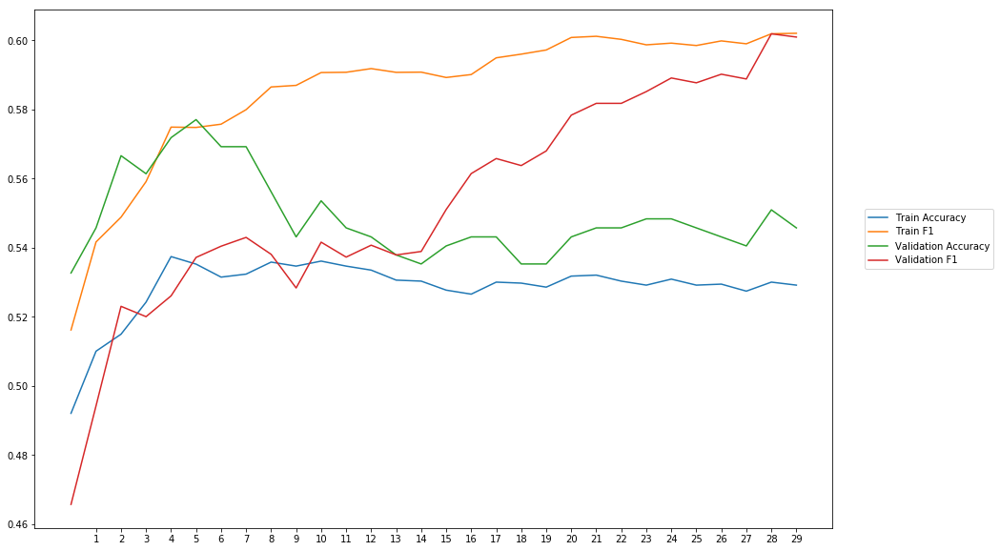

Average Accuracy: 54.87%
Average Precision: 54.79%
Average Recall: 56.63%
Average F1: 55.36%

-----Fold 5--------


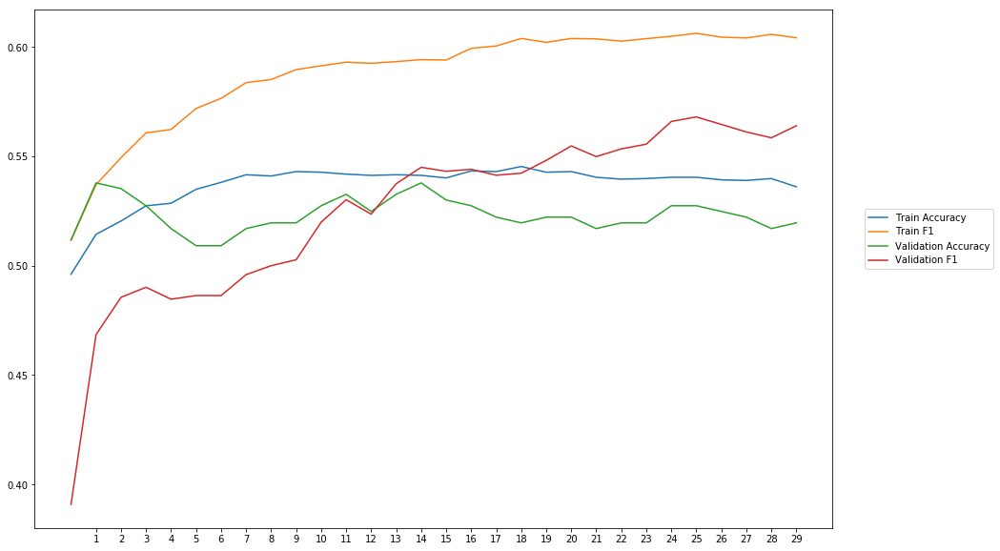

Average Accuracy: 52.32%
Average Precision: 52.19%
Average Recall: 53.51%
Average F1: 52.54%

-----Fold 6--------


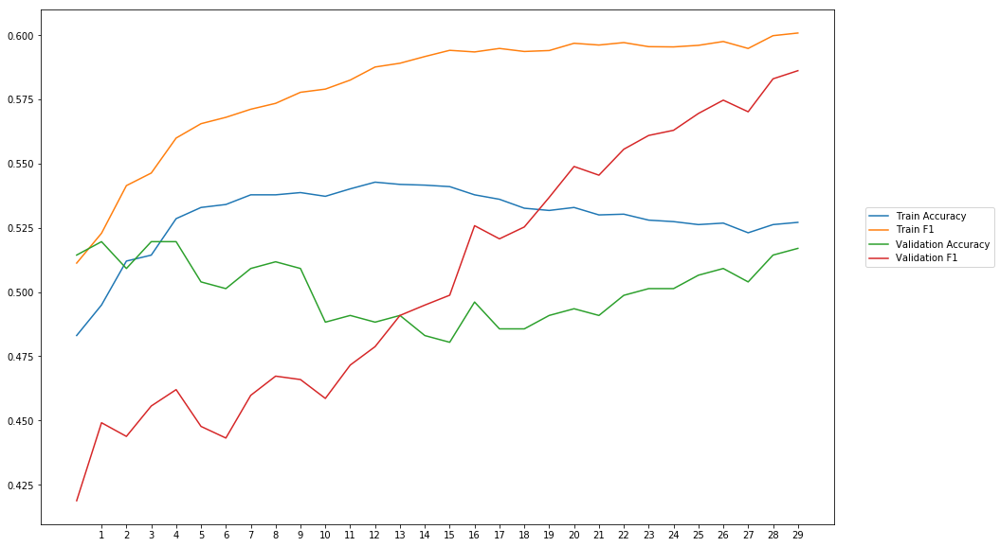

Average Accuracy: 50.11%
Average Precision: 50.08%
Average Recall: 52.27%
Average F1: 50.57%

-----Fold 7--------


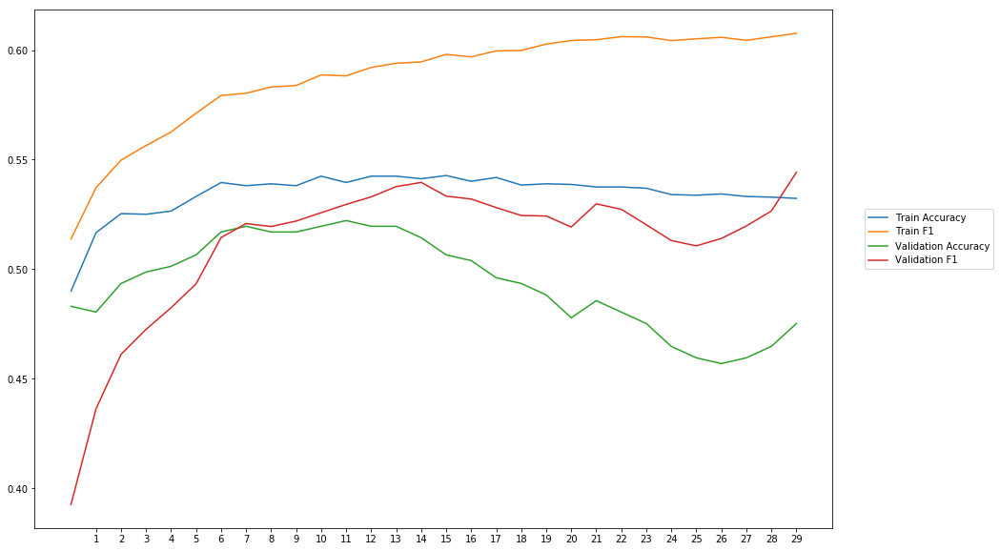

Average Accuracy: 49.39%
Average Precision: 49.40%
Average Recall: 53.51%
Average F1: 51.16%

-----Fold 8--------


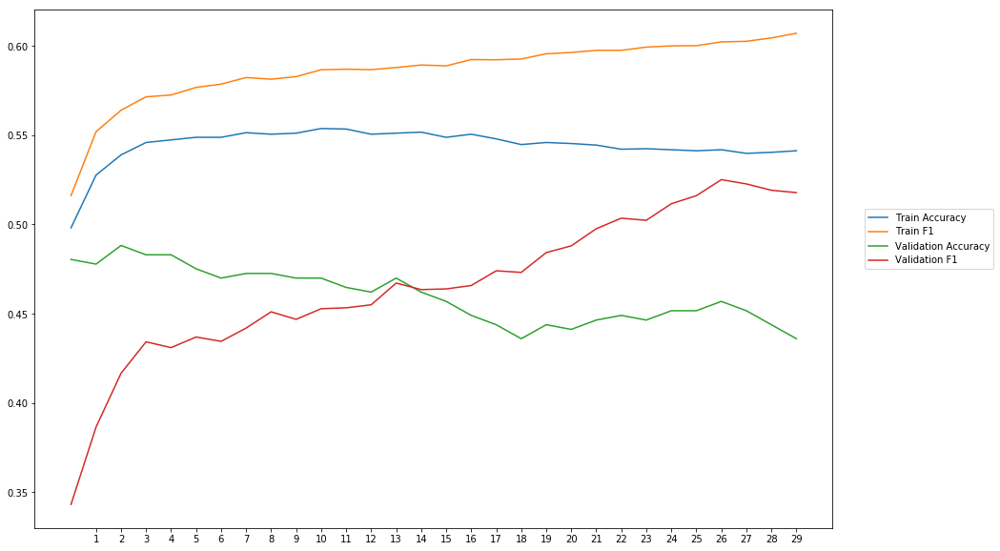

Average Accuracy: 46.02%
Average Precision: 46.16%
Average Recall: 47.98%
Average F1: 46.60%

-----Fold 9--------


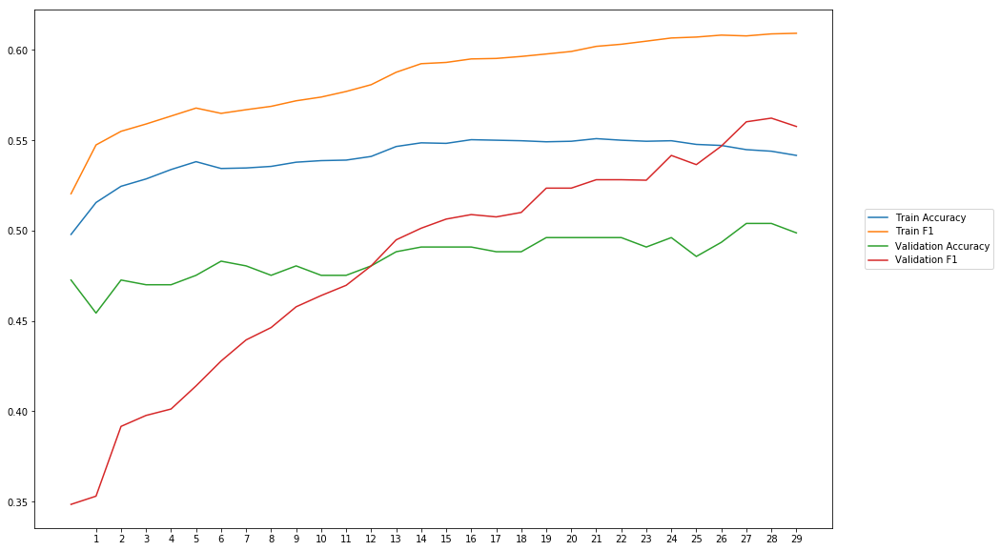

Average Accuracy: 48.53%
Average Precision: 48.14%
Average Recall: 49.06%
Average F1: 48.19%

-----Fold 10--------


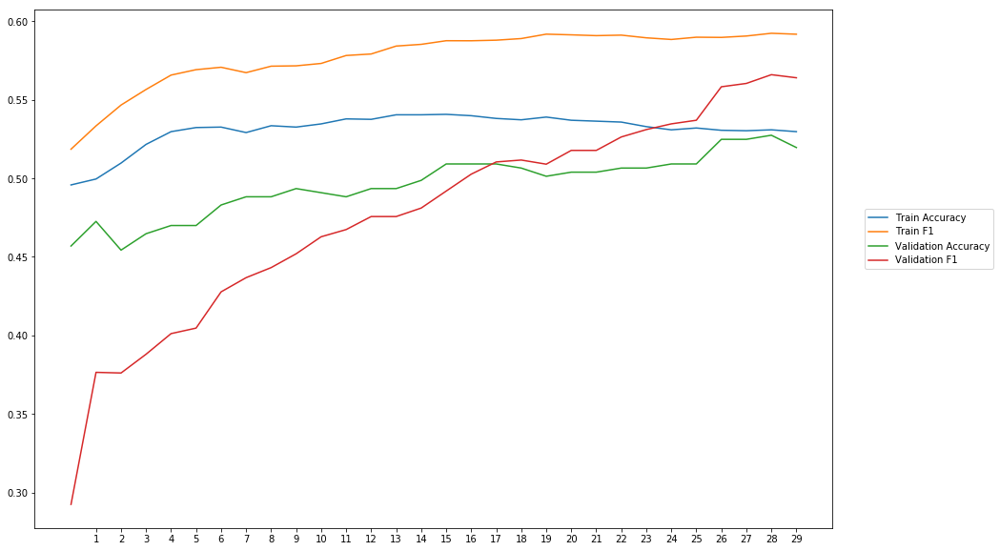

Average Accuracy: 49.59%
Average Precision: 49.04%
Average Recall: 47.03%
Average F1: 47.67%

-------Overallresults-------


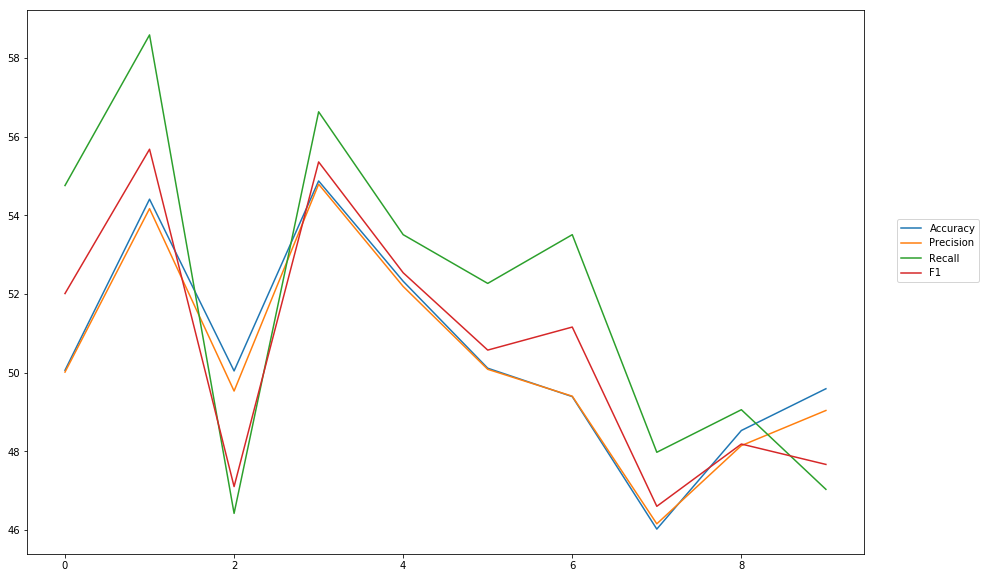

Accuracy: Mean = 50.54% (+/- 2.54%), Max = 54.87%, Min =  46.02%
Precision: Mean = 50.35% (+/- 2.52%), Max = 54.79%, Min =  46.16%
Recall: Mean = 51.97% (+/- 3.97%), Max = 58.59%, Min =  46.42%
F1: Mean = 50.69% (+/- 3.12%), Max = 55.68%, Min =  46.60%


In [50]:
cross_val_three_inputs(model_20, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1all01')

### weigth decay = 0,1

In [51]:
#Word Embeddings
wv_layer_21 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer = regularizers.l1(0.1))

input_embedding_21 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_21 = wv_layer_21(input_embedding_21)
x_embedding_21 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.1))(embedded_sequences_21)
x_embedding_21 = Flatten()(x_embedding_21)

#Sentiment Features
input_sentiment_21 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_21 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.1))(input_sentiment_21)

#POS Features
input_pos_21 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_21 = Dense(600, activation='relu', kernel_regularizer=regularizers.l1(0.1))(input_pos_21)

#Concatination
concat_21 = concatenate([x_embedding_21, x_sentiment_21, x_pos_21])

preds_21 = Dense(2, activation='softmax', kernel_regularizer=regularizers.l1(0.1))(concat_21)

model_21 = Model(inputs=[input_embedding_21, input_sentiment_21, input_pos_21], outputs=preds_21)


-----Fold 1--------


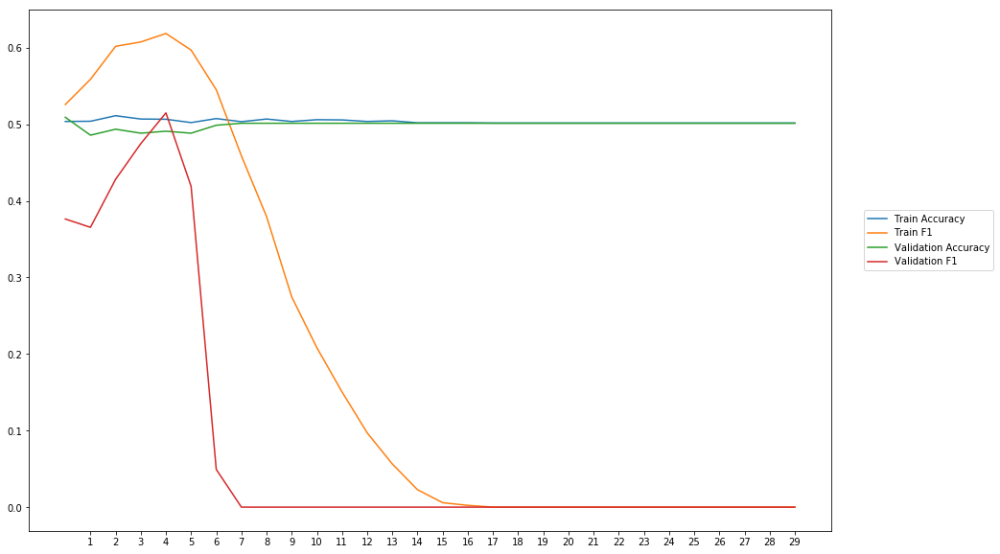

Average Accuracy: 49.95%
Average Precision: 11.31%
Average Recall: 7.92%
Average F1: 8.76%

-----Fold 2--------


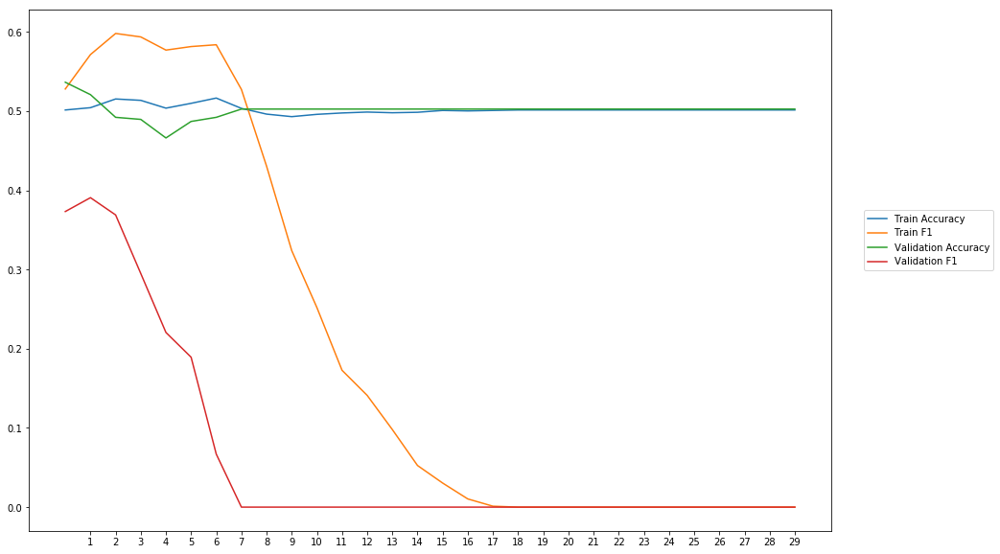

Average Accuracy: 50.15%
Average Precision: 10.97%
Average Recall: 4.69%
Average F1: 6.35%

-----Fold 3--------


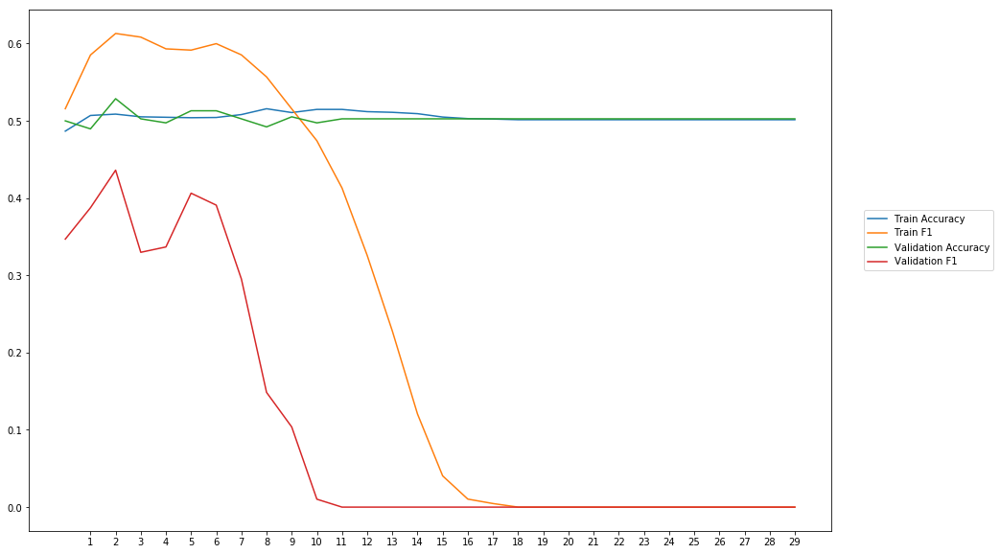

Average Accuracy: 50.30%
Average Precision: 17.53%
Average Recall: 8.24%
Average F1: 10.64%

-----Fold 4--------


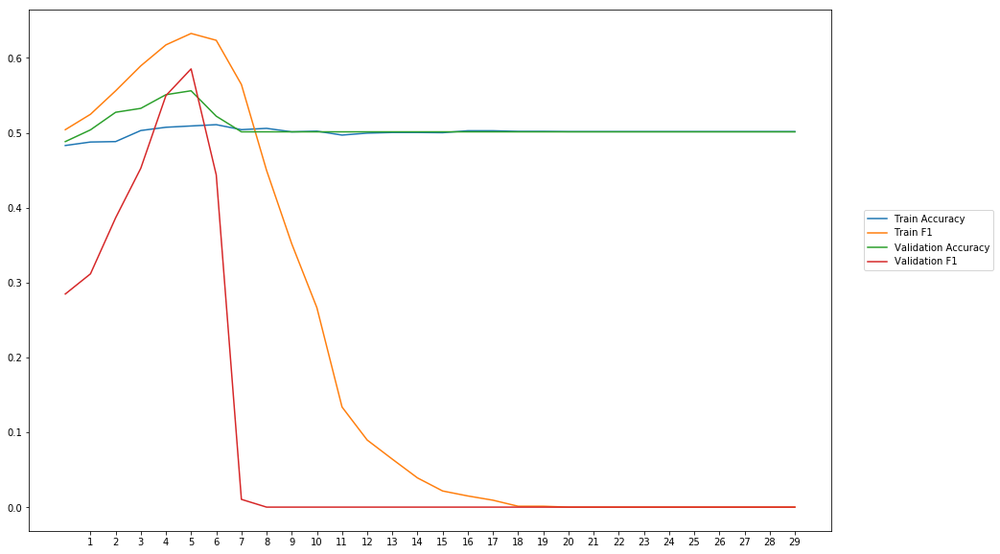

Average Accuracy: 50.70%
Average Precision: 13.98%
Average Recall: 8.94%
Average F1: 10.08%

-----Fold 5--------


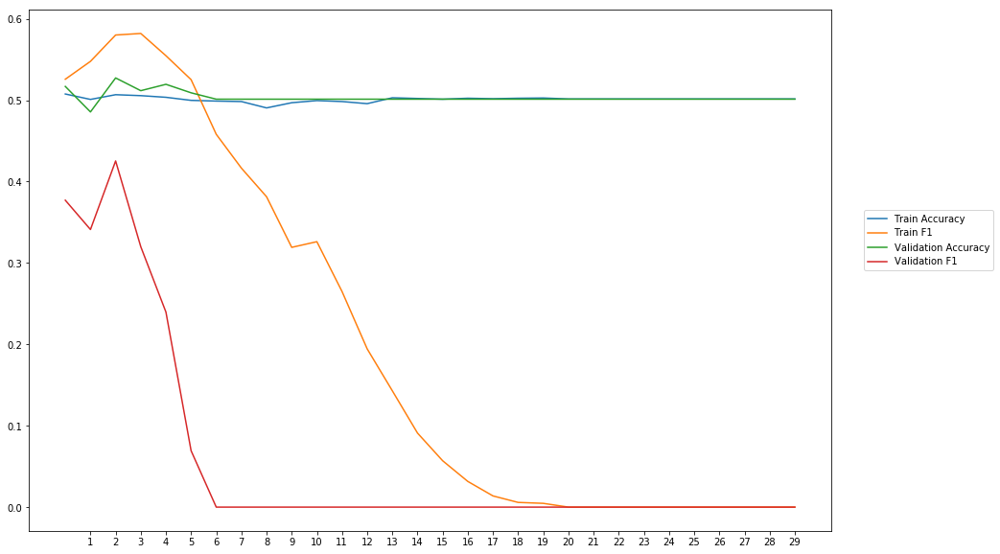

Average Accuracy: 50.34%
Average Precision: 10.90%
Average Recall: 4.43%
Average F1: 5.91%

-----Fold 6--------


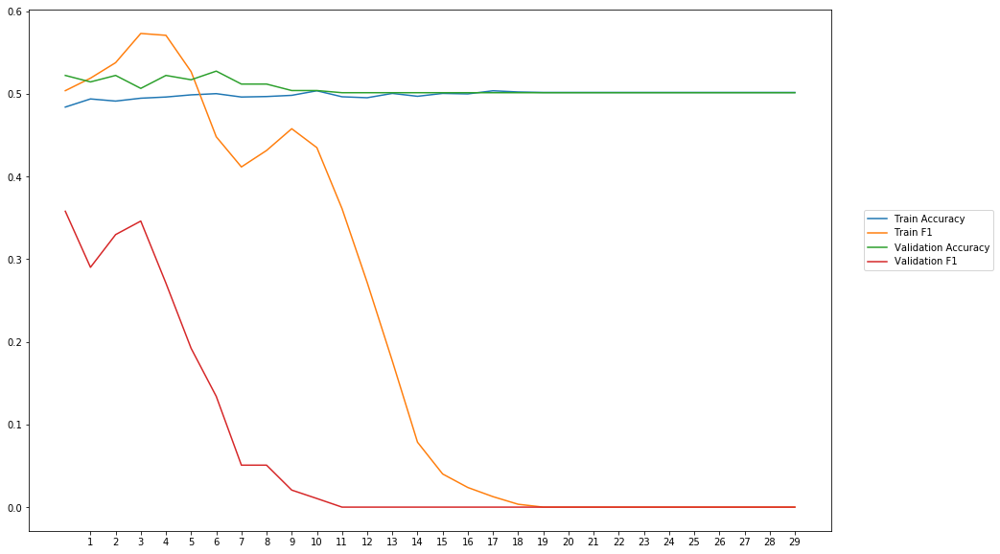

Average Accuracy: 50.63%
Average Precision: 24.64%
Average Recall: 4.66%
Average F1: 6.84%

-----Fold 7--------


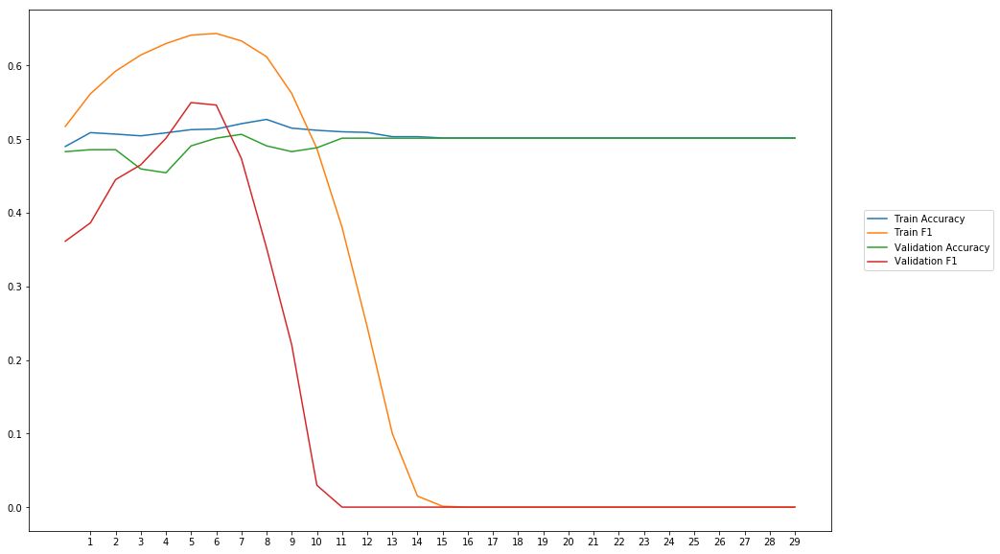

Average Accuracy: 49.51%
Average Precision: 16.82%
Average Recall: 13.87%
Average F1: 14.44%

-----Fold 8--------


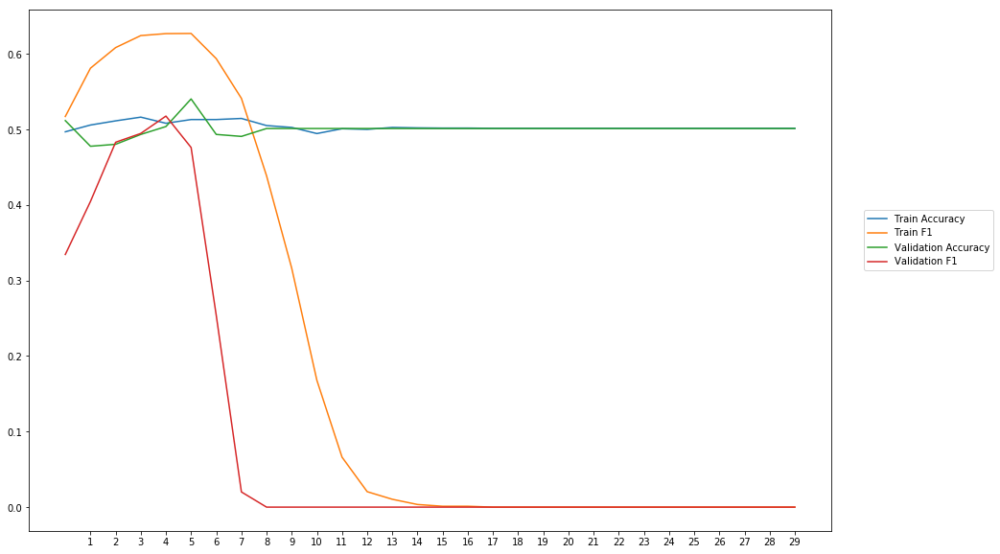

Average Accuracy: 50.07%
Average Precision: 12.48%
Average Recall: 9.08%
Average F1: 9.95%

-----Fold 9--------


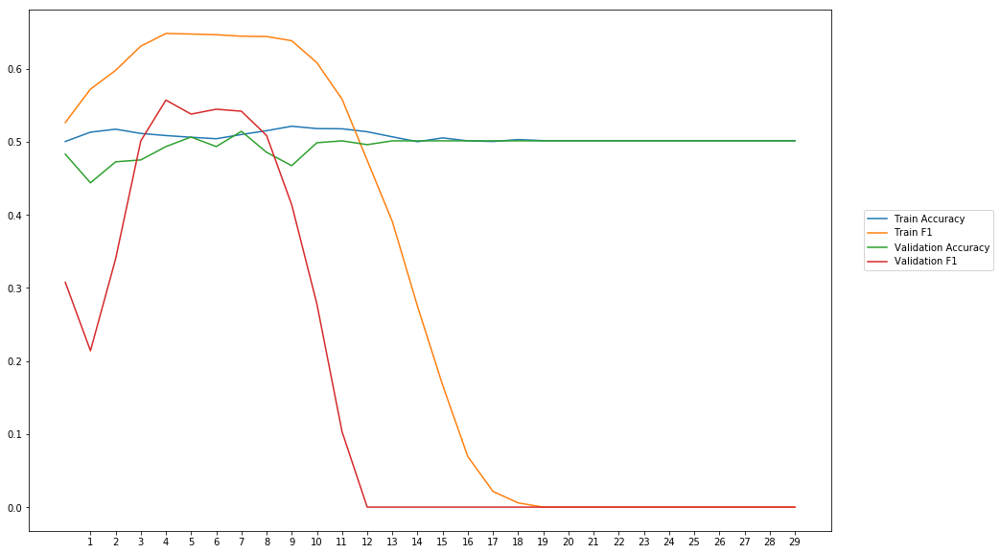

Average Accuracy: 49.51%
Average Precision: 18.99%
Average Recall: 15.81%
Average F1: 16.16%

-----Fold 10--------


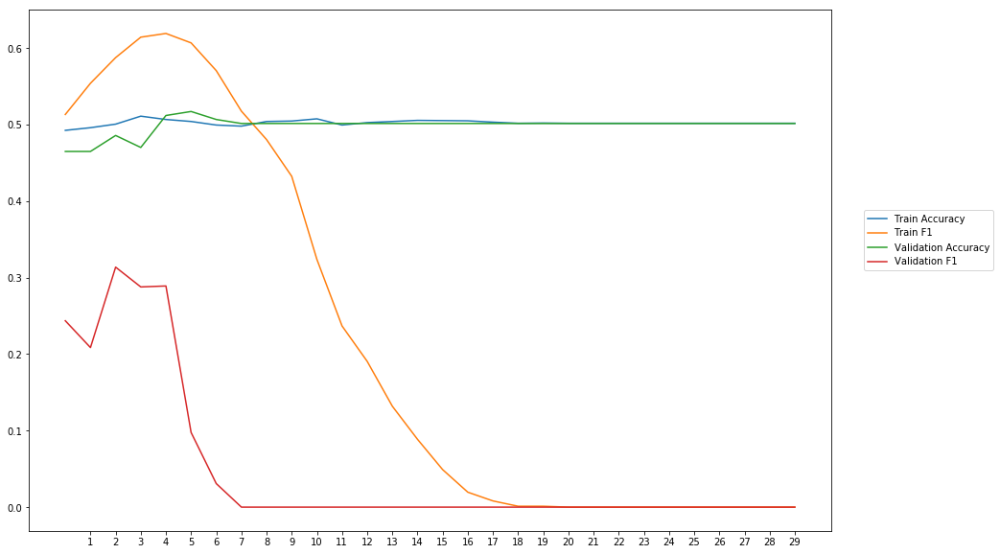

Average Accuracy: 49.83%
Average Precision: 12.36%
Average Recall: 3.44%
Average F1: 4.90%

-------Overallresults-------


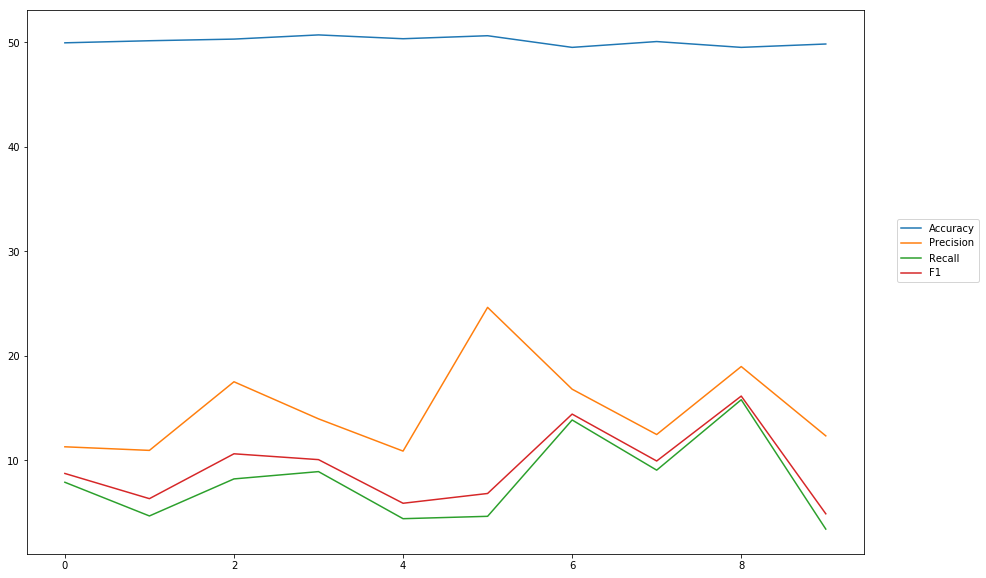

Accuracy: Mean = 50.10% (+/- 0.39%), Max = 50.70%, Min =  49.51%
Precision: Mean = 15.00% (+/- 4.24%), Max = 24.64%, Min =  10.90%
Recall: Mean = 8.11% (+/- 3.91%), Max = 15.81%, Min =  3.44%
F1: Mean = 9.40% (+/- 3.49%), Max = 16.16%, Min =  4.90%


In [52]:
cross_val_three_inputs(model_21, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l1all1')

# L2 for embedding layer

### weigth decay = 0,001

In [53]:
#Word Embeddings
wv_layer_22 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer = regularizers.l2(0.001))

input_embedding_22 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_22 = wv_layer_22(input_embedding_22)
x_embedding_22 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.001))(embedded_sequences_22)
x_embedding_22 = Flatten()(x_embedding_22)

#Sentiment Features
input_sentiment_22 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_22 = Dense(600, activation='relu',  kernel_regularizer=regularizers.l2(0.001))(input_sentiment_22)

#POS Features
input_pos_22 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_22 = Dense(600, activation='relu',  kernel_regularizer=regularizers.l2(0.001))(input_pos_22)

#Concatination
concat_22 = concatenate([x_embedding_22, x_sentiment_22, x_pos_22])

preds_22 = Dense(2, activation='softmax',kernel_regularizer=regularizers.l2(0.001))(concat_22)

model_22 = Model(inputs=[input_embedding_22, input_sentiment_22, input_pos_22], outputs=preds_22)


-----Fold 1--------


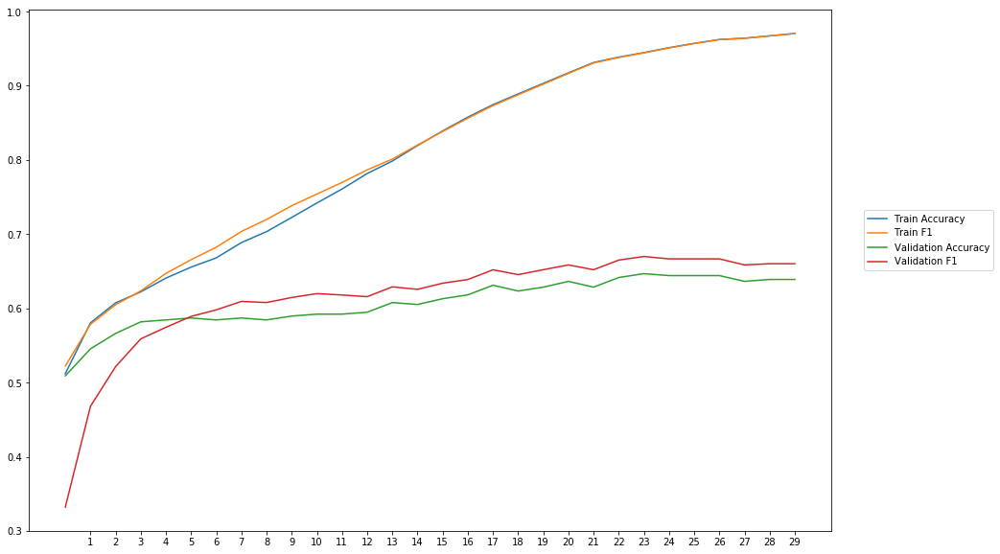

Average Accuracy: 60.75%
Average Precision: 59.73%
Average Recall: 63.98%
Average F1: 61.43%

-----Fold 2--------


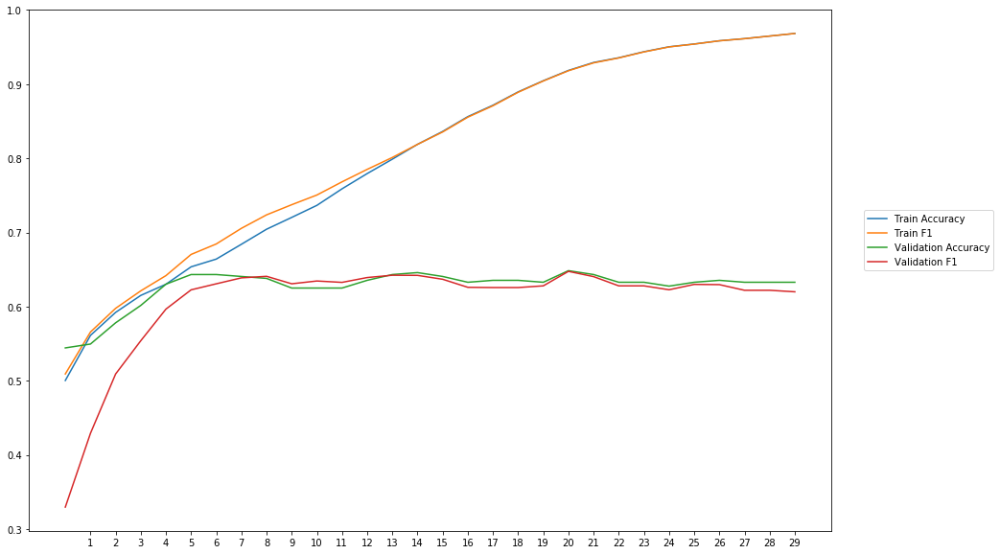

Average Accuracy: 62.66%
Average Precision: 63.23%
Average Recall: 59.14%
Average F1: 60.68%

-----Fold 3--------


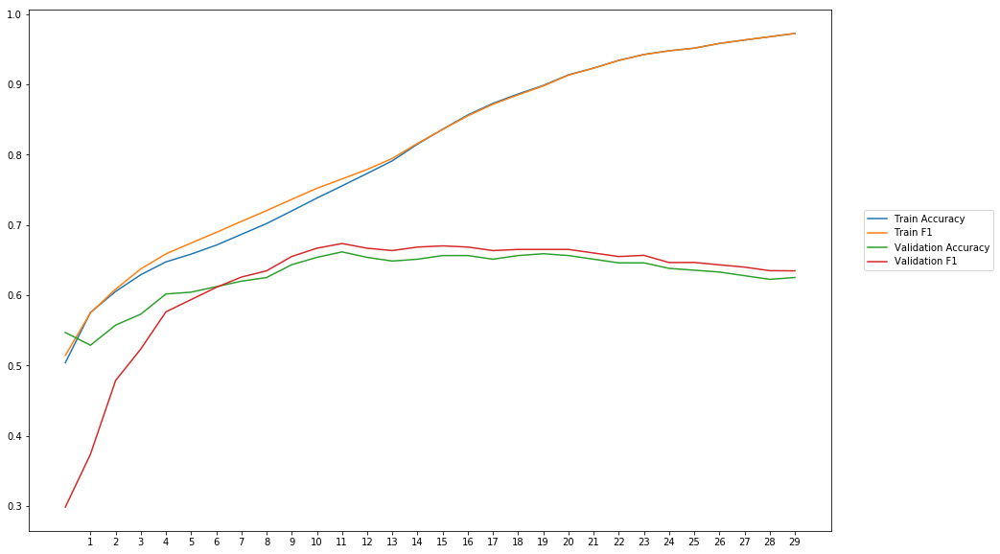

Average Accuracy: 62.80%
Average Precision: 62.46%
Average Recall: 62.41%
Average F1: 61.74%

-----Fold 4--------


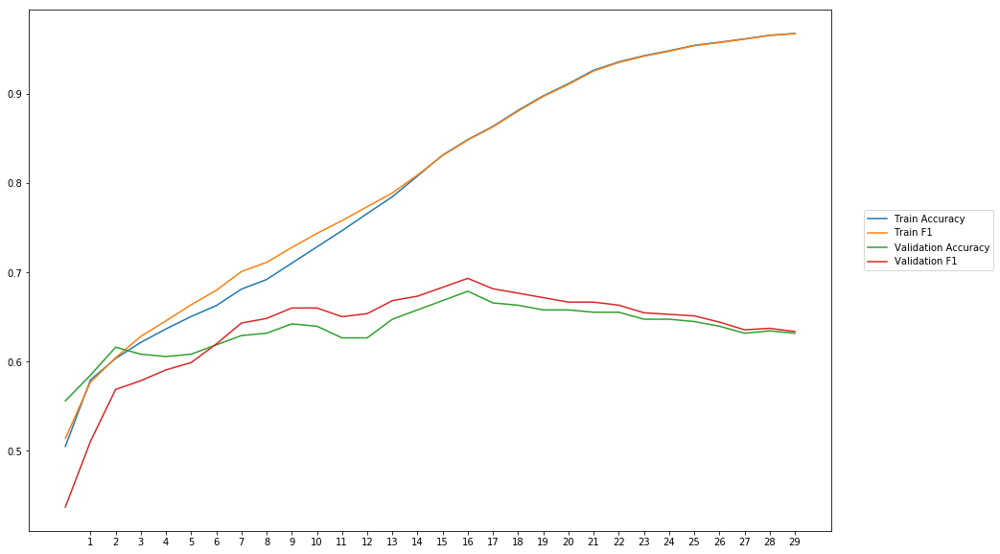

Average Accuracy: 63.60%
Average Precision: 63.14%
Average Recall: 64.62%
Average F1: 63.59%

-----Fold 5--------


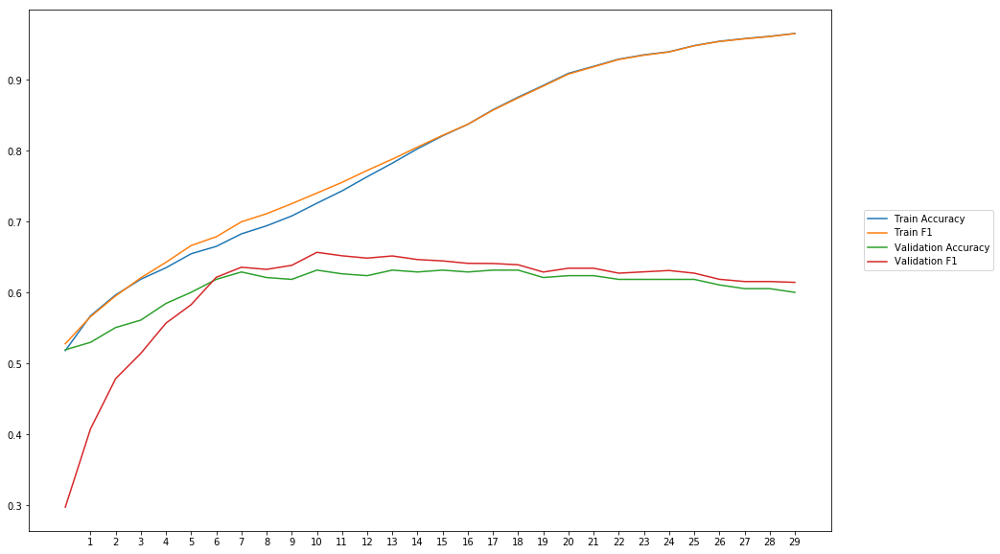

Average Accuracy: 60.91%
Average Precision: 60.46%
Average Recall: 61.03%
Average F1: 60.24%

-----Fold 6--------


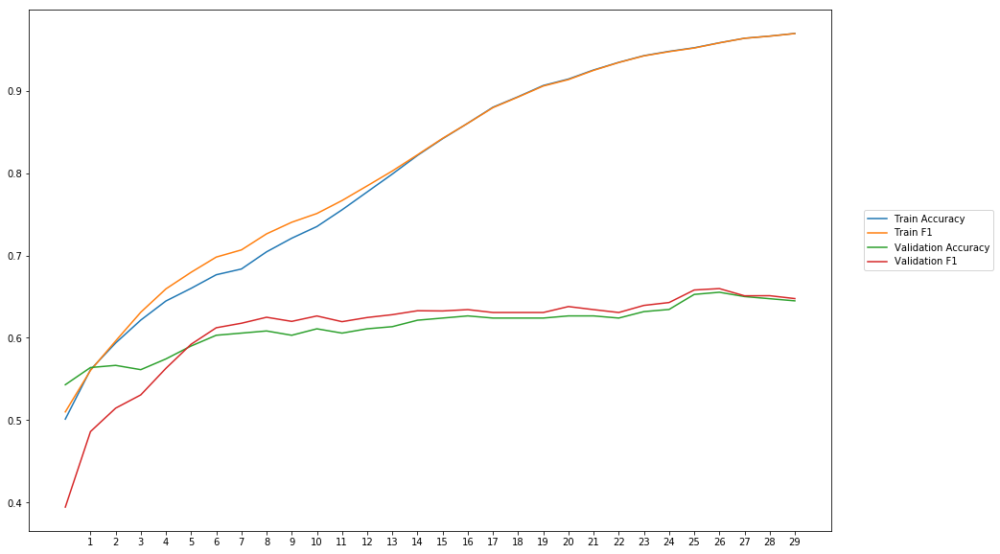

Average Accuracy: 61.33%
Average Precision: 61.06%
Average Recall: 61.50%
Average F1: 61.00%

-----Fold 7--------


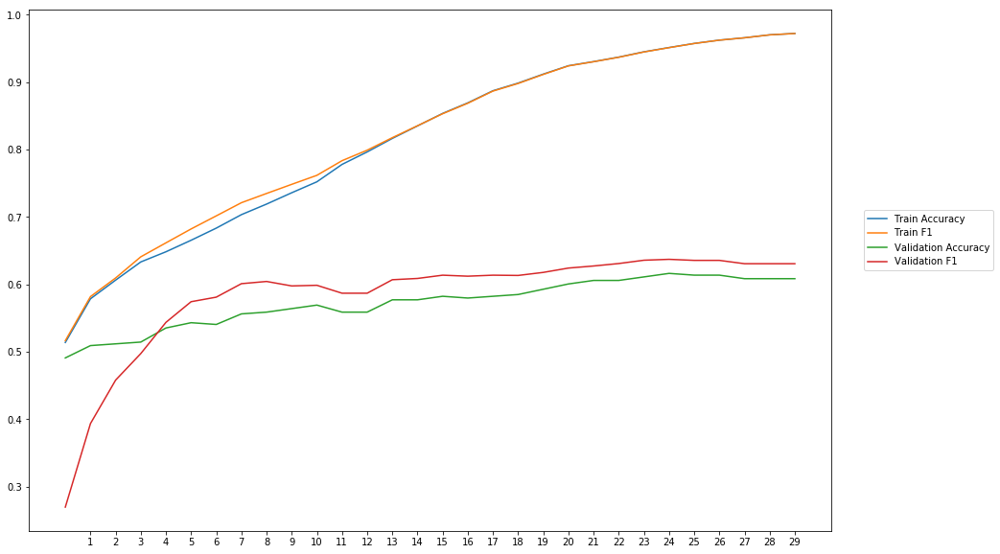

Average Accuracy: 57.26%
Average Precision: 56.23%
Average Recall: 61.54%
Average F1: 58.32%

-----Fold 8--------


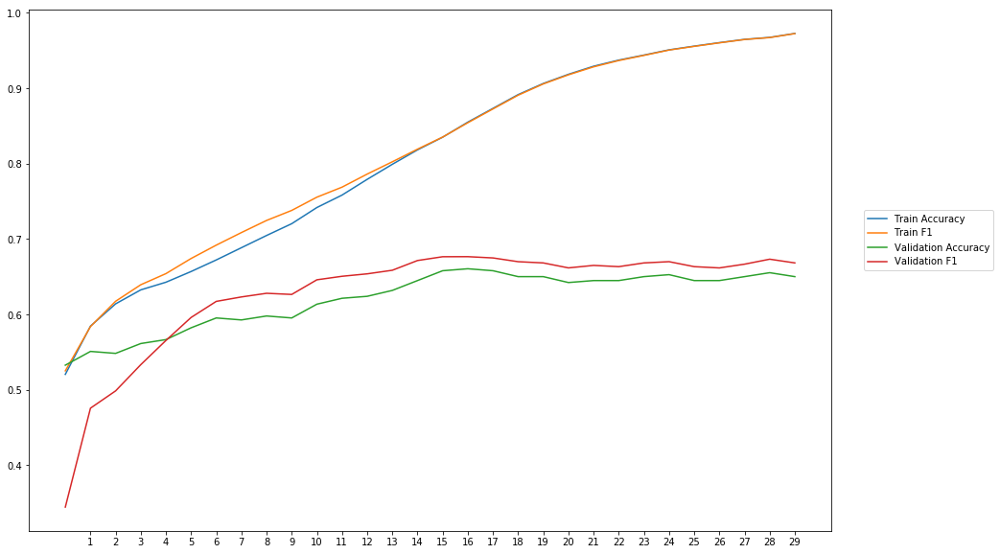

Average Accuracy: 62.05%
Average Precision: 60.96%
Average Recall: 65.50%
Average F1: 62.72%

-----Fold 9--------


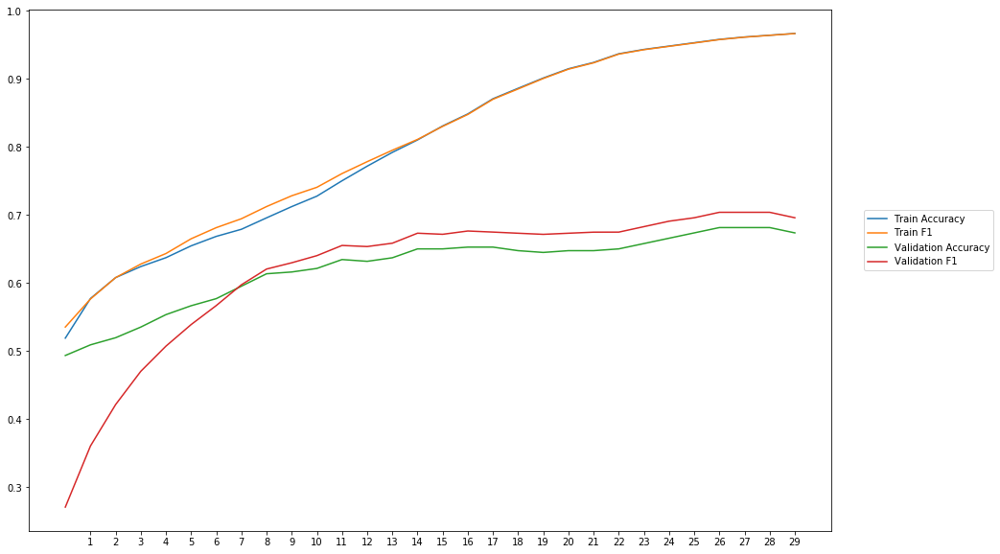

Average Accuracy: 62.21%
Average Precision: 60.85%
Average Recall: 64.03%
Average F1: 61.77%

-----Fold 10--------


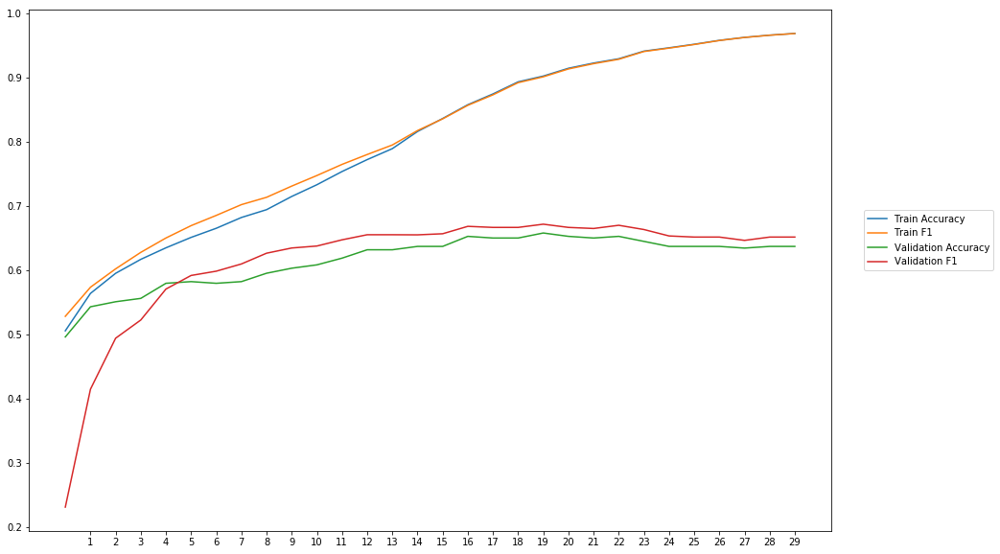

Average Accuracy: 61.55%
Average Precision: 60.54%
Average Recall: 63.65%
Average F1: 61.49%

-------Overallresults-------


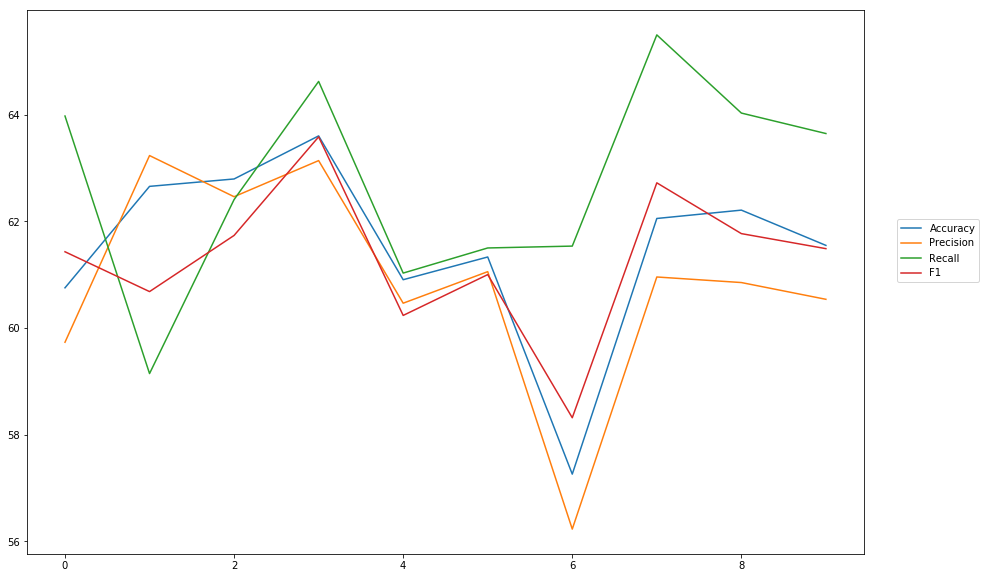

Accuracy: Mean = 61.51% (+/- 1.65%), Max = 63.60%, Min =  57.26%
Precision: Mean = 60.87% (+/- 1.91%), Max = 63.23%, Min =  56.23%
Recall: Mean = 62.74% (+/- 1.85%), Max = 65.50%, Min =  59.14%
F1: Mean = 61.30% (+/- 1.35%), Max = 63.59%, Min =  58.32%


In [54]:
cross_val_three_inputs(model_22, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2all001')

### weigth decay = 0,01

In [55]:
#Word Embeddings
wv_layer_23 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer = regularizers.l2(0.01))

input_embedding_23 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_23 = wv_layer_23(input_embedding_23)
x_embedding_23 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.01))(embedded_sequences_23)
x_embedding_23 = Flatten()(x_embedding_23)

#Sentiment Features
input_sentiment_23 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_23 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.01))(input_sentiment_23)

#POS Features
input_pos_23 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_23 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.01))(input_pos_23)

#Concatination
concat_23 = concatenate([x_embedding_23, x_sentiment_23, x_pos_23])

preds_23 = Dense(2, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(concat_23)

model_23 = Model(inputs=[input_embedding_23, input_sentiment_23, input_pos_23], outputs=preds_23)


-----Fold 1--------


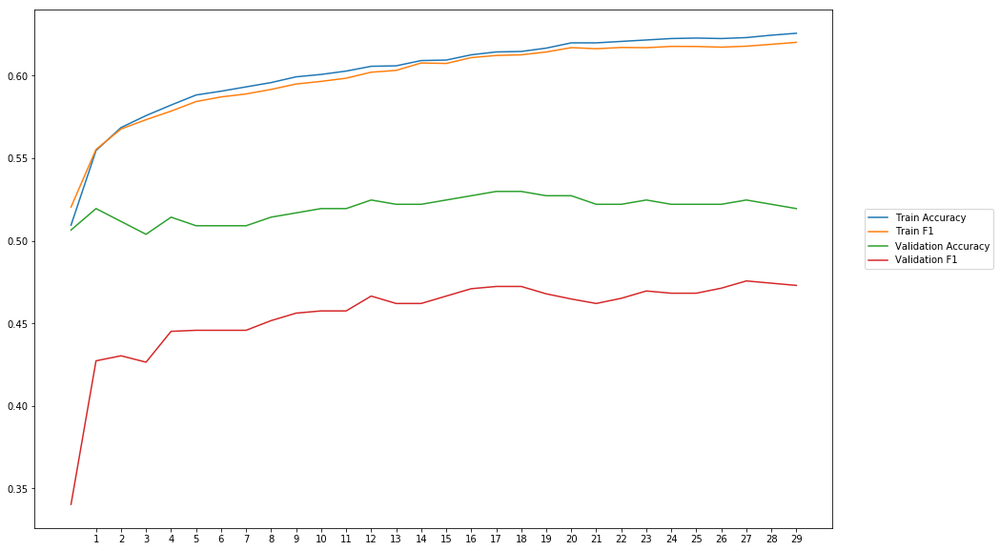

Average Accuracy: 51.97%
Average Precision: 52.36%
Average Recall: 40.40%
Average F1: 45.54%

-----Fold 2--------


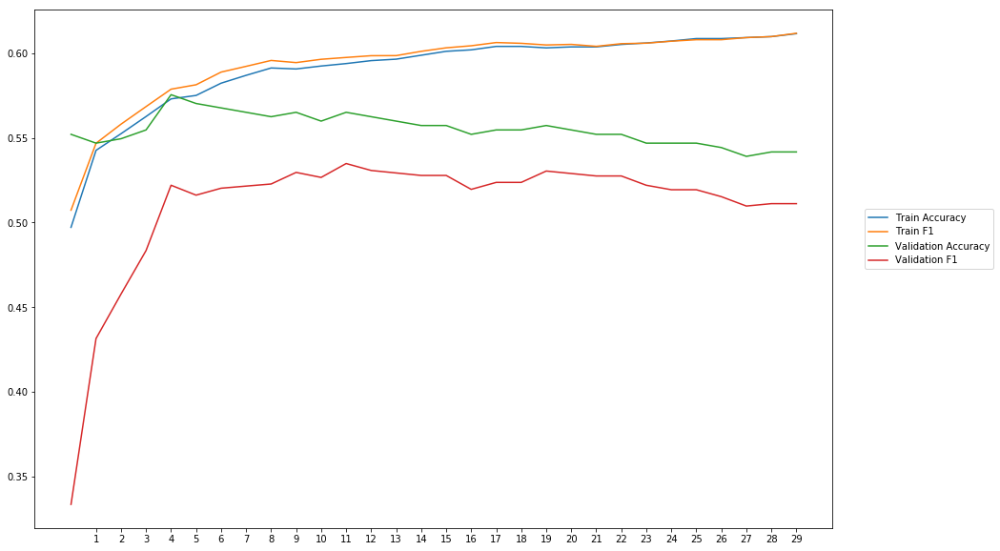

Average Accuracy: 55.52%
Average Precision: 56.55%
Average Recall: 47.00%
Average F1: 51.01%

-----Fold 3--------


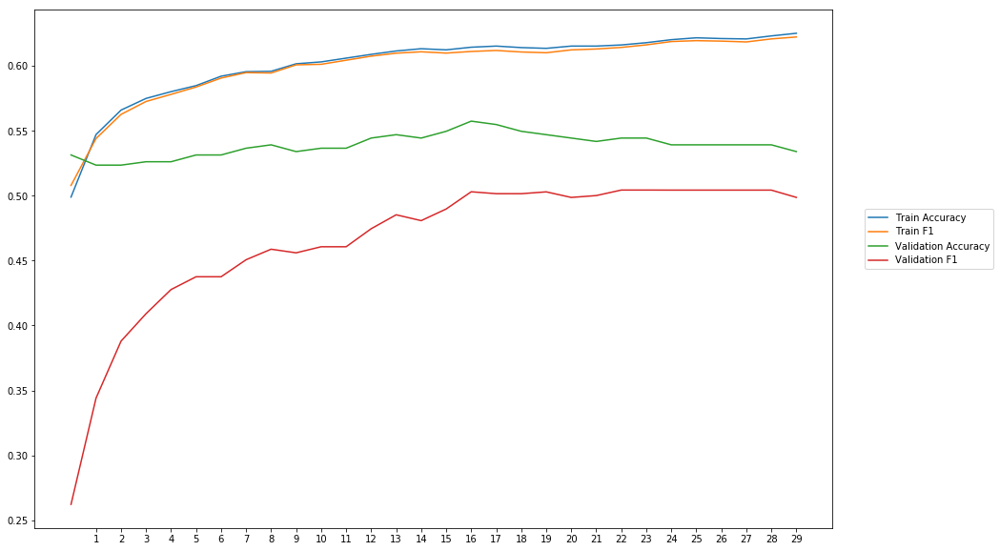

Average Accuracy: 53.91%
Average Precision: 55.01%
Average Recall: 40.98%
Average F1: 46.53%

-----Fold 4--------


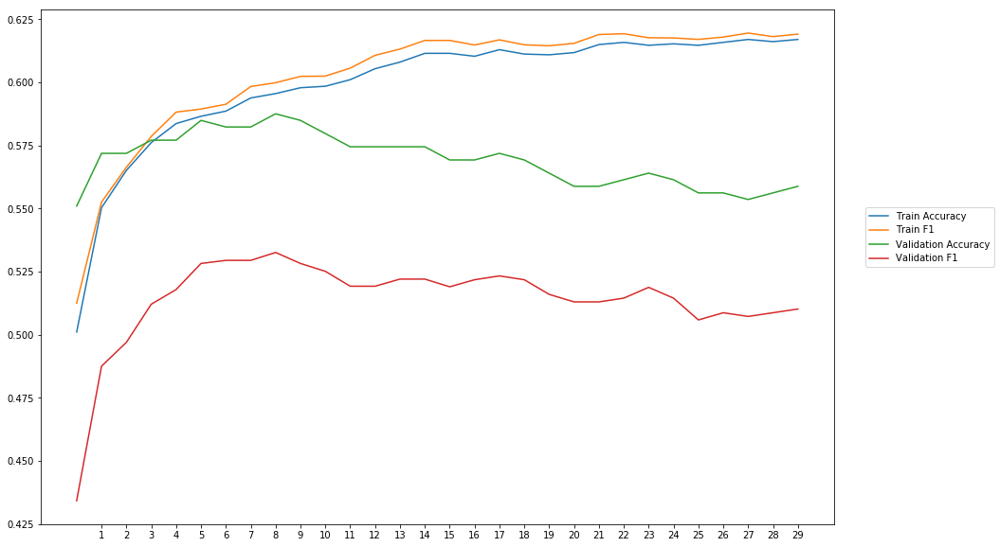

Average Accuracy: 56.92%
Average Precision: 58.78%
Average Recall: 45.74%
Average F1: 51.40%

-----Fold 5--------


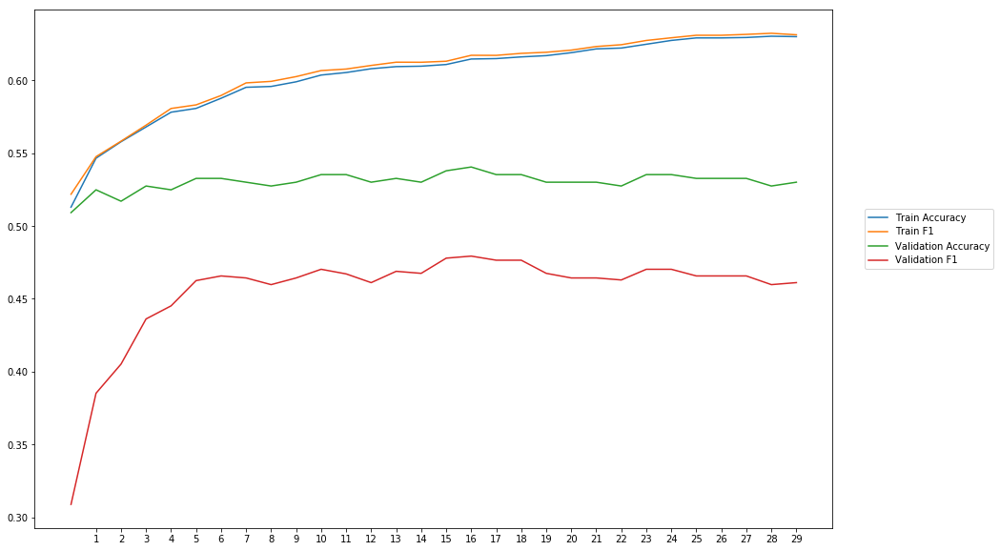

Average Accuracy: 53.04%
Average Precision: 53.93%
Average Recall: 39.58%
Average F1: 45.53%

-----Fold 6--------


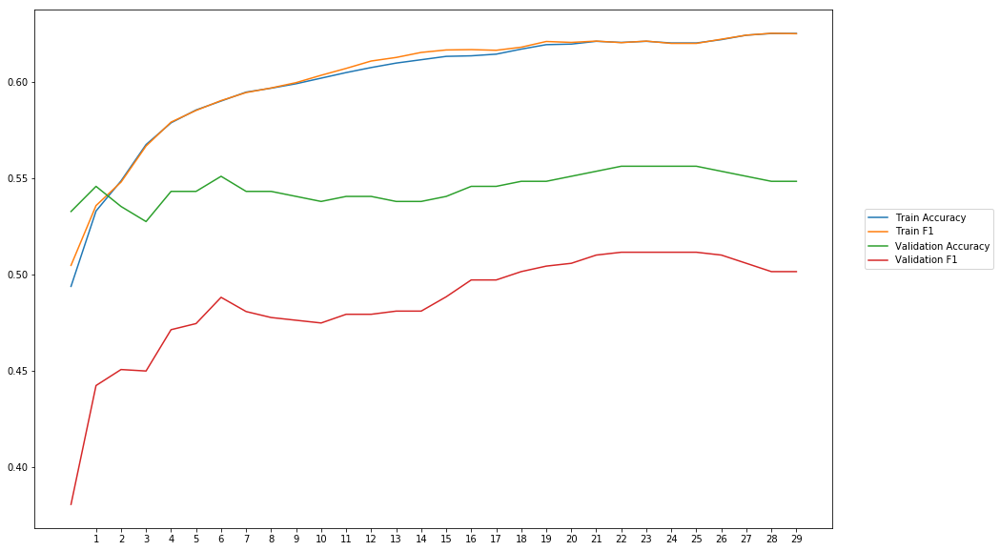

Average Accuracy: 54.53%
Average Precision: 55.68%
Average Recall: 43.14%
Average F1: 48.52%

-----Fold 7--------


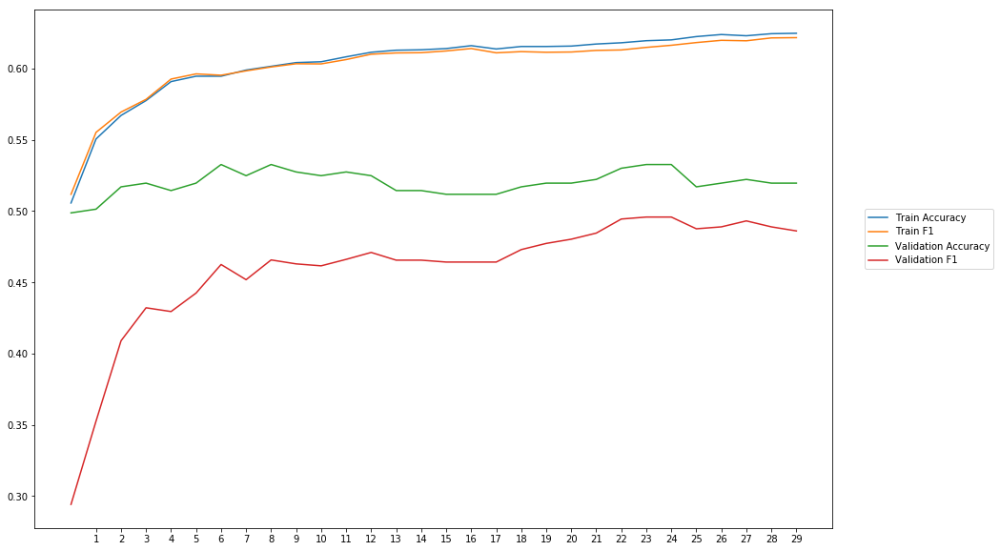

Average Accuracy: 52.00%
Average Precision: 52.33%
Average Recall: 41.22%
Average F1: 45.90%

-----Fold 8--------


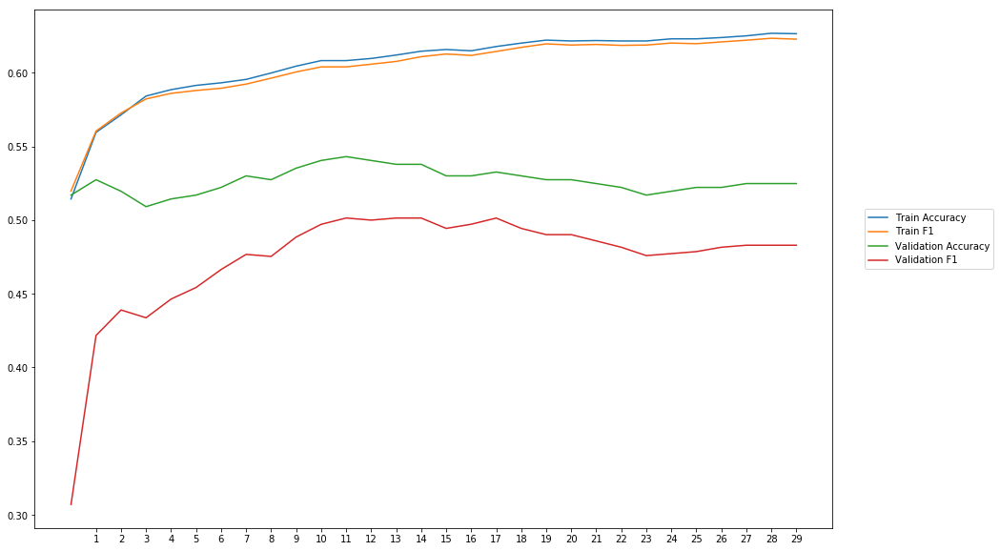

Average Accuracy: 52.66%
Average Precision: 53.14%
Average Recall: 43.02%
Average F1: 47.36%

-----Fold 9--------


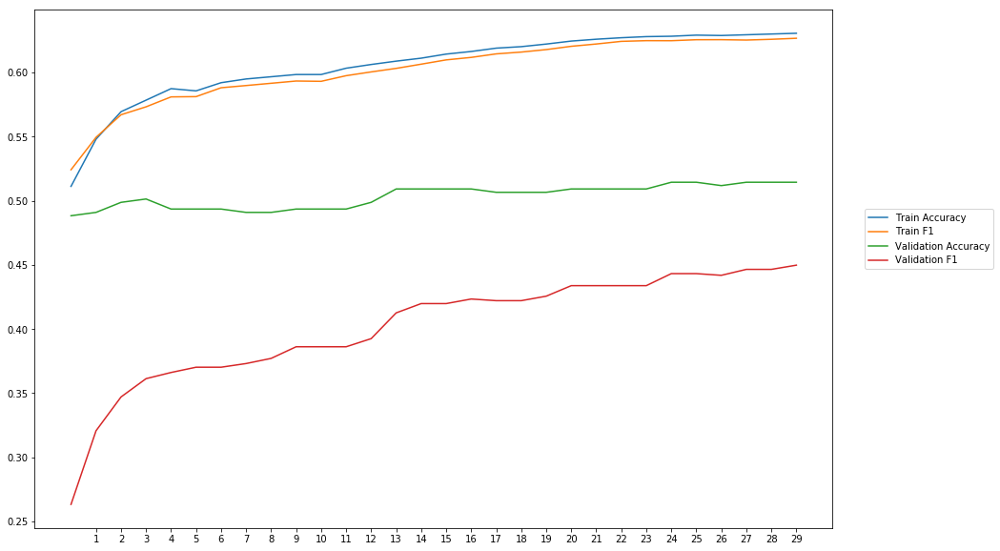

Average Accuracy: 50.32%
Average Precision: 50.13%
Average Recall: 33.73%
Average F1: 40.16%

-----Fold 10--------


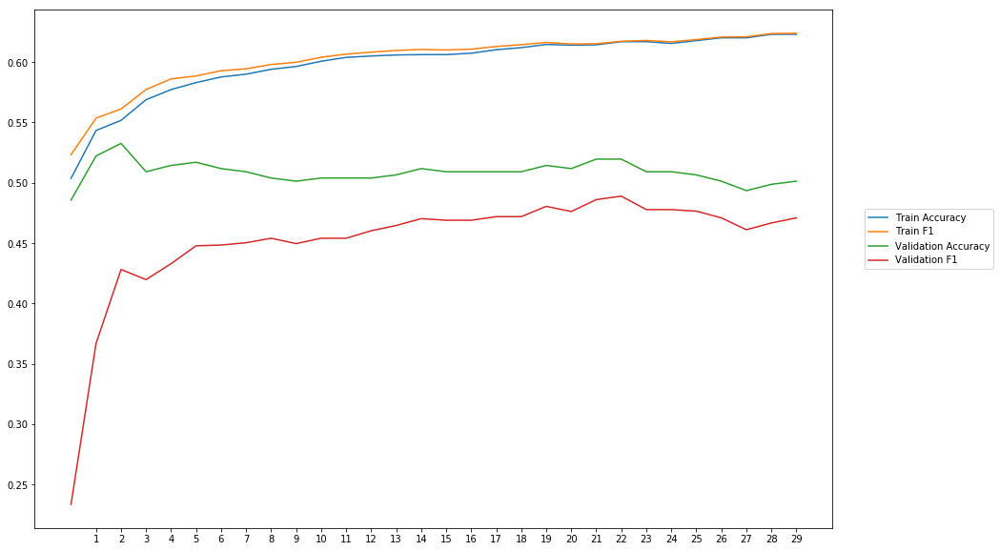

Average Accuracy: 50.86%
Average Precision: 50.89%
Average Recall: 41.06%
Average F1: 45.16%

-------Overallresults-------


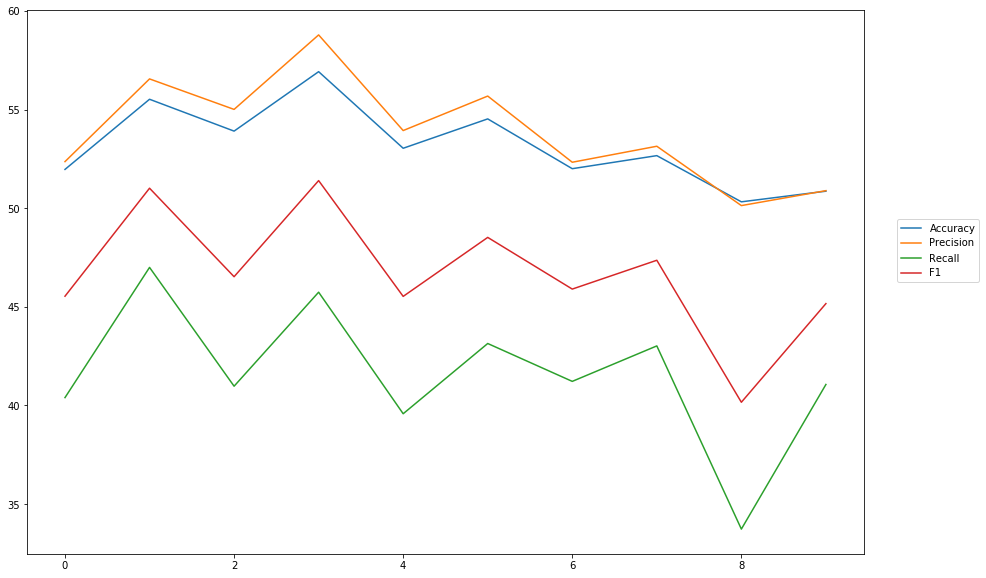

Accuracy: Mean = 53.17% (+/- 1.96%), Max = 56.92%, Min =  50.32%
Precision: Mean = 53.88% (+/- 2.53%), Max = 58.78%, Min =  50.13%
Recall: Mean = 41.59% (+/- 3.45%), Max = 47.00%, Min =  33.73%
F1: Mean = 46.71% (+/- 3.05%), Max = 51.40%, Min =  40.16%


In [56]:
cross_val_three_inputs(model_23, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2all01')

### weigth decay = 0,1

In [57]:
#Word Embeddings
wv_layer_24 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True,
                 embeddings_regularizer = regularizers.l2(0.1))

input_embedding_24 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_24 = wv_layer_24(input_embedding_24)
x_embedding_24 = Dense(600, activation='relu', kernel_regularizer=regularizers.l2(0.1))(embedded_sequences_24)
x_embedding_24 = Flatten()(x_embedding_24)

#Sentiment Features
input_sentiment_24 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_sentiment_24 = Dense(600, activation='relu',  kernel_regularizer=regularizers.l2(0.1))(input_sentiment_24)

#POS Features
input_pos_24 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_pos_24 = Dense(600, activation='relu',  kernel_regularizer=regularizers.l2(0.1))(input_pos_24)

#Concatination
concat_24 = concatenate([x_embedding_24, x_sentiment_24, x_pos_24])

preds_24 = Dense(2, activation='softmax',kernel_regularizer=regularizers.l2(0.1))(concat_24)

model_24 = Model(inputs=[input_embedding_24, input_sentiment_24, input_pos_24], outputs=preds_24)


-----Fold 1--------


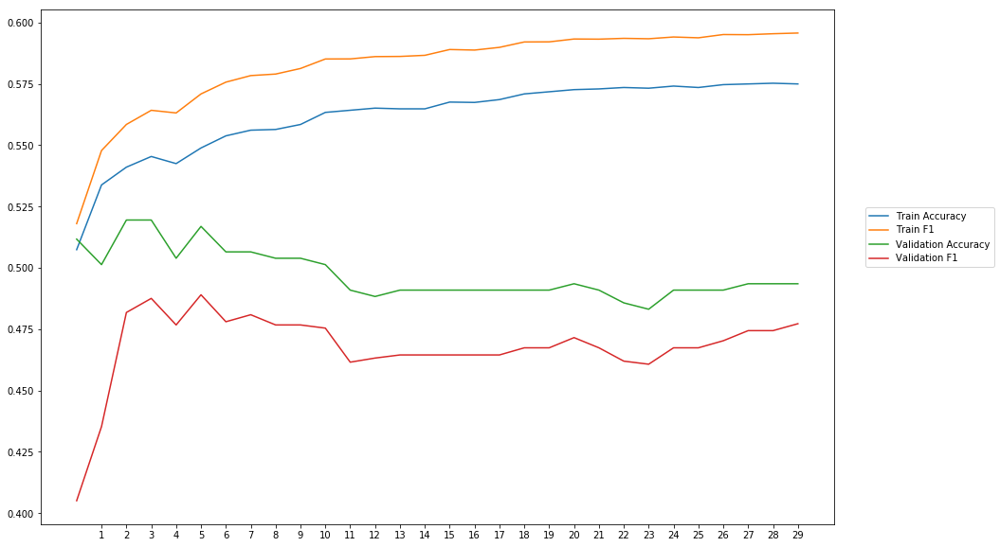

Average Accuracy: 49.72%
Average Precision: 49.58%
Average Recall: 44.39%
Average F1: 46.79%

-----Fold 2--------


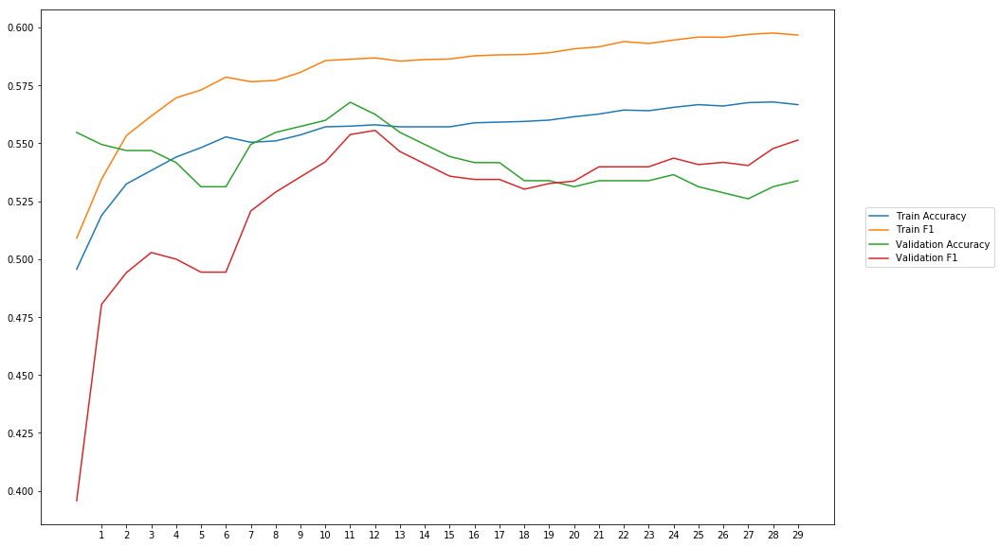

Average Accuracy: 54.24%
Average Precision: 54.42%
Average Recall: 51.36%
Average F1: 52.57%

-----Fold 3--------


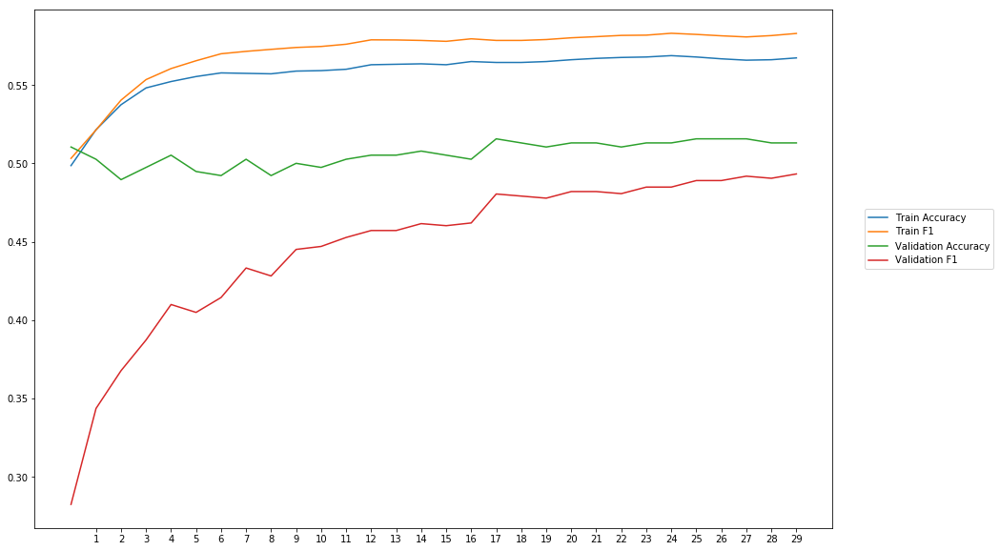

Average Accuracy: 50.63%
Average Precision: 50.40%
Average Recall: 40.73%
Average F1: 44.73%

-----Fold 4--------


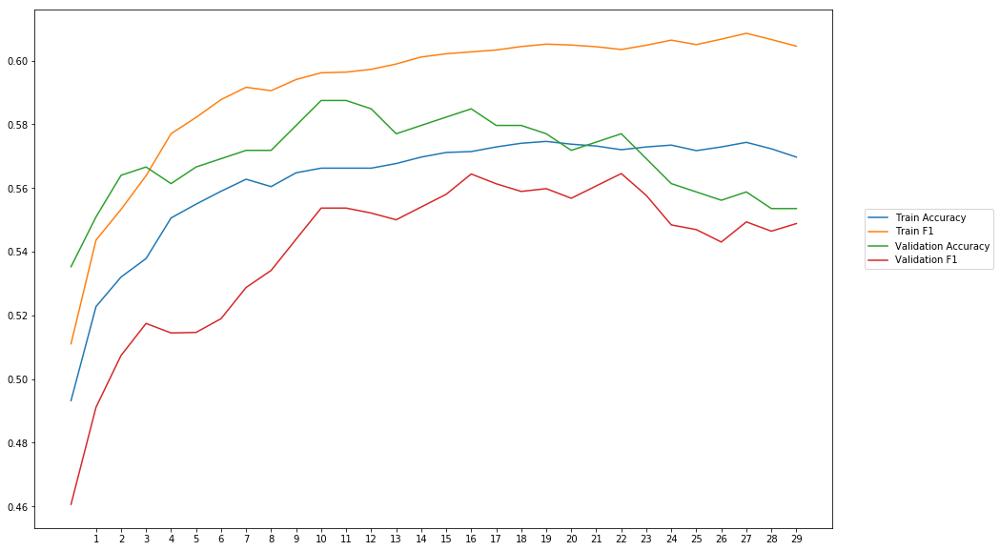

Average Accuracy: 56.97%
Average Precision: 57.81%
Average Recall: 50.92%
Average F1: 54.07%

-----Fold 5--------


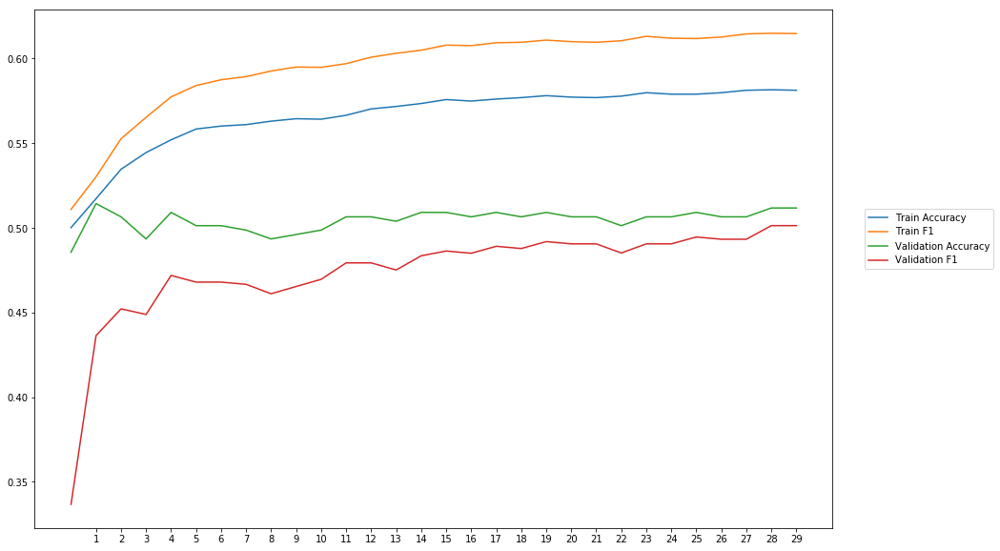

Average Accuracy: 50.46%
Average Precision: 50.33%
Average Recall: 45.06%
Average F1: 47.45%

-----Fold 6--------


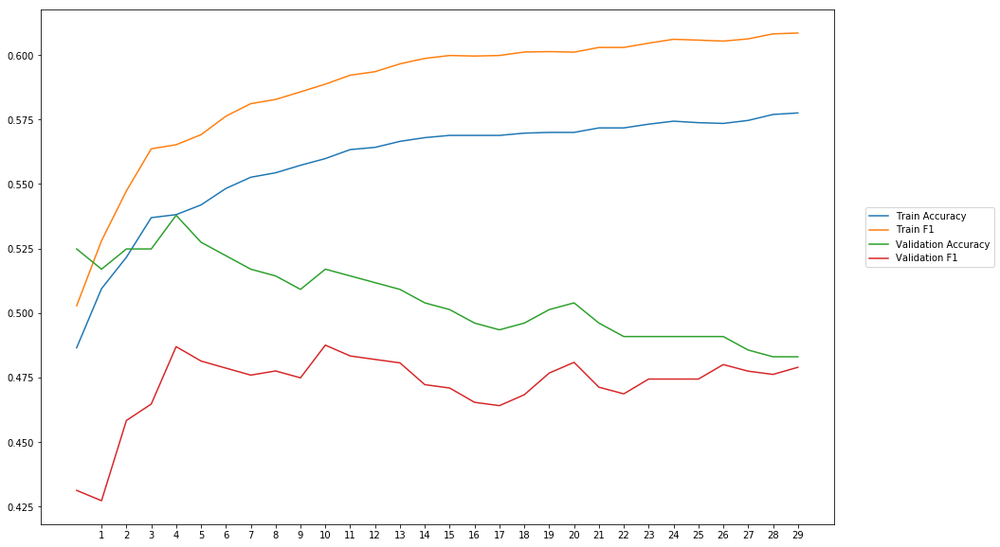

Average Accuracy: 50.57%
Average Precision: 50.62%
Average Recall: 44.40%
Average F1: 47.22%

-----Fold 7--------


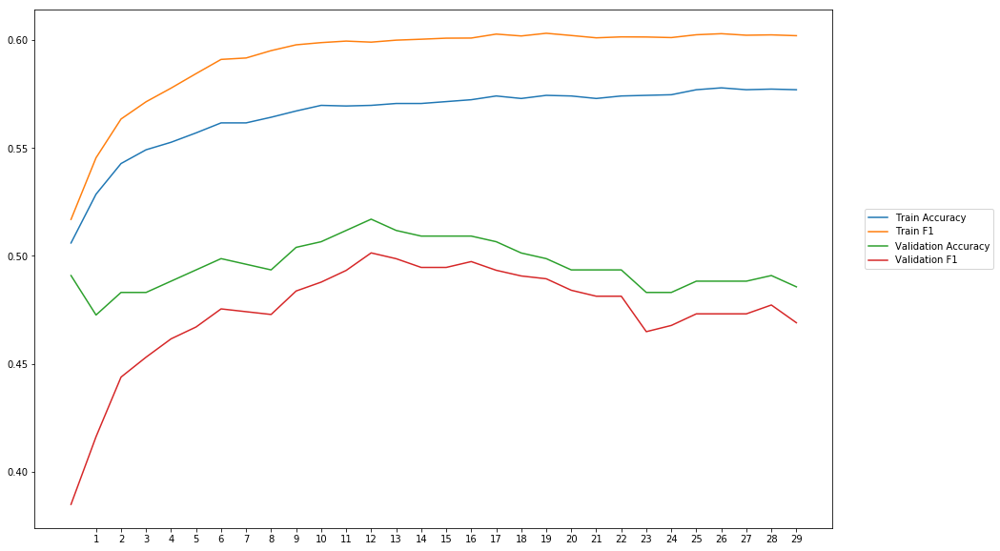

Average Accuracy: 49.57%
Average Precision: 49.36%
Average Recall: 45.67%
Average F1: 47.39%

-----Fold 8--------


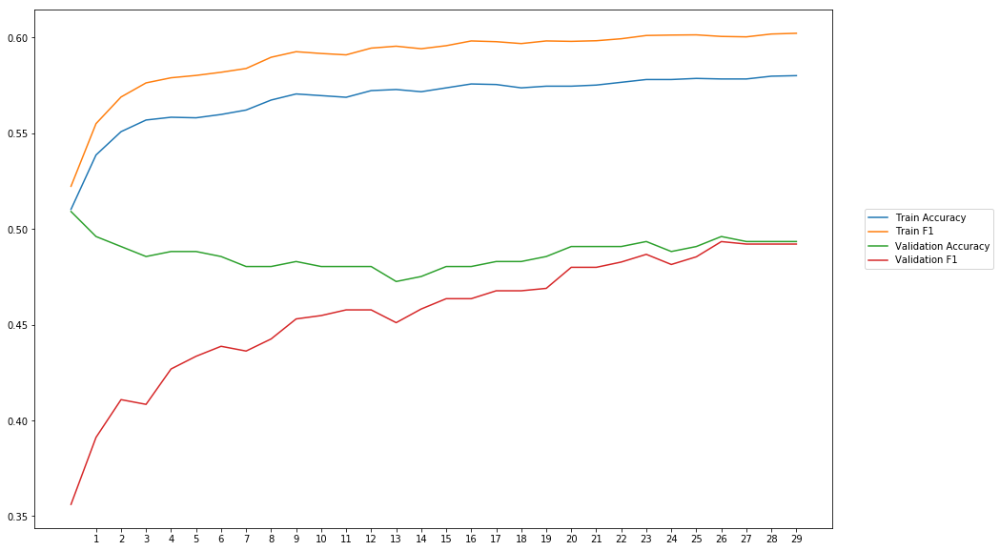

Average Accuracy: 48.70%
Average Precision: 48.43%
Average Recall: 43.40%
Average F1: 45.58%

-----Fold 9--------


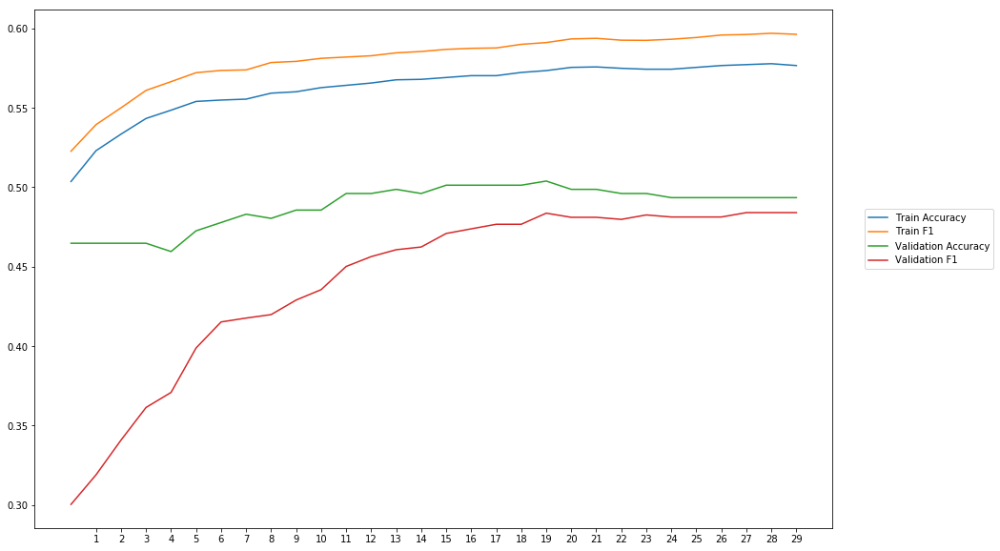

Average Accuracy: 48.83%
Average Precision: 48.19%
Average Recall: 41.08%
Average F1: 44.13%

-----Fold 10--------


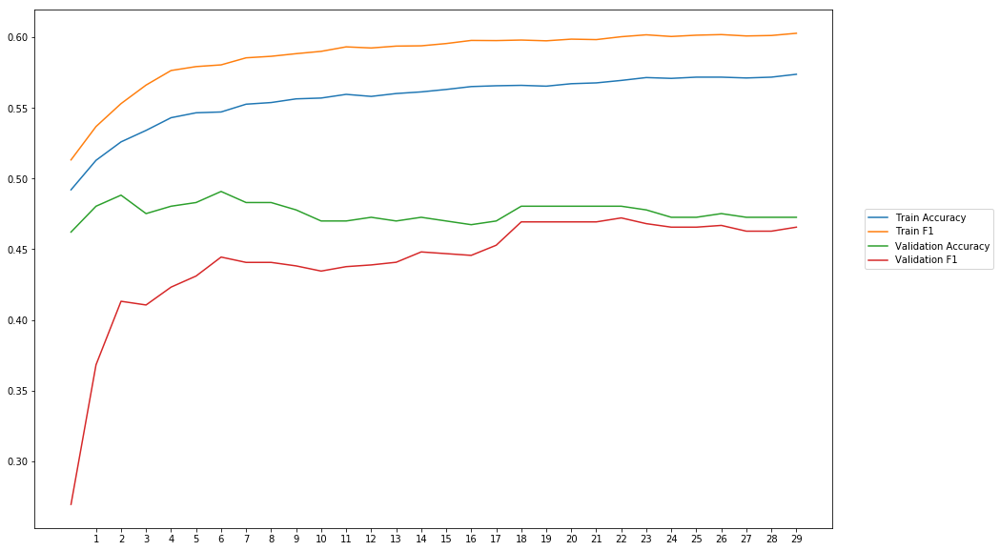

Average Accuracy: 47.62%
Average Precision: 47.07%
Average Recall: 41.82%
Average F1: 44.11%

-------Overallresults-------


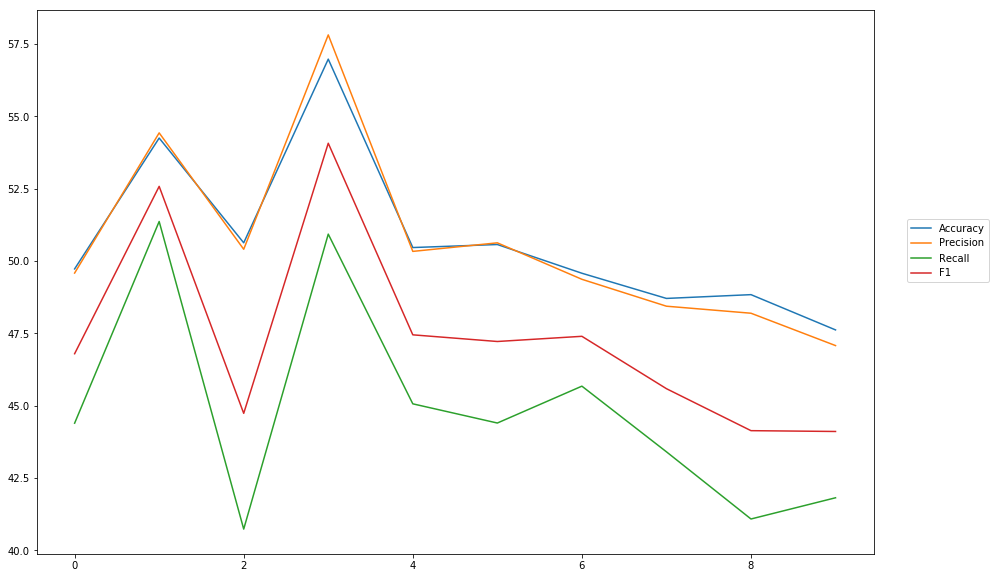

Accuracy: Mean = 50.73% (+/- 2.67%), Max = 56.97%, Min =  47.62%
Precision: Mean = 50.62% (+/- 3.04%), Max = 57.81%, Min =  47.07%
Recall: Mean = 44.88% (+/- 3.51%), Max = 51.36%, Min =  40.73%
F1: Mean = 47.40% (+/- 3.22%), Max = 54.07%, Min =  44.11%


In [58]:
cross_val_three_inputs(model_24, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'l2all1')

# Test the best model with heldout testdata

Instructions for updating:
Use tf.cast instead.


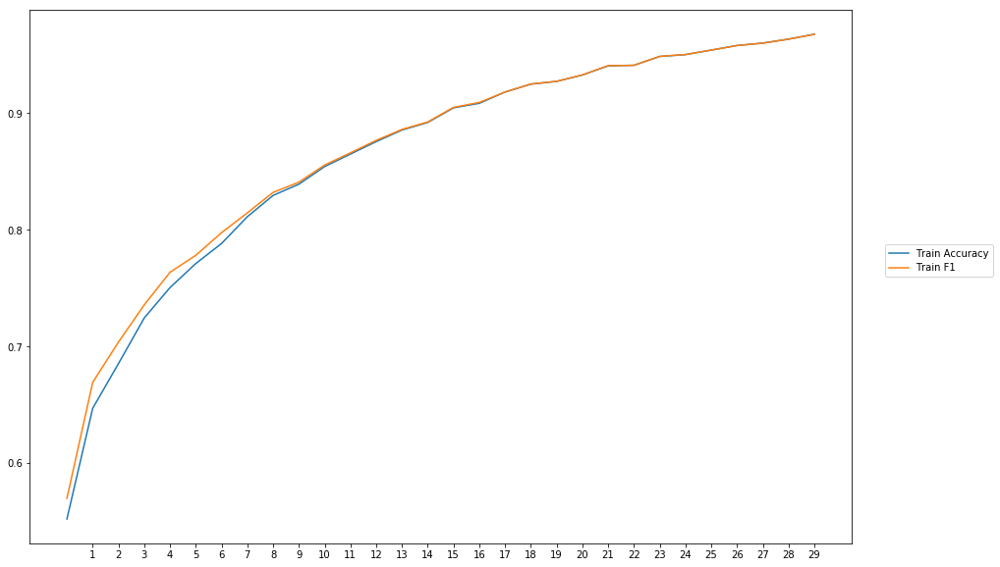


-----Test Scores----
Loss: 0.613359624025773
Accuracy: 69.7704081632653
Precision: 59.68586385872099
Recall: 73.31189708253638
F1: 65.80086083435923


In [11]:
train_evaluate_three_inputs(model_16, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, test_data, test_senti_blob, test_pos, test_labels, softmax, outputpath, 'final_LNorm')